### Installing Libs

In [1]:
# Installing Libs

!pip3 install numpy matplotlib pandas tqdm ipykernel torchsummary scikit-learn
#!pip3 install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121


[notice] A new release of pip available: 22.3.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


### Importing Libs

In [2]:
# Importing Libs

import torch
import pandas as pd
from matplotlib import pyplot as plt
from torch import nn
from torch.nn import functional as F
import numpy as np
from tqdm import tqdm

### Utility Functions

In [3]:
device = "cpu"

def setup_device(to_print:bool=False):
    # Get cpu or gpu device for training.
    global device    
    
    device = "cuda" if torch.cuda.is_available() else "cpu"

    if to_print:
        print("Using {} device".format(device))

### Loading Data

In [4]:
import os

import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, ConcatDataset
from torchvision import datasets

# def fetch_dataset(root:str='data', train_dataset:str='train', val_dataset:str=None, train_transform:transforms=None, val_transform:transforms=None, target_transform=None):
#     assert train_dataset in ['train', 'trainval'] and val_dataset in ['val', None]

#     if train_dataset == 'trainval':
#         train_data = ConcatDataset(
#             [
#                 ImageFolder(root=os.path.join(root,'train'), transform=train_transform, target_transform=target_transform),
#                 ImageFolder(root=os.path.join(root,'val'), transform=train_transform, target_transform=target_transform)
#             ]
#         )
#     else:
#         train_data = ImageFolder(root=os.path.join(root,train_dataset), transform=train_transform, target_transform=target_transform)

#     if val_dataset is None:
#         return train_data
    
#     val_data = ImageFolder(root=os.path.join(root,val_dataset), transform=val_transform, target_transform=target_transform)
#     return train_data, val_data

def fetch_dataset(dataset=datasets.CIFAR10, train_transform=None, test_transform=None, target_transform=None):
    """
    EXAMPLE: datasets.MNIST
    """
    kwargs = [
        dict(   
            train=True
        ),
        dict(
            train=False
        )
    ]
    if dataset == datasets.STL10:
        kwargs = [dict(split='train'), dict(split='test')]
    # download dataset
    train_data = dataset(
        root="data",
        **kwargs[0],
        download=True,
        transform=train_transform,
        target_transform=target_transform
    )

    test_data = dataset(
        root="data",
        **kwargs[1],
        download=True,
        transform=test_transform,
        target_transform=target_transform
    )
    return train_data, test_data

def get_dataloader(train_data, val_data=None, batch_size=256, **kwargs):
    # create dataloaders
    train_loader = DataLoader(train_data, batch_size=batch_size, **kwargs)
    if val_data is None:
        return train_loader
    val_loader = DataLoader(val_data, batch_size=batch_size)
    return train_loader, val_loader

#### Saving

In [5]:
def text_to_file(JOINED_PATH:str, contents, mode:str='w'):
    with open(JOINED_PATH, mode) as f:
        print(contents, file=f)

def save_model(model:nn.Module, PATH:str='models', FILENAME:str=None, extra_info:str=""):
    if FILENAME == None:
        import time
        FILENAME = f'model_{int(time.time())}.h5'

    import os
    if not os.path.exists(PATH):
        os.makedirs(PATH)

    PATH = os.path.join(PATH, FILENAME)
    torch.save(model.state_dict(), PATH)

    text_to_file(PATH+'_details.txt', str(model)+'\n'+extra_info)
    return PATH

def load_model(model:nn.Module, FILE_PATH:str):
    if FILE_PATH is None:
        return
    model.load_state_dict(torch.load(FILE_PATH))

### Model

In [6]:
class Conv(nn.Module):
    def __init__(self, n_channels:int=3, n_classes:int=1000):
        super(Conv, self).__init__()
        self.n_channels = n_channels
        # self.flatten = nn.Flatten()
        self.conv = nn.Sequential(
            nn.Conv2d(n_channels, 64, 7, 2, 2),
            nn.ReLU(),
            nn.Conv2d(64, 256, 3, 2, 1),
            nn.ReLU(),
            nn.Conv2d(256, 1024, 3, 2, 1),
            nn.ReLU(),
        )
        self.gap = nn.AdaptiveAvgPool2d(output_size=1)
        self.flatten = nn.Flatten()
        self.linear = nn.Linear(1024, n_classes)

    def forward(self, x):
        # print(x.shape)
        x = self.conv(x)
        x = self.gap(x)
        x = self.flatten(x)
        # print(x.shape)
        logits = self.linear(x)
        return logits
    
    def __str__(self):
        return f'n_channels: {self.n_channels}\n\n'+super().__str__()
    

In [7]:
class _ResBlock(nn.Module):

    def __init__(self, inchannel, outchannel, stride=1):
        super(_ResBlock, self).__init__()

        self.left = nn.Sequential(
            nn.Conv2d(inchannel,outchannel,kernel_size=3,stride=stride,padding=1,bias=False),
            nn.BatchNorm2d(outchannel),
            nn.ReLU(inplace=True),
            nn.Conv2d(outchannel,outchannel,kernel_size=3,stride=1,padding=1,bias=False),
            nn.BatchNorm2d(outchannel)
        )
        self.shortcut = nn.Sequential()
        if stride != 1 or inchannel != outchannel:
            self.shortcut = nn.Sequential(
                nn.Conv2d(inchannel, outchannel, kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(outchannel)
            )

    def forward(self, x):
        out = self.left(x)
        out = out + self.shortcut(x)
        out = F.relu(out)

        return out
    
class _BigResBlock(nn.Module):

    def __init__(self, inchannel, midchannel, outchannel, stride=1):
        super(_BigResBlock, self).__init__()

        self.left = nn.Sequential(
            nn.BatchNorm2d(inchannel),
            nn.ReLU(inplace=True),
            nn.Conv2d(inchannel,midchannel,kernel_size=1,stride=1,padding=0,bias=False),
            
            nn.BatchNorm2d(midchannel),
            nn.ReLU(inplace=True),
            nn.Conv2d(midchannel,midchannel,kernel_size=3,stride=stride,padding=1,bias=False),
            
            nn.BatchNorm2d(midchannel),
            nn.ReLU(inplace=True),
            nn.Conv2d(midchannel,outchannel,kernel_size=1,stride=1,padding=0,bias=False),
        )
        self.shortcut = nn.Sequential()
        if stride != 1 or inchannel != outchannel:
            self.shortcut = nn.Sequential(
                nn.BatchNorm2d(inchannel),
                nn.ReLU(inplace=True),
                nn.Conv2d(inchannel, outchannel, kernel_size=1, stride=stride, bias=False),
            )

    def forward(self, x):
        out = self.left(x)
        out = out + self.shortcut(x)

        return out
    
class ResNet18(nn.Module):

    def __init__(self, ResBlock=_ResBlock, num_classes=10, depth_multiple:int=2):
        super(ResNet18, self).__init__()

        assert depth_multiple >= 1

        self.inchannel = 64
        self.conv1 = nn.Sequential(
            nn.Conv2d(3, self.inchannel, kernel_size=5, stride=1, padding=2, bias=False),
            nn.BatchNorm2d(self.inchannel),
            nn.ReLU()
        )
        self.lay1 = self.make_lay(ResBlock, 64 *depth_multiple, 2, stride=2)
        self.lay2 = self.make_lay(ResBlock, 128*depth_multiple, 2, stride=2)
        self.lay3 = self.make_lay(ResBlock, 256*depth_multiple, 2, stride=2)
        self.lay4 = self.make_lay(ResBlock, 512*depth_multiple, 2, stride=2)
        self.gap = nn.AdaptiveAvgPool2d(output_size=1)
        self.flat = nn.Flatten()
        self.fc = nn.Linear(512*depth_multiple, num_classes)
        
        
    def make_lay(self, block=_ResBlock, channels=64, num_blocks=2, stride=1):
        strides = [stride] + [1] * (num_blocks-1)
        layers = []
        for stride in strides:
            layers.append(block(self.inchannel, channels, stride))
            self.inchannel = channels
        return nn.Sequential(*layers)

    def forward(self, x):
        out = self.conv1(x)
        out = self.lay1(out)
        out = self.lay2(out)
        out = self.lay3(out)
        out = self.lay4(out)
        out = self.gap(out)
        out = self.flat(out)
        out = self.fc(out)

        return out
    
class ResNet34(nn.Module):

    def __init__(self, ResBlock=_ResBlock, in_channel=3, num_classes=10, first_lay_kernel_size=5, first_lay_stride=1, first_lay_padding=2):
        super(ResNet34, self).__init__()

        self.inchannel = 64
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channel, self.inchannel, kernel_size=first_lay_kernel_size, 
                      stride=first_lay_stride, padding=first_lay_padding, bias=False),
            nn.BatchNorm2d(self.inchannel),
            nn.ReLU()
        )
        self.lay1 = self.make_lay(ResBlock, 64, 3, stride=2)
        self.lay2 = self.make_lay(ResBlock, 128, 4, stride=2)
        self.lay3 = self.make_lay(ResBlock, 256, 6, stride=2)
        self.lay4 = self.make_lay(ResBlock, 512, 3, stride=2)
        self.gap = nn.AdaptiveAvgPool2d(output_size=1)
        self.flat = nn.Flatten()
        self.fc = nn.Linear(512, num_classes)
        
        
    def make_lay(self, block=_ResBlock, channels=64, num_blocks=2, stride=1):
        strides = [stride] + [1] * (num_blocks-1)
        layers = []
        for stride in strides:
            layers.append(block(self.inchannel, channels, stride))
            self.inchannel = channels
        return nn.Sequential(*layers)

    def forward(self, x):
        out = self.conv1(x)
        out = self.lay1(out)
        out = self.lay2(out)
        out = self.lay3(out)
        out = self.lay4(out)
        out = self.gap(out)
        out = self.flat(out)
        out = self.fc(out)

        return out
    
    
class ResNet50(nn.Module):

    def __init__(self, ResBlock=_BigResBlock, num_classes=1000):
        super(ResNet50, self).__init__()

        self.inchannel = 64
        self.conv1 = nn.Sequential(
            nn.Conv2d(3, self.inchannel, kernel_size=5, stride=1, padding=2, bias=False),
            nn.BatchNorm2d(self.inchannel),
            nn.ReLU()
        )
        self.lay1 = self.make_lay(ResBlock, 64, 3, stride=2)
        self.lay2 = self.make_lay(ResBlock, 128, 4, stride=2)
        self.lay3 = self.make_lay(ResBlock, 256, 23, stride=2)
        self.lay4 = self.make_lay(ResBlock, 512, 3, stride=2)
        self.gap = nn.AdaptiveAvgPool2d(output_size=1)
        self.flat = nn.Flatten()
        self.fc = nn.Linear(self.inchannel, num_classes)
        
        
    def make_lay(self, block=_BigResBlock, channels=64, num_blocks=2, stride=1):
        strides = [stride] + [1] * (num_blocks-1)
        layers = []
        for stride in strides:
            layers.append(block(self.inchannel, channels, channels*4, stride))
            self.inchannel = channels*4
        return nn.Sequential(*layers)

    def forward(self, x):
        out = self.conv1(x)
        out = self.lay1(out)
        out = self.lay2(out)
        out = self.lay3(out)
        out = self.lay4(out)
        out = self.gap(out)
        out = self.flat(out)
        out = self.fc(out)

        return out

In [8]:
import torch
from torch import nn

from einops import rearrange
from einops.layers.torch import Rearrange

# helpers

def pair(t):
    return t if isinstance(t, tuple) else (t, t)

def posemb_sincos_2d(h, w, dim, temperature: int = 10000, dtype = torch.float32):
    y, x = torch.meshgrid(torch.arange(h), torch.arange(w), indexing="ij")
    assert (dim % 4) == 0, "feature dimension must be multiple of 4 for sincos emb"
    omega = torch.arange(dim // 4) / (dim // 4 - 1)
    omega = 1.0 / (temperature ** omega)

    y = y.flatten()[:, None] * omega[None, :]
    x = x.flatten()[:, None] * omega[None, :]
    pe = torch.cat((x.sin(), x.cos(), y.sin(), y.cos()), dim=1)
    return pe.type(dtype)

# classes

class FeedForward(nn.Module):
    def __init__(self, dim, hidden_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.LayerNorm(dim),
            nn.Linear(dim, hidden_dim),
            nn.GELU(),
            nn.Linear(hidden_dim, dim),
        )
    def forward(self, x):
        return self.net(x)

class Attention(nn.Module):
    def __init__(self, dim, heads = 8, dim_head = 64):
        super().__init__()
        inner_dim = dim_head *  heads
        self.heads = heads
        self.scale = dim_head ** -0.5
        self.norm = nn.LayerNorm(dim)

        self.attend = nn.Softmax(dim = -1)

        self.to_qkv = nn.Linear(dim, inner_dim * 3, bias = False)
        self.to_out = nn.Linear(inner_dim, dim, bias = False)

    def forward(self, x):
        x = self.norm(x)

        qkv = self.to_qkv(x).chunk(3, dim = -1)
        q, k, v = map(lambda t: rearrange(t, 'b n (h d) -> b h n d', h = self.heads), qkv)

        dots = torch.matmul(q, k.transpose(-1, -2)) * self.scale

        attn = self.attend(dots)

        out = torch.matmul(attn, v)
        out = rearrange(out, 'b h n d -> b n (h d)')
        return self.to_out(out)

class Transformer(nn.Module):
    def __init__(self, dim, depth, heads, dim_head, mlp_dim):
        super().__init__()
        self.norm = nn.LayerNorm(dim)
        self.layers = nn.ModuleList([])
        for _ in range(depth):
            self.layers.append(nn.ModuleList([
                Attention(dim, heads = heads, dim_head = dim_head),
                FeedForward(dim, mlp_dim)
            ]))
    def forward(self, x):
        for attn, ff in self.layers:
            x = attn(x) + x
            x = ff(x) + x
        return self.norm(x)

class SimpleViT(nn.Module):
    def __init__(self, *, image_size, patch_size, num_classes, dim, depth, heads, mlp_dim, channels = 3, dim_head = 64):
        super().__init__()
        image_height, image_width = pair(image_size)
        patch_height, patch_width = pair(patch_size)

        assert image_height % patch_height == 0 and image_width % patch_width == 0, 'Image dimensions must be divisible by the patch size.'

        patch_dim = channels * patch_height * patch_width

        self.to_patch_embedding = nn.Sequential(
            Rearrange("b c (h p1) (w p2) -> b (h w) (p1 p2 c)", p1 = patch_height, p2 = patch_width),
            nn.LayerNorm(patch_dim),
            nn.Linear(patch_dim, dim),
            nn.LayerNorm(dim),
        )

        self.pos_embedding = posemb_sincos_2d(
            h = image_height // patch_height,
            w = image_width // patch_width,
            dim = dim,
        ) 

        self.transformer = Transformer(dim, depth, heads, dim_head, mlp_dim)

        self.pool = "mean"
        self.to_latent = nn.Identity()

        self.linear_head = nn.Linear(dim, num_classes)

    def forward(self, img):
        device = img.device

        x = self.to_patch_embedding(img)
        x += self.pos_embedding.to(device, dtype=x.dtype)

        x = self.transformer(x)
        x = x.mean(dim = 1)

        x = self.to_latent(x)
        return self.linear_head(x)

c:\kht\ai\AI Projects (Local)\proj vision transformer\venv\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Training

In [9]:
def set_optimizers(model:nn.Module, loss_fn=nn.CrossEntropyLoss, optimizer=torch.optim.SGD, lr=1e-1, decay=None, **kwargs):
    # Loss function
    loss_fn = loss_fn()

    # SGD Optimizer
    optimizer = optimizer(model.parameters(), lr=lr)
    scheduler = decay(optimizer, **kwargs) if decay != None else None
    return loss_fn, optimizer, scheduler

# Train function
def train(dataloader:DataLoader, model:nn.Module, loss_fn, optimizer, scheduler=None, show:bool=True):
    size = len(dataloader.dataset)
    
    # Turn on training mode
    model.to(device)
    model.train()
    train_loss, correct = 0, 0
    dtlr = tqdm(dataloader) if show else dataloader
    for X, y in dtlr:
        X, y = X.to(device), y.to(device)

        # Compute prediction error
        
        # print(X.shape, y.shape)
        pred = model(X)
        loss = loss_fn(pred, y)

        # Backpropagation
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        # record loss
        train_loss += loss.item()
        correct += (pred.argmax(1) == y.argmax(1)).type(torch.float).sum().item()
    
    train_loss /= len(dataloader)
    correct /= size
    lr = optimizer.param_groups[0]['lr']
    if scheduler != None:
        scheduler.step(train_loss) if isinstance(scheduler, torch.optim.lr_scheduler.ReduceLROnPlateau) else scheduler.step()
    
    if show:
        print(f" Train accuracy: {(100*correct):>0.1f}%, Avg loss: {train_loss:>8f}, lr: {lr}")
    return train_loss, correct, lr

# Test function
def test(dataloader:DataLoader, model:nn.Module, loss_fn, show:bool=True):
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    
    # Turn on evalution mode
    model.eval()
    test_loss, correct = 0, 0
    
    # Turn off gradient descent
    with torch.no_grad():
        dtlr = tqdm(dataloader) if show else dataloader
        for X, y in dtlr:
            X, y = X.to(device), y.to(device)
            # try:
            pred = model(X)
            # except Exception:
            #     print(X.shape, y.shape)
            
            # record loss
            test_loss += loss_fn(pred, y).item()
            correct += (pred.argmax(1) == y.argmax(1)).type(torch.float).sum().item()
            
    test_loss /= num_batches
    correct /= size
    
    if show:
        print(f" Test accuracy: {(100*correct):>0.1f}%, Avg loss: {test_loss:>8f}")
    return test_loss, correct

In [10]:
def ToGPU(samp):
    return samp.to(device)

In [11]:
def GaussianNoise(samp):
    return samp + .02*torch.randn_like(samp, device=device) #.01

### Main Function

In [12]:
from torchvision import datasets
N_CLASSES = 10#100
IMG_SIZE = (32,32)#(64,64)
PATCH_SIZE = (8,8)#(16,16)

In [13]:
debug = False

setup_device(to_print=True)

configs = dict(interpolation=transforms.InterpolationMode.NEAREST)
train_transform = transforms.Compose(
    [
        transforms.ToTensor(),
        ToGPU,
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomRotation(degrees=35, **configs),
        transforms.RandomResizedCrop(IMG_SIZE, scale=(.6,1), antialias=True, **configs),
        transforms.ColorJitter(brightness=.5, contrast=.5, saturation=.5, hue=.5), # 4
        transforms.RandomPerspective(distortion_scale=0.4, **configs), ## 201+
        GaussianNoise, ## NEW
    ]
)
val_transform = transforms.Compose(
    [
        transforms.ToTensor(),
        ToGPU,
        transforms.Resize(IMG_SIZE, **configs)
    ]
)
target_transform = lambda label: F.one_hot(torch.LongTensor(np.array([label])),num_classes=N_CLASSES).flatten().float()

dataset = datasets.CIFAR10
#dataset = datasets.STL10
train_data, val_data = fetch_dataset(dataset, train_transform=train_transform, test_transform=val_transform, target_transform=target_transform)
# train_data, val_data = fetch_dataset(
#     root='data',
#     train_dataset='train', val_dataset='val', 
#     train_transform=train_transform, 
#     val_transform=transforms.ToTensor(),
#     target_transform=target_transform
# )

Using cuda device
Files already downloaded and verified
Files already downloaded and verified


classes: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
train size: 50000, val size: 10000


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


input size: torch.Size([128, 3, 32, 32]), label size: torch.Size([128, 10])


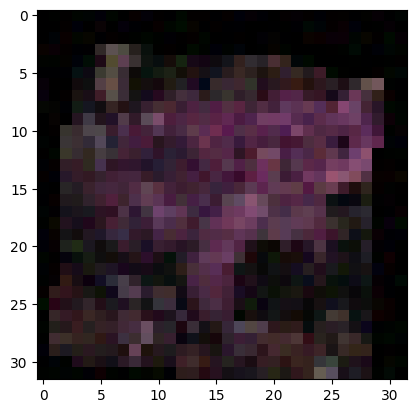

label: 6
input size: torch.Size([128, 3, 32, 32]), label size: torch.Size([128, 10])


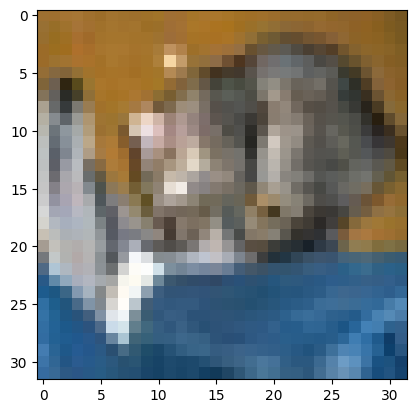

label: 3


In [14]:
train_loader, val_loader = get_dataloader(train_data, val_data, batch_size=128, shuffle=True) #1,2,4
#train_loader, val_loader = get_dataloader(train_data, val_data, batch_size=128, shuffle=True) #1,2,4
#train_loader, val_loader = get_dataloader(train_data, val_data, batch_size=64) #3

debug = True
if debug:
    print(f'classes: {train_data.classes}')
    print(f'train size: {len(train_loader.dataset)}, val size: {len(val_loader.dataset)}')

    data = next(iter(train_loader))
    print(f'input size: {data[0].shape}, label size: {data[1].shape}')
    plt.imshow(np.transpose(data[0][0].cpu(), (1,2,0)))
    plt.show()
    print(f'label: {torch.argmax(data[1][0])}')

    data = next(iter(val_loader))
    print(f'input size: {data[0].shape}, label size: {data[1].shape}')
    plt.imshow(np.transpose(data[0][0].cpu(), (1,2,0)))
    plt.show()
    print(f'label: {torch.argmax(data[1][0])}')

In [15]:
from torchsummary import summary

#model = Conv(n_channels=3, n_classes=1000) #1
#model = ResNet18(num_classes=10, depth_multiple=2) #2, 4
model = ResNet34(num_classes=N_CLASSES) #3
#model = ResNet50(num_classes=10) # Kaggle
#model = ResNet18pFC(num_classes=1000)
# model = SimpleViT(image_size=IMG_SIZE, patch_size=PATCH_SIZE, num_classes=N_CLASSES, dim=500, depth=16, heads=8, mlp_dim=500, channels = 3, dim_head = 64)
model = model.to(device) 
SUB_DIR = os.path.join('classification',f'{dataset.__name__}_{model.__class__.__name__}')

if debug:
    summary(model, next(iter(train_loader))[0].shape[1:])

    data = next(iter(train_loader))
    print(f'input size: {data[0].shape}, label size: {data[1].shape}')
    outp = model(data[0].to(device))
    print(f'label: {torch.argmax(data[1][0])}, pred: {torch.argmax(outp[0])}')

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           4,800
       BatchNorm2d-2           [-1, 64, 32, 32]             128
              ReLU-3           [-1, 64, 32, 32]               0
            Conv2d-4           [-1, 64, 16, 16]          36,864
       BatchNorm2d-5           [-1, 64, 16, 16]             128
              ReLU-6           [-1, 64, 16, 16]               0
            Conv2d-7           [-1, 64, 16, 16]          36,864
       BatchNorm2d-8           [-1, 64, 16, 16]             128
            Conv2d-9           [-1, 64, 16, 16]           4,096
      BatchNorm2d-10           [-1, 64, 16, 16]             128
        _ResBlock-11           [-1, 64, 16, 16]               0
           Conv2d-12           [-1, 64, 16, 16]          36,864
      BatchNorm2d-13           [-1, 64, 16, 16]             128
             ReLU-14           [-1, 64,

In [16]:
#INITIAL_LR = 1e-3 #First training
INITIAL_LR = 8e-5 #ViT
#INITIAL_LR = 8e-05 #Start from saved point
#INITIAL_LR = 1e-4
#INITIAL_LR = 1e-5

In [17]:
#LOAD_PATH = '/models/resnet_50/1/model_1708420238.h5'
#LOAD_PATH = os.path.join('models','resnet_50','4','model_1708447042.h5')
#LOAD_PATH = os.path.join('models','resnet_18_good','model_1706970580.h5')
#LOAD_PATH = os.path.join('models','SimpleViT_1708653384','60','model_1708670107.h5')
LOAD_PATH = None
load_model(model, LOAD_PATH)

In [18]:
#GAMMA = .95
#GAMMA = .9
GAMMA = .999

In [19]:
# DECAY = torch.optim.lr_scheduler.ExponentialLR
# kwargs =  dict(gamma=GAMMA)
DECAY = torch.optim.lr_scheduler.ReduceLROnPlateau
kwargs =  dict(threshold_mode='rel')

In [20]:
#loss_fn, opt, scheduler = set_optimizers(model, nn.CrossEntropyLoss, torch.optim.Adam, lr=5e-3, decay=torch.optim.lr_scheduler.ExponentialLR, gamma=.97) #1
#loss_fn, opt, scheduler = set_optimizers(model, nn.CrossEntropyLoss, torch.optim.Adam, lr=1e-2, decay=torch.optim.lr_scheduler.ExponentialLR, gamma=.97) # 2,3,4
loss_fn, opt, scheduler = set_optimizers(model, nn.CrossEntropyLoss, torch.optim.Adam, lr=INITIAL_LR, decay=DECAY, **kwargs) # 4.1

In [21]:
import time
TRAIN_ID = int(time.time())

In [22]:
epoch = 0 # starting epoch
#epoch = 100
#epoch = 70

## Some Other Utility Functioins

In [23]:
training_losses = []
validation_losses = []
training_accuracy = []
validation_accuracy = []
lrs = []

In [24]:
def train_(epochs:int=100, show:bool=True, show2:bool=False):
    global epoch, training_losses, validation_losses, training_accuracy, validation_accuracy, lrs
    rng = range(epochs)
    rng = tqdm(rng) if show2 else rng
    for t in rng:
        if show:
            print('\n', "=" * 15, "Epoch", epoch + 1, "=" * 15)
        shw = show or t == epochs-1
        loss, train_accuracy, lr = train(train_loader, model, loss_fn, opt, scheduler=scheduler, show=shw)
        val_loss, val_accuracy = test(val_loader, model, loss_fn, show=shw)
        training_losses.append(loss)
        validation_losses.append(val_loss)
        training_accuracy.append(train_accuracy)
        validation_accuracy.append(val_accuracy)
        lrs.append(lr)
        epoch += 1

In [25]:
def plot(PTH):
    plt.plot(training_accuracy, label=f'Train Accuracy\nBest: {max(training_accuracy)}')
    plt.plot(validation_accuracy, label=f'Test Accuracy\nBest: {max(validation_accuracy)}')
    plt.legend(loc='best')
    plt.savefig(f'{PTH}_accs.png')
    plt.show()

    plt.plot(np.log10(lrs), label=f'Lrs\nFinal: {lrs[-1]}')
    plt.ylabel('log lr (base 10)')
    plt.legend(loc='best')
    plt.savefig(f'{PTH}_lrs.png')
    plt.show()

In [26]:
def save(TRAIN_ID):
    extra_info = f" Train accuracy: {(100*training_accuracy[-1]):>0.1f}%, Avg loss: {training_losses[-1]:>8f}, lr: {lrs[-1]}"
    if validation_accuracy is not None:
        extra_info += f"\n Test accuracy: {(100*validation_accuracy[-1]):>0.1f}%"
        if validation_losses is not None: 
            extra_info += f", Avg loss: {validation_losses[-1]:>8f}"
    return save_model(model=model, PATH=os.path.join('models',SUB_DIR, f'{str(model.__class__.__qualname__)}_{str(TRAIN_ID)}'), extra_info=extra_info)

## The Training

In [27]:
NUM_EPOCHS = 2000
NUM_EPOCHS_TO_SAVE = 10#50
SHOW = False
SHOW2 = True

In [28]:
print(device)

cuda


100%|██████████| 391/391 [01:48<00:00,  3.59it/s]


 Train accuracy: 54.7%, Avg loss: 1.290080, lr: 8e-05


100%|██████████| 10/10 [18:26<00:00, 110.60s/it]


 Test accuracy: 64.8%, Avg loss: 1.003096


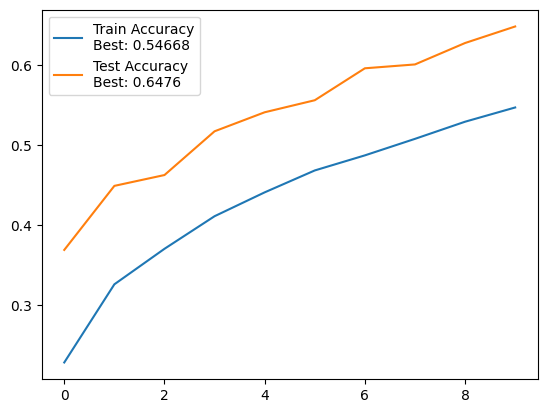

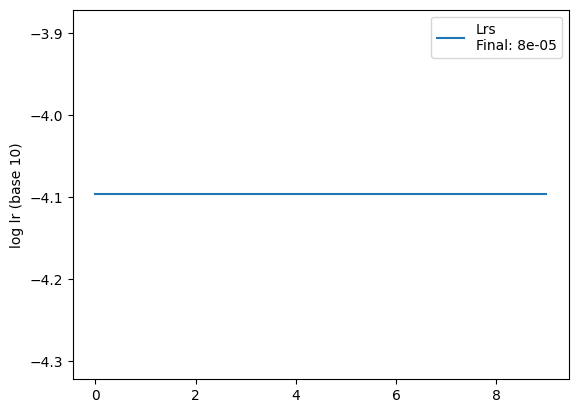

100%|██████████| 391/391 [01:48<00:00,  3.61it/s]


 Train accuracy: 64.3%, Avg loss: 1.027676, lr: 8e-05


100%|██████████| 10/10 [18:15<00:00, 109.59s/it]


 Test accuracy: 73.7%, Avg loss: 0.759308


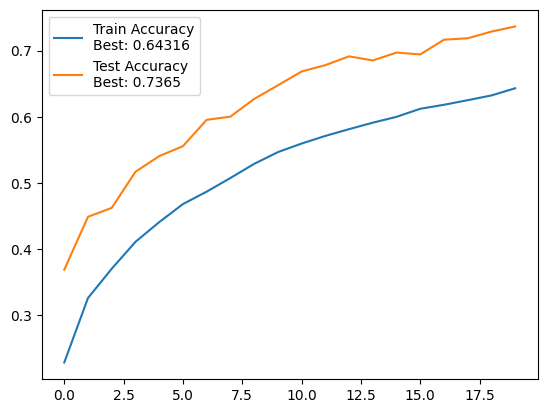

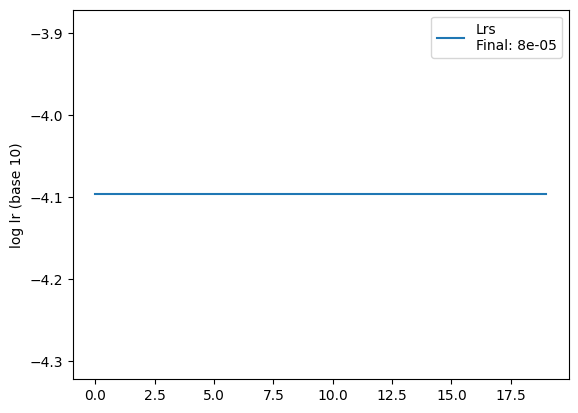

100%|██████████| 391/391 [01:48<00:00,  3.62it/s]


 Train accuracy: 69.0%, Avg loss: 0.886849, lr: 8e-05


100%|██████████| 10/10 [18:19<00:00, 109.94s/it]


 Test accuracy: 78.3%, Avg loss: 0.627480


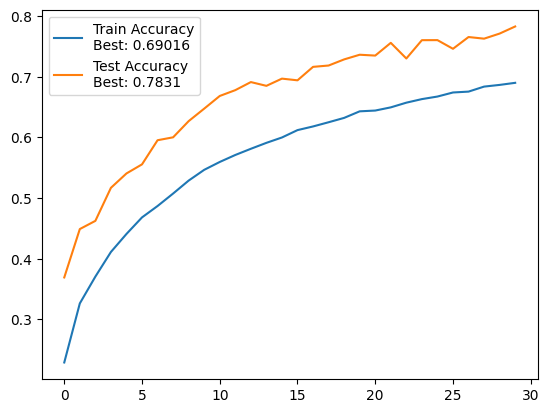

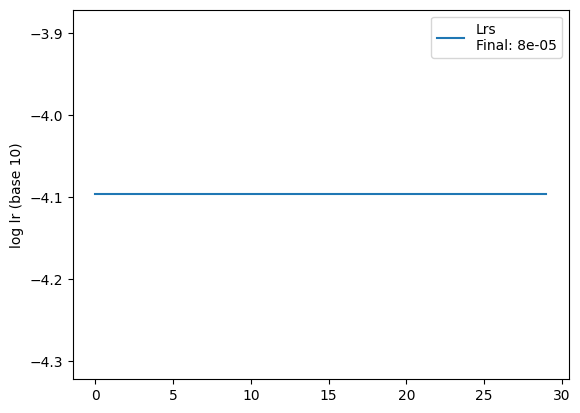

100%|██████████| 391/391 [01:48<00:00,  3.61it/s]


 Train accuracy: 72.4%, Avg loss: 0.791498, lr: 8e-05


100%|██████████| 10/10 [18:13<00:00, 109.39s/it]


 Test accuracy: 79.4%, Avg loss: 0.607751


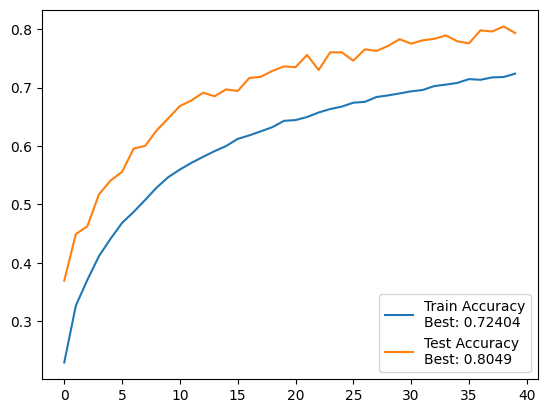

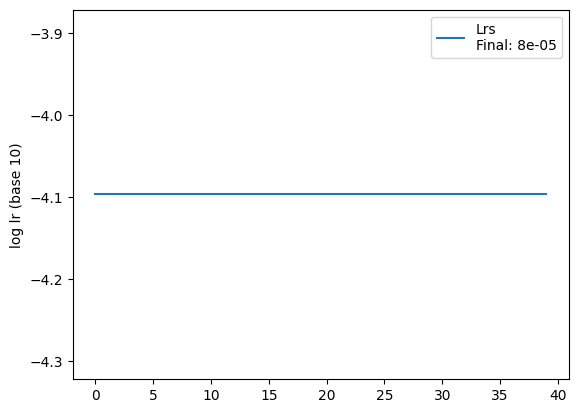

100%|██████████| 391/391 [01:48<00:00,  3.61it/s]


 Train accuracy: 75.1%, Avg loss: 0.709963, lr: 8e-05


100%|██████████| 10/10 [18:14<00:00, 109.46s/it]


 Test accuracy: 81.5%, Avg loss: 0.540295


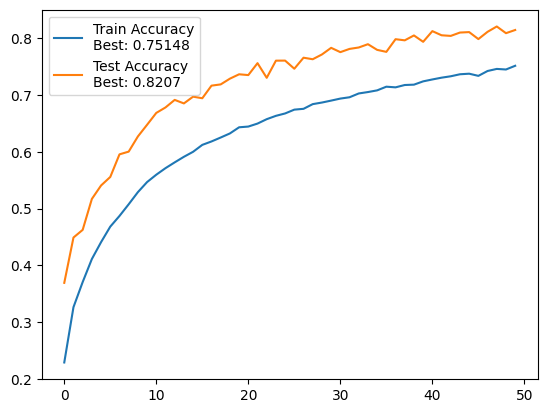

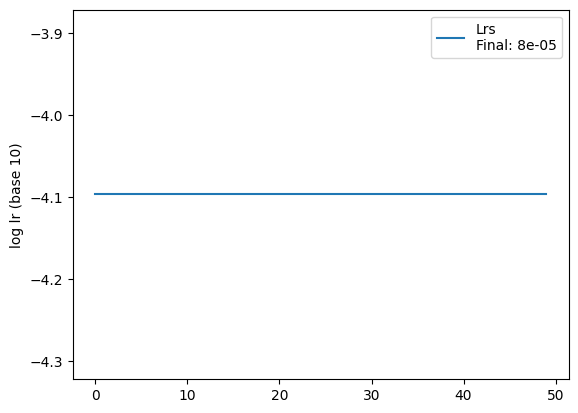

100%|██████████| 391/391 [01:48<00:00,  3.61it/s]


 Train accuracy: 77.0%, Avg loss: 0.657200, lr: 8e-05


100%|██████████| 10/10 [18:17<00:00, 109.77s/it]


 Test accuracy: 82.5%, Avg loss: 0.513294


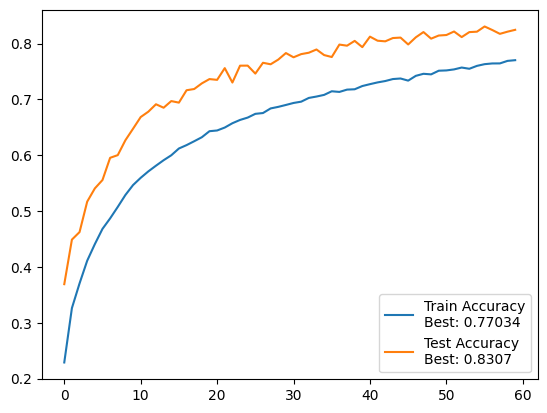

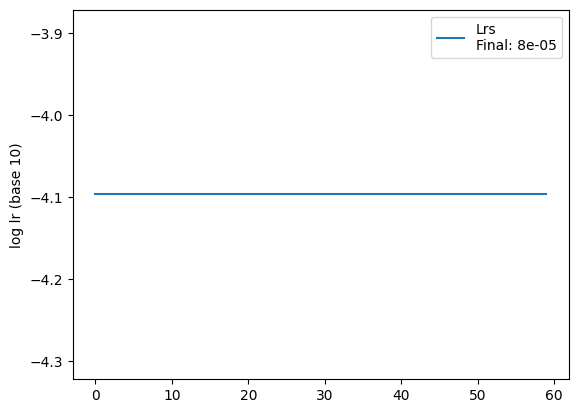

100%|██████████| 391/391 [01:50<00:00,  3.55it/s]


 Train accuracy: 78.7%, Avg loss: 0.609291, lr: 8e-05


100%|██████████| 10/10 [18:18<00:00, 109.87s/it]


 Test accuracy: 83.9%, Avg loss: 0.479453


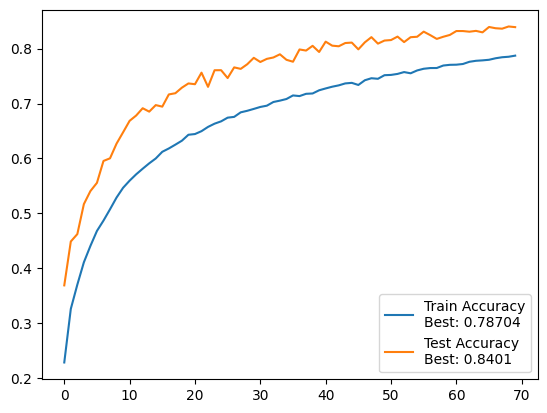

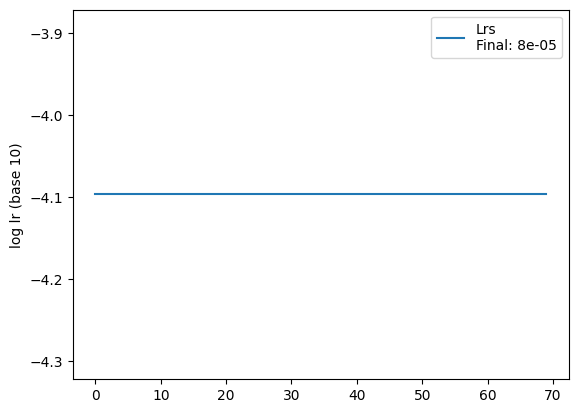

100%|██████████| 391/391 [01:49<00:00,  3.56it/s]


 Train accuracy: 80.1%, Avg loss: 0.566702, lr: 8e-05


100%|██████████| 10/10 [18:32<00:00, 111.24s/it]


 Test accuracy: 83.9%, Avg loss: 0.482546


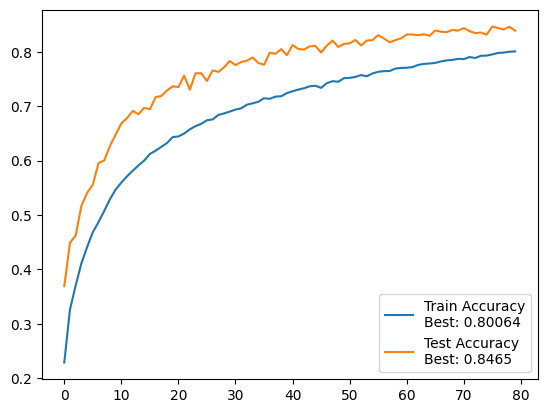

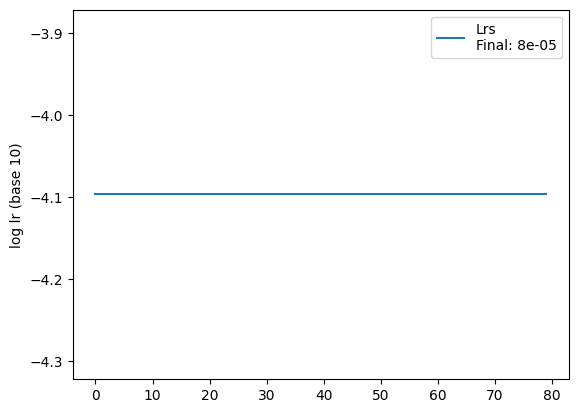

100%|██████████| 391/391 [01:48<00:00,  3.62it/s]


 Train accuracy: 81.5%, Avg loss: 0.532850, lr: 8e-05


100%|██████████| 10/10 [18:13<00:00, 109.39s/it]


 Test accuracy: 84.4%, Avg loss: 0.471417


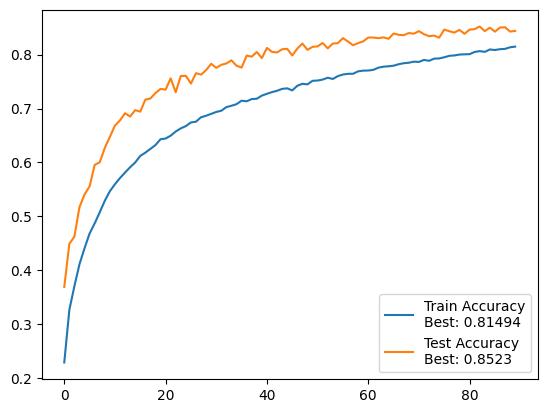

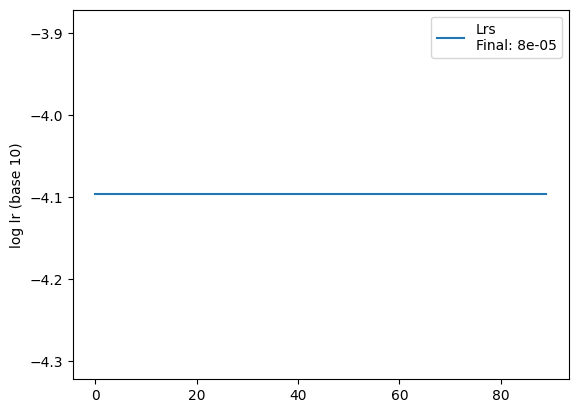

100%|██████████| 391/391 [01:49<00:00,  3.59it/s]


 Train accuracy: 82.7%, Avg loss: 0.498187, lr: 8e-05


100%|██████████| 10/10 [18:20<00:00, 110.08s/it]


 Test accuracy: 85.3%, Avg loss: 0.444964


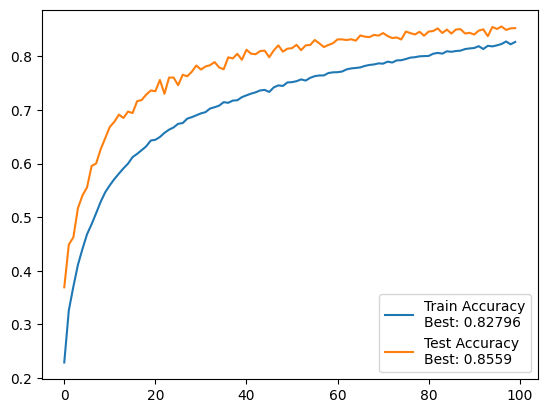

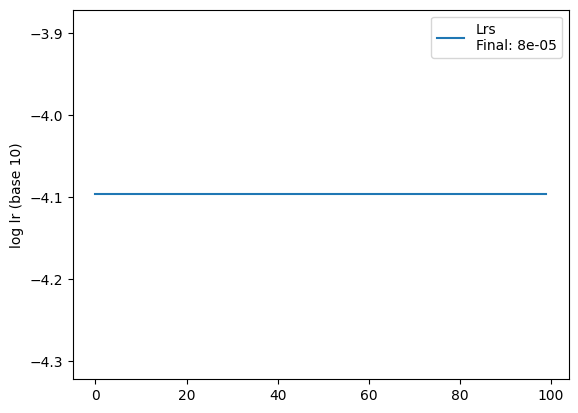

100%|██████████| 391/391 [01:49<00:00,  3.58it/s]


 Train accuracy: 83.3%, Avg loss: 0.474884, lr: 8e-05


100%|██████████| 10/10 [18:21<00:00, 110.12s/it]


 Test accuracy: 85.7%, Avg loss: 0.436023


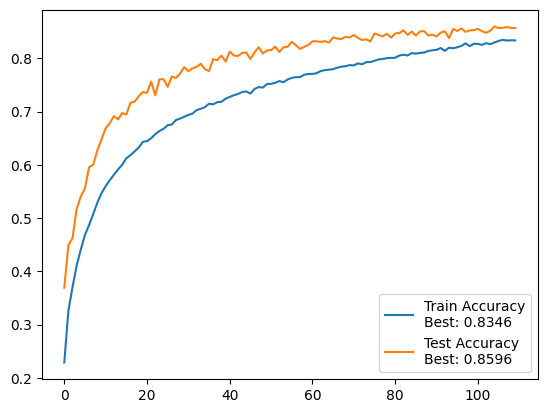

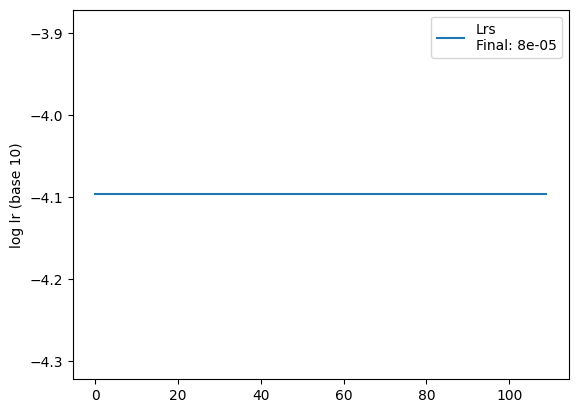

100%|██████████| 391/391 [01:48<00:00,  3.61it/s]


 Train accuracy: 84.6%, Avg loss: 0.441713, lr: 8e-05


100%|██████████| 10/10 [18:15<00:00, 109.54s/it]


 Test accuracy: 85.8%, Avg loss: 0.443381


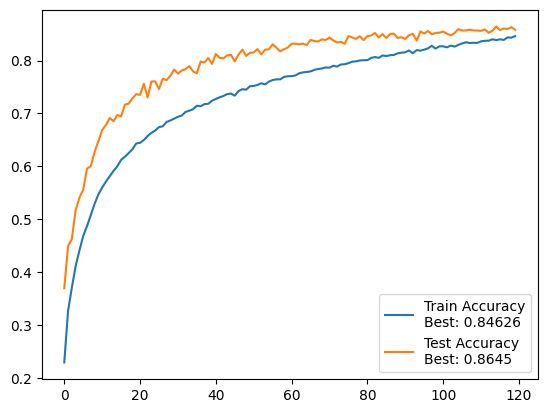

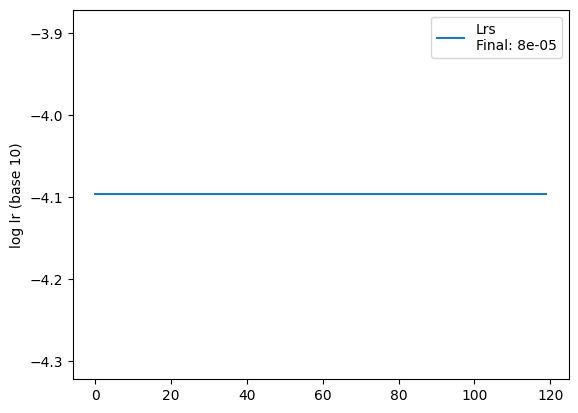

100%|██████████| 391/391 [01:48<00:00,  3.60it/s]


 Train accuracy: 85.4%, Avg loss: 0.416201, lr: 8e-05


100%|██████████| 10/10 [18:17<00:00, 109.73s/it]


 Test accuracy: 86.6%, Avg loss: 0.429415


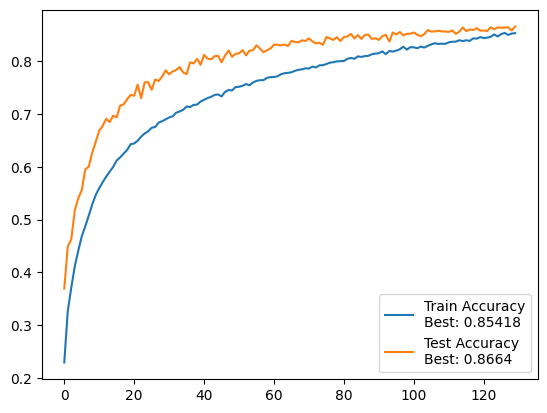

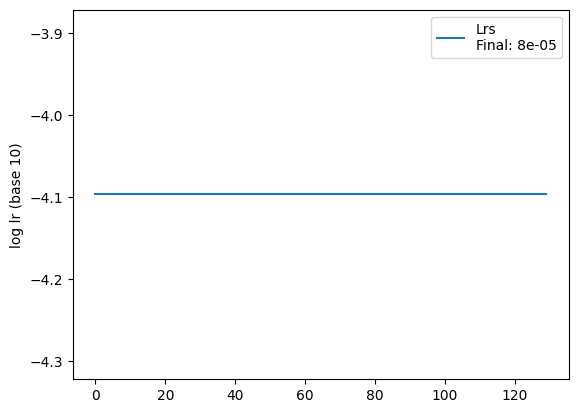

100%|██████████| 391/391 [01:48<00:00,  3.61it/s]


 Train accuracy: 86.1%, Avg loss: 0.396555, lr: 8e-05


100%|██████████| 10/10 [18:20<00:00, 110.01s/it]


 Test accuracy: 86.7%, Avg loss: 0.432073


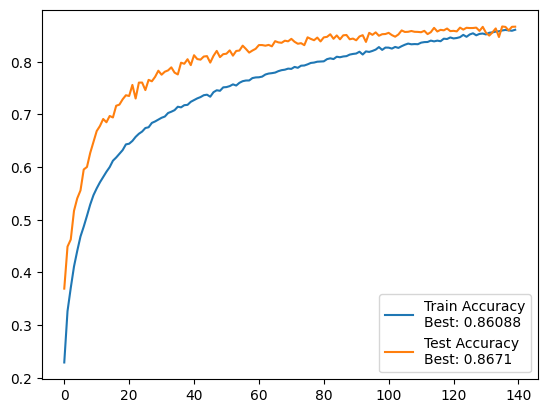

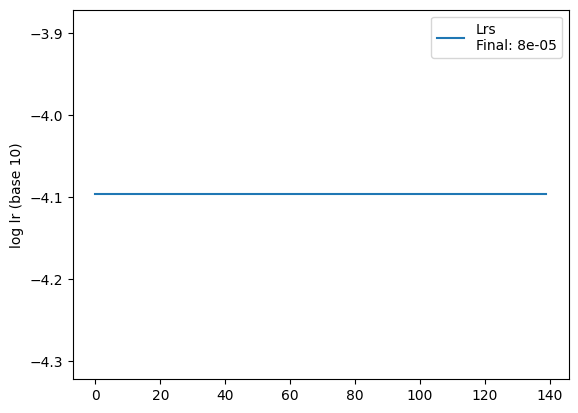

100%|██████████| 391/391 [01:48<00:00,  3.60it/s]


 Train accuracy: 86.9%, Avg loss: 0.373098, lr: 8e-05


100%|██████████| 10/10 [18:17<00:00, 109.74s/it]


 Test accuracy: 85.9%, Avg loss: 0.459986


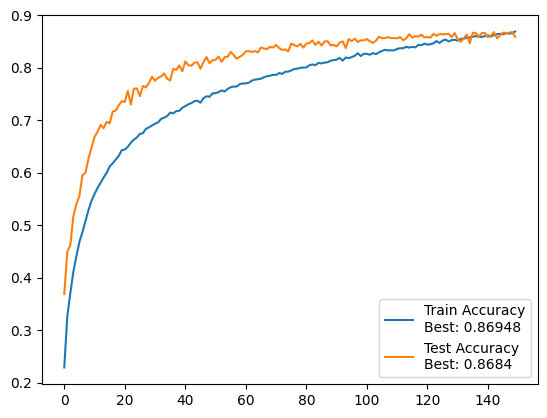

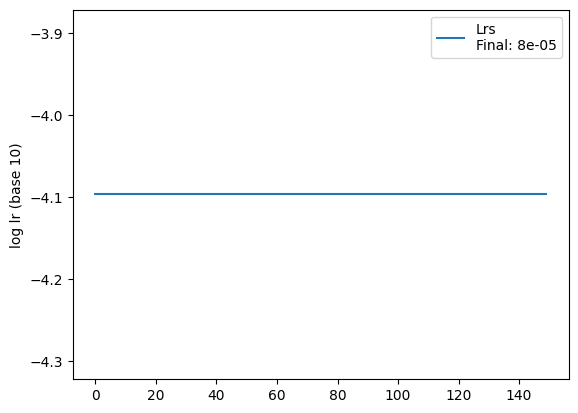

100%|██████████| 391/391 [01:48<00:00,  3.61it/s]


 Train accuracy: 87.5%, Avg loss: 0.357606, lr: 8e-05


100%|██████████| 10/10 [18:17<00:00, 109.72s/it]


 Test accuracy: 87.3%, Avg loss: 0.426700


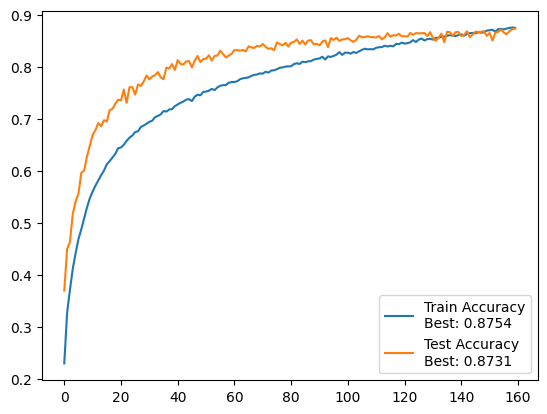

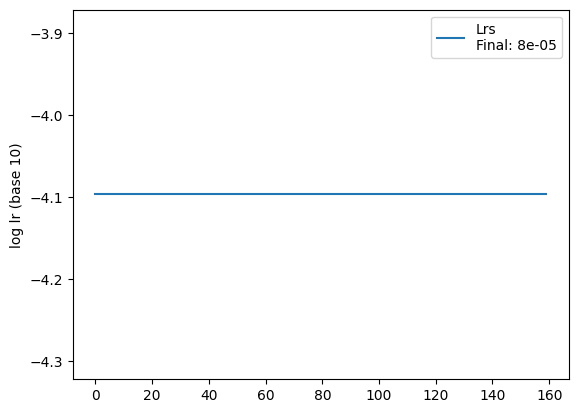

100%|██████████| 391/391 [01:48<00:00,  3.61it/s]


 Train accuracy: 88.2%, Avg loss: 0.337966, lr: 8e-05


100%|██████████| 10/10 [18:16<00:00, 109.62s/it]


 Test accuracy: 87.2%, Avg loss: 0.432236


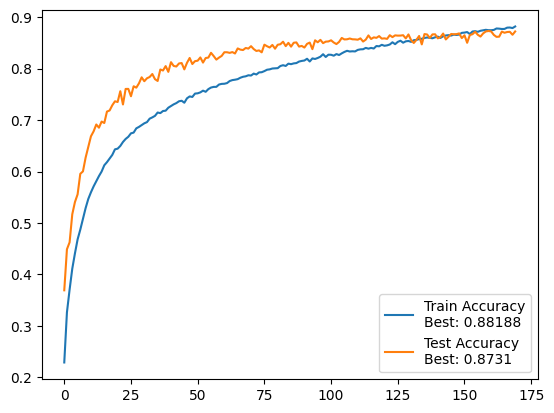

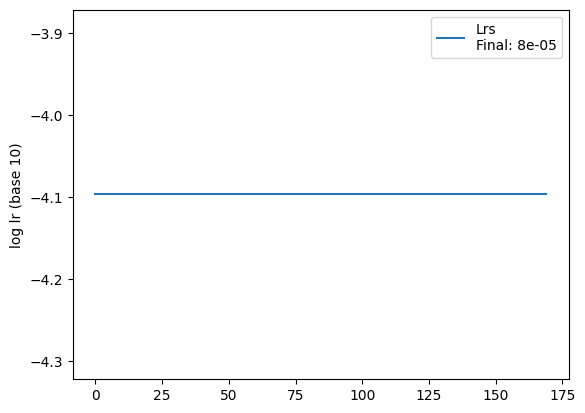

100%|██████████| 391/391 [01:48<00:00,  3.61it/s]


 Train accuracy: 88.8%, Avg loss: 0.318645, lr: 8e-05


100%|██████████| 10/10 [18:15<00:00, 109.55s/it]


 Test accuracy: 86.2%, Avg loss: 0.478932


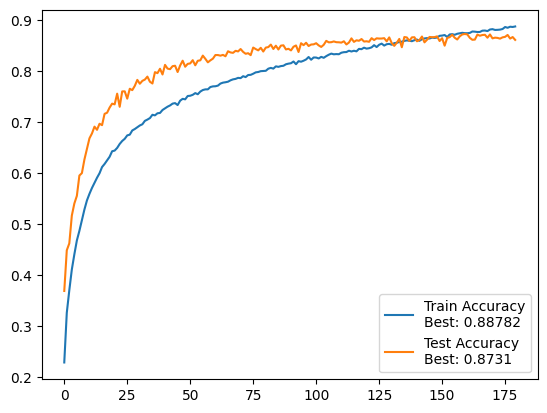

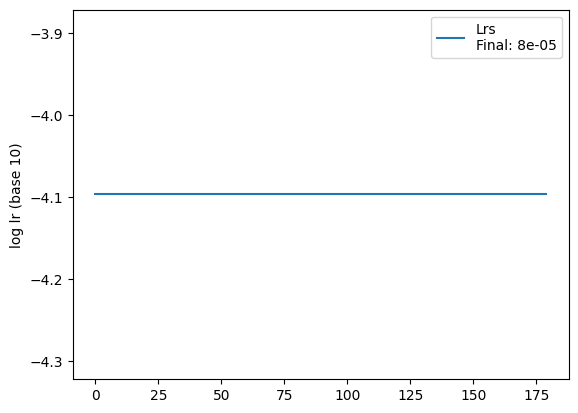

100%|██████████| 391/391 [01:48<00:00,  3.61it/s]


 Train accuracy: 89.3%, Avg loss: 0.306192, lr: 8e-05


100%|██████████| 10/10 [18:15<00:00, 109.55s/it]


 Test accuracy: 86.4%, Avg loss: 0.468565


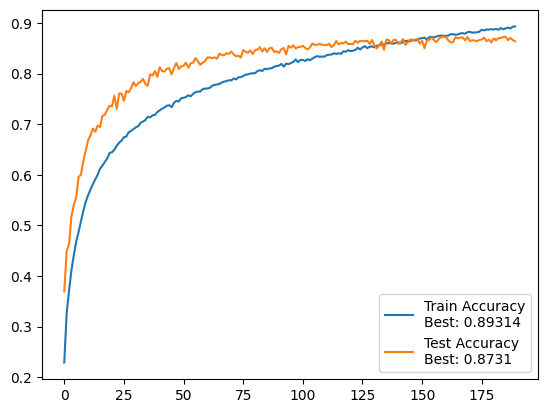

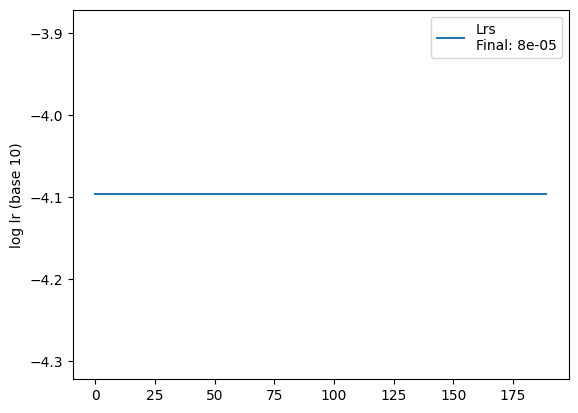

100%|██████████| 391/391 [01:48<00:00,  3.61it/s]


 Train accuracy: 89.6%, Avg loss: 0.296959, lr: 8e-05


100%|██████████| 10/10 [18:15<00:00, 109.59s/it]


 Test accuracy: 87.1%, Avg loss: 0.454972


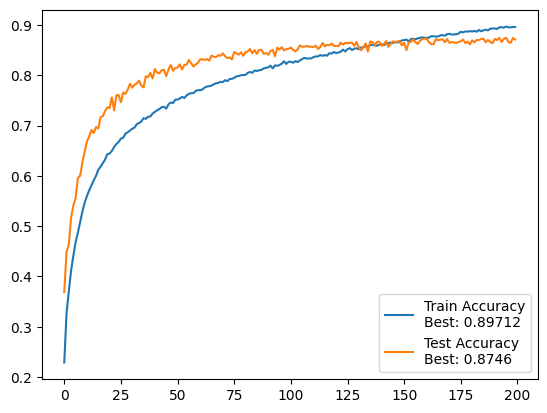

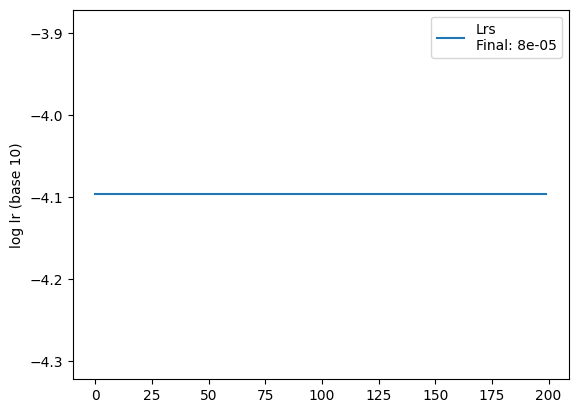

100%|██████████| 391/391 [01:48<00:00,  3.61it/s]


 Train accuracy: 90.2%, Avg loss: 0.281579, lr: 8e-05


100%|██████████| 10/10 [18:15<00:00, 109.57s/it]


 Test accuracy: 87.3%, Avg loss: 0.471833


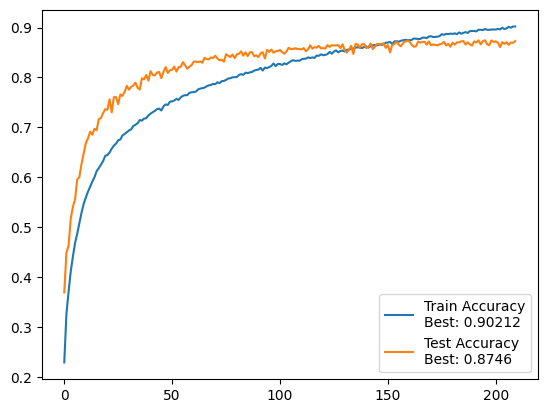

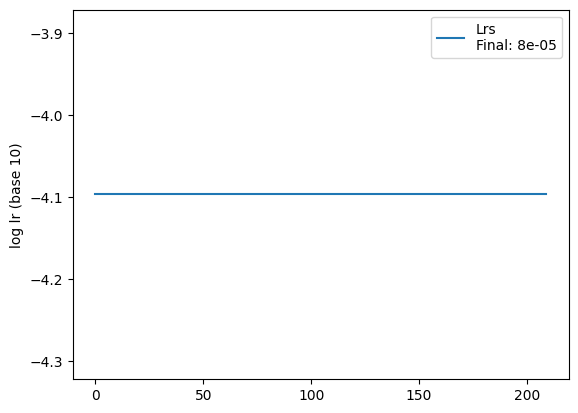

100%|██████████| 391/391 [01:48<00:00,  3.60it/s]


 Train accuracy: 90.7%, Avg loss: 0.267592, lr: 8e-05


100%|██████████| 10/10 [18:17<00:00, 109.79s/it]


 Test accuracy: 86.8%, Avg loss: 0.473911


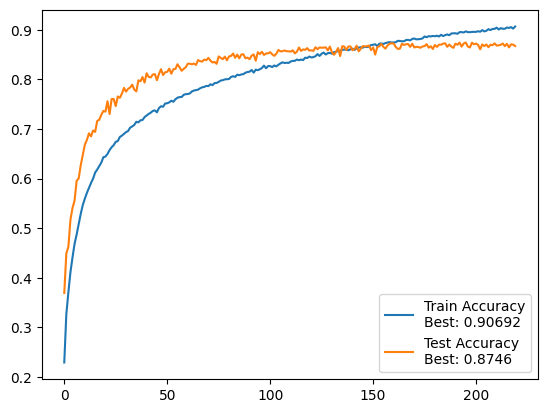

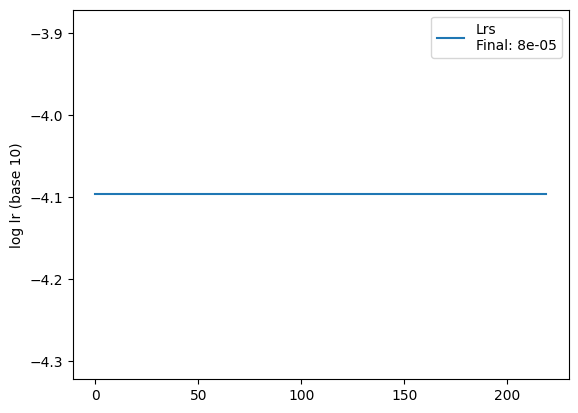

100%|██████████| 391/391 [01:48<00:00,  3.61it/s]


 Train accuracy: 91.1%, Avg loss: 0.257316, lr: 8e-05


100%|██████████| 10/10 [18:15<00:00, 109.55s/it]


 Test accuracy: 87.7%, Avg loss: 0.467145


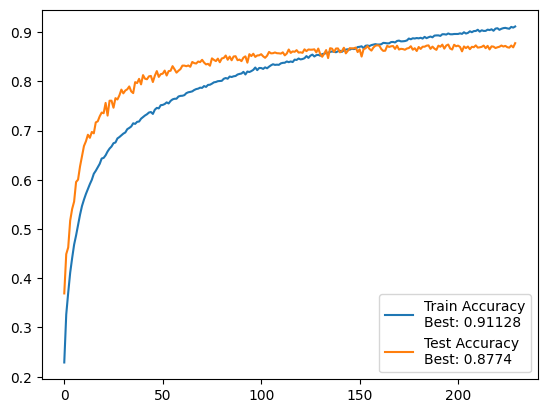

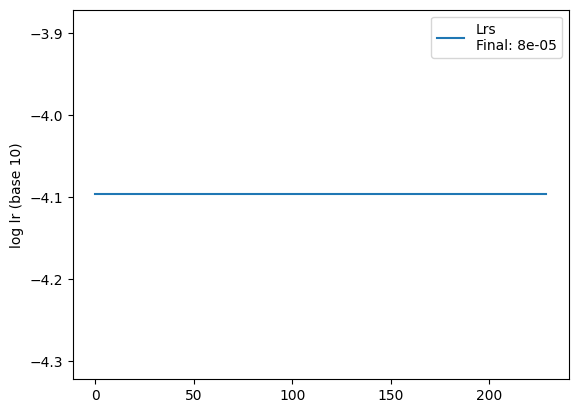

100%|██████████| 391/391 [01:48<00:00,  3.61it/s]


 Train accuracy: 91.6%, Avg loss: 0.242751, lr: 8e-05


100%|██████████| 10/10 [18:16<00:00, 109.65s/it]


 Test accuracy: 86.8%, Avg loss: 0.510542


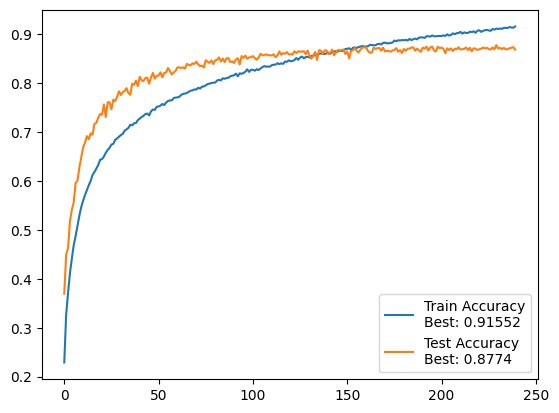

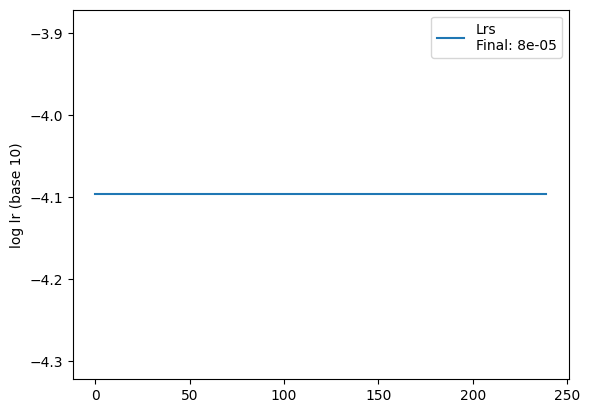

100%|██████████| 391/391 [01:48<00:00,  3.61it/s]


 Train accuracy: 91.8%, Avg loss: 0.237539, lr: 8e-05


100%|██████████| 10/10 [18:16<00:00, 109.60s/it]


 Test accuracy: 86.6%, Avg loss: 0.501884


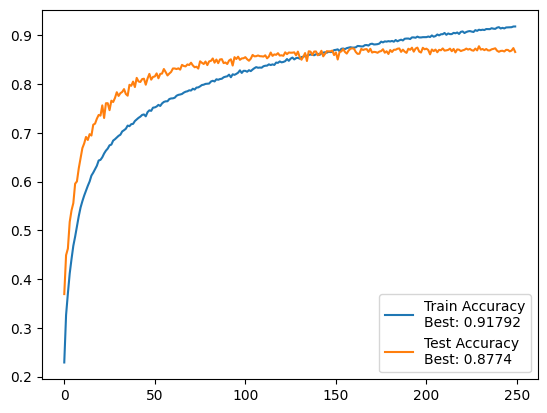

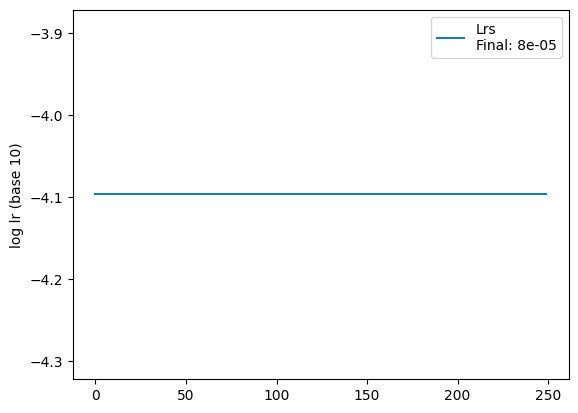

100%|██████████| 391/391 [01:48<00:00,  3.59it/s]


 Train accuracy: 92.1%, Avg loss: 0.227987, lr: 8e-05


100%|██████████| 10/10 [18:18<00:00, 109.82s/it]


 Test accuracy: 87.8%, Avg loss: 0.480967


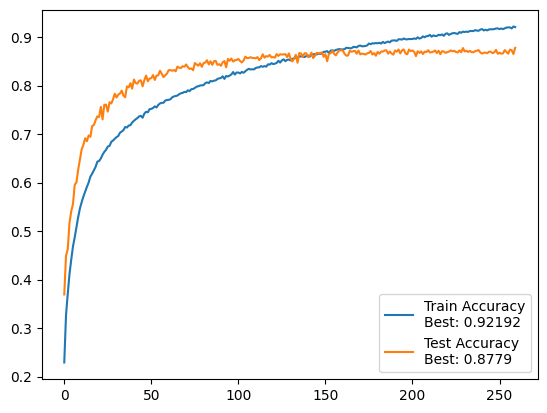

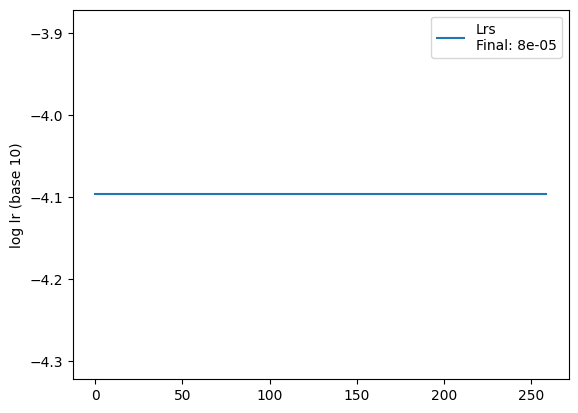

100%|██████████| 391/391 [01:48<00:00,  3.61it/s]


 Train accuracy: 92.4%, Avg loss: 0.217089, lr: 8e-05


100%|██████████| 10/10 [18:17<00:00, 109.73s/it]


 Test accuracy: 87.5%, Avg loss: 0.484651


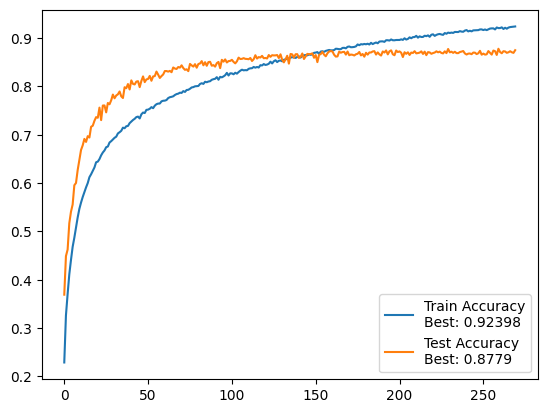

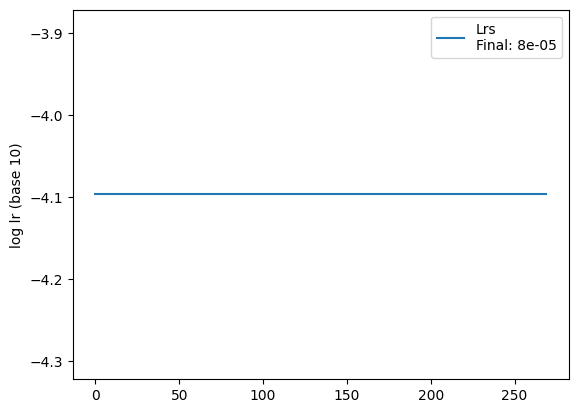

100%|██████████| 391/391 [01:47<00:00,  3.62it/s]


 Train accuracy: 92.9%, Avg loss: 0.204973, lr: 8e-05


100%|██████████| 10/10 [18:15<00:00, 109.52s/it]


 Test accuracy: 87.2%, Avg loss: 0.514329


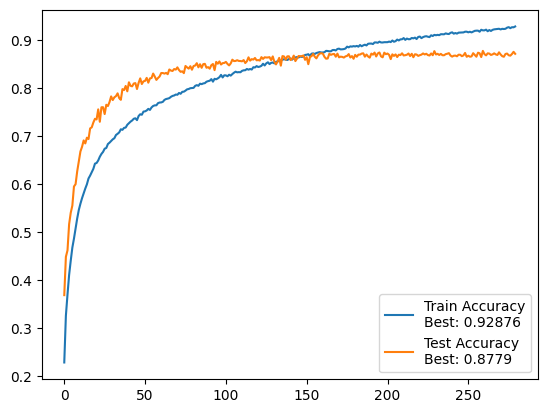

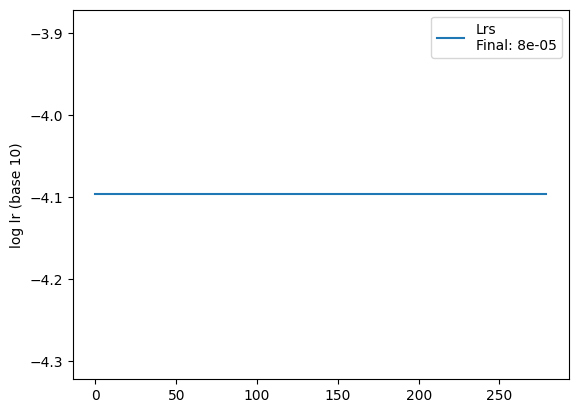

100%|██████████| 391/391 [01:46<00:00,  3.67it/s]


 Train accuracy: 92.9%, Avg loss: 0.202544, lr: 8e-05


100%|██████████| 10/10 [17:57<00:00, 107.74s/it]


 Test accuracy: 87.4%, Avg loss: 0.492358


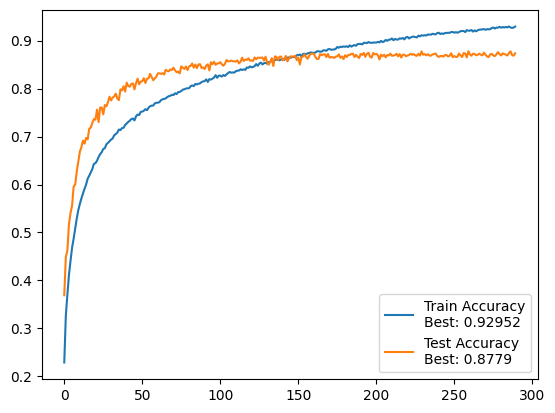

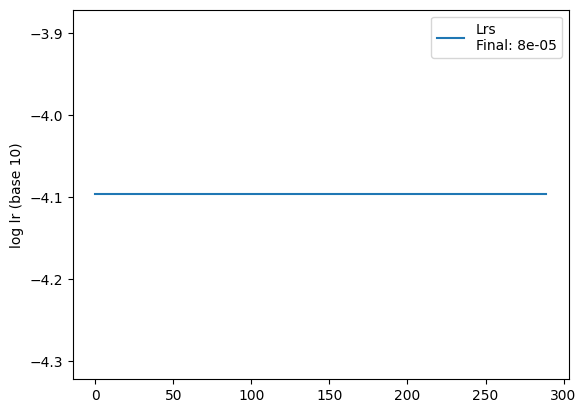

100%|██████████| 391/391 [01:46<00:00,  3.67it/s]


 Train accuracy: 93.1%, Avg loss: 0.195748, lr: 8e-05


100%|██████████| 10/10 [17:58<00:00, 107.81s/it]


 Test accuracy: 87.5%, Avg loss: 0.517040


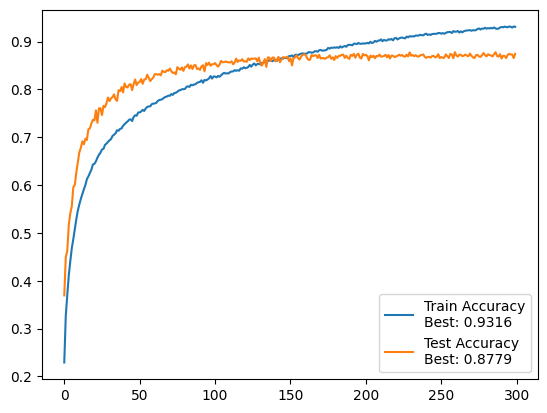

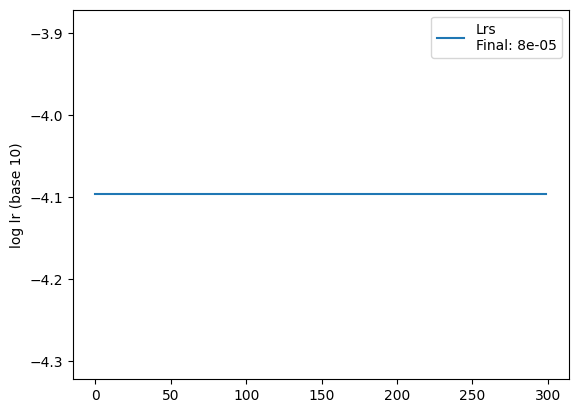

100%|██████████| 391/391 [01:46<00:00,  3.67it/s]


 Train accuracy: 93.2%, Avg loss: 0.194865, lr: 8e-05


100%|██████████| 10/10 [17:56<00:00, 107.68s/it]


 Test accuracy: 87.1%, Avg loss: 0.523919


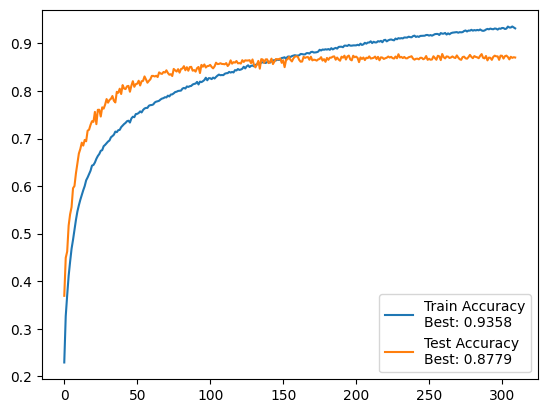

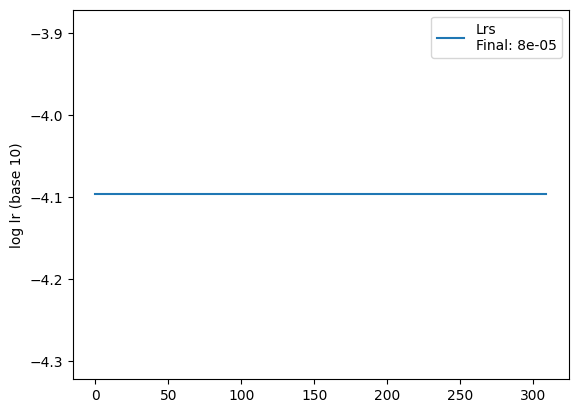

100%|██████████| 391/391 [01:46<00:00,  3.67it/s]


 Train accuracy: 93.4%, Avg loss: 0.188277, lr: 8e-05


100%|██████████| 10/10 [18:00<00:00, 108.05s/it]


 Test accuracy: 87.0%, Avg loss: 0.531015


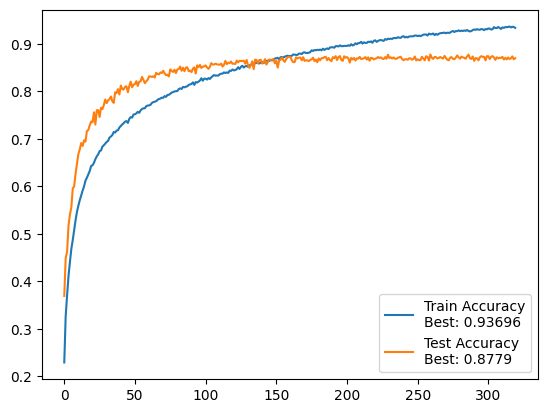

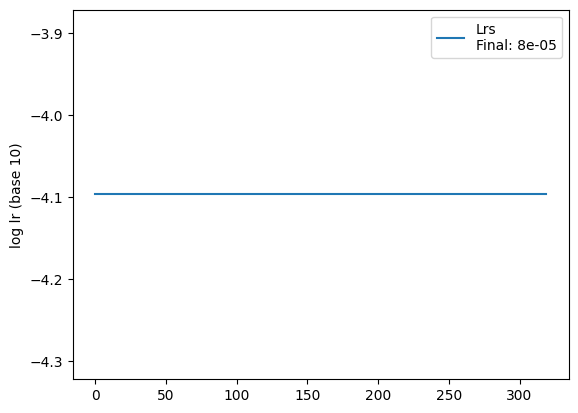

100%|██████████| 391/391 [01:46<00:00,  3.66it/s]


 Train accuracy: 93.8%, Avg loss: 0.177099, lr: 8e-05


100%|██████████| 10/10 [17:59<00:00, 107.98s/it]


 Test accuracy: 87.2%, Avg loss: 0.540497


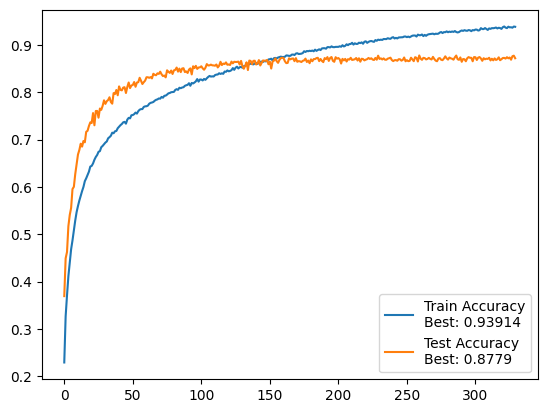

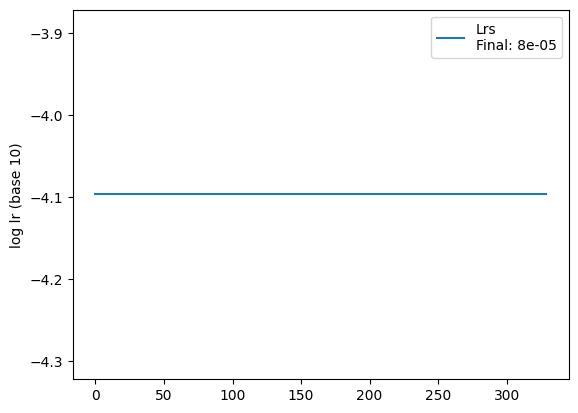

100%|██████████| 391/391 [01:46<00:00,  3.66it/s]


 Train accuracy: 94.1%, Avg loss: 0.169877, lr: 8e-05


100%|██████████| 10/10 [18:00<00:00, 108.09s/it]


 Test accuracy: 87.6%, Avg loss: 0.518908


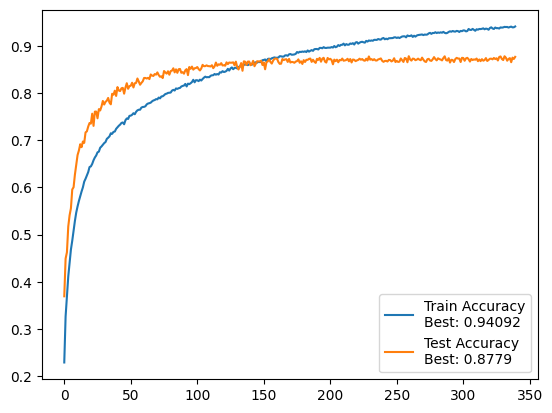

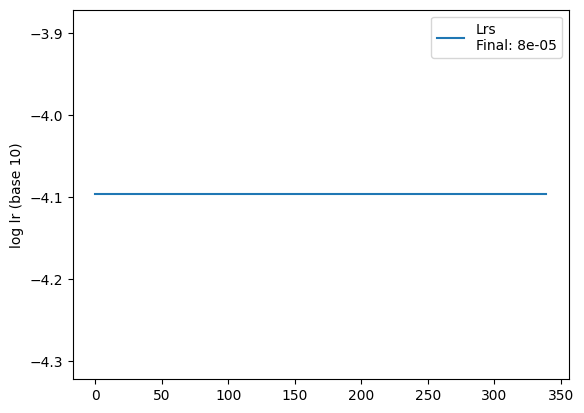

100%|██████████| 391/391 [01:46<00:00,  3.67it/s]


 Train accuracy: 94.2%, Avg loss: 0.168539, lr: 8e-05


100%|██████████| 10/10 [17:57<00:00, 107.76s/it]


 Test accuracy: 86.5%, Avg loss: 0.556177


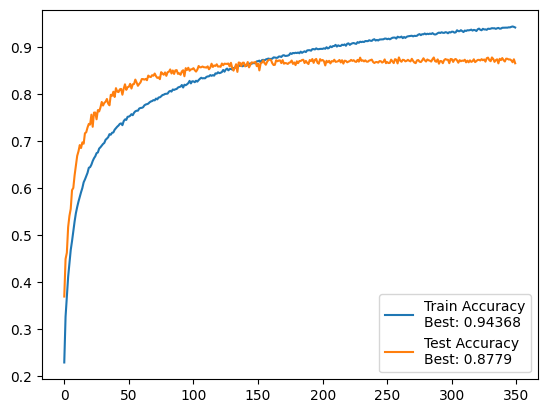

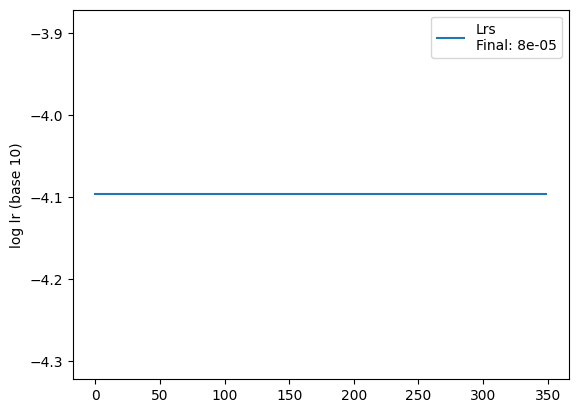

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 94.4%, Avg loss: 0.159872, lr: 8e-05


100%|██████████| 10/10 [17:57<00:00, 107.73s/it]


 Test accuracy: 86.7%, Avg loss: 0.572864


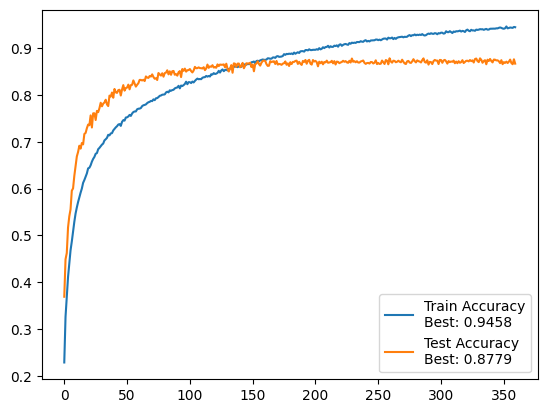

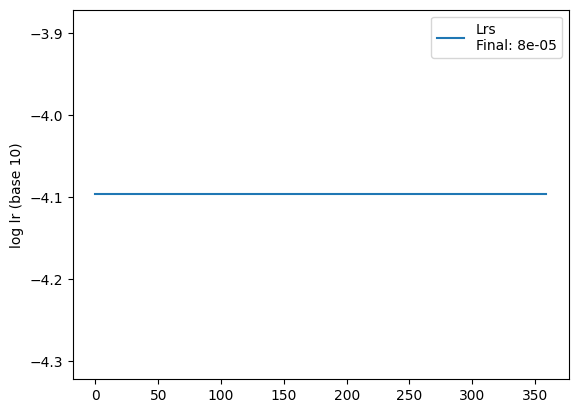

100%|██████████| 391/391 [01:46<00:00,  3.67it/s]


 Train accuracy: 94.6%, Avg loss: 0.157166, lr: 8e-05


100%|██████████| 10/10 [17:55<00:00, 107.55s/it]


 Test accuracy: 87.0%, Avg loss: 0.564522


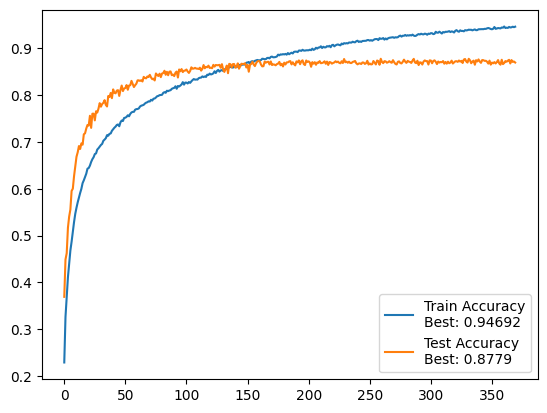

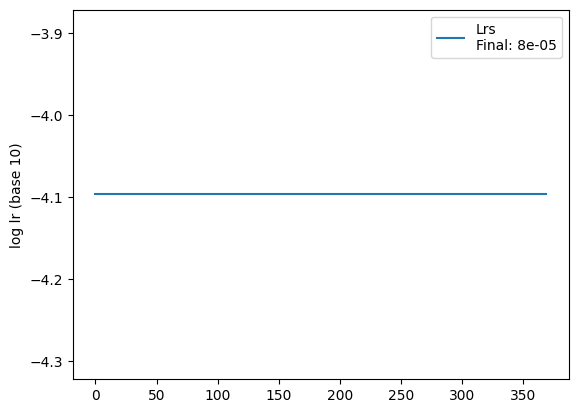

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 94.7%, Avg loss: 0.153457, lr: 8e-05


100%|██████████| 10/10 [17:57<00:00, 107.78s/it]


 Test accuracy: 87.4%, Avg loss: 0.552674


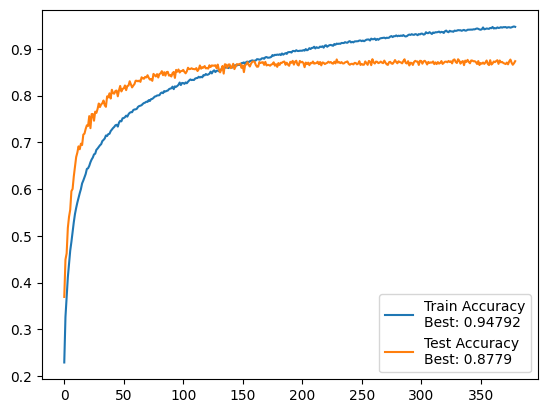

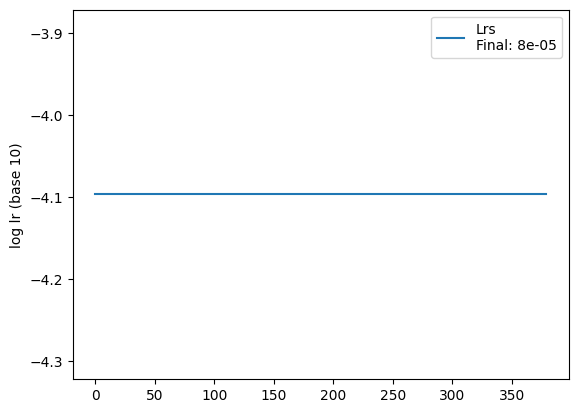

100%|██████████| 391/391 [01:46<00:00,  3.67it/s]


 Train accuracy: 94.9%, Avg loss: 0.147472, lr: 8e-05


100%|██████████| 10/10 [17:56<00:00, 107.68s/it]


 Test accuracy: 87.3%, Avg loss: 0.543699


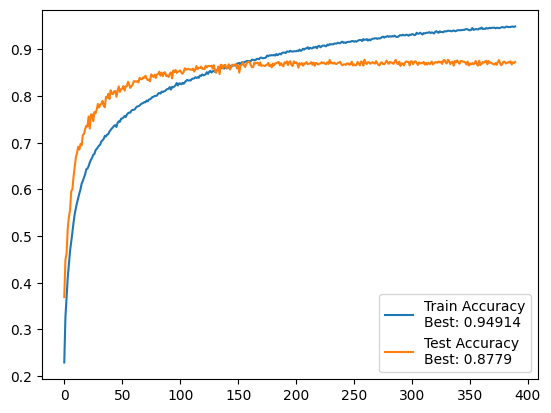

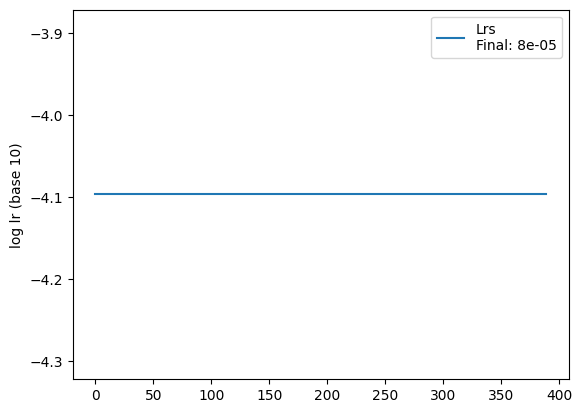

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 95.1%, Avg loss: 0.141899, lr: 8e-05


100%|██████████| 10/10 [17:56<00:00, 107.68s/it]


 Test accuracy: 87.3%, Avg loss: 0.558906


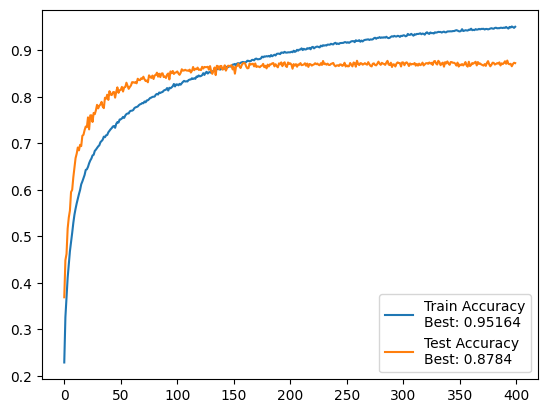

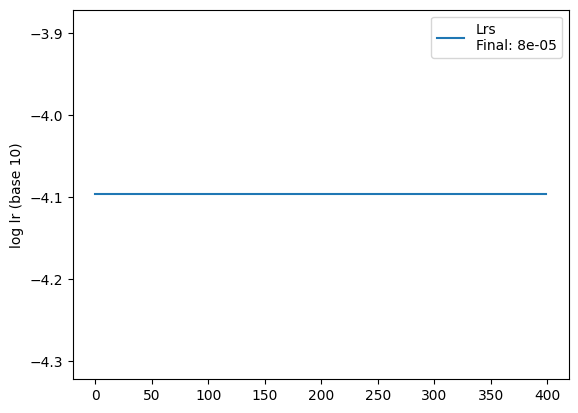

100%|██████████| 391/391 [01:46<00:00,  3.67it/s]


 Train accuracy: 95.2%, Avg loss: 0.138202, lr: 8e-05


100%|██████████| 10/10 [17:57<00:00, 107.79s/it]


 Test accuracy: 87.7%, Avg loss: 0.542285


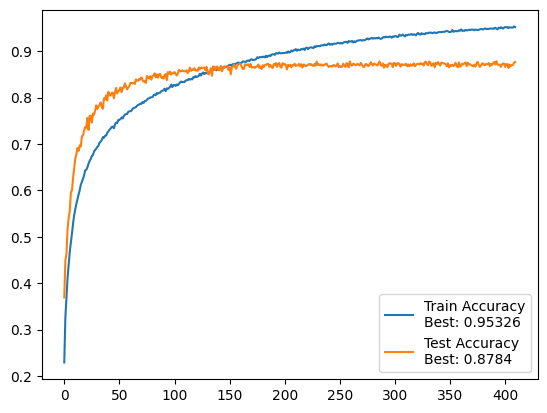

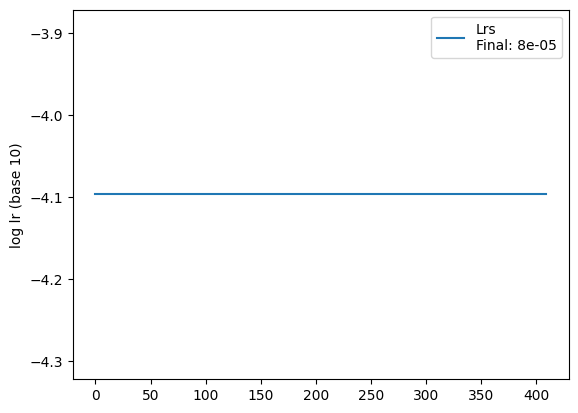

100%|██████████| 391/391 [01:46<00:00,  3.67it/s]


 Train accuracy: 95.3%, Avg loss: 0.139493, lr: 8e-05


100%|██████████| 10/10 [17:57<00:00, 107.76s/it]


 Test accuracy: 87.3%, Avg loss: 0.555570


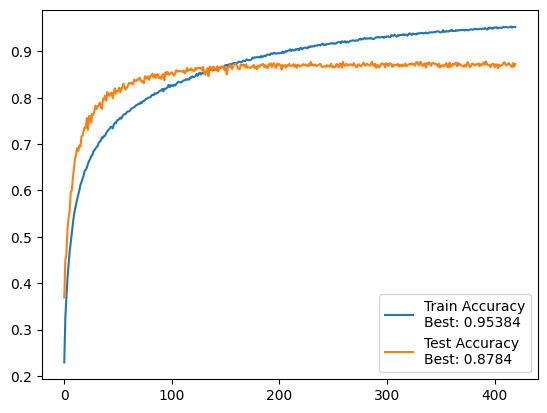

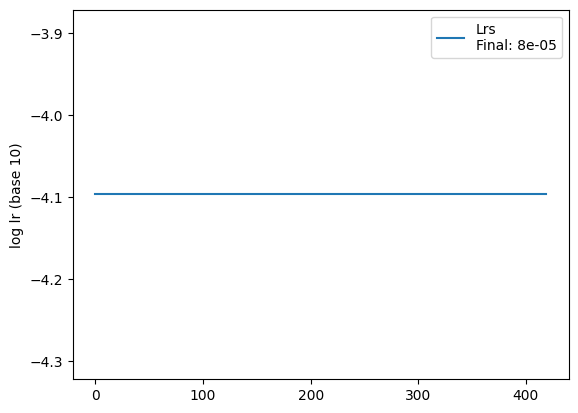

100%|██████████| 391/391 [01:46<00:00,  3.66it/s]


 Train accuracy: 96.7%, Avg loss: 0.094358, lr: 8.000000000000001e-06


100%|██████████| 10/10 [17:58<00:00, 107.86s/it]


 Test accuracy: 87.8%, Avg loss: 0.530229


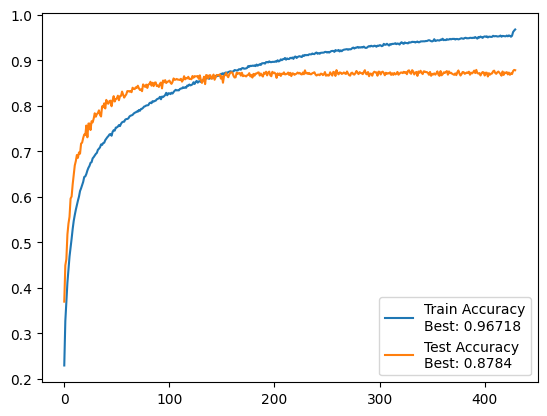

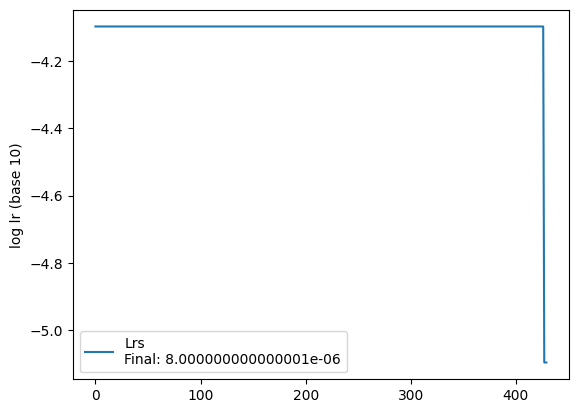

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 97.2%, Avg loss: 0.083042, lr: 8.000000000000001e-06


100%|██████████| 10/10 [17:59<00:00, 107.99s/it]


 Test accuracy: 87.7%, Avg loss: 0.549966


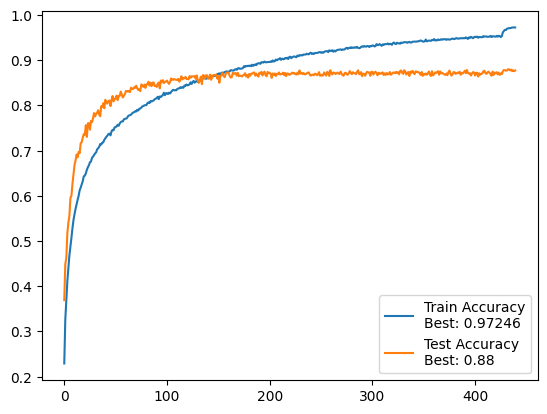

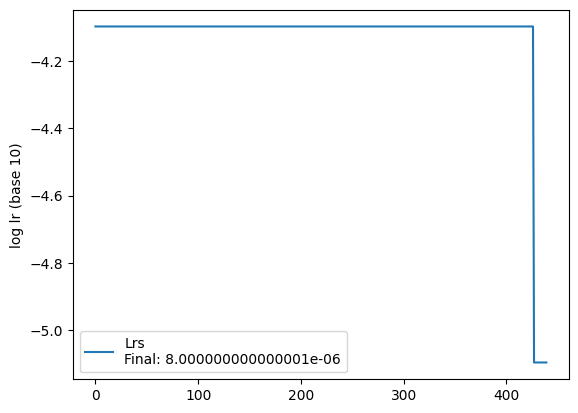

100%|██████████| 391/391 [01:46<00:00,  3.67it/s]


 Train accuracy: 97.5%, Avg loss: 0.075878, lr: 8.000000000000001e-06


100%|██████████| 10/10 [17:57<00:00, 107.72s/it]


 Test accuracy: 87.9%, Avg loss: 0.560941


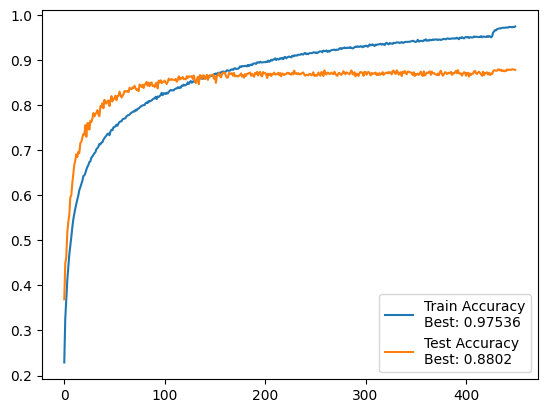

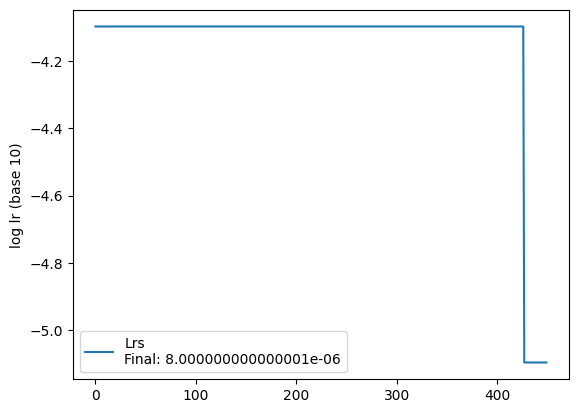

100%|██████████| 391/391 [01:46<00:00,  3.67it/s]


 Train accuracy: 97.6%, Avg loss: 0.071301, lr: 8.000000000000001e-06


100%|██████████| 10/10 [17:57<00:00, 107.76s/it]


 Test accuracy: 87.8%, Avg loss: 0.581993


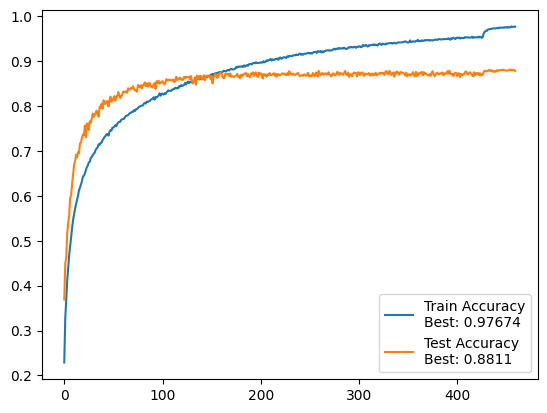

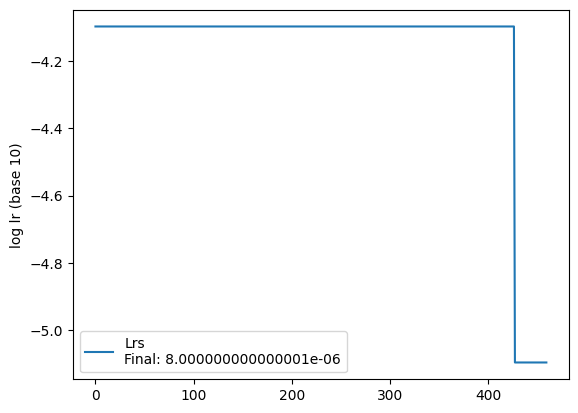

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 97.7%, Avg loss: 0.068617, lr: 8.000000000000001e-06


100%|██████████| 10/10 [17:59<00:00, 107.93s/it]


 Test accuracy: 87.5%, Avg loss: 0.585777


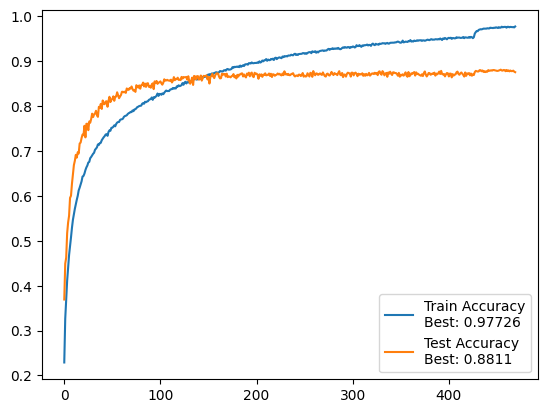

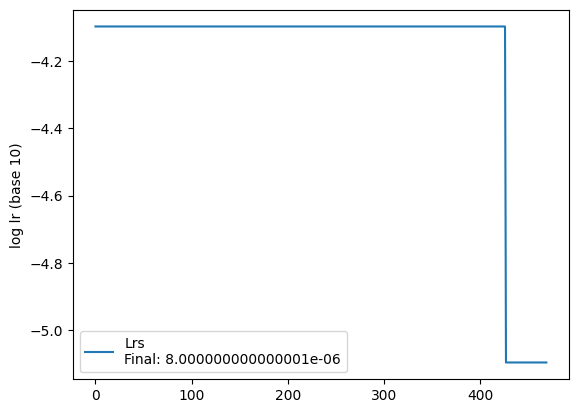

100%|██████████| 391/391 [01:46<00:00,  3.66it/s]


 Train accuracy: 97.8%, Avg loss: 0.066009, lr: 8.000000000000001e-06


100%|██████████| 10/10 [18:02<00:00, 108.23s/it]


 Test accuracy: 87.9%, Avg loss: 0.592003


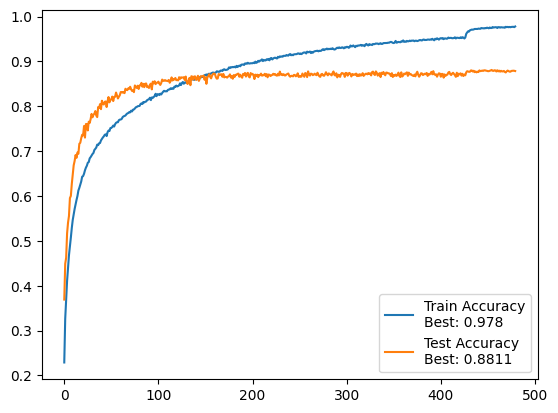

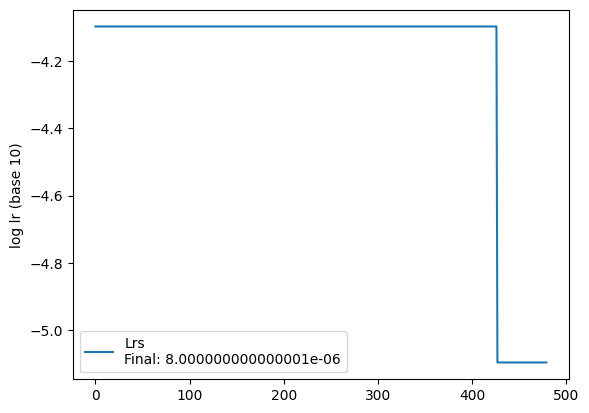

100%|██████████| 391/391 [01:46<00:00,  3.67it/s]


 Train accuracy: 97.8%, Avg loss: 0.064625, lr: 8.000000000000001e-06


100%|██████████| 10/10 [17:58<00:00, 107.84s/it]


 Test accuracy: 87.9%, Avg loss: 0.595475


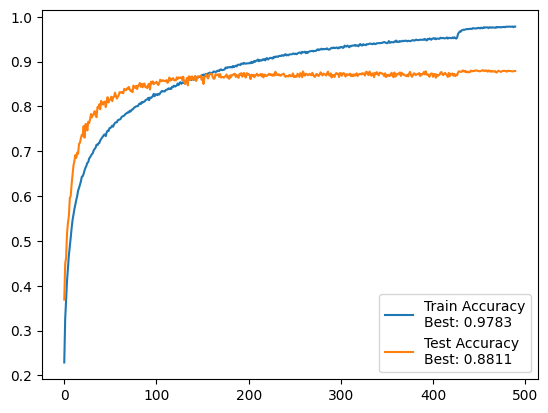

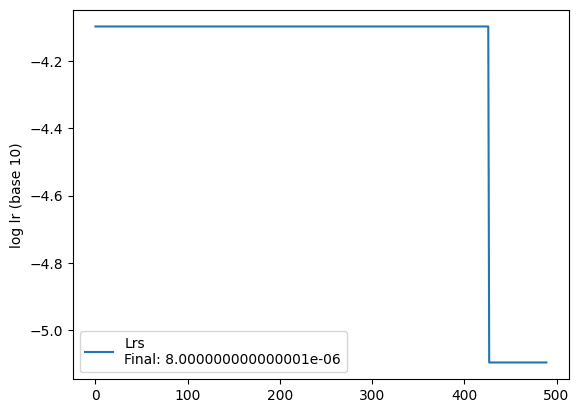

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 97.8%, Avg loss: 0.065386, lr: 8.000000000000001e-06


100%|██████████| 10/10 [17:57<00:00, 107.73s/it]


 Test accuracy: 88.0%, Avg loss: 0.592807


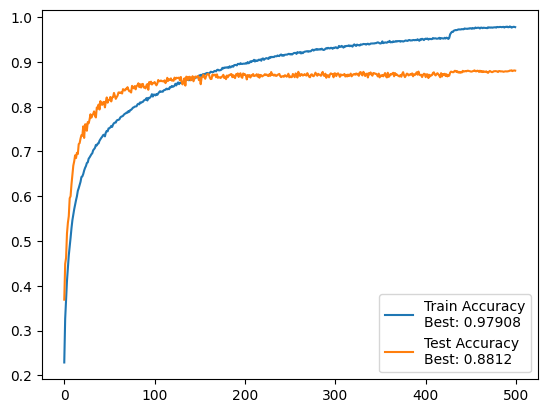

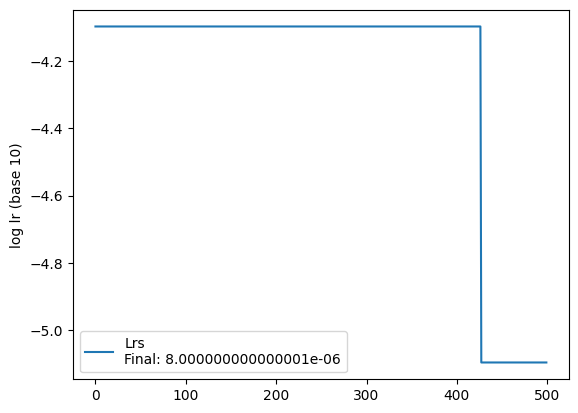

100%|██████████| 391/391 [01:46<00:00,  3.67it/s]


 Train accuracy: 97.9%, Avg loss: 0.061218, lr: 8.000000000000002e-07


100%|██████████| 10/10 [17:57<00:00, 107.78s/it]


 Test accuracy: 88.0%, Avg loss: 0.593257


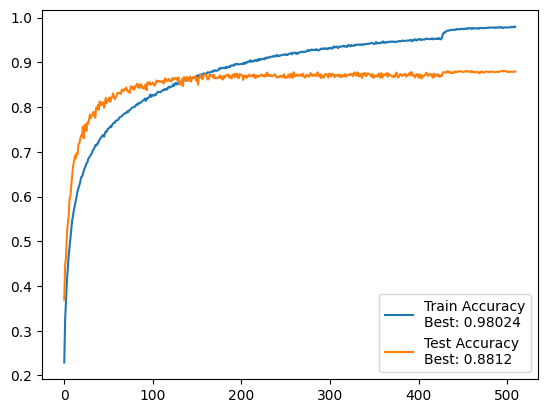

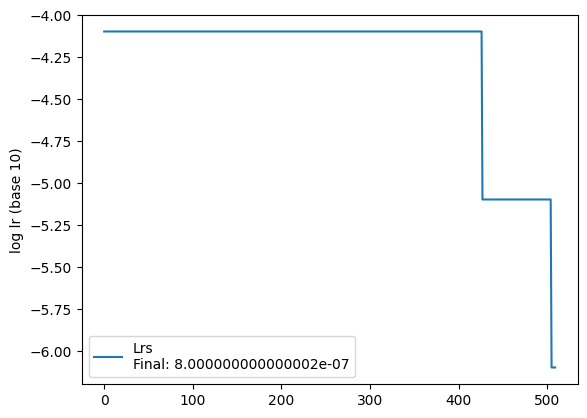

100%|██████████| 391/391 [01:46<00:00,  3.67it/s]


 Train accuracy: 98.1%, Avg loss: 0.057027, lr: 8.000000000000002e-07


100%|██████████| 10/10 [17:56<00:00, 107.65s/it]


 Test accuracy: 87.9%, Avg loss: 0.598316


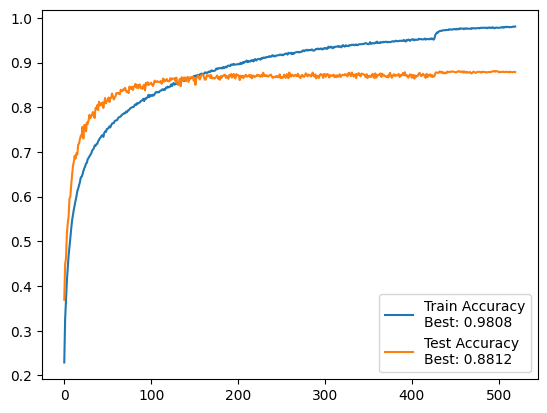

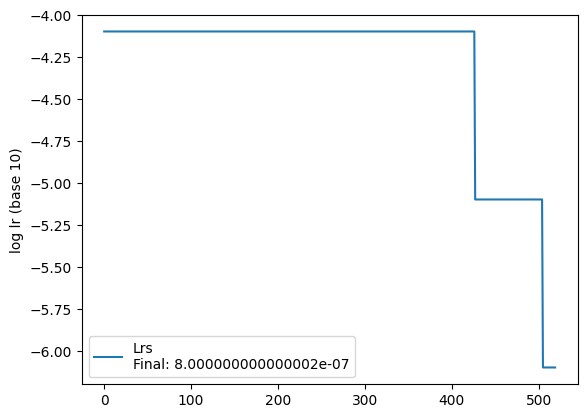

100%|██████████| 391/391 [01:46<00:00,  3.66it/s]


 Train accuracy: 97.9%, Avg loss: 0.061658, lr: 8.000000000000002e-07


100%|██████████| 10/10 [17:59<00:00, 107.99s/it]


 Test accuracy: 87.9%, Avg loss: 0.591287


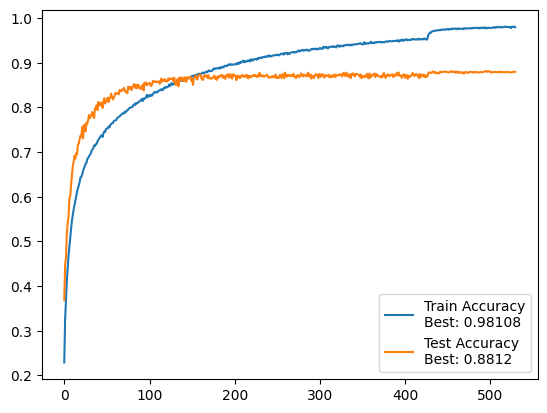

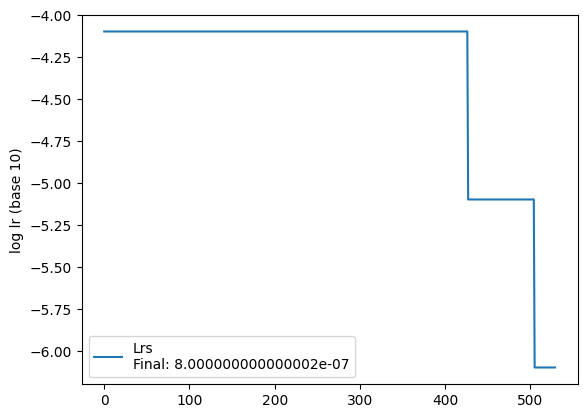

100%|██████████| 391/391 [01:46<00:00,  3.66it/s]


 Train accuracy: 98.0%, Avg loss: 0.059060, lr: 8.000000000000003e-08


100%|██████████| 10/10 [17:57<00:00, 107.74s/it]


 Test accuracy: 87.9%, Avg loss: 0.591749


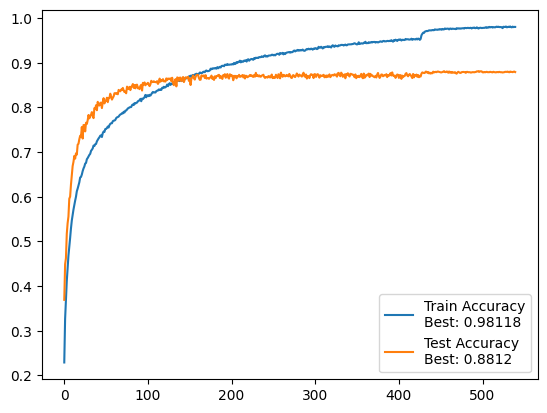

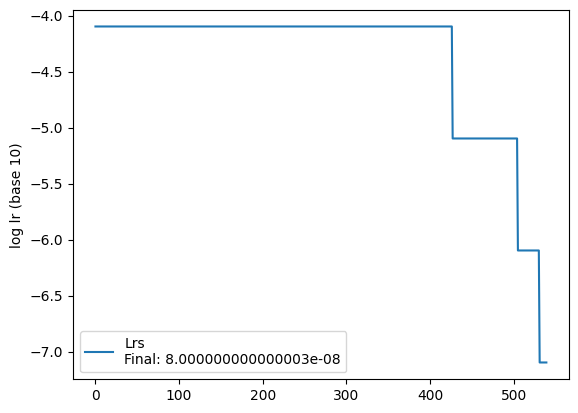

100%|██████████| 391/391 [01:46<00:00,  3.67it/s]


 Train accuracy: 98.0%, Avg loss: 0.056996, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:58<00:00, 107.86s/it]


 Test accuracy: 87.9%, Avg loss: 0.589584


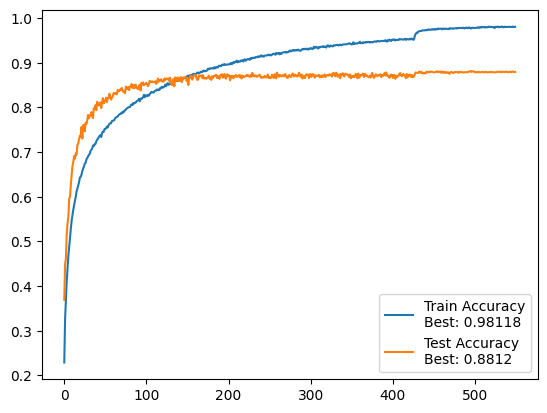

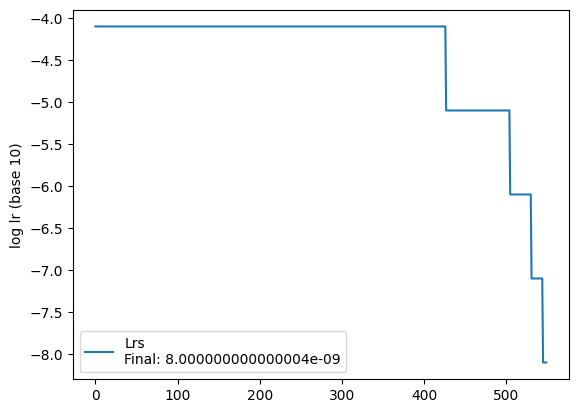

100%|██████████| 391/391 [01:46<00:00,  3.67it/s]


 Train accuracy: 97.9%, Avg loss: 0.061837, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:58<00:00, 107.81s/it]


 Test accuracy: 88.0%, Avg loss: 0.590275


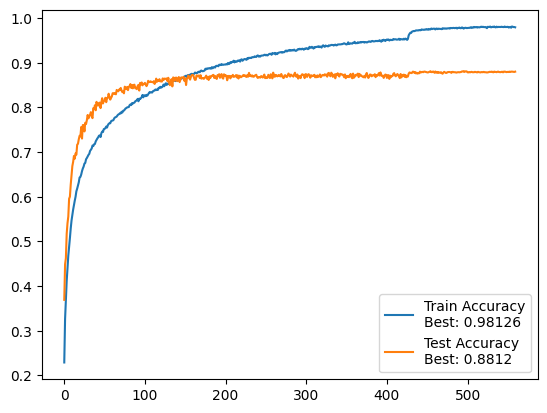

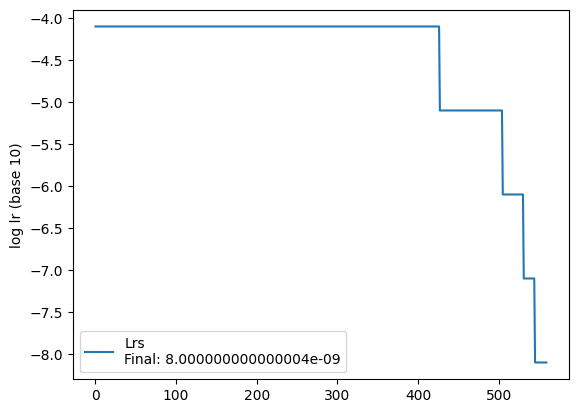

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.057720, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:58<00:00, 107.86s/it]


 Test accuracy: 87.9%, Avg loss: 0.597922


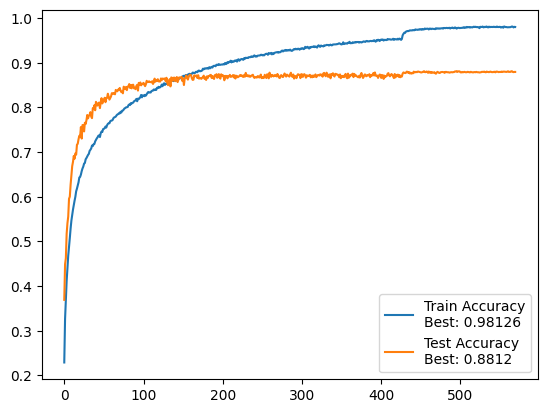

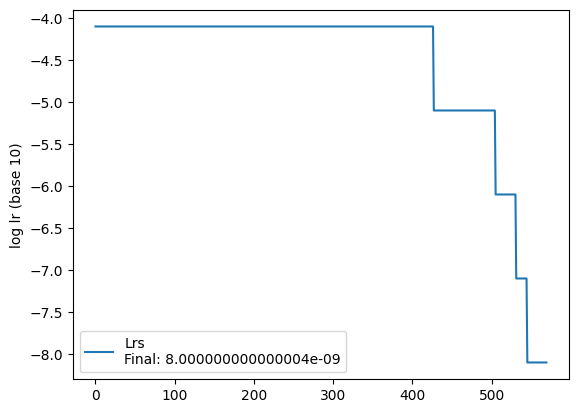

100%|██████████| 391/391 [01:48<00:00,  3.59it/s]


 Train accuracy: 98.1%, Avg loss: 0.058312, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:29<00:00, 111.00s/it]


 Test accuracy: 88.0%, Avg loss: 0.592500


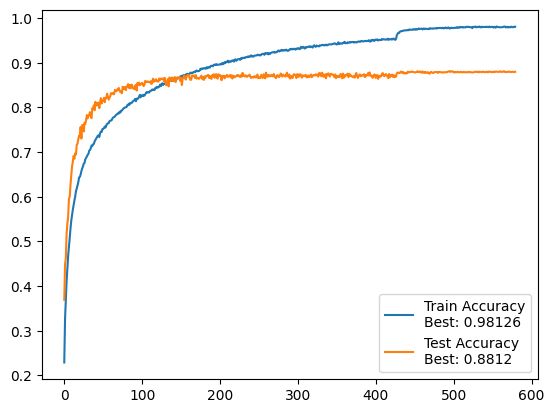

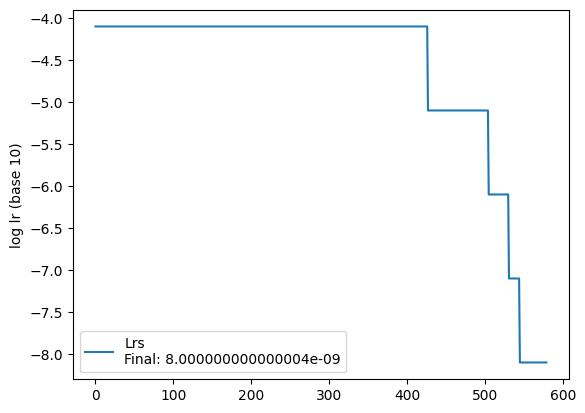

100%|██████████| 391/391 [01:48<00:00,  3.59it/s]


 Train accuracy: 98.2%, Avg loss: 0.055147, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:21<00:00, 110.14s/it]


 Test accuracy: 88.0%, Avg loss: 0.593764


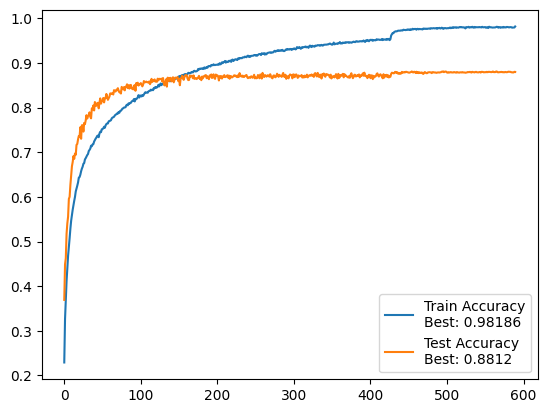

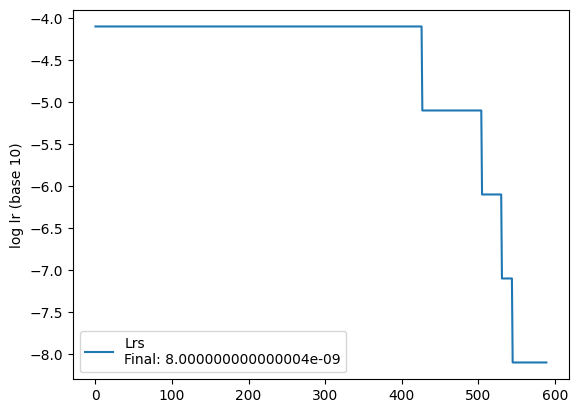

100%|██████████| 391/391 [01:49<00:00,  3.59it/s]


 Train accuracy: 98.1%, Avg loss: 0.058739, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:21<00:00, 110.20s/it]


 Test accuracy: 88.0%, Avg loss: 0.593027


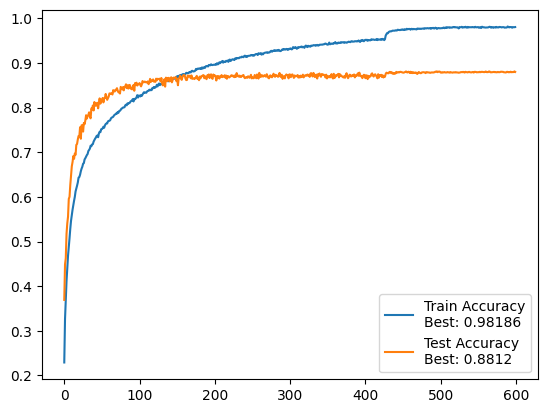

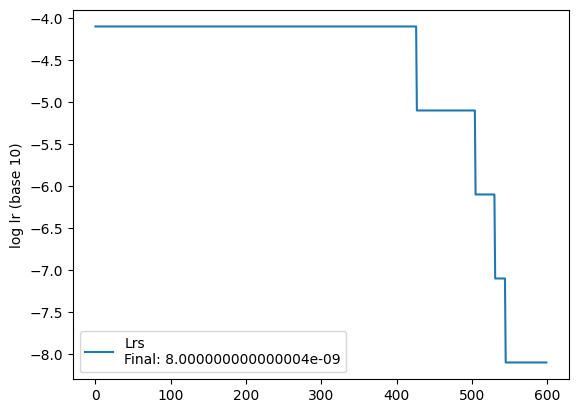

100%|██████████| 391/391 [01:48<00:00,  3.59it/s]


 Train accuracy: 98.0%, Avg loss: 0.060488, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:20<00:00, 110.05s/it]


 Test accuracy: 88.1%, Avg loss: 0.594625


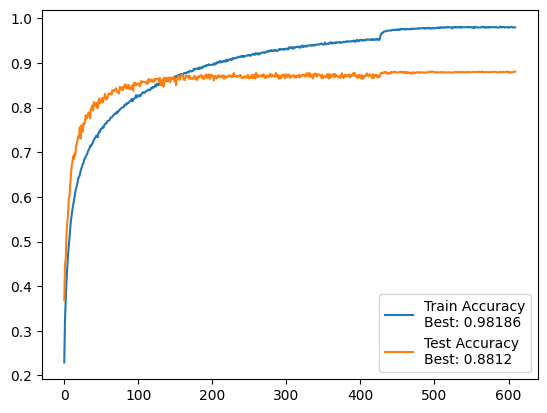

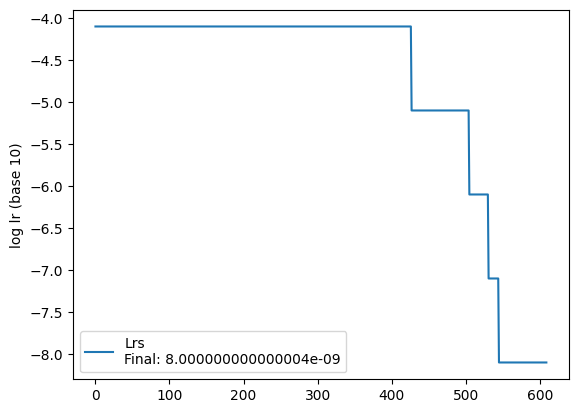

100%|██████████| 391/391 [01:48<00:00,  3.59it/s]


 Train accuracy: 98.0%, Avg loss: 0.058675, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:21<00:00, 110.15s/it]


 Test accuracy: 88.0%, Avg loss: 0.596393


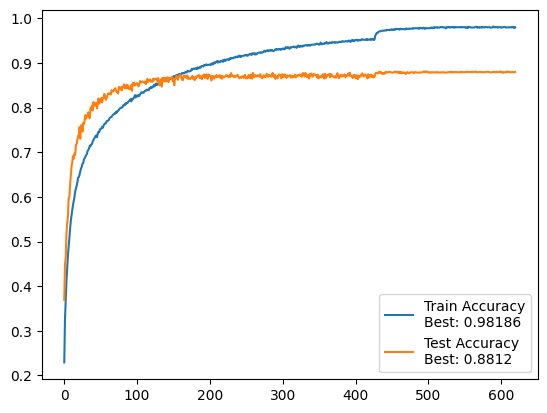

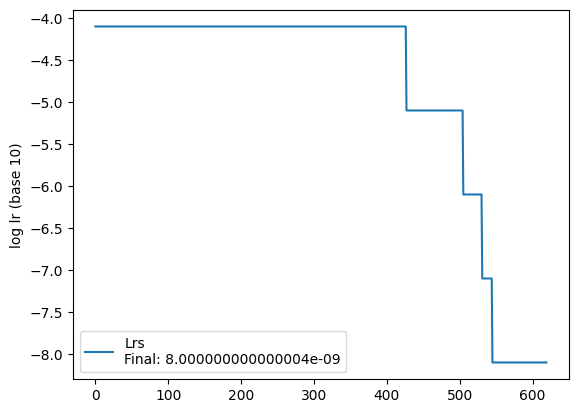

100%|██████████| 391/391 [01:49<00:00,  3.57it/s]


 Train accuracy: 98.1%, Avg loss: 0.058392, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:23<00:00, 110.32s/it]


 Test accuracy: 87.9%, Avg loss: 0.595020


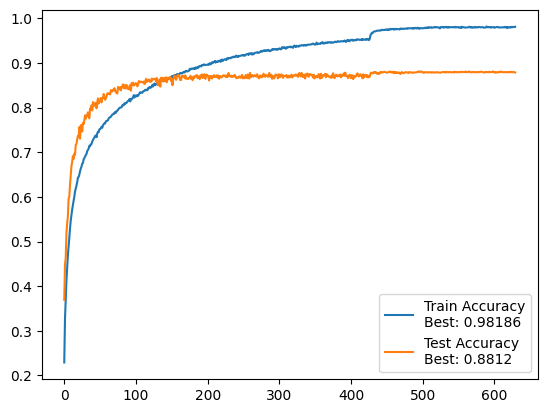

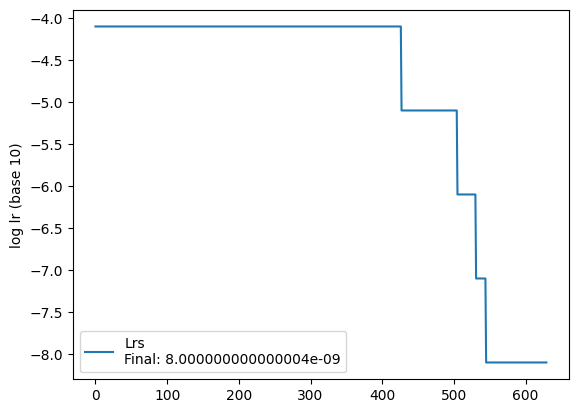

100%|██████████| 391/391 [01:49<00:00,  3.58it/s]


 Train accuracy: 98.0%, Avg loss: 0.058097, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:23<00:00, 110.38s/it]


 Test accuracy: 88.0%, Avg loss: 0.587568


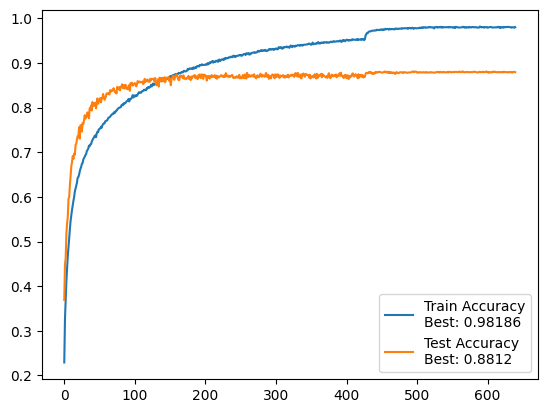

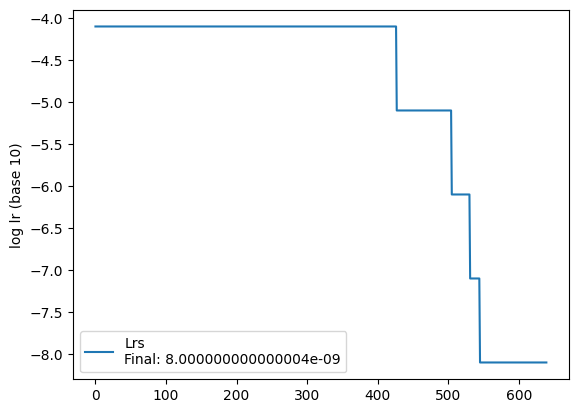

100%|██████████| 391/391 [01:49<00:00,  3.57it/s]


 Train accuracy: 97.9%, Avg loss: 0.060052, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:23<00:00, 110.32s/it]


 Test accuracy: 87.9%, Avg loss: 0.597041


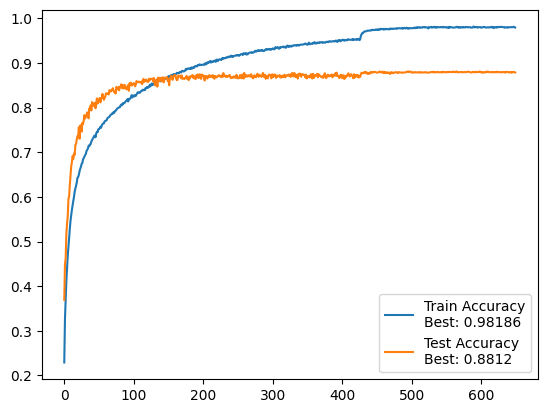

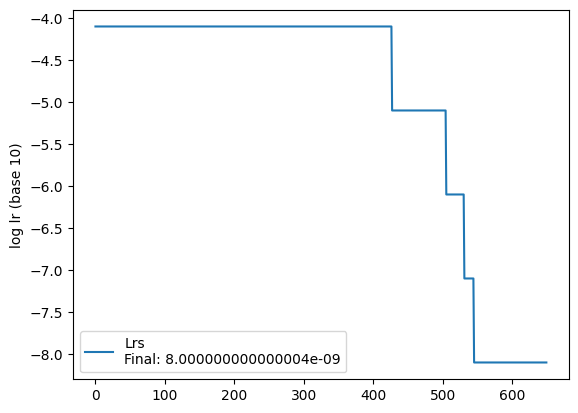

100%|██████████| 391/391 [01:48<00:00,  3.59it/s]


 Train accuracy: 98.1%, Avg loss: 0.059069, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:21<00:00, 110.14s/it]


 Test accuracy: 87.9%, Avg loss: 0.592424


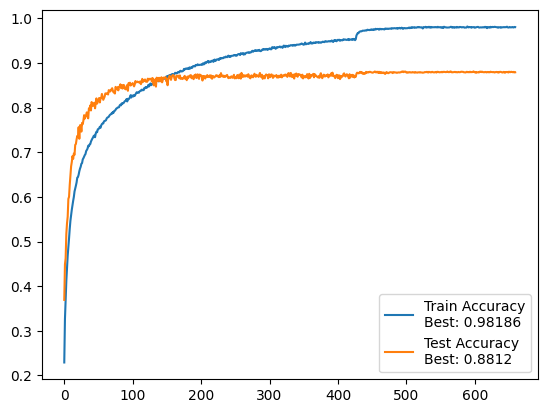

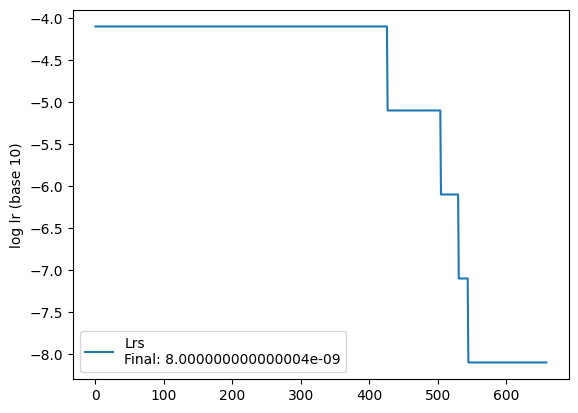

100%|██████████| 391/391 [01:48<00:00,  3.59it/s]


 Train accuracy: 98.0%, Avg loss: 0.060561, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:20<00:00, 110.01s/it]


 Test accuracy: 87.9%, Avg loss: 0.594041


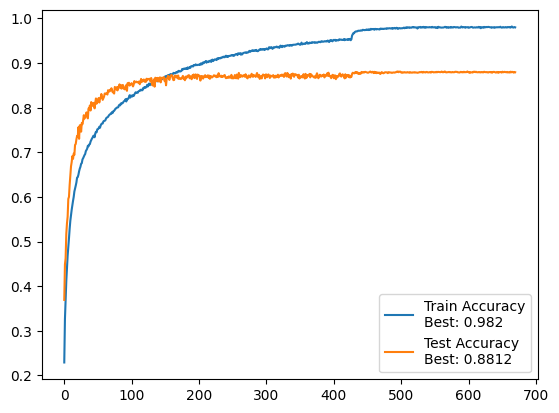

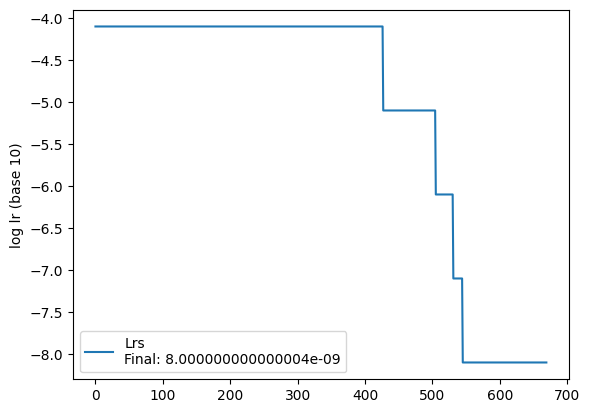

100%|██████████| 391/391 [01:48<00:00,  3.59it/s]


 Train accuracy: 97.9%, Avg loss: 0.060580, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:20<00:00, 110.06s/it]


 Test accuracy: 88.0%, Avg loss: 0.588351


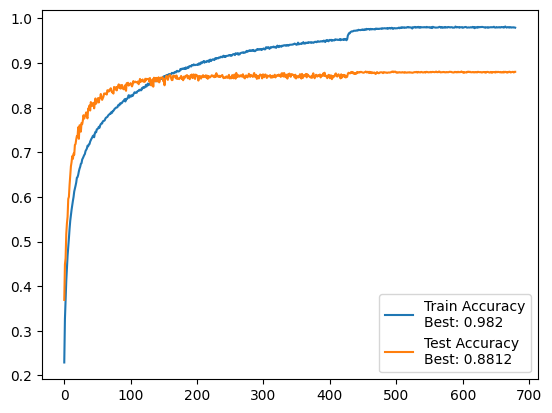

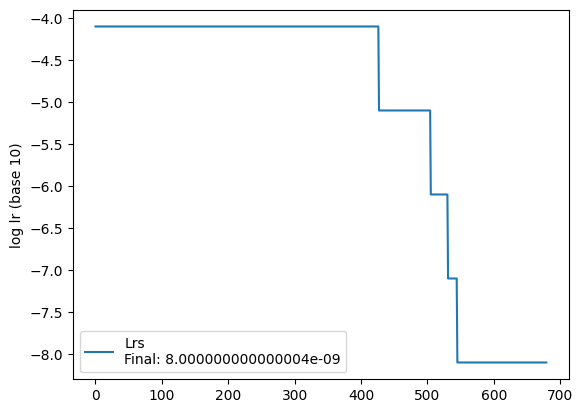

100%|██████████| 391/391 [01:49<00:00,  3.58it/s]


 Train accuracy: 98.1%, Avg loss: 0.056561, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:22<00:00, 110.29s/it]


 Test accuracy: 88.0%, Avg loss: 0.595020


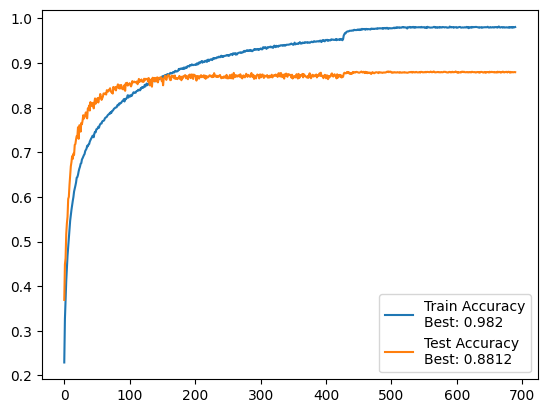

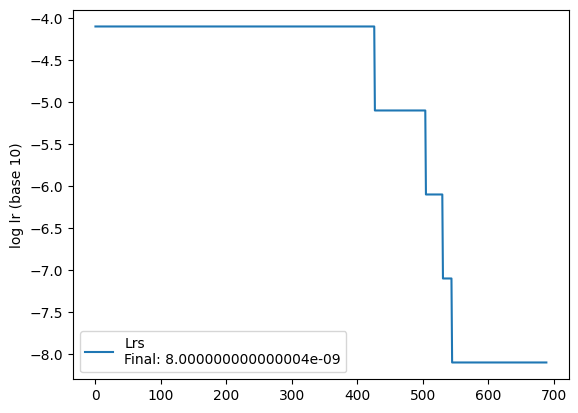

100%|██████████| 391/391 [01:49<00:00,  3.58it/s]


 Train accuracy: 98.1%, Avg loss: 0.058134, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:22<00:00, 110.23s/it]


 Test accuracy: 88.1%, Avg loss: 0.593551


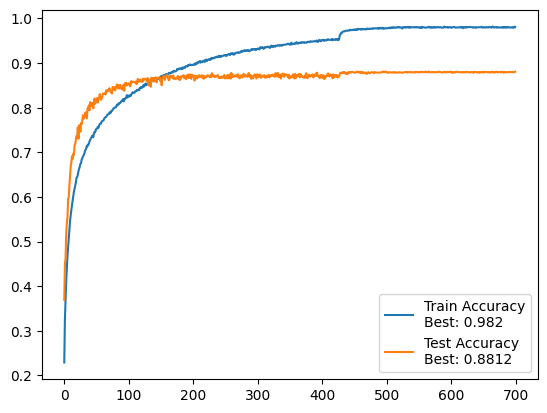

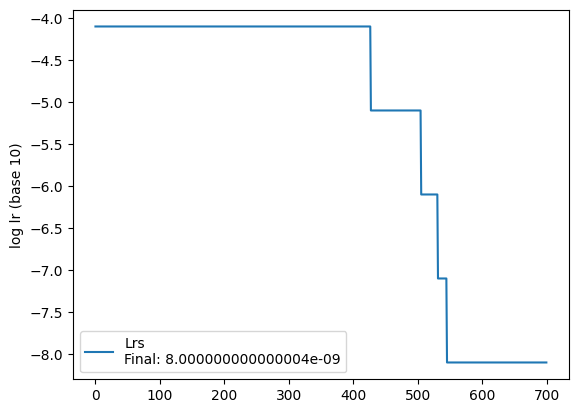

100%|██████████| 391/391 [01:48<00:00,  3.59it/s]


 Train accuracy: 98.1%, Avg loss: 0.059355, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:20<00:00, 110.06s/it]


 Test accuracy: 88.0%, Avg loss: 0.590194


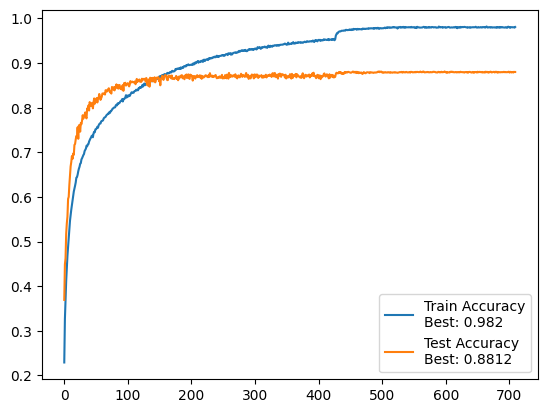

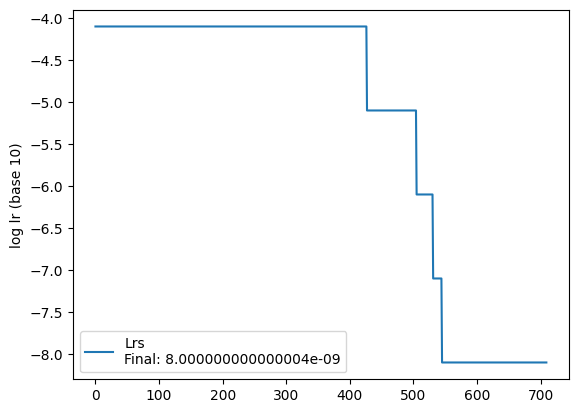

100%|██████████| 391/391 [01:49<00:00,  3.58it/s]


 Train accuracy: 97.9%, Avg loss: 0.060506, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:24<00:00, 110.42s/it]


 Test accuracy: 88.0%, Avg loss: 0.594888


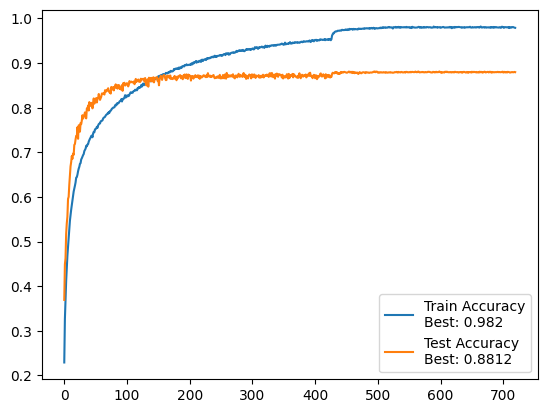

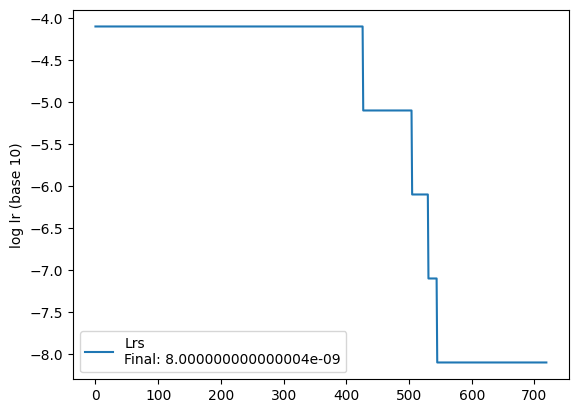

100%|██████████| 391/391 [01:49<00:00,  3.58it/s]


 Train accuracy: 98.1%, Avg loss: 0.057578, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:21<00:00, 110.14s/it]


 Test accuracy: 87.9%, Avg loss: 0.596051


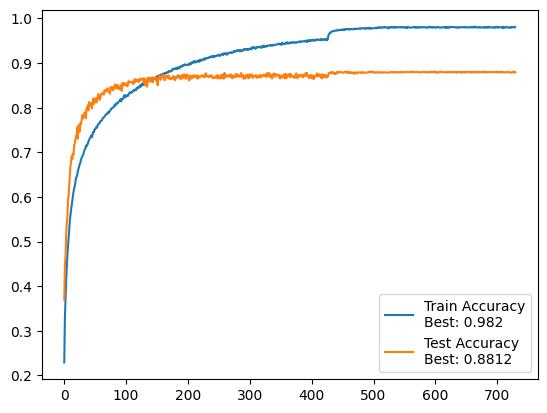

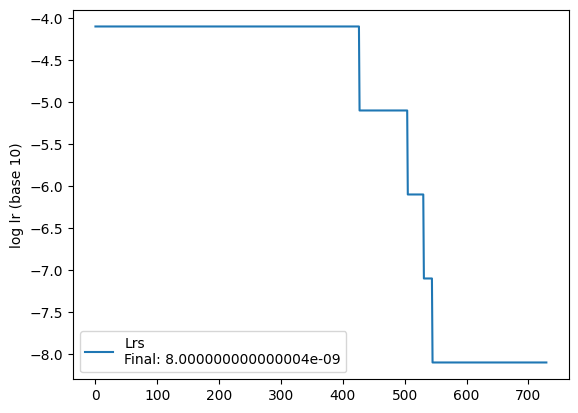

100%|██████████| 391/391 [01:48<00:00,  3.60it/s]


 Train accuracy: 98.1%, Avg loss: 0.057572, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:23<00:00, 110.35s/it]


 Test accuracy: 87.9%, Avg loss: 0.592630


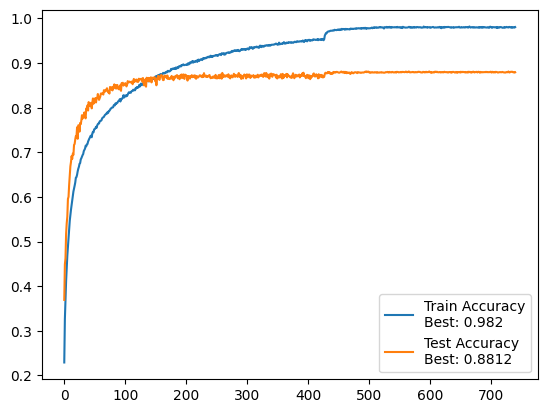

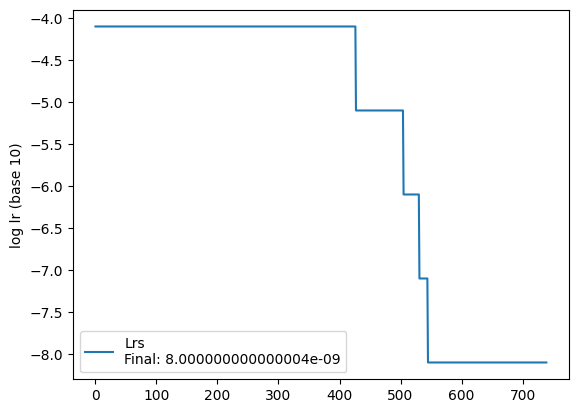

100%|██████████| 391/391 [01:48<00:00,  3.59it/s]


 Train accuracy: 98.0%, Avg loss: 0.061193, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:20<00:00, 110.06s/it]


 Test accuracy: 88.0%, Avg loss: 0.590105


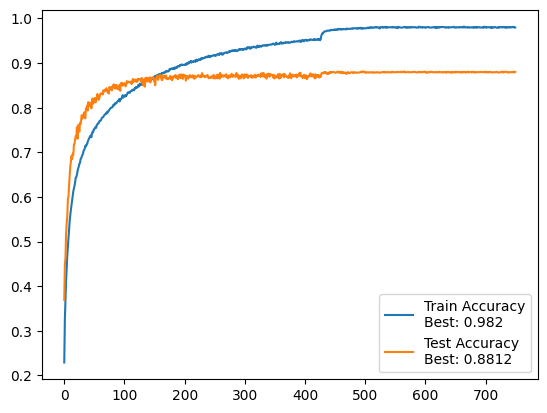

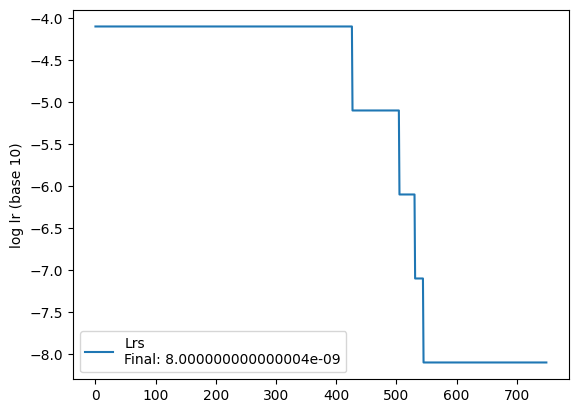

100%|██████████| 391/391 [01:48<00:00,  3.59it/s]


 Train accuracy: 98.0%, Avg loss: 0.058550, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:19<00:00, 109.96s/it]


 Test accuracy: 88.0%, Avg loss: 0.594139


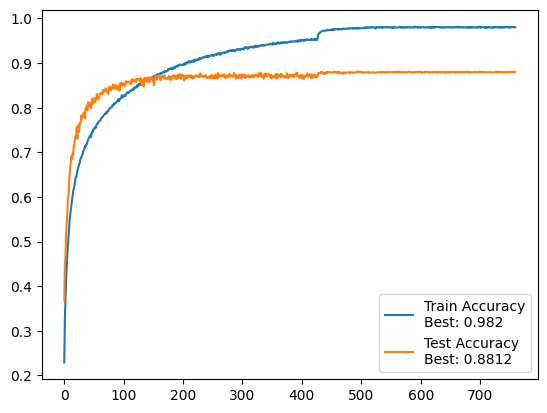

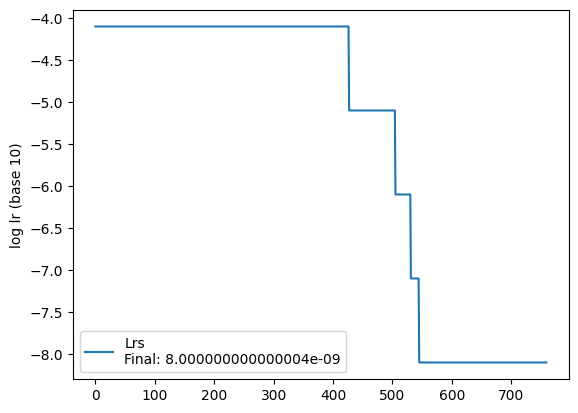

100%|██████████| 391/391 [01:48<00:00,  3.60it/s]


 Train accuracy: 98.0%, Avg loss: 0.059188, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:16<00:00, 109.61s/it]


 Test accuracy: 87.9%, Avg loss: 0.596089


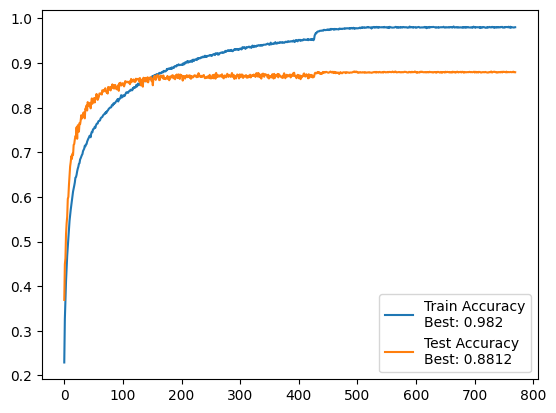

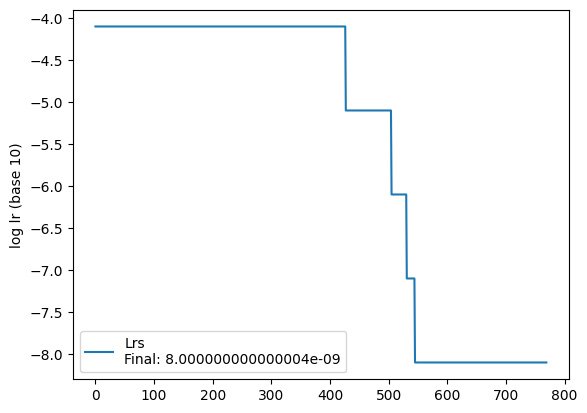

100%|██████████| 391/391 [01:48<00:00,  3.61it/s]


 Train accuracy: 98.0%, Avg loss: 0.060067, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:18<00:00, 109.83s/it]


 Test accuracy: 88.0%, Avg loss: 0.588954


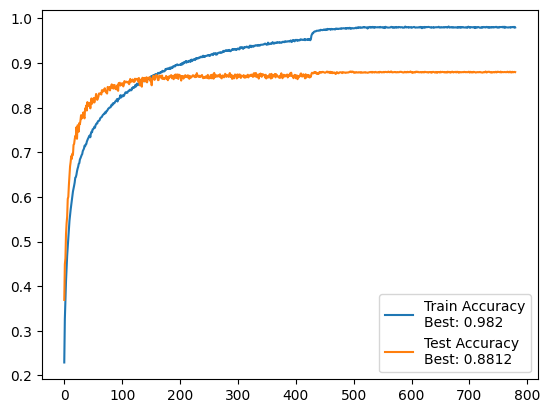

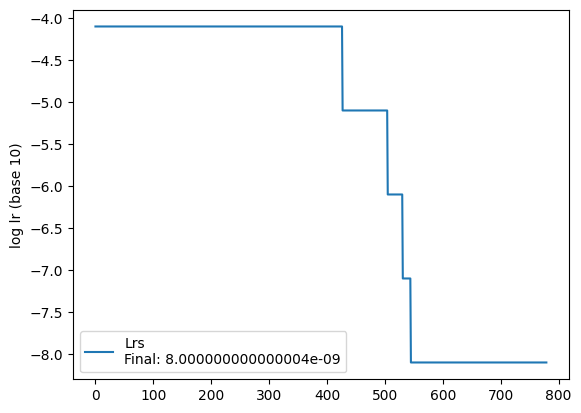

100%|██████████| 391/391 [01:48<00:00,  3.59it/s]


 Train accuracy: 98.0%, Avg loss: 0.060437, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:16<00:00, 109.68s/it]


 Test accuracy: 87.9%, Avg loss: 0.594637


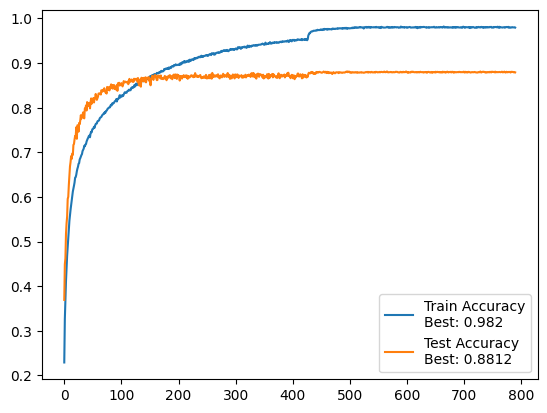

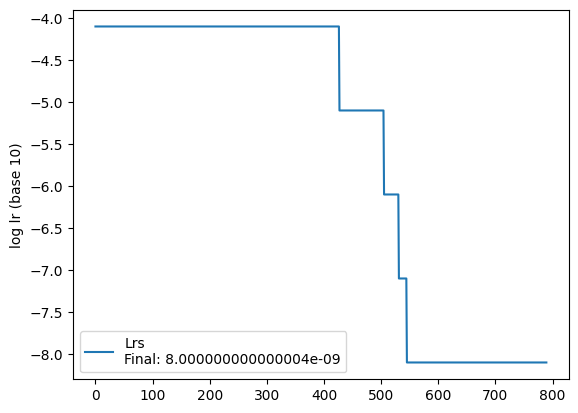

100%|██████████| 391/391 [01:48<00:00,  3.60it/s]


 Train accuracy: 98.1%, Avg loss: 0.058099, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:17<00:00, 109.77s/it]


 Test accuracy: 88.0%, Avg loss: 0.585927


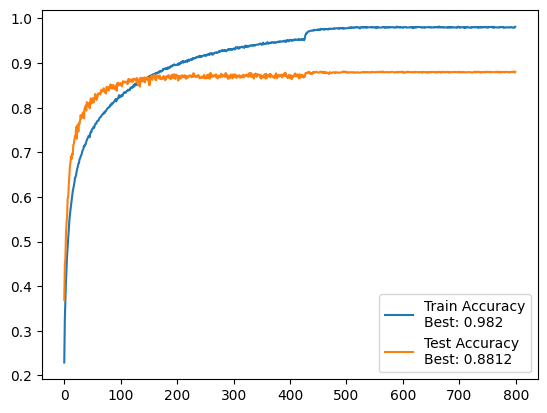

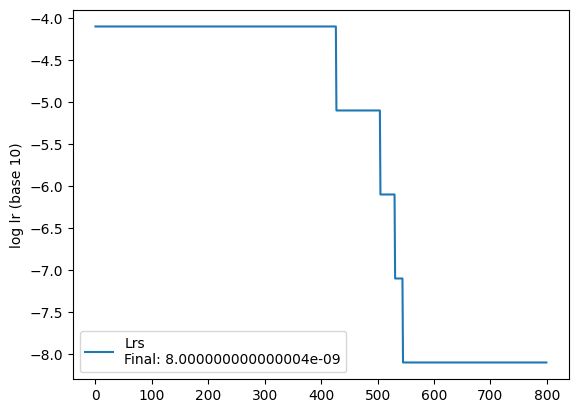

100%|██████████| 391/391 [01:48<00:00,  3.61it/s]


 Train accuracy: 98.0%, Avg loss: 0.058169, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:15<00:00, 109.53s/it]


 Test accuracy: 88.0%, Avg loss: 0.592234


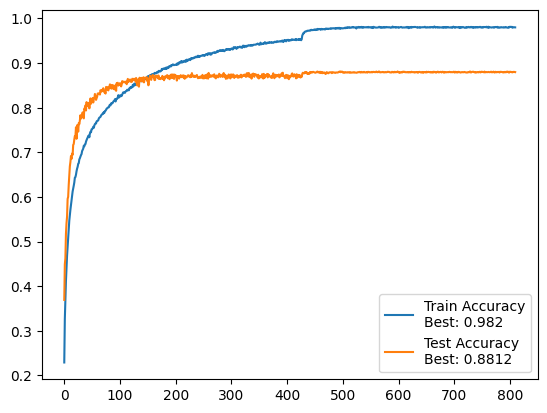

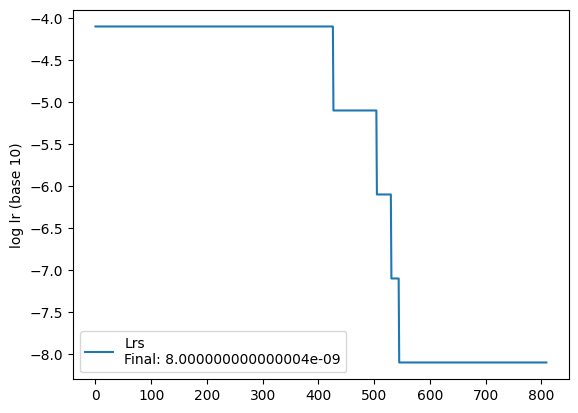

100%|██████████| 391/391 [01:48<00:00,  3.61it/s]


 Train accuracy: 98.0%, Avg loss: 0.058006, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:14<00:00, 109.42s/it]


 Test accuracy: 87.9%, Avg loss: 0.594000


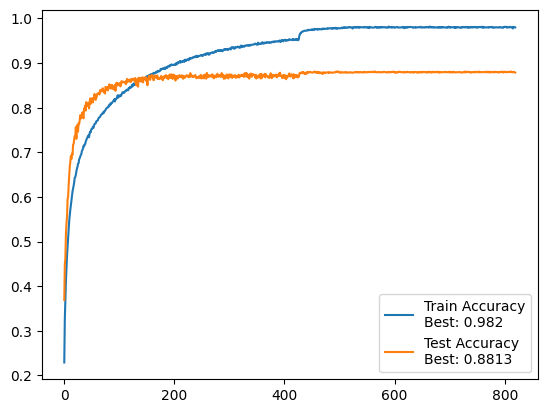

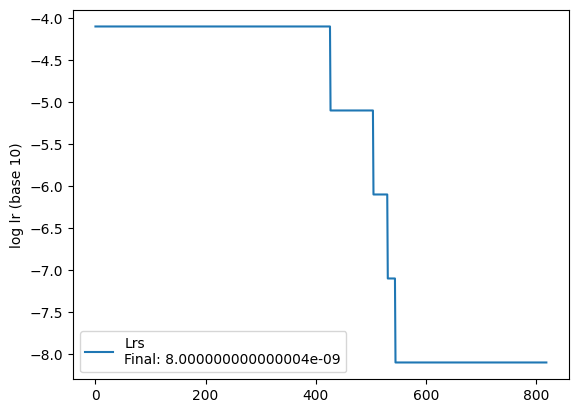

100%|██████████| 391/391 [01:48<00:00,  3.60it/s]


 Train accuracy: 97.9%, Avg loss: 0.061647, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:16<00:00, 109.65s/it]


 Test accuracy: 88.1%, Avg loss: 0.592915


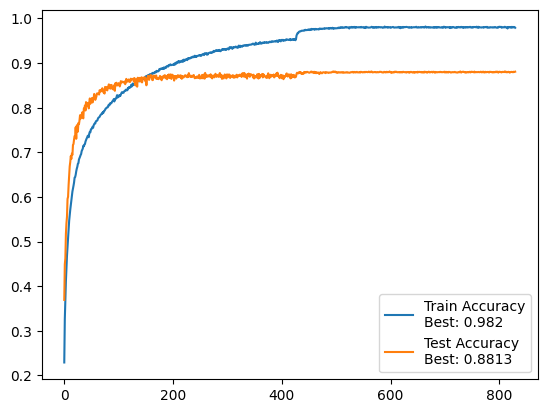

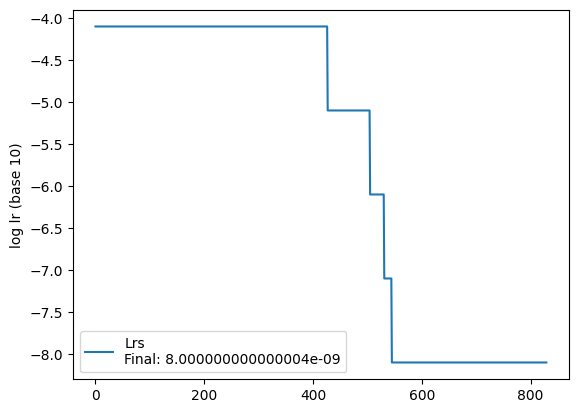

100%|██████████| 391/391 [01:48<00:00,  3.60it/s]


 Train accuracy: 98.0%, Avg loss: 0.060023, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:14<00:00, 109.44s/it]


 Test accuracy: 87.9%, Avg loss: 0.591910


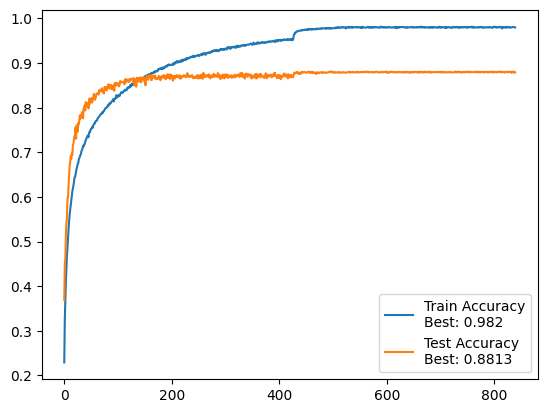

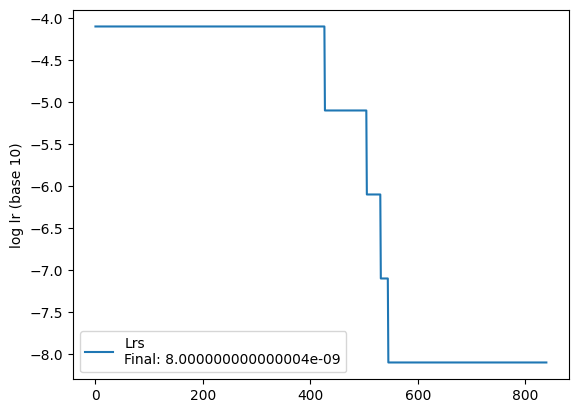

100%|██████████| 391/391 [01:47<00:00,  3.63it/s]


 Train accuracy: 97.9%, Avg loss: 0.061537, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:14<00:00, 109.46s/it]


 Test accuracy: 88.0%, Avg loss: 0.590105


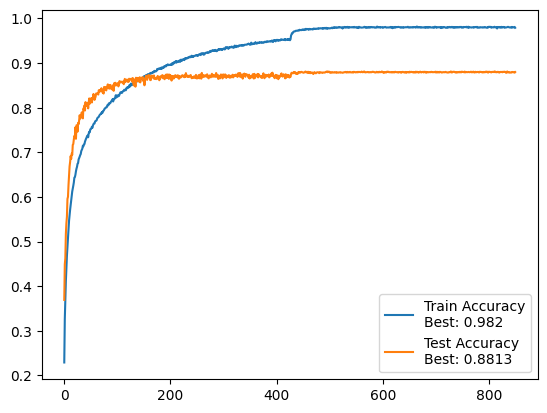

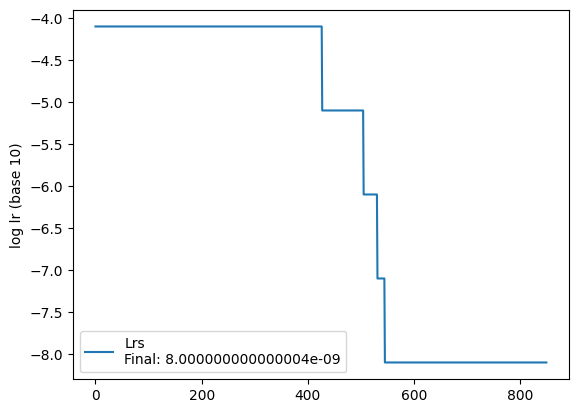

100%|██████████| 391/391 [01:48<00:00,  3.61it/s]


 Train accuracy: 98.0%, Avg loss: 0.058900, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:14<00:00, 109.44s/it]


 Test accuracy: 88.0%, Avg loss: 0.591027


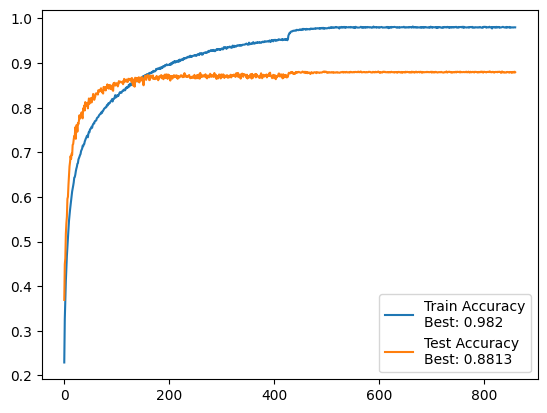

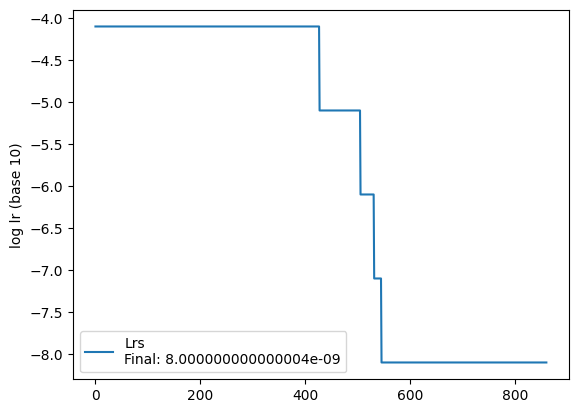

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.058915, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:59<00:00, 107.94s/it]


 Test accuracy: 88.0%, Avg loss: 0.592442


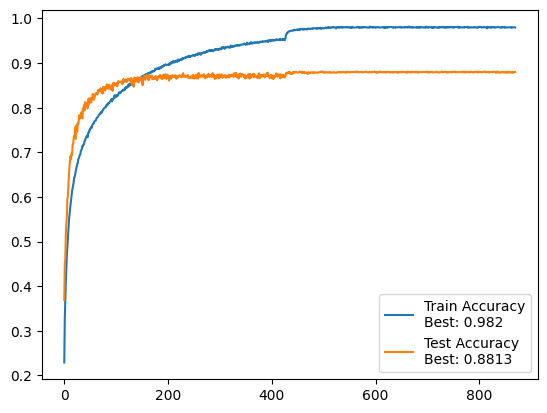

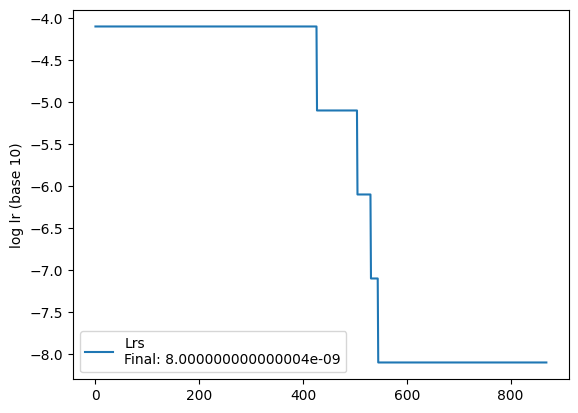

100%|██████████| 391/391 [01:45<00:00,  3.69it/s]


 Train accuracy: 98.0%, Avg loss: 0.057951, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:55<00:00, 107.59s/it]


 Test accuracy: 88.1%, Avg loss: 0.594328


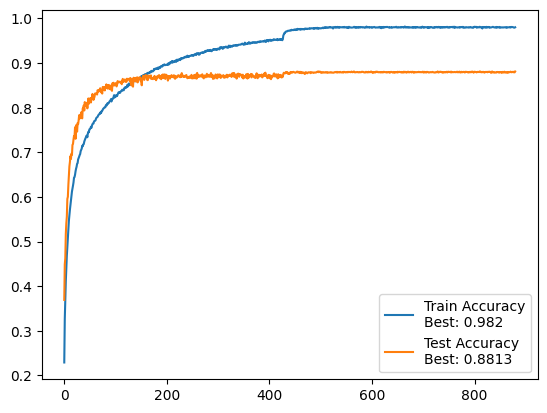

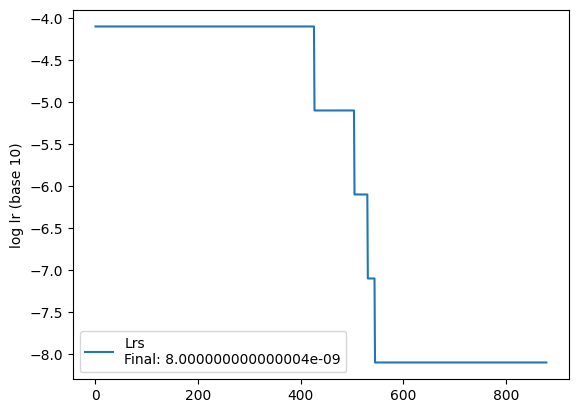

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 97.9%, Avg loss: 0.061843, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:57<00:00, 107.74s/it]


 Test accuracy: 87.8%, Avg loss: 0.594405


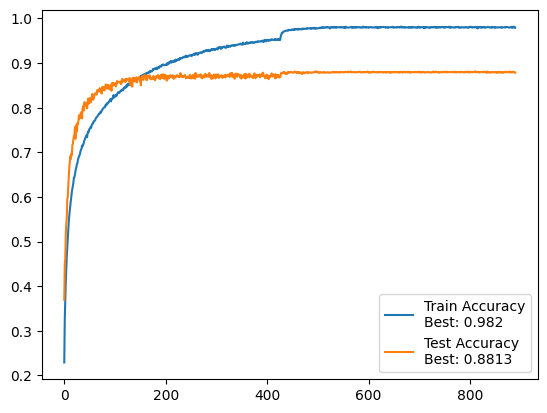

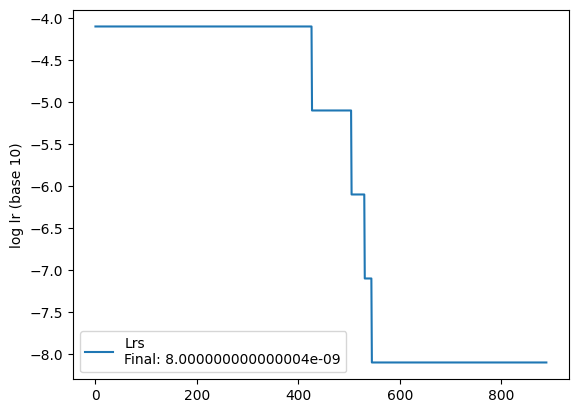

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.058430, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:57<00:00, 107.75s/it]


 Test accuracy: 88.0%, Avg loss: 0.592657


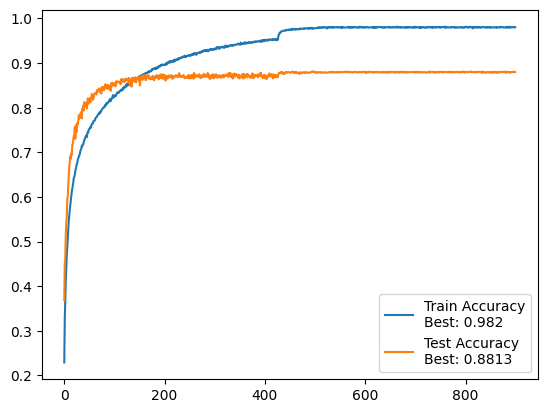

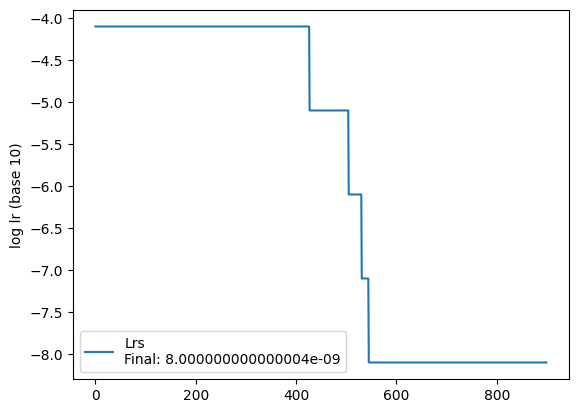

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 97.9%, Avg loss: 0.062048, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:58<00:00, 107.88s/it]


 Test accuracy: 88.0%, Avg loss: 0.590017


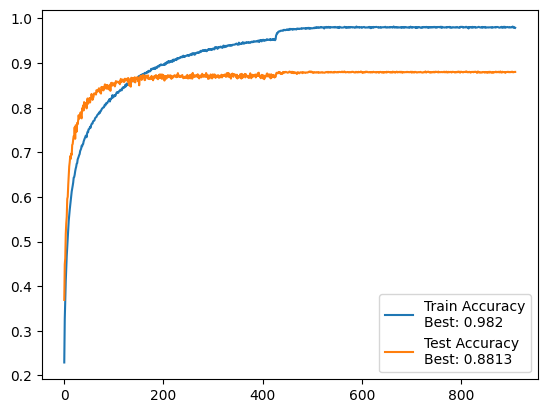

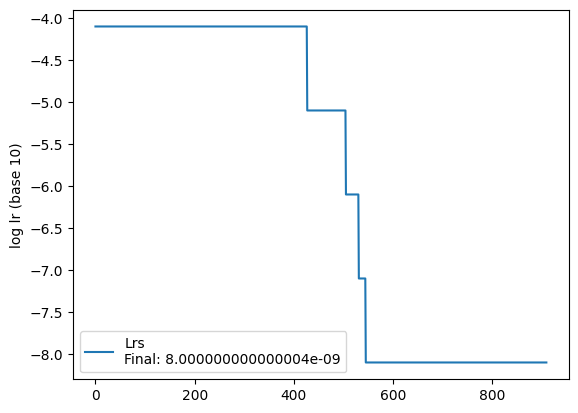

100%|██████████| 391/391 [01:46<00:00,  3.69it/s]


 Train accuracy: 98.0%, Avg loss: 0.058694, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:57<00:00, 107.78s/it]


 Test accuracy: 88.0%, Avg loss: 0.589694


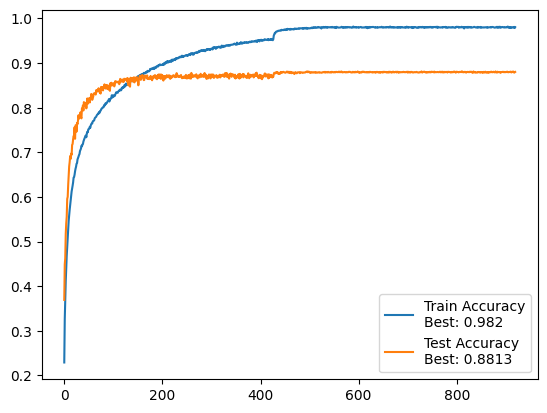

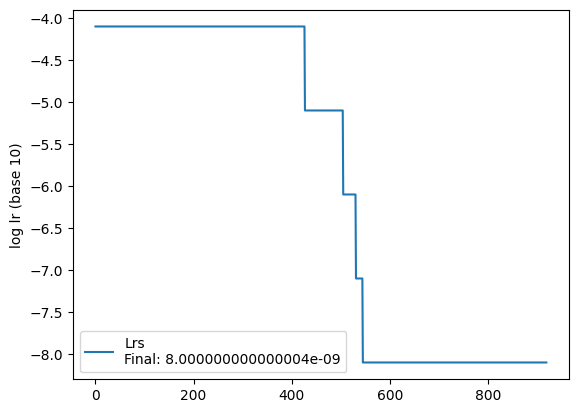

100%|██████████| 391/391 [01:46<00:00,  3.67it/s]


 Train accuracy: 98.1%, Avg loss: 0.058407, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:59<00:00, 107.92s/it]


 Test accuracy: 88.0%, Avg loss: 0.589633


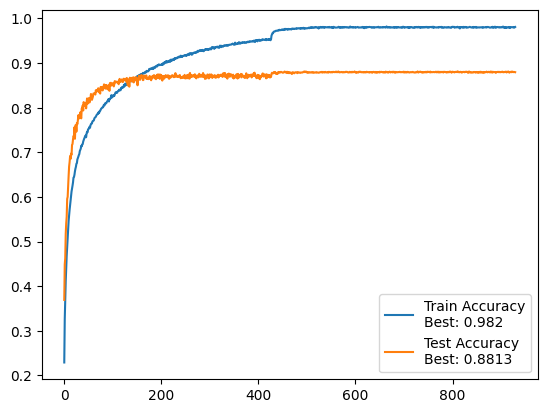

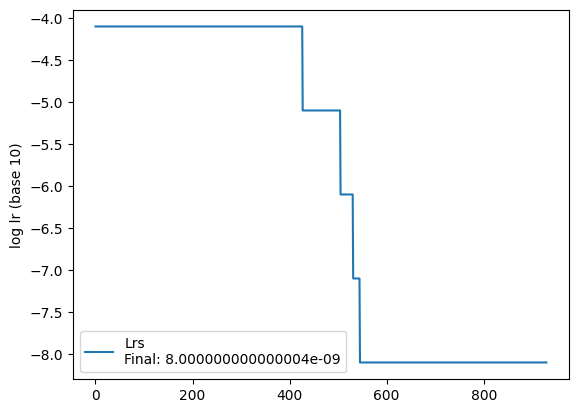

100%|██████████| 391/391 [01:46<00:00,  3.67it/s]


 Train accuracy: 97.9%, Avg loss: 0.062788, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:58<00:00, 107.85s/it]


 Test accuracy: 88.0%, Avg loss: 0.593391


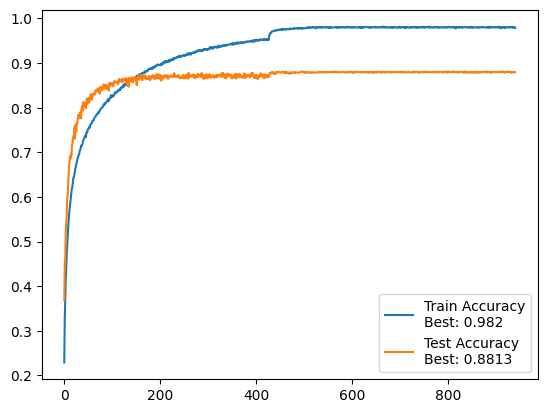

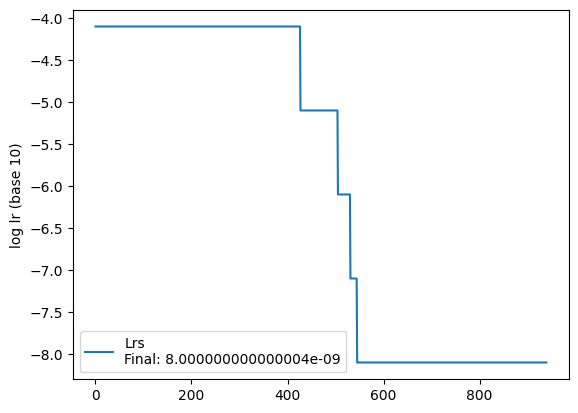

100%|██████████| 391/391 [01:46<00:00,  3.67it/s]


 Train accuracy: 98.0%, Avg loss: 0.058108, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:58<00:00, 107.83s/it]


 Test accuracy: 88.0%, Avg loss: 0.594894


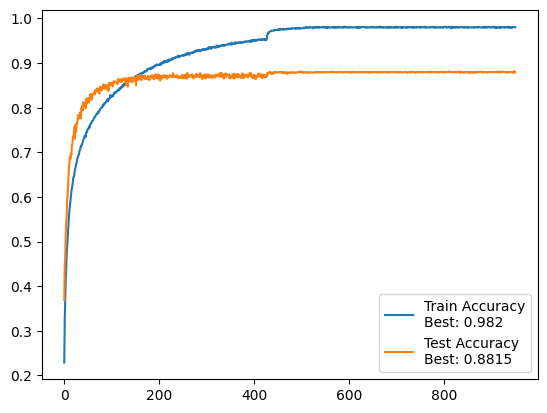

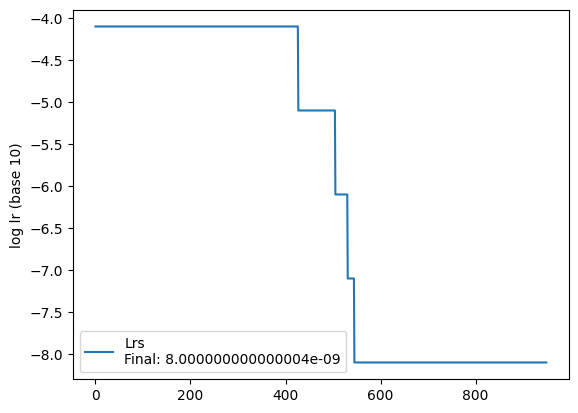

100%|██████████| 391/391 [01:46<00:00,  3.69it/s]


 Train accuracy: 98.0%, Avg loss: 0.057721, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:57<00:00, 107.73s/it]


 Test accuracy: 88.0%, Avg loss: 0.588838


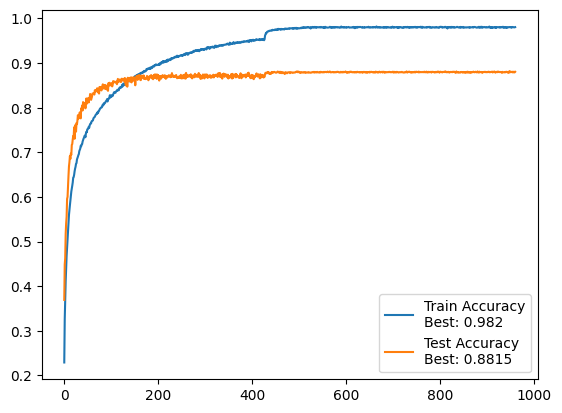

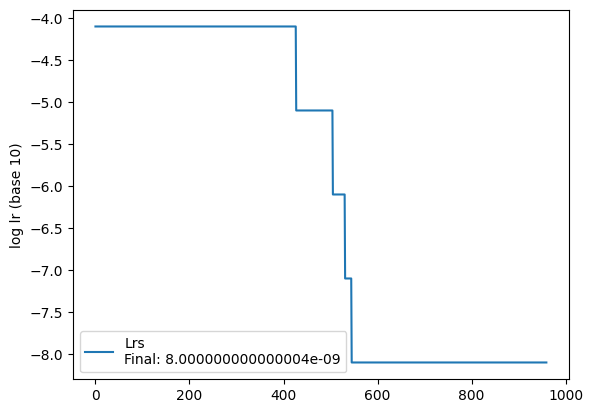

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.059767, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:57<00:00, 107.78s/it]


 Test accuracy: 87.9%, Avg loss: 0.591838


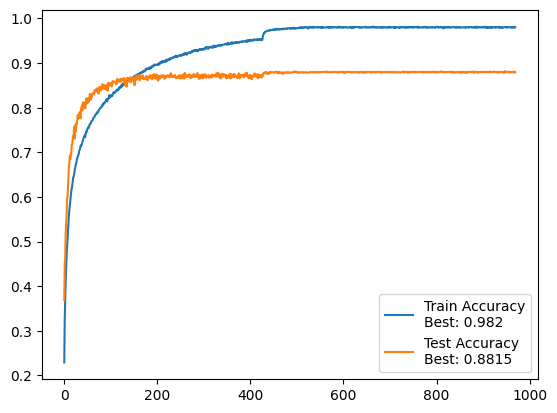

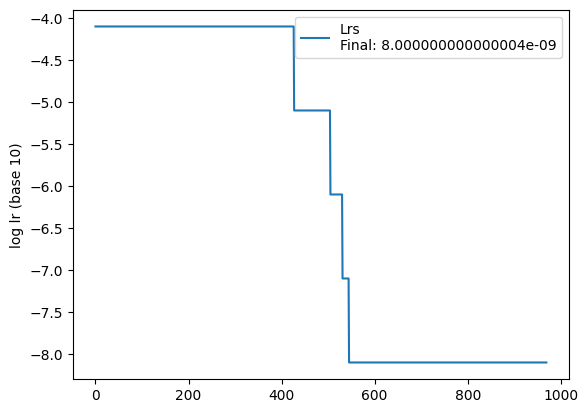

100%|██████████| 391/391 [01:46<00:00,  3.69it/s]


 Train accuracy: 98.1%, Avg loss: 0.057444, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:58<00:00, 107.81s/it]


 Test accuracy: 87.9%, Avg loss: 0.591858


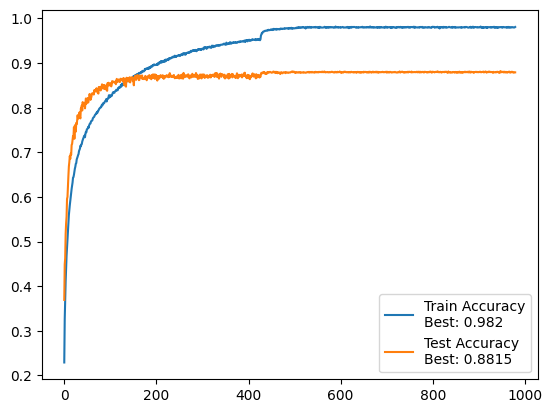

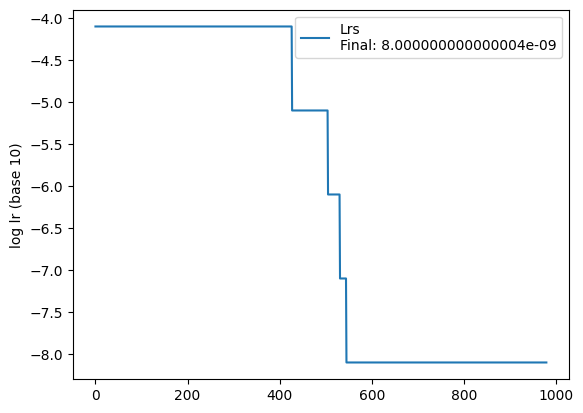

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.058635, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:59<00:00, 107.91s/it]


 Test accuracy: 87.9%, Avg loss: 0.592743


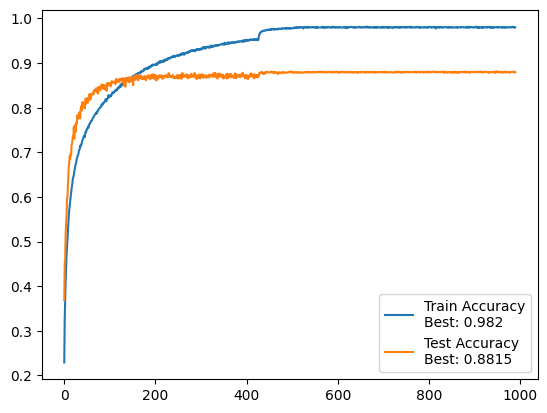

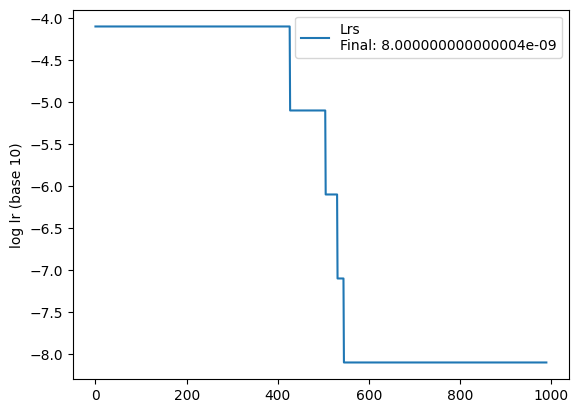

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.059558, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:57<00:00, 107.75s/it]


 Test accuracy: 88.0%, Avg loss: 0.591379


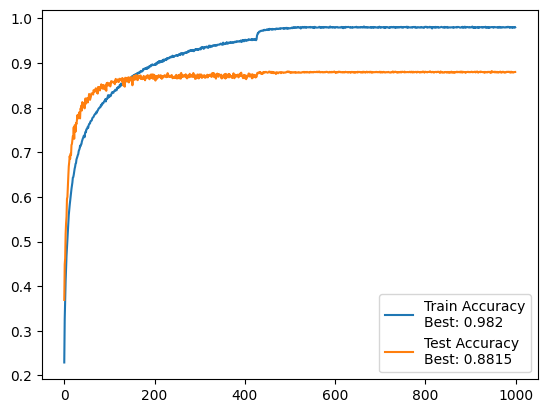

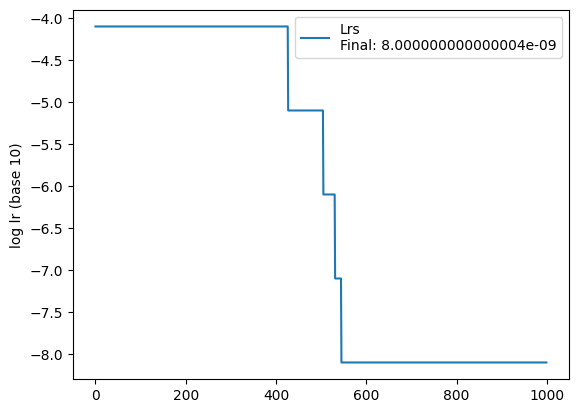

100%|██████████| 391/391 [01:46<00:00,  3.67it/s]


 Train accuracy: 98.0%, Avg loss: 0.058552, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:59<00:00, 107.94s/it]


 Test accuracy: 88.0%, Avg loss: 0.595614


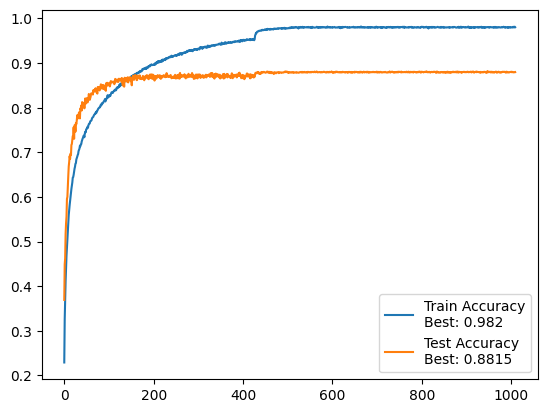

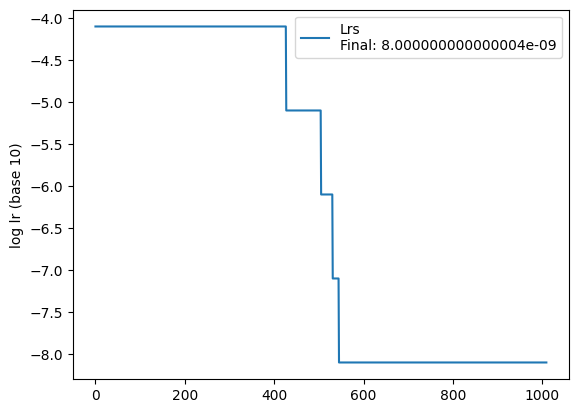

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 97.9%, Avg loss: 0.059636, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:59<00:00, 107.96s/it]


 Test accuracy: 88.0%, Avg loss: 0.589781


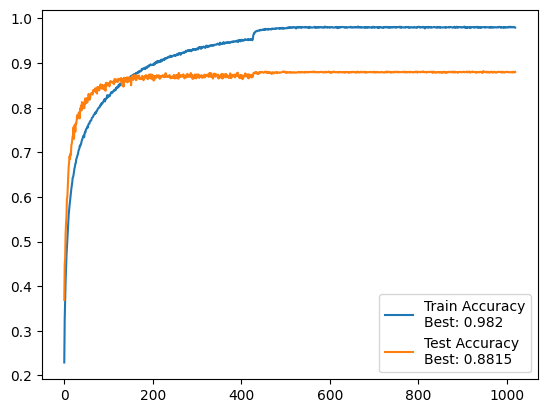

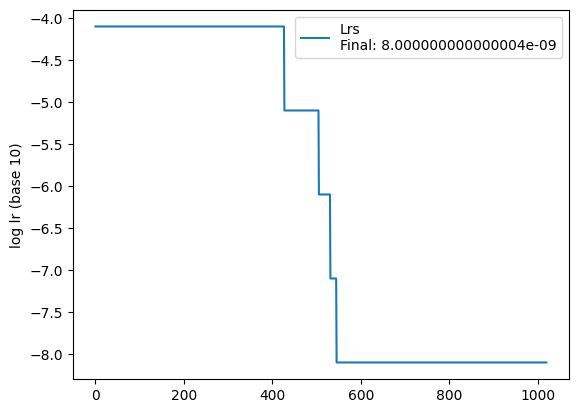

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.059385, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:58<00:00, 107.83s/it]


 Test accuracy: 87.9%, Avg loss: 0.595348


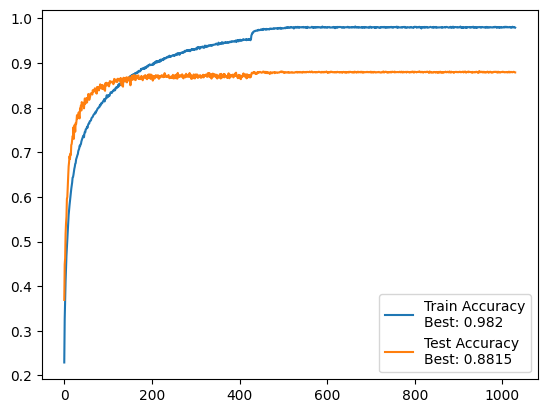

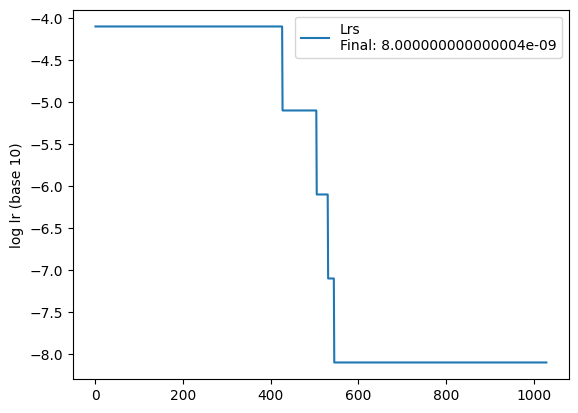

100%|██████████| 391/391 [01:46<00:00,  3.67it/s]


 Train accuracy: 98.0%, Avg loss: 0.058638, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:02<00:00, 108.28s/it]


 Test accuracy: 87.9%, Avg loss: 0.590521


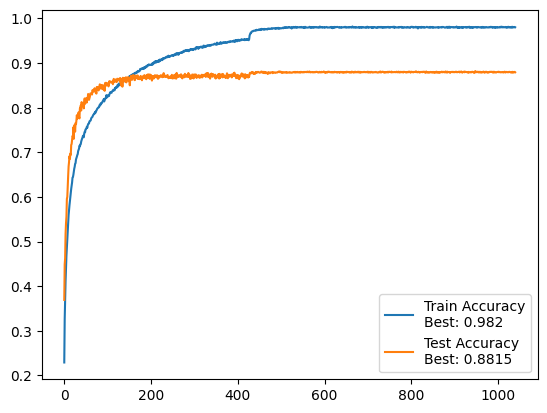

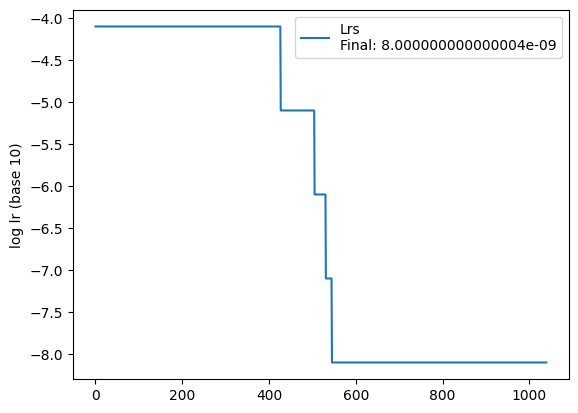

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.058196, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:58<00:00, 107.81s/it]


 Test accuracy: 88.2%, Avg loss: 0.590732


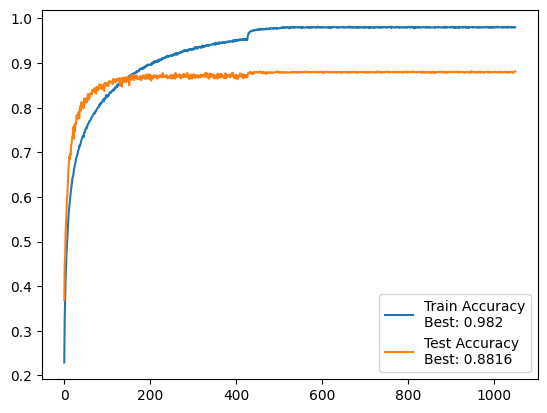

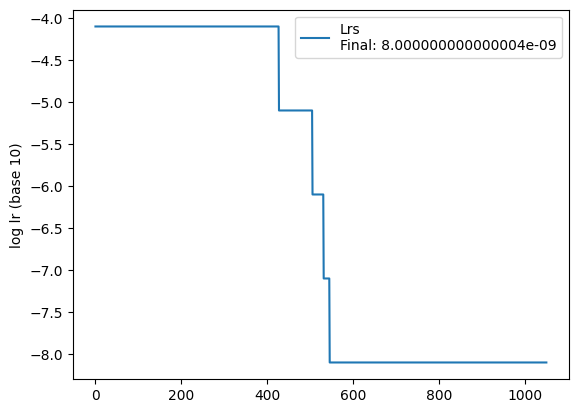

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.057966, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:58<00:00, 107.84s/it]


 Test accuracy: 88.1%, Avg loss: 0.589492


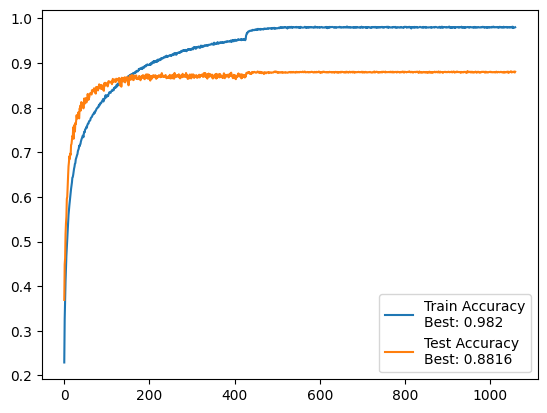

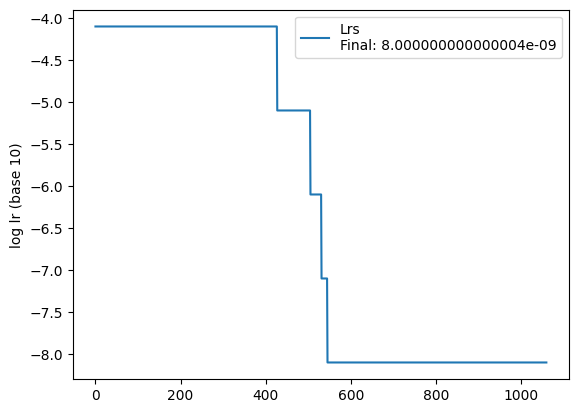

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.1%, Avg loss: 0.057792, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:59<00:00, 107.94s/it]


 Test accuracy: 87.9%, Avg loss: 0.595567


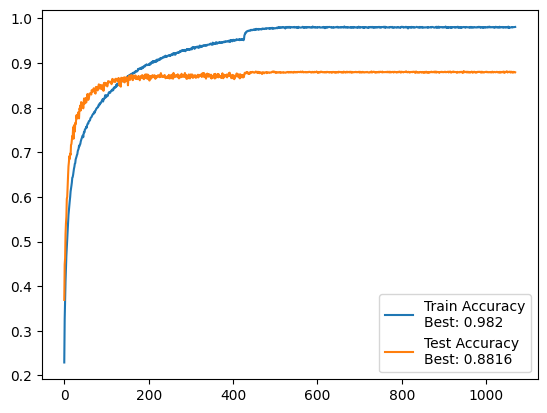

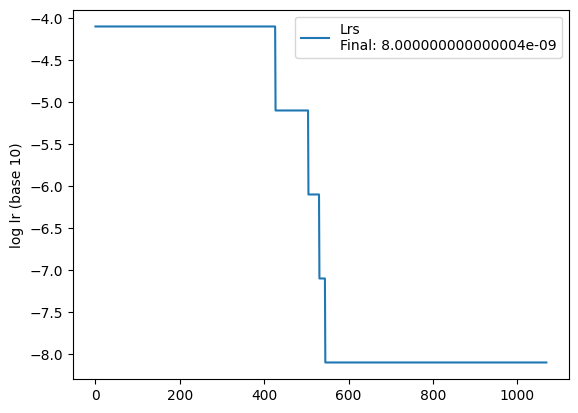

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.1%, Avg loss: 0.055987, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:57<00:00, 107.77s/it]


 Test accuracy: 87.9%, Avg loss: 0.595595


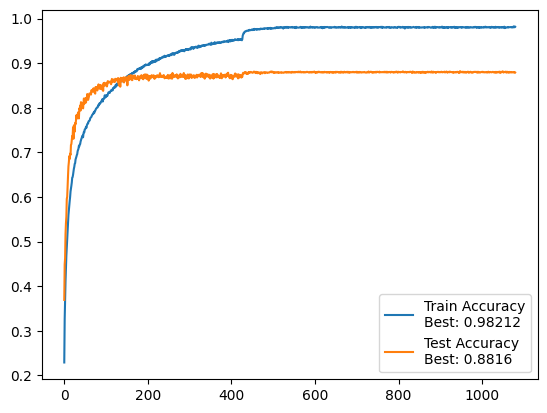

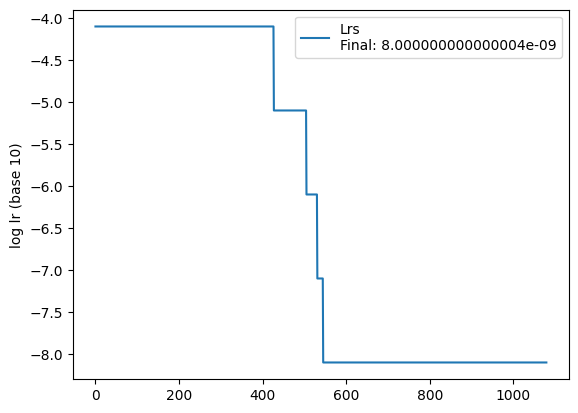

100%|██████████| 391/391 [01:48<00:00,  3.59it/s]


 Train accuracy: 98.1%, Avg loss: 0.056667, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:02<00:00, 108.22s/it]


 Test accuracy: 88.0%, Avg loss: 0.590150


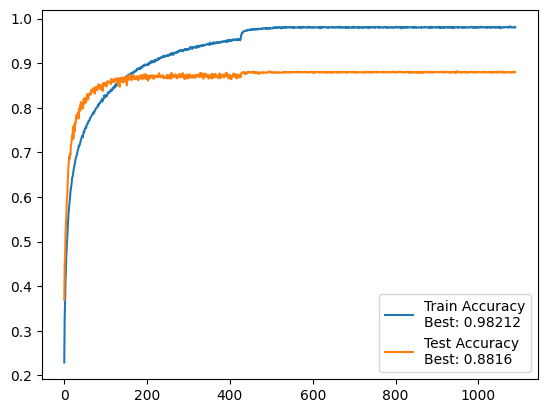

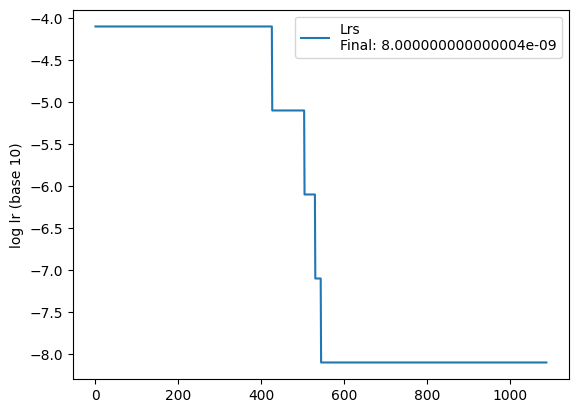

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.058682, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:58<00:00, 107.85s/it]


 Test accuracy: 88.0%, Avg loss: 0.593587


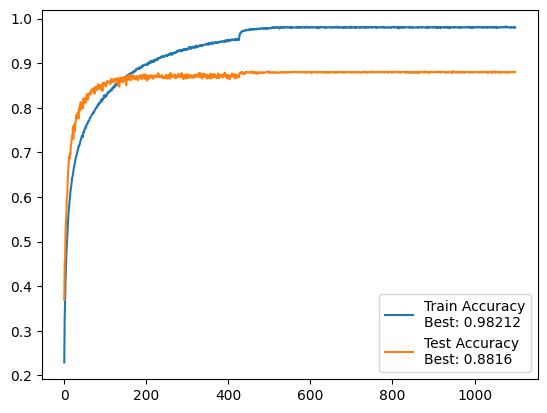

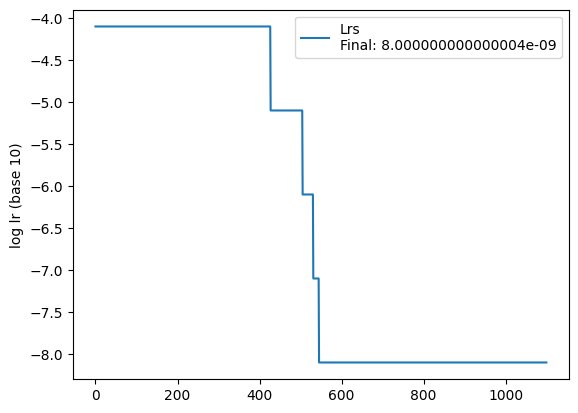

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.061138, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:59<00:00, 107.91s/it]


 Test accuracy: 88.0%, Avg loss: 0.591426


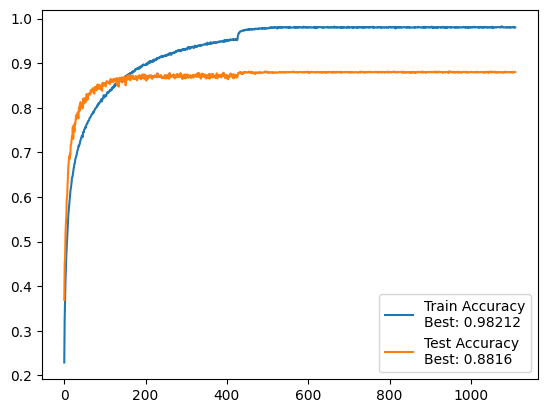

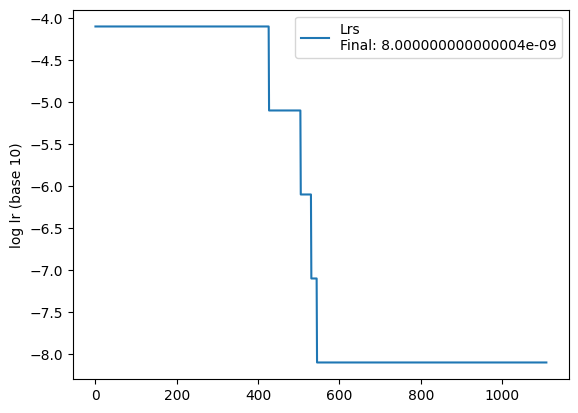

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.060691, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:59<00:00, 107.95s/it]


 Test accuracy: 88.0%, Avg loss: 0.590249


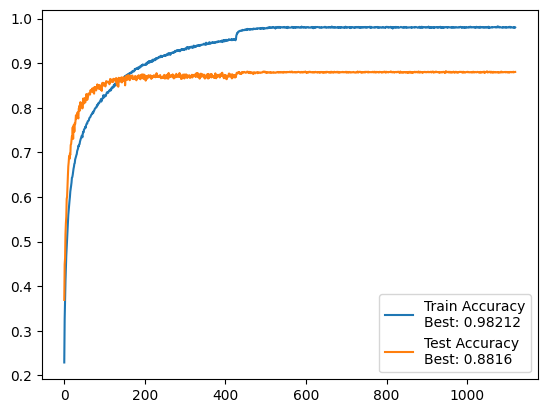

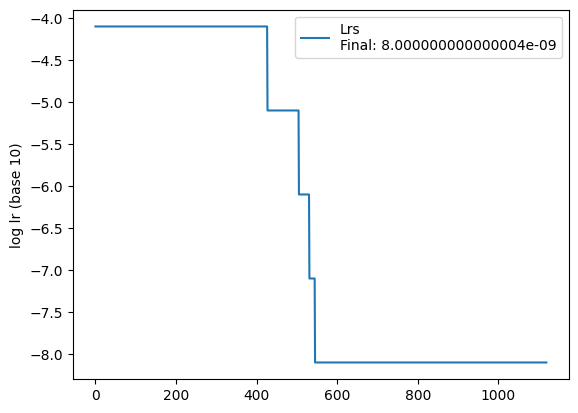

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.059215, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:58<00:00, 107.85s/it]


 Test accuracy: 87.9%, Avg loss: 0.594126


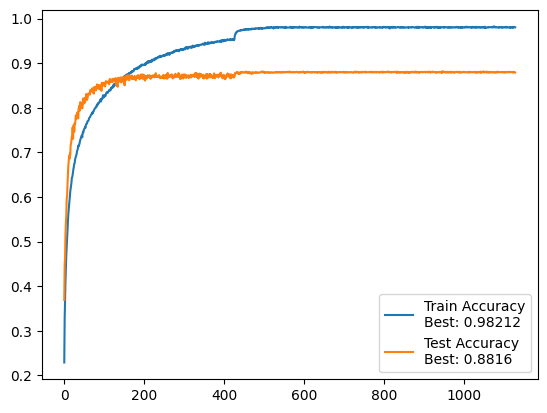

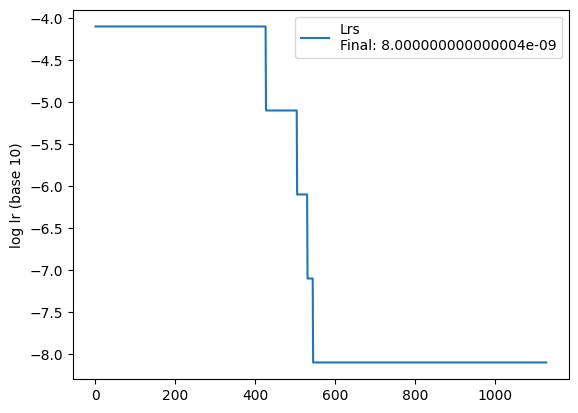

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.2%, Avg loss: 0.055672, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:56<00:00, 107.68s/it]


 Test accuracy: 87.9%, Avg loss: 0.594317


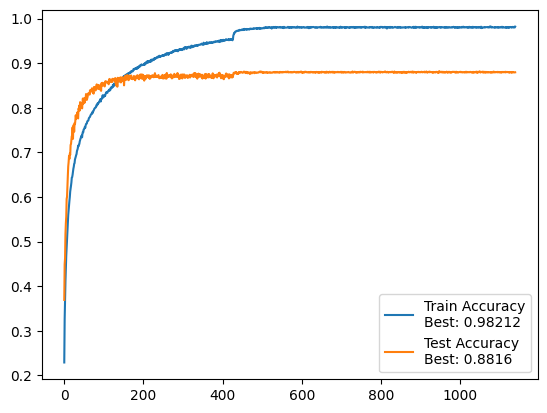

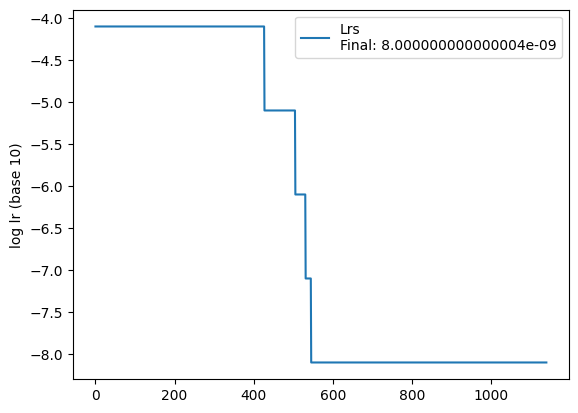

100%|██████████| 391/391 [01:46<00:00,  3.67it/s]


 Train accuracy: 98.0%, Avg loss: 0.059358, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:58<00:00, 107.81s/it]


 Test accuracy: 88.1%, Avg loss: 0.589716


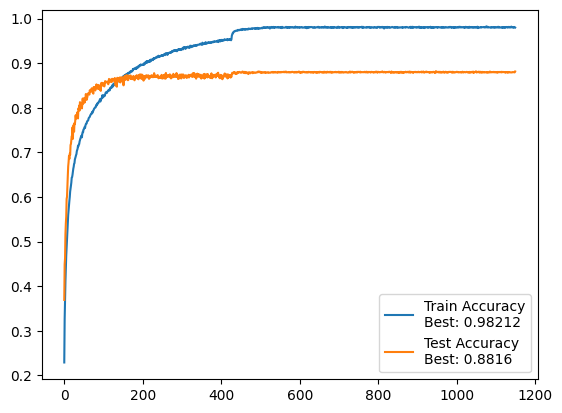

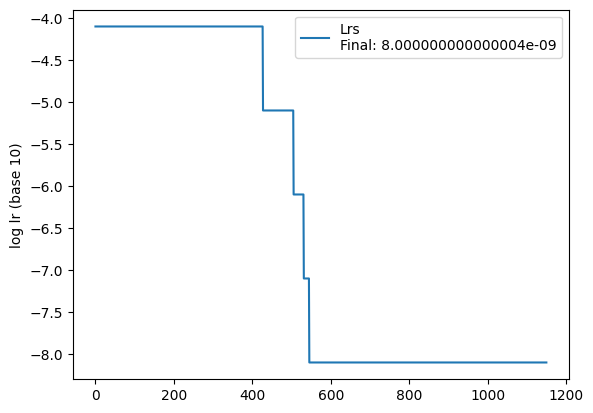

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.061957, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:58<00:00, 107.89s/it]


 Test accuracy: 88.0%, Avg loss: 0.591860


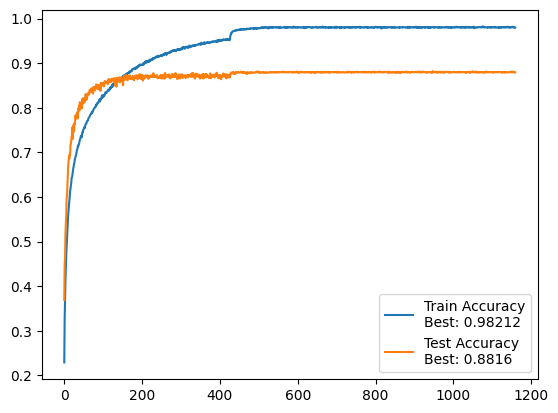

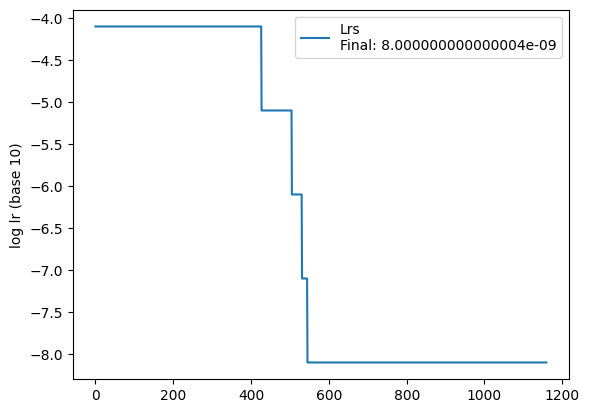

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.1%, Avg loss: 0.057321, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:57<00:00, 107.73s/it]


 Test accuracy: 88.0%, Avg loss: 0.591283


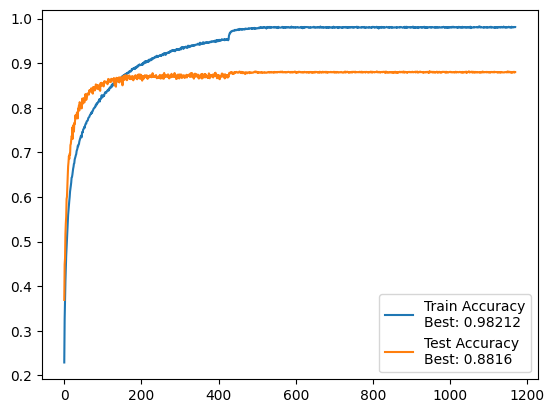

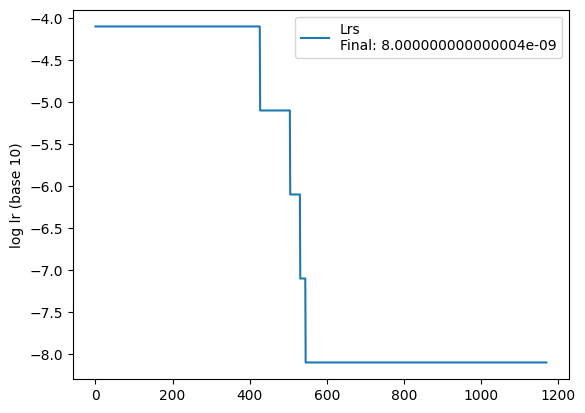

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 97.9%, Avg loss: 0.060180, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:59<00:00, 107.91s/it]


 Test accuracy: 87.9%, Avg loss: 0.592090


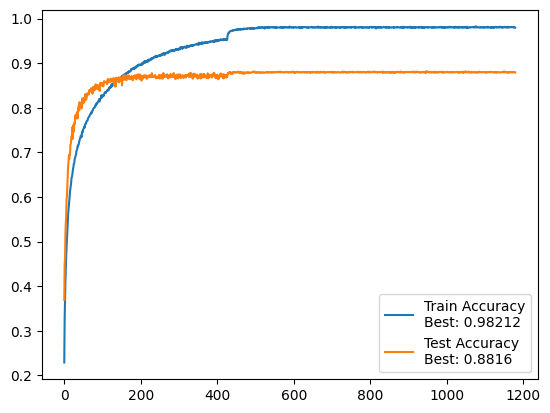

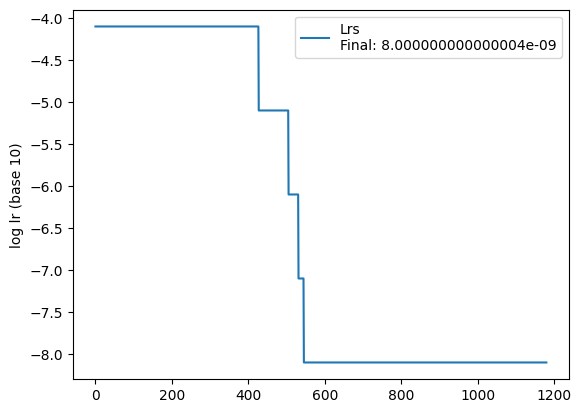

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.058633, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:58<00:00, 107.87s/it]


 Test accuracy: 88.0%, Avg loss: 0.588102


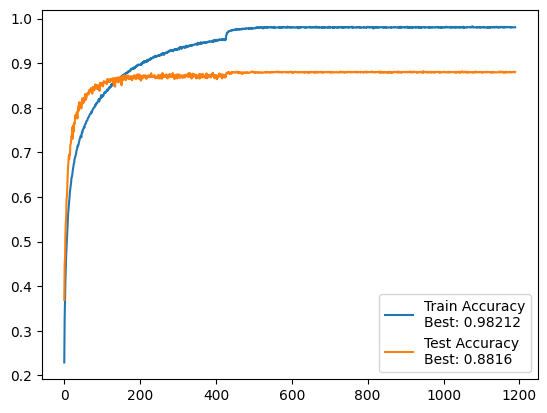

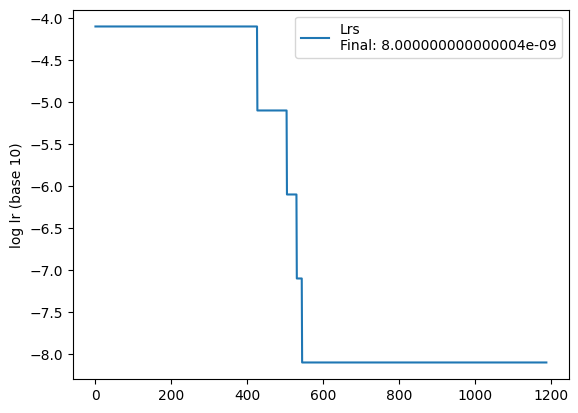

100%|██████████| 391/391 [01:46<00:00,  3.66it/s]


 Train accuracy: 98.1%, Avg loss: 0.059865, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:59<00:00, 107.94s/it]


 Test accuracy: 88.0%, Avg loss: 0.591510


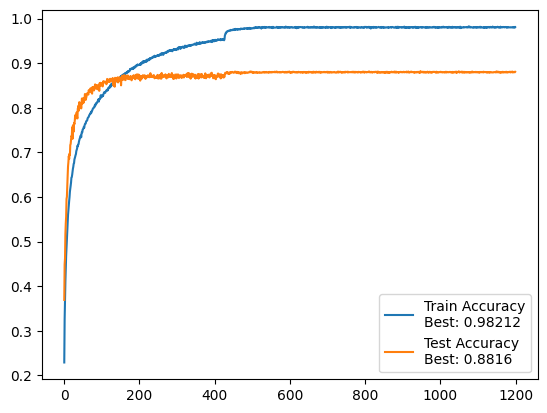

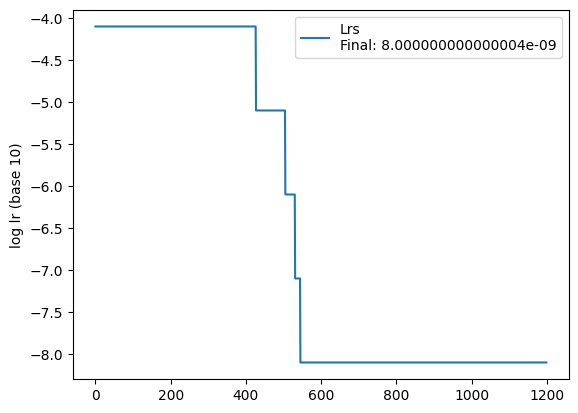

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.059251, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:59<00:00, 107.95s/it]


 Test accuracy: 88.0%, Avg loss: 0.592467


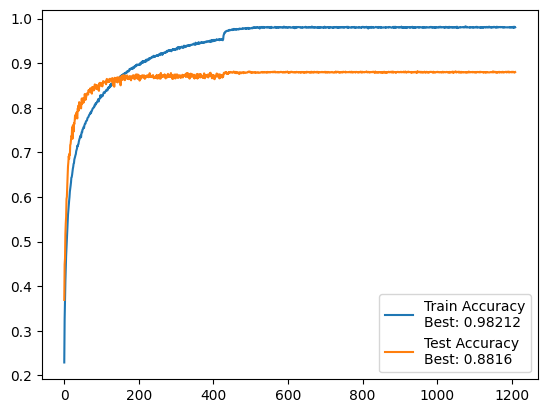

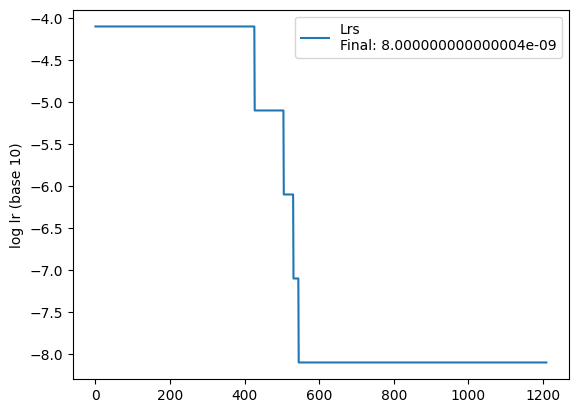

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.061229, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:58<00:00, 107.85s/it]


 Test accuracy: 87.9%, Avg loss: 0.593491


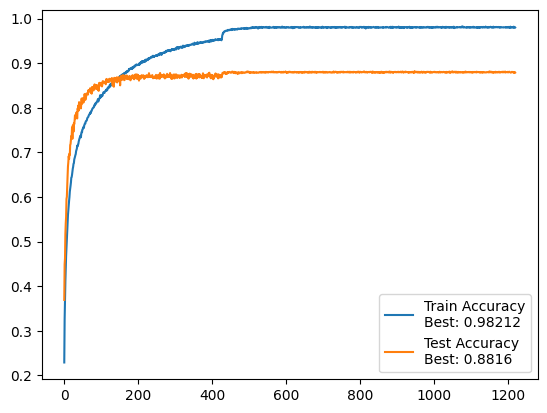

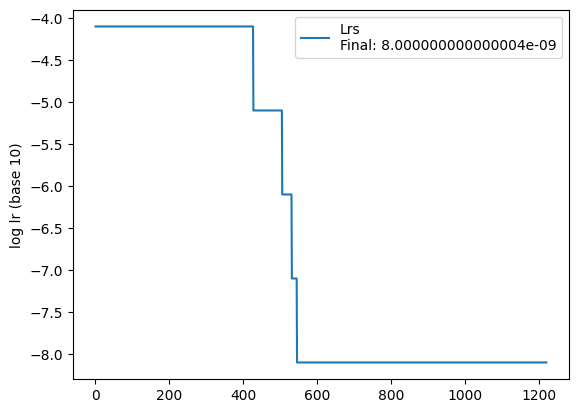

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.060180, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:57<00:00, 107.79s/it]


 Test accuracy: 88.1%, Avg loss: 0.592932


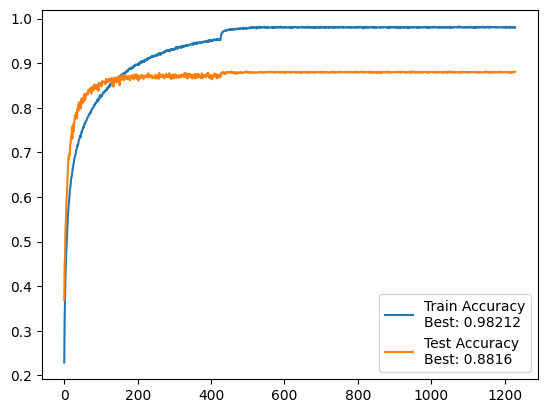

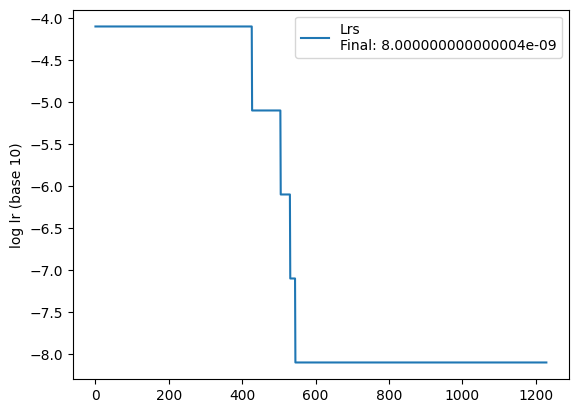

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.1%, Avg loss: 0.056073, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:56<00:00, 107.68s/it]


 Test accuracy: 87.9%, Avg loss: 0.595219


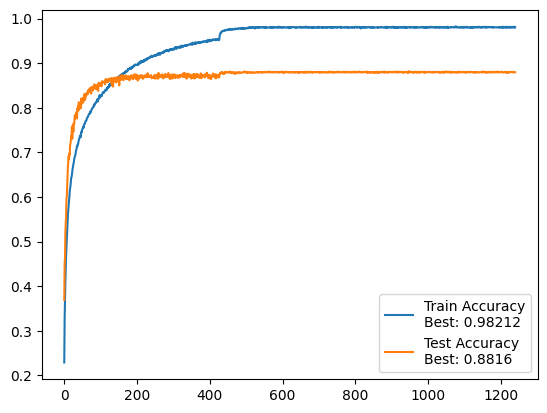

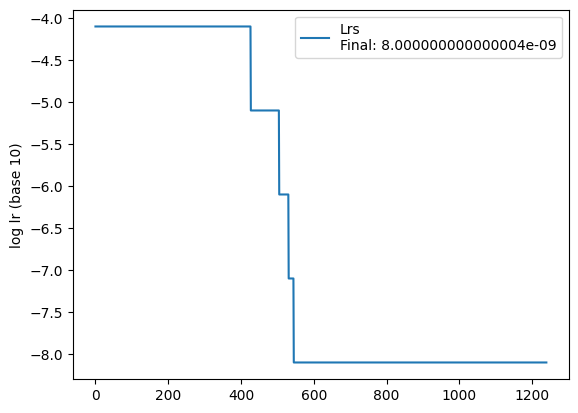

100%|██████████| 391/391 [01:46<00:00,  3.67it/s]


 Train accuracy: 98.0%, Avg loss: 0.058991, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:58<00:00, 107.83s/it]


 Test accuracy: 88.0%, Avg loss: 0.593215


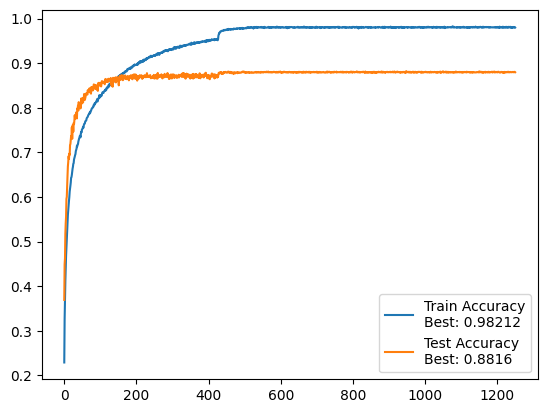

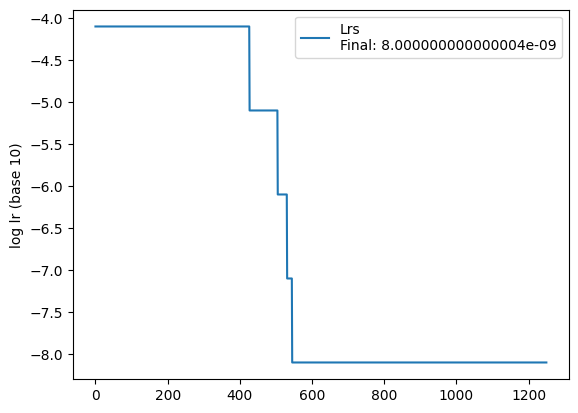

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.059111, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:57<00:00, 107.78s/it]


 Test accuracy: 87.9%, Avg loss: 0.596635


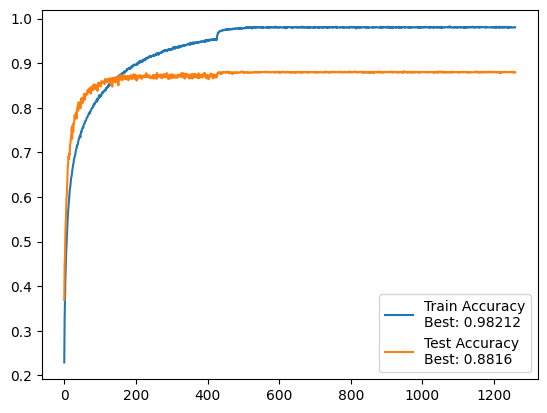

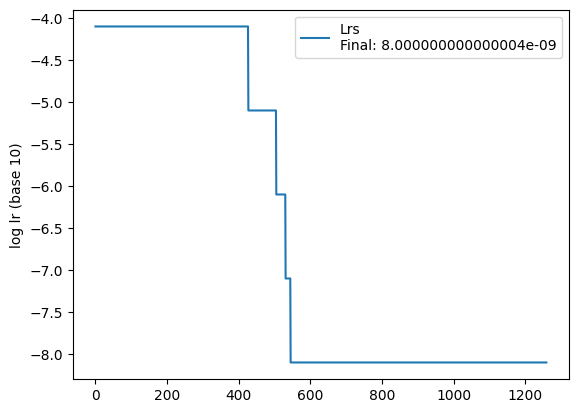

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.1%, Avg loss: 0.056425, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:58<00:00, 107.89s/it]


 Test accuracy: 88.0%, Avg loss: 0.589732


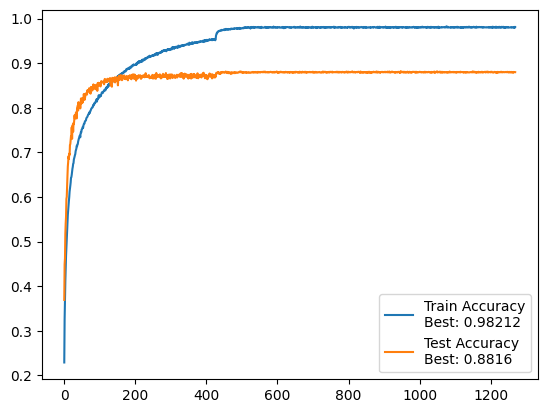

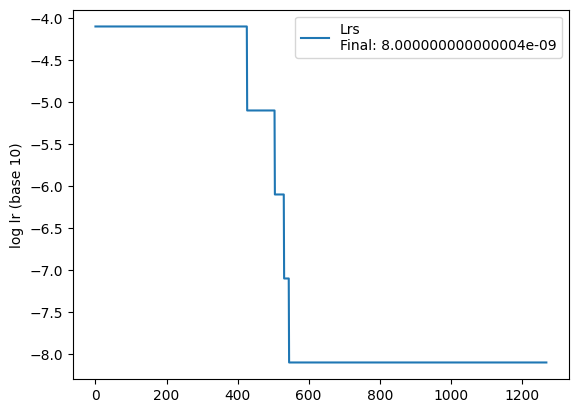

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 97.9%, Avg loss: 0.062276, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:58<00:00, 107.88s/it]


 Test accuracy: 88.0%, Avg loss: 0.590729


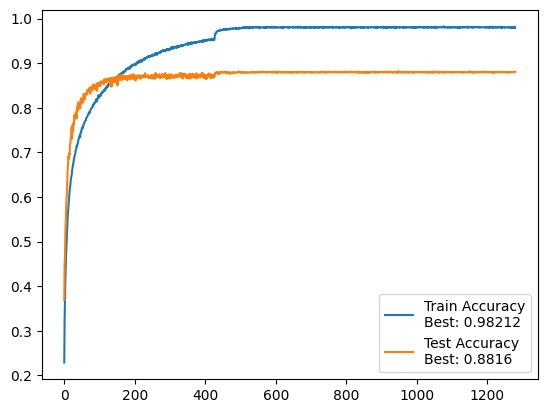

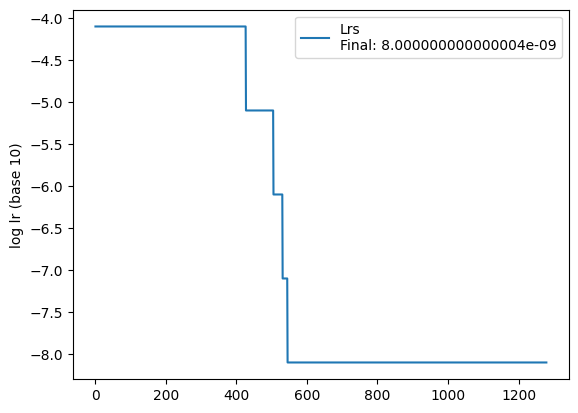

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.058887, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:59<00:00, 107.99s/it]


 Test accuracy: 88.0%, Avg loss: 0.597862


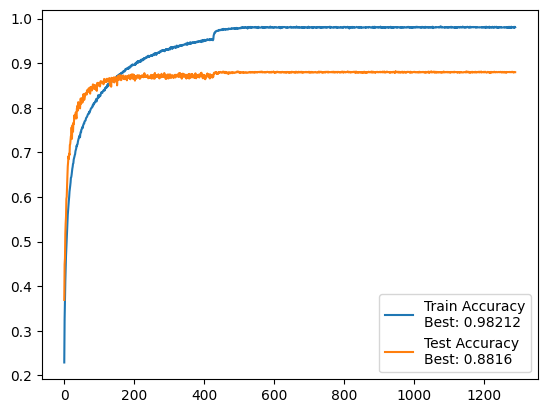

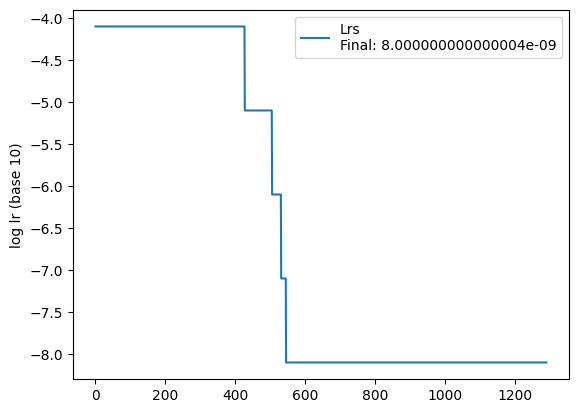

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.1%, Avg loss: 0.056188, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:00<00:00, 108.03s/it]


 Test accuracy: 87.9%, Avg loss: 0.592721


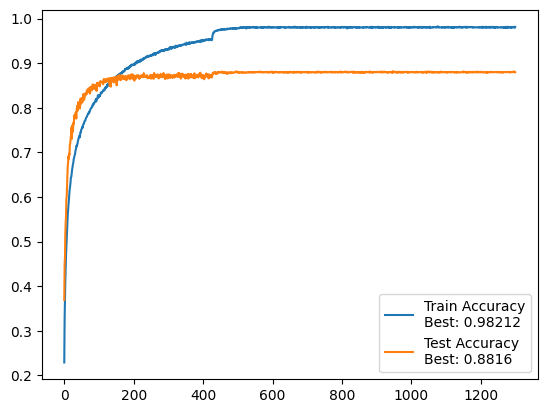

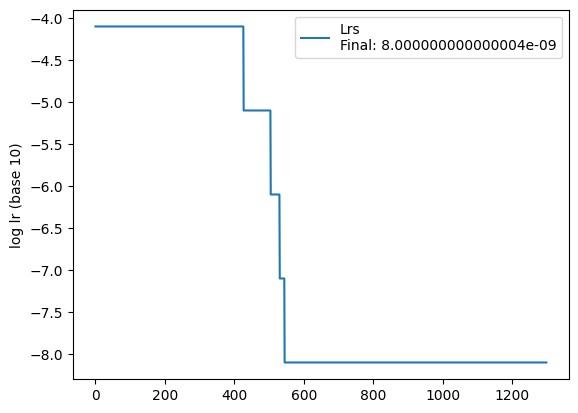

100%|██████████| 391/391 [01:46<00:00,  3.67it/s]


 Train accuracy: 98.0%, Avg loss: 0.058833, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:59<00:00, 107.96s/it]


 Test accuracy: 87.9%, Avg loss: 0.590704


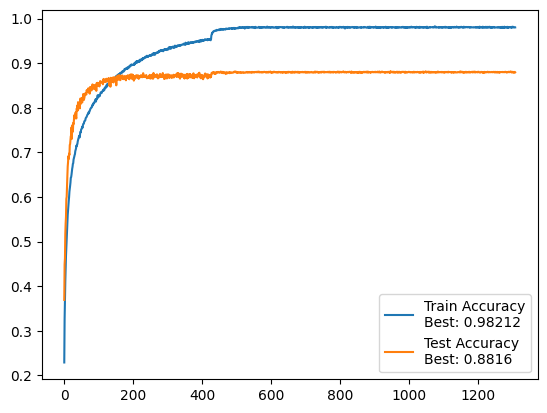

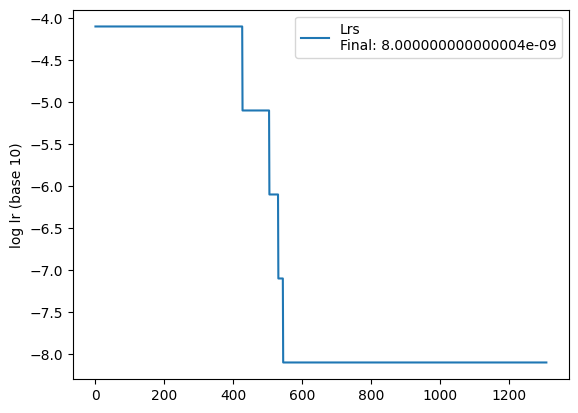

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 97.9%, Avg loss: 0.059981, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:59<00:00, 107.95s/it]


 Test accuracy: 88.0%, Avg loss: 0.588380


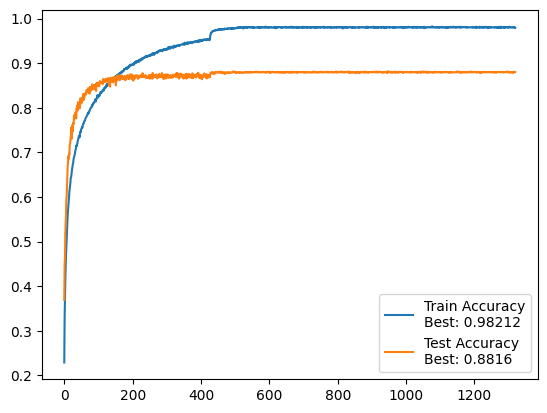

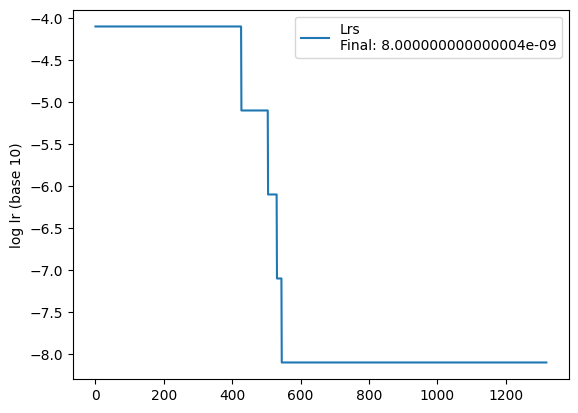

100%|██████████| 391/391 [01:46<00:00,  3.67it/s]


 Train accuracy: 98.1%, Avg loss: 0.057071, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:57<00:00, 107.79s/it]


 Test accuracy: 87.9%, Avg loss: 0.594518


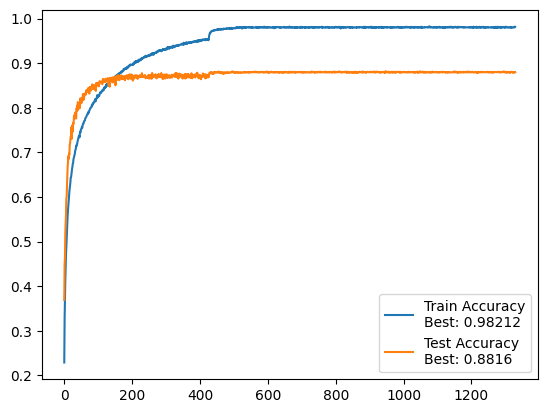

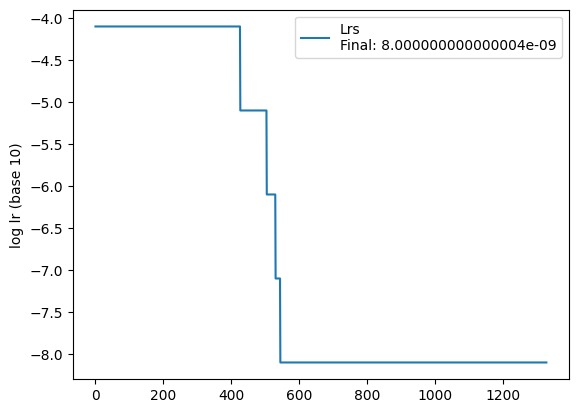

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.059914, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:58<00:00, 107.86s/it]


 Test accuracy: 88.0%, Avg loss: 0.593861


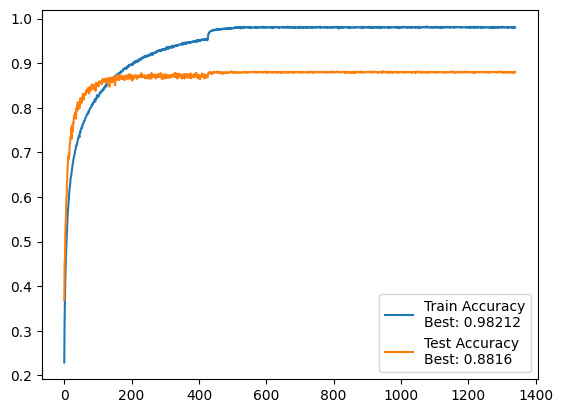

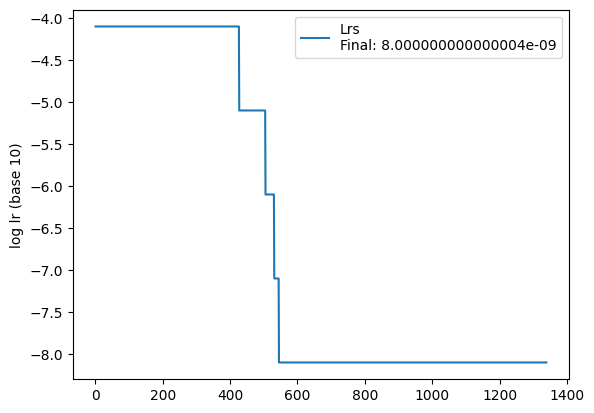

100%|██████████| 391/391 [01:46<00:00,  3.67it/s]


 Train accuracy: 98.0%, Avg loss: 0.060053, lr: 8.000000000000004e-09


100%|██████████| 10/10 [18:03<00:00, 108.37s/it]


 Test accuracy: 87.9%, Avg loss: 0.593184


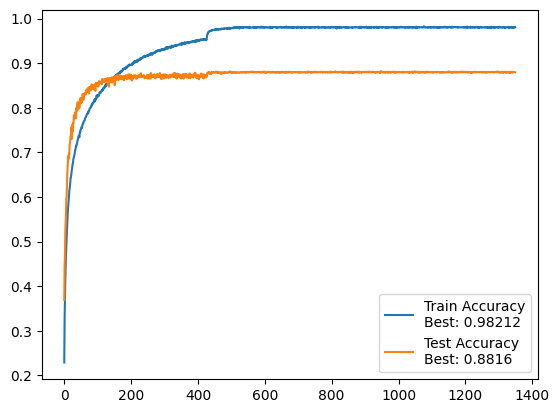

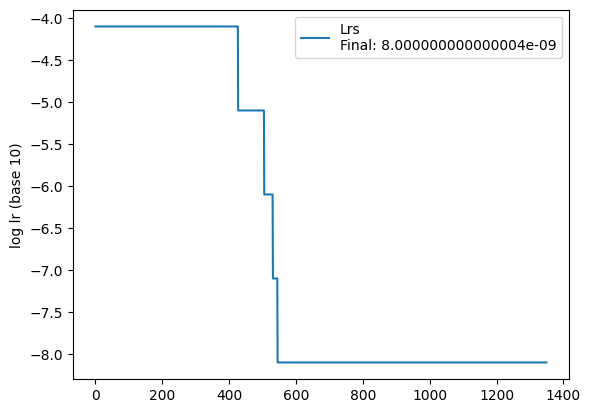

100%|██████████| 391/391 [01:46<00:00,  3.67it/s]


 Train accuracy: 97.9%, Avg loss: 0.060607, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:59<00:00, 107.97s/it]


 Test accuracy: 87.9%, Avg loss: 0.596495


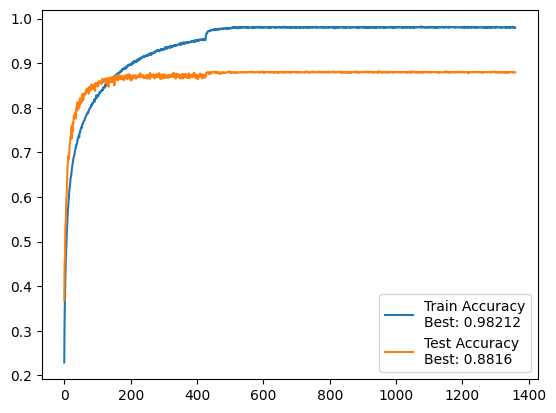

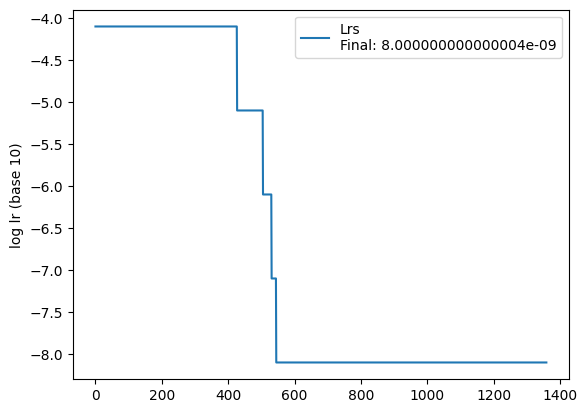

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.061674, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:59<00:00, 107.92s/it]


 Test accuracy: 88.1%, Avg loss: 0.589962


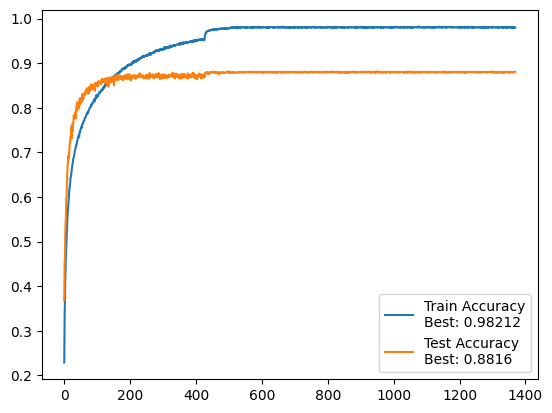

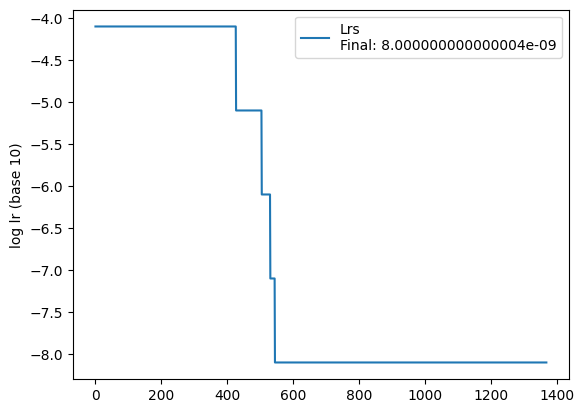

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.060186, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:58<00:00, 107.81s/it]


 Test accuracy: 88.0%, Avg loss: 0.591020


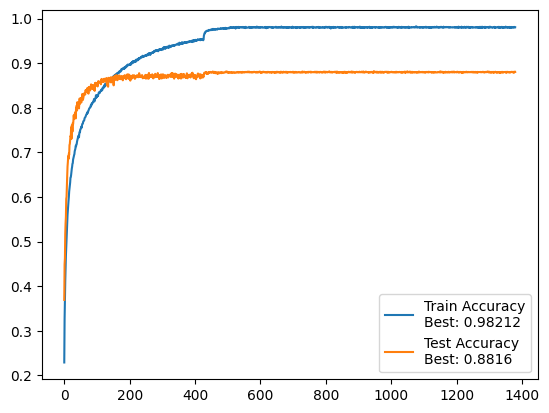

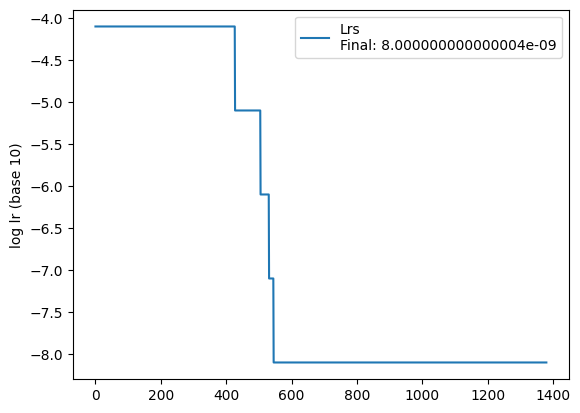

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.1%, Avg loss: 0.056657, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:59<00:00, 107.94s/it]


 Test accuracy: 88.0%, Avg loss: 0.596091


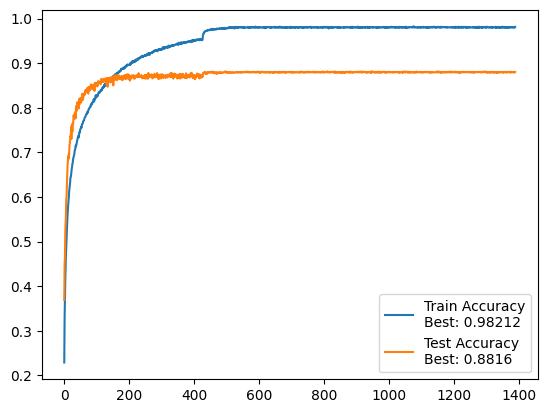

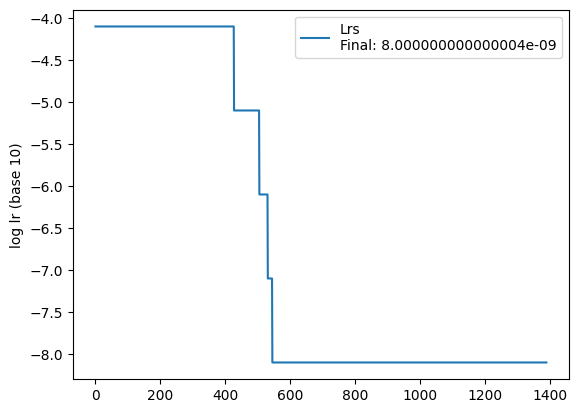

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.059715, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:58<00:00, 107.84s/it]


 Test accuracy: 88.0%, Avg loss: 0.593317


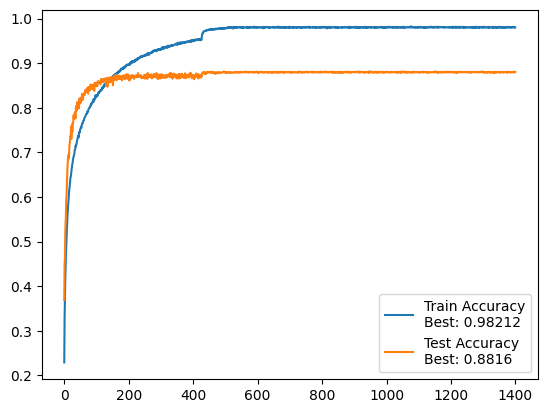

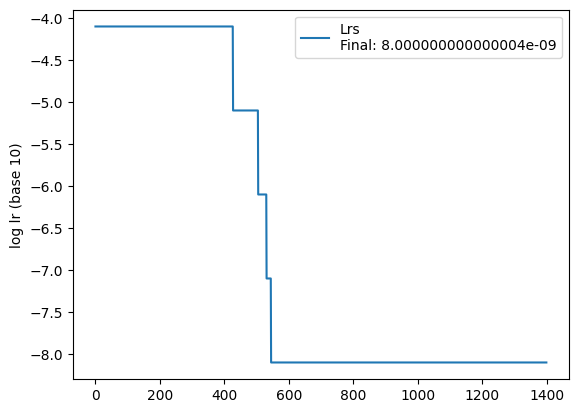

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.060265, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:58<00:00, 107.81s/it]


 Test accuracy: 88.0%, Avg loss: 0.593395


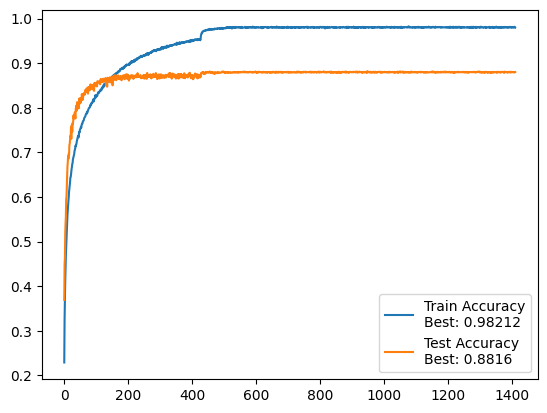

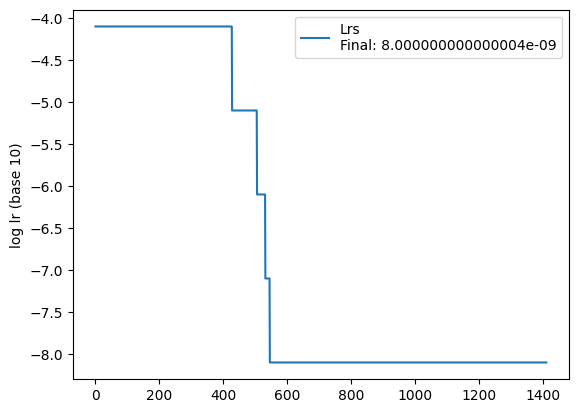

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.1%, Avg loss: 0.056661, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:55<00:00, 107.56s/it]


 Test accuracy: 87.8%, Avg loss: 0.593161


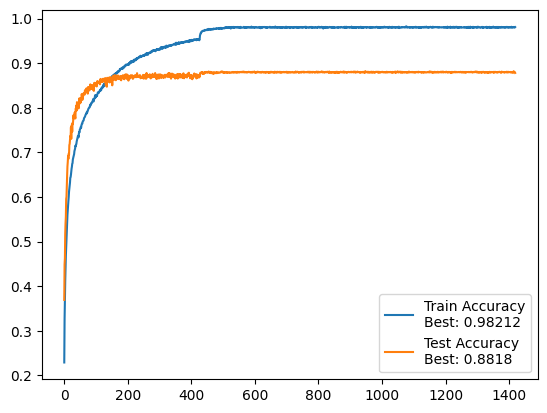

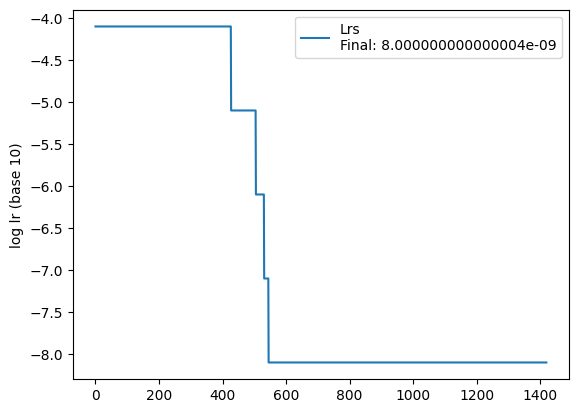

100%|██████████| 391/391 [01:46<00:00,  3.67it/s]


 Train accuracy: 98.1%, Avg loss: 0.057758, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:58<00:00, 107.83s/it]


 Test accuracy: 88.0%, Avg loss: 0.593999


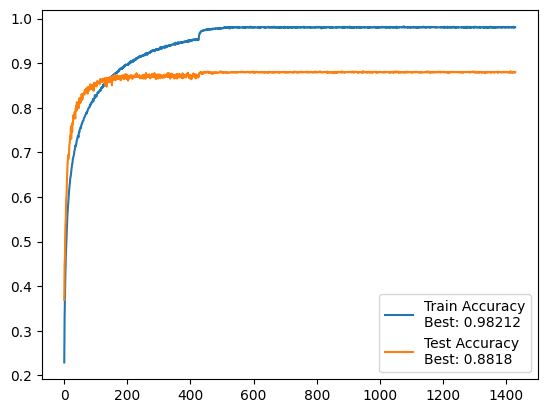

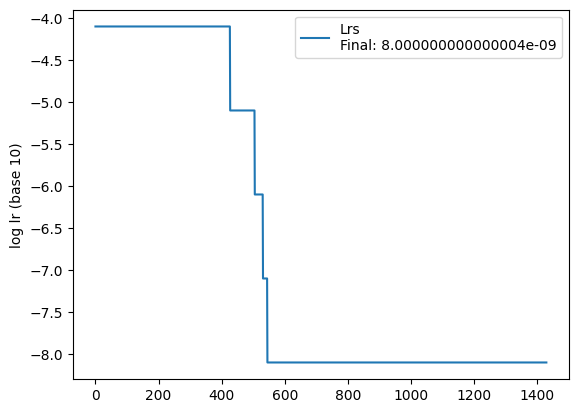

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.058318, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:57<00:00, 107.75s/it]


 Test accuracy: 87.9%, Avg loss: 0.592294


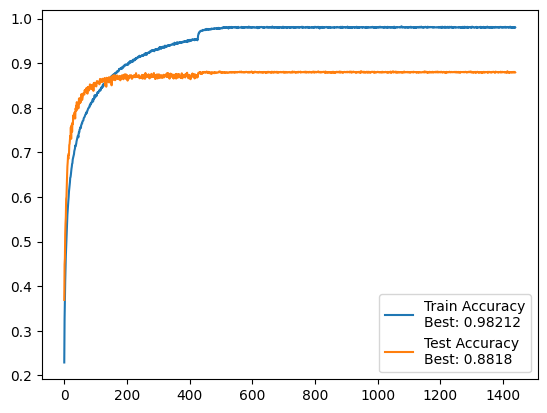

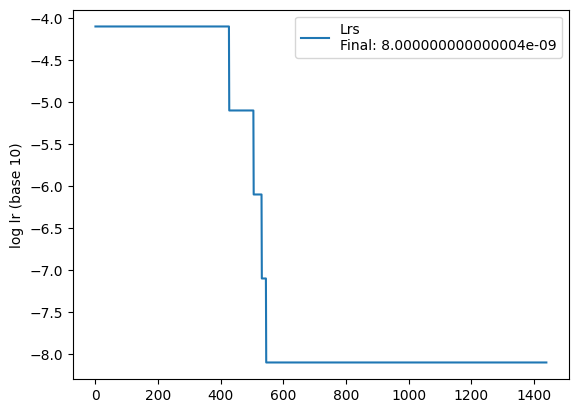

100%|██████████| 391/391 [01:46<00:00,  3.67it/s]


 Train accuracy: 98.0%, Avg loss: 0.058744, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:57<00:00, 107.74s/it]


 Test accuracy: 88.0%, Avg loss: 0.592687


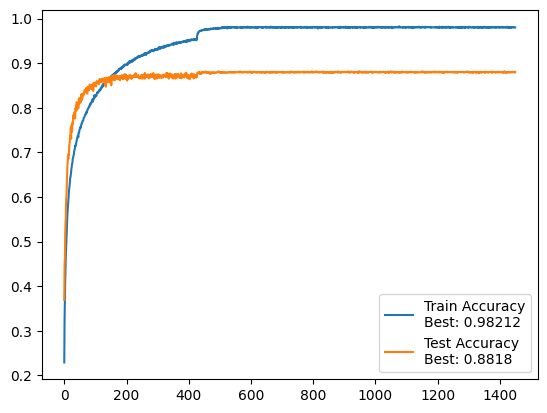

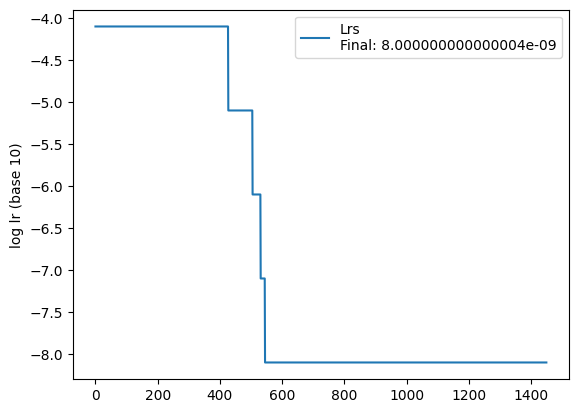

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 97.9%, Avg loss: 0.060701, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:57<00:00, 107.77s/it]


 Test accuracy: 87.9%, Avg loss: 0.599826


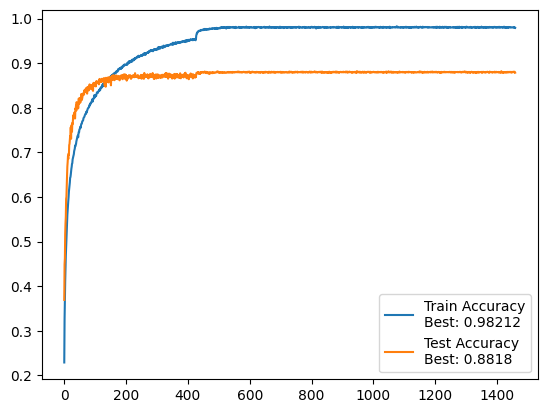

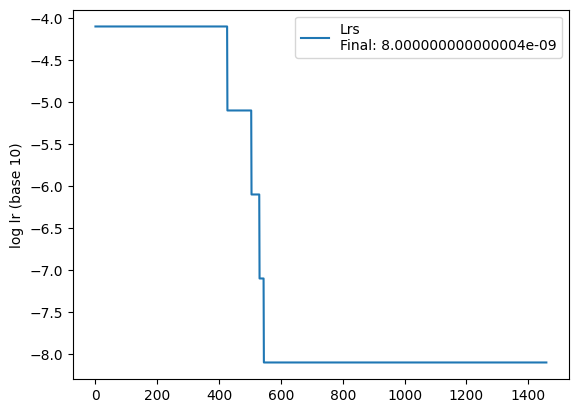

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.057898, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:58<00:00, 107.82s/it]


 Test accuracy: 88.0%, Avg loss: 0.591913


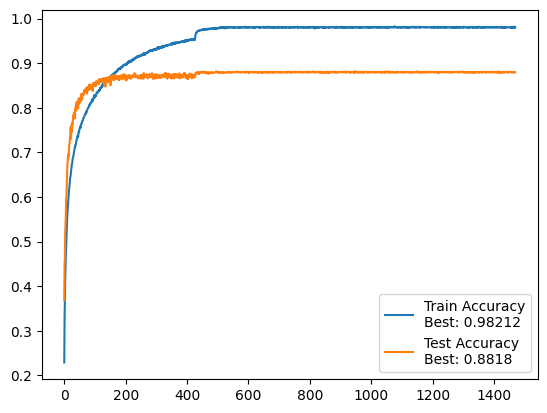

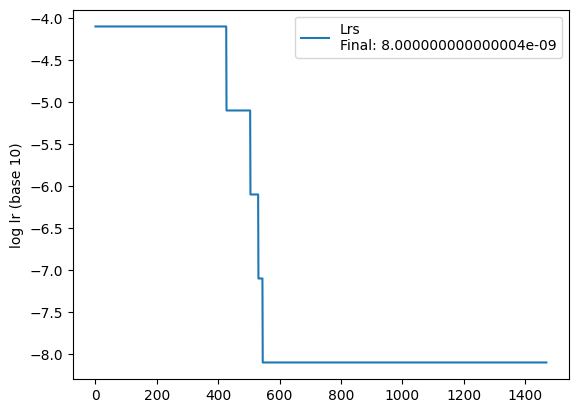

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.059706, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:57<00:00, 107.70s/it]


 Test accuracy: 88.0%, Avg loss: 0.590289


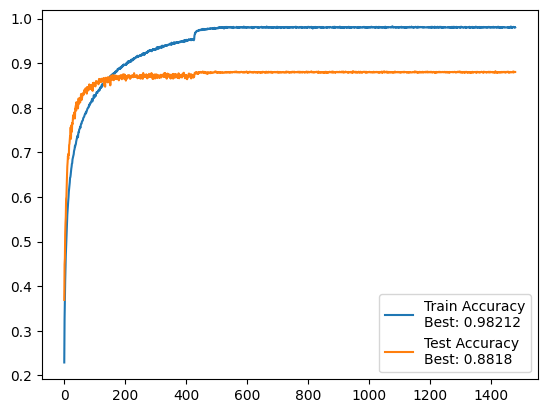

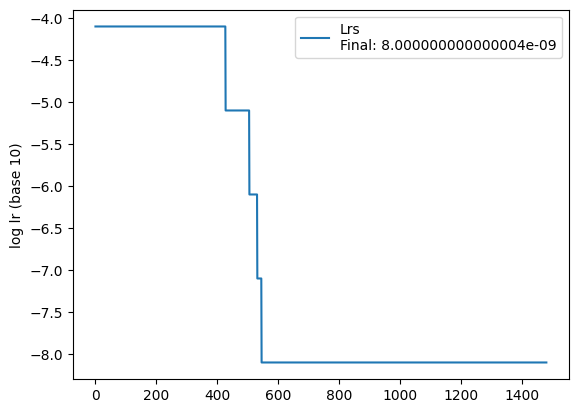

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.1%, Avg loss: 0.058533, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:57<00:00, 107.78s/it]


 Test accuracy: 88.0%, Avg loss: 0.592619


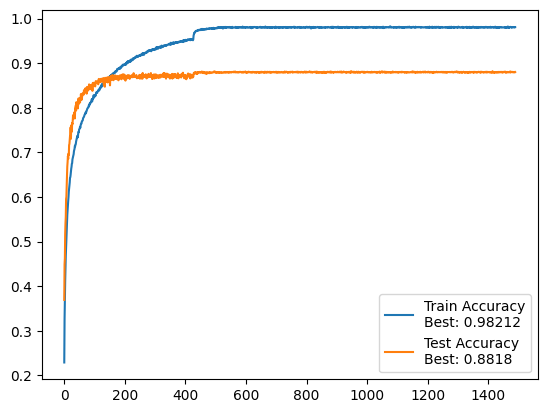

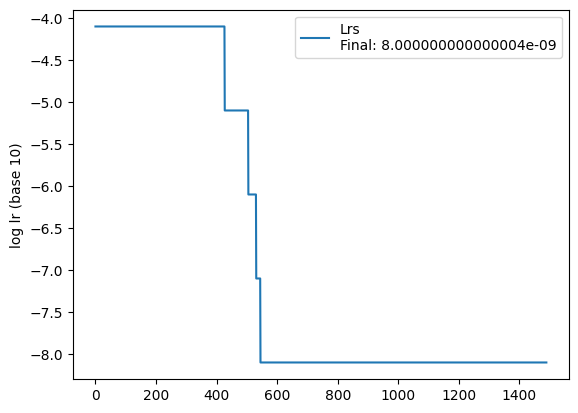

100%|██████████| 391/391 [01:46<00:00,  3.67it/s]


 Train accuracy: 98.0%, Avg loss: 0.061073, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:57<00:00, 107.74s/it]


 Test accuracy: 87.9%, Avg loss: 0.597666


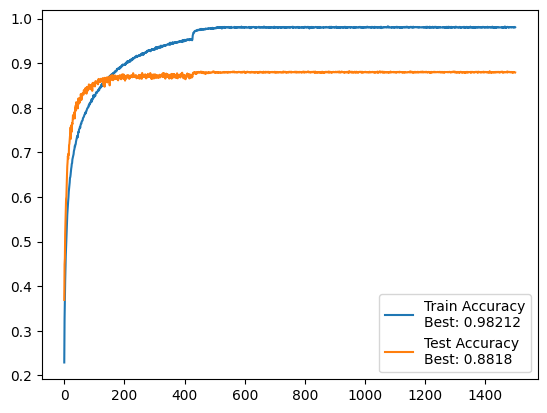

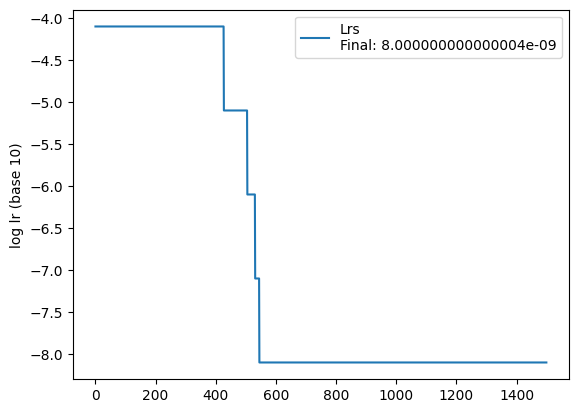

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.060160, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:57<00:00, 107.78s/it]


 Test accuracy: 88.0%, Avg loss: 0.593719


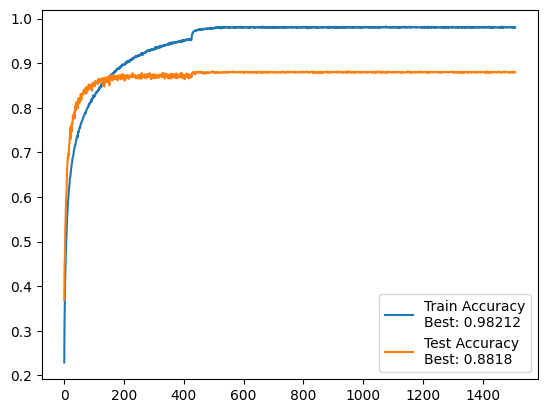

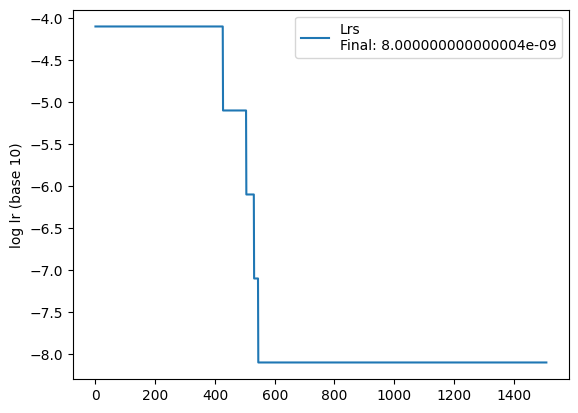

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.057805, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:58<00:00, 107.87s/it]


 Test accuracy: 88.0%, Avg loss: 0.592665


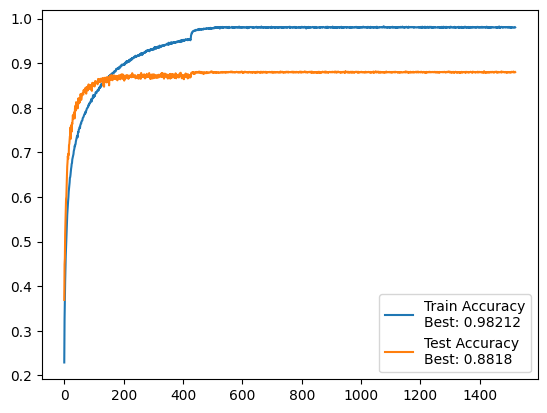

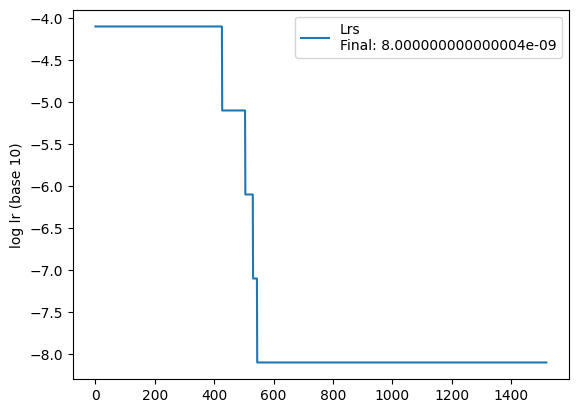

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.058138, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:57<00:00, 107.78s/it]


 Test accuracy: 88.0%, Avg loss: 0.593127


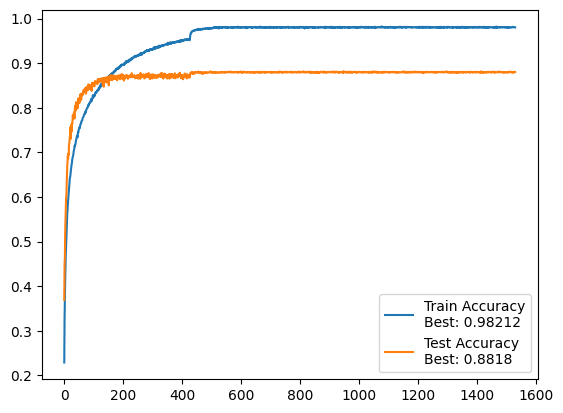

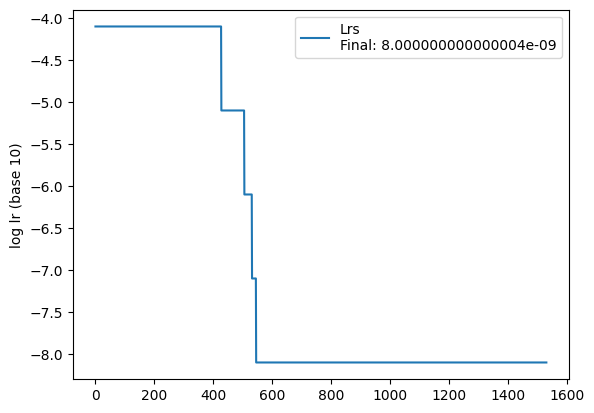

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.059265, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:57<00:00, 107.76s/it]


 Test accuracy: 88.0%, Avg loss: 0.597600


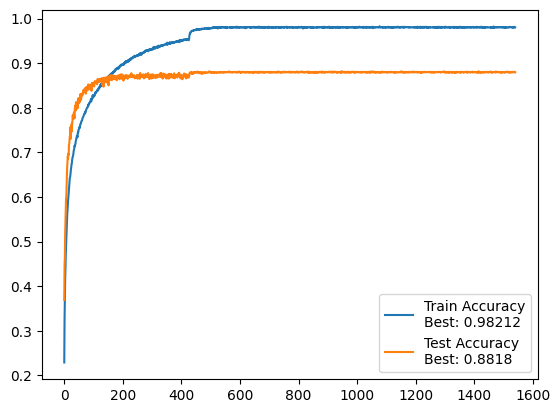

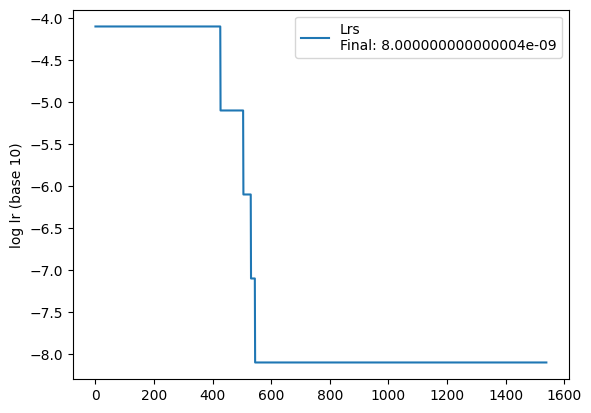

100%|██████████| 391/391 [01:46<00:00,  3.68it/s]


 Train accuracy: 98.0%, Avg loss: 0.060428, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:55<00:00, 107.55s/it]


 Test accuracy: 87.9%, Avg loss: 0.592323


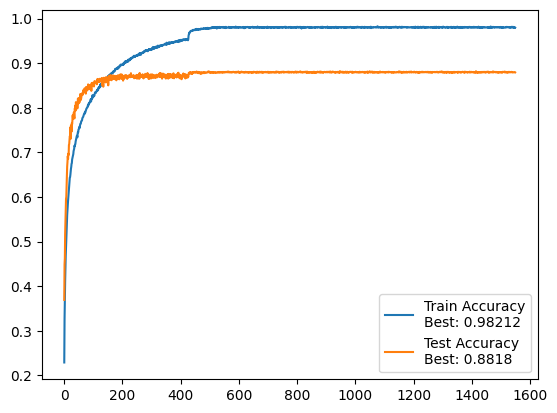

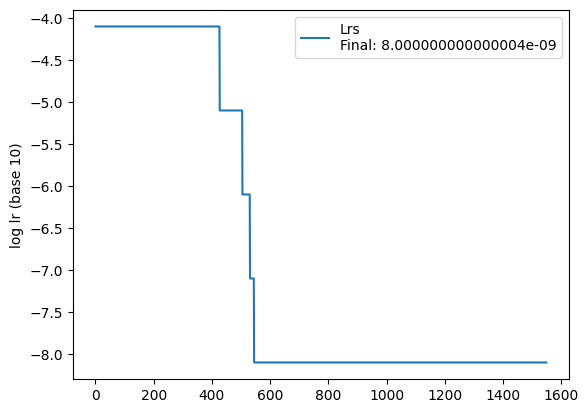

100%|██████████| 391/391 [01:45<00:00,  3.69it/s]


 Train accuracy: 98.0%, Avg loss: 0.058524, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:58<00:00, 107.82s/it]


 Test accuracy: 88.1%, Avg loss: 0.594873


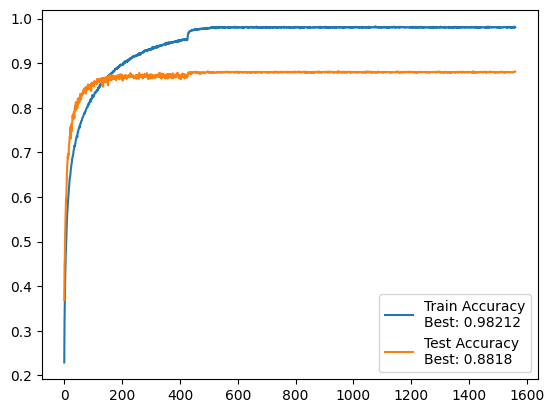

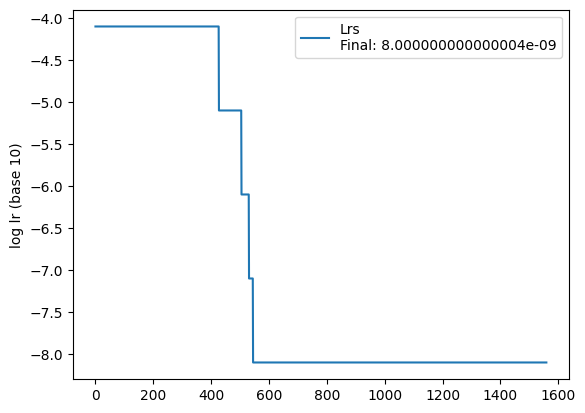

100%|██████████| 391/391 [01:46<00:00,  3.69it/s]


 Train accuracy: 98.0%, Avg loss: 0.059563, lr: 8.000000000000004e-09


100%|██████████| 10/10 [17:58<00:00, 107.84s/it]


 Test accuracy: 87.9%, Avg loss: 0.598774


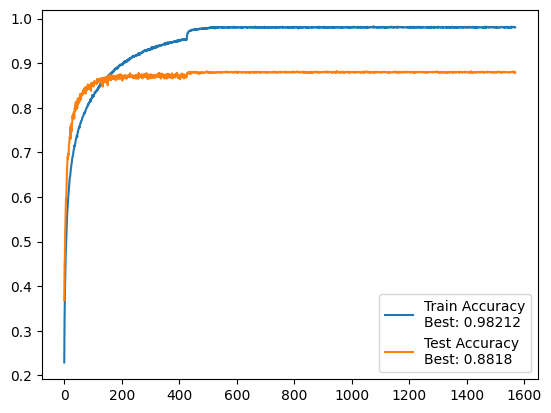

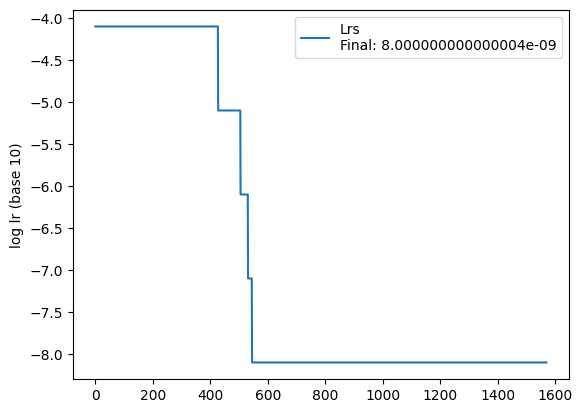

 50%|█████     | 5/10 [09:17<09:17, 111.46s/it]


KeyboardInterrupt: 

In [29]:
for i in range(NUM_EPOCHS//NUM_EPOCHS_TO_SAVE):
    train_(epochs=NUM_EPOCHS_TO_SAVE, show=SHOW, show2=SHOW2)
    STORE_PATH = save(os.path.join(str(TRAIN_ID), f'{epoch}'))
    plot(STORE_PATH)

In [ ]:
### THIS IS: ResNet-34 with more augmentation.
### Nvidia RTX 3060-Ti ~4m 40s/epoch  


 =============== Epoch 2001 ===============


100%|██████████| 40/40 [00:16<00:00,  2.39it/s]


 Train accuracy: 41.4%, Avg loss: 1.579349, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.03it/s]


 Test accuracy: 44.1%, Avg loss: 1.513085

 =============== Epoch 2002 ===============


100%|██████████| 40/40 [00:16<00:00,  2.42it/s]


 Train accuracy: 42.0%, Avg loss: 1.565739, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.13it/s]


 Test accuracy: 44.1%, Avg loss: 1.513074

 =============== Epoch 2003 ===============


100%|██████████| 40/40 [00:16<00:00,  2.43it/s]


 Train accuracy: 41.7%, Avg loss: 1.569280, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.13it/s]


 Test accuracy: 44.1%, Avg loss: 1.513059

 =============== Epoch 2004 ===============


100%|██████████| 40/40 [00:16<00:00,  2.43it/s]


 Train accuracy: 42.3%, Avg loss: 1.551639, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.18it/s]


 Test accuracy: 44.1%, Avg loss: 1.513063

 =============== Epoch 2005 ===============


100%|██████████| 40/40 [00:16<00:00,  2.42it/s]


 Train accuracy: 42.1%, Avg loss: 1.565700, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.11it/s]


 Test accuracy: 44.1%, Avg loss: 1.513064

 =============== Epoch 2006 ===============


100%|██████████| 40/40 [00:16<00:00,  2.43it/s]


 Train accuracy: 42.0%, Avg loss: 1.540311, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.16it/s]


 Test accuracy: 44.1%, Avg loss: 1.513059

 =============== Epoch 2007 ===============


100%|██████████| 40/40 [00:16<00:00,  2.42it/s]


 Train accuracy: 42.1%, Avg loss: 1.542807, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.18it/s]


 Test accuracy: 44.1%, Avg loss: 1.513056

 =============== Epoch 2008 ===============


100%|██████████| 40/40 [00:16<00:00,  2.40it/s]


 Train accuracy: 42.6%, Avg loss: 1.562628, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.13it/s]


 Test accuracy: 44.1%, Avg loss: 1.513062

 =============== Epoch 2009 ===============


100%|██████████| 40/40 [00:16<00:00,  2.42it/s]


 Train accuracy: 42.2%, Avg loss: 1.557143, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.12it/s]


 Test accuracy: 44.1%, Avg loss: 1.513058

 =============== Epoch 2010 ===============


100%|██████████| 40/40 [00:16<00:00,  2.43it/s]


 Train accuracy: 42.5%, Avg loss: 1.548847, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.16it/s]


 Test accuracy: 44.1%, Avg loss: 1.513055

 =============== Epoch 2011 ===============


100%|██████████| 40/40 [00:16<00:00,  2.42it/s]


 Train accuracy: 41.8%, Avg loss: 1.555992, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.15it/s]


 Test accuracy: 44.1%, Avg loss: 1.513046

 =============== Epoch 2012 ===============


100%|██████████| 40/40 [00:16<00:00,  2.41it/s]


 Train accuracy: 42.2%, Avg loss: 1.564494, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.15it/s]


 Test accuracy: 44.1%, Avg loss: 1.513043

 =============== Epoch 2013 ===============


100%|██████████| 40/40 [00:16<00:00,  2.41it/s]


 Train accuracy: 41.8%, Avg loss: 1.553169, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.13it/s]


 Test accuracy: 44.1%, Avg loss: 1.513029

 =============== Epoch 2014 ===============


100%|██████████| 40/40 [00:16<00:00,  2.40it/s]


 Train accuracy: 40.3%, Avg loss: 1.573329, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.12it/s]


 Test accuracy: 44.1%, Avg loss: 1.513019

 =============== Epoch 2015 ===============


100%|██████████| 40/40 [00:16<00:00,  2.42it/s]


 Train accuracy: 41.6%, Avg loss: 1.558910, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.20it/s]


 Test accuracy: 44.1%, Avg loss: 1.513033

 =============== Epoch 2016 ===============


100%|██████████| 40/40 [00:16<00:00,  2.42it/s]


 Train accuracy: 41.5%, Avg loss: 1.572160, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.09it/s]


 Test accuracy: 44.1%, Avg loss: 1.513030

 =============== Epoch 2017 ===============


100%|██████████| 40/40 [00:16<00:00,  2.42it/s]


 Train accuracy: 41.3%, Avg loss: 1.574437, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.20it/s]


 Test accuracy: 44.1%, Avg loss: 1.513020

 =============== Epoch 2018 ===============


100%|██████████| 40/40 [00:16<00:00,  2.42it/s]


 Train accuracy: 42.4%, Avg loss: 1.567215, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.16it/s]


 Test accuracy: 44.1%, Avg loss: 1.513025

 =============== Epoch 2019 ===============


100%|██████████| 40/40 [00:16<00:00,  2.40it/s]


 Train accuracy: 42.6%, Avg loss: 1.547580, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.21it/s]


 Test accuracy: 44.1%, Avg loss: 1.513038

 =============== Epoch 2020 ===============


100%|██████████| 40/40 [00:16<00:00,  2.42it/s]


 Train accuracy: 42.8%, Avg loss: 1.536771, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.10it/s]


 Test accuracy: 44.1%, Avg loss: 1.513049

 =============== Epoch 2021 ===============


100%|██████████| 40/40 [00:16<00:00,  2.44it/s]


 Train accuracy: 42.2%, Avg loss: 1.549708, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.14it/s]


 Test accuracy: 44.1%, Avg loss: 1.513053

 =============== Epoch 2022 ===============


100%|██████████| 40/40 [00:16<00:00,  2.42it/s]


 Train accuracy: 41.7%, Avg loss: 1.563580, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.16it/s]


 Test accuracy: 44.1%, Avg loss: 1.513059

 =============== Epoch 2023 ===============


100%|██████████| 40/40 [00:16<00:00,  2.44it/s]


 Train accuracy: 41.2%, Avg loss: 1.551632, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.14it/s]


 Test accuracy: 44.1%, Avg loss: 1.513052

 =============== Epoch 2024 ===============


100%|██████████| 40/40 [00:16<00:00,  2.44it/s]


 Train accuracy: 42.3%, Avg loss: 1.547424, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.18it/s]


 Test accuracy: 44.1%, Avg loss: 1.513050

 =============== Epoch 2025 ===============


100%|██████████| 40/40 [00:16<00:00,  2.43it/s]


 Train accuracy: 42.3%, Avg loss: 1.555310, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.20it/s]


 Test accuracy: 44.1%, Avg loss: 1.513054

 =============== Epoch 2026 ===============


100%|██████████| 40/40 [00:16<00:00,  2.44it/s]


 Train accuracy: 41.7%, Avg loss: 1.541877, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.16it/s]


 Test accuracy: 44.1%, Avg loss: 1.513052

 =============== Epoch 2027 ===============


100%|██████████| 40/40 [00:16<00:00,  2.43it/s]


 Train accuracy: 41.4%, Avg loss: 1.569027, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.12it/s]


 Test accuracy: 44.1%, Avg loss: 1.513053

 =============== Epoch 2028 ===============


100%|██████████| 40/40 [00:16<00:00,  2.43it/s]


 Train accuracy: 41.9%, Avg loss: 1.550777, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.15it/s]


 Test accuracy: 44.1%, Avg loss: 1.513056

 =============== Epoch 2029 ===============


100%|██████████| 40/40 [00:16<00:00,  2.43it/s]


 Train accuracy: 42.0%, Avg loss: 1.576770, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.17it/s]


 Test accuracy: 44.1%, Avg loss: 1.513057

 =============== Epoch 2030 ===============


100%|██████████| 40/40 [00:16<00:00,  2.43it/s]


 Train accuracy: 42.5%, Avg loss: 1.533826, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.15it/s]


 Test accuracy: 44.1%, Avg loss: 1.513058

 =============== Epoch 2031 ===============


100%|██████████| 40/40 [00:16<00:00,  2.43it/s]


 Train accuracy: 42.3%, Avg loss: 1.569001, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.15it/s]


 Test accuracy: 44.1%, Avg loss: 1.513071

 =============== Epoch 2032 ===============


100%|██████████| 40/40 [00:16<00:00,  2.41it/s]


 Train accuracy: 41.9%, Avg loss: 1.544791, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 13.20it/s]


 Test accuracy: 44.1%, Avg loss: 1.513058

 =============== Epoch 2033 ===============


100%|██████████| 40/40 [00:16<00:00,  2.43it/s]


 Train accuracy: 42.3%, Avg loss: 1.561986, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.31it/s]


 Test accuracy: 44.1%, Avg loss: 1.513067

 =============== Epoch 2034 ===============


100%|██████████| 40/40 [00:17<00:00,  2.28it/s]


 Train accuracy: 41.4%, Avg loss: 1.573107, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.513061

 =============== Epoch 2035 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.545754, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.513061

 =============== Epoch 2036 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.7%, Avg loss: 1.559891, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.513072

 =============== Epoch 2037 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.0%, Avg loss: 1.554493, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.513064

 =============== Epoch 2038 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 42.5%, Avg loss: 1.553655, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.85it/s]


 Test accuracy: 44.1%, Avg loss: 1.513069

 =============== Epoch 2039 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 42.1%, Avg loss: 1.554715, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.83it/s]


 Test accuracy: 44.1%, Avg loss: 1.513065

 =============== Epoch 2040 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.548673, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.1%, Avg loss: 1.513072

 =============== Epoch 2041 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 40.7%, Avg loss: 1.568215, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


 Test accuracy: 44.1%, Avg loss: 1.513082

 =============== Epoch 2042 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.4%, Avg loss: 1.557020, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.1%, Avg loss: 1.513076

 =============== Epoch 2043 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.0%, Avg loss: 1.550944, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.513077

 =============== Epoch 2044 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 41.8%, Avg loss: 1.541753, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.83it/s]


 Test accuracy: 44.1%, Avg loss: 1.513084

 =============== Epoch 2045 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 42.2%, Avg loss: 1.563169, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.84it/s]


 Test accuracy: 44.1%, Avg loss: 1.513073

 =============== Epoch 2046 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 42.3%, Avg loss: 1.551039, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


 Test accuracy: 44.1%, Avg loss: 1.513069

 =============== Epoch 2047 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.2%, Avg loss: 1.543287, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.0%, Avg loss: 1.513075

 =============== Epoch 2048 ===============


100%|██████████| 40/40 [00:18<00:00,  2.18it/s]


 Train accuracy: 42.2%, Avg loss: 1.556716, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 11.98it/s]


 Test accuracy: 44.0%, Avg loss: 1.513080

 =============== Epoch 2049 ===============


100%|██████████| 40/40 [00:17<00:00,  2.31it/s]


 Train accuracy: 42.6%, Avg loss: 1.558234, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.50it/s]


 Test accuracy: 44.0%, Avg loss: 1.513079

 =============== Epoch 2050 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 42.7%, Avg loss: 1.553802, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.22it/s]


 Test accuracy: 44.0%, Avg loss: 1.513086


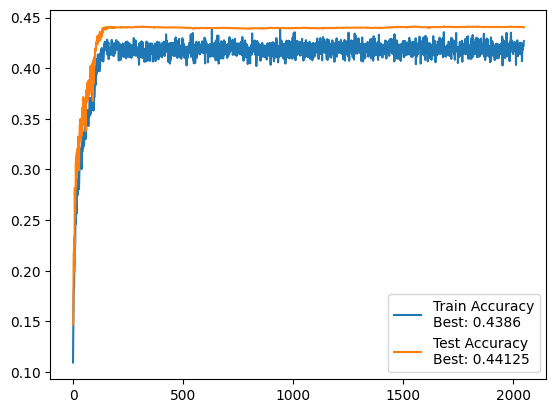

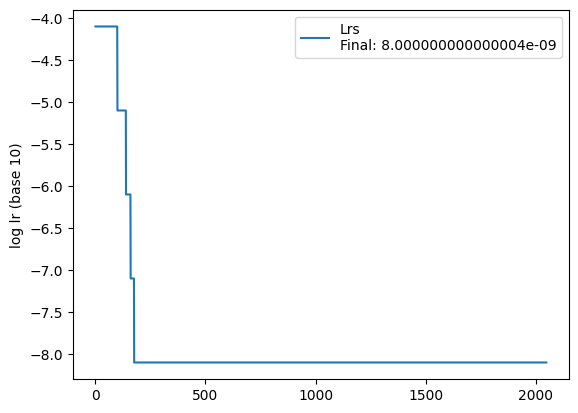


 =============== Epoch 2051 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.1%, Avg loss: 1.569019, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.513092

 =============== Epoch 2052 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.8%, Avg loss: 1.559812, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.513086

 =============== Epoch 2053 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.8%, Avg loss: 1.563619, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.1%, Avg loss: 1.513083

 =============== Epoch 2054 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 41.3%, Avg loss: 1.550504, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.41it/s]


 Test accuracy: 44.0%, Avg loss: 1.513085

 =============== Epoch 2055 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.566763, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.33it/s]


 Test accuracy: 44.1%, Avg loss: 1.513079

 =============== Epoch 2056 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.2%, Avg loss: 1.562654, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.513066

 =============== Epoch 2057 ===============


100%|██████████| 40/40 [00:17<00:00,  2.30it/s]


 Train accuracy: 40.8%, Avg loss: 1.571098, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.21it/s]


 Test accuracy: 44.1%, Avg loss: 1.513065

 =============== Epoch 2058 ===============


100%|██████████| 40/40 [00:17<00:00,  2.31it/s]


 Train accuracy: 41.7%, Avg loss: 1.562931, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.46it/s]


 Test accuracy: 44.1%, Avg loss: 1.513057

 =============== Epoch 2059 ===============


100%|██████████| 40/40 [00:17<00:00,  2.29it/s]


 Train accuracy: 42.1%, Avg loss: 1.551082, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.17it/s]


 Test accuracy: 44.1%, Avg loss: 1.513049

 =============== Epoch 2060 ===============


100%|██████████| 40/40 [00:17<00:00,  2.30it/s]


 Train accuracy: 41.8%, Avg loss: 1.578477, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.17it/s]


 Test accuracy: 44.0%, Avg loss: 1.513045

 =============== Epoch 2061 ===============


100%|██████████| 40/40 [00:17<00:00,  2.29it/s]


 Train accuracy: 41.8%, Avg loss: 1.564316, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.38it/s]


 Test accuracy: 44.0%, Avg loss: 1.513054

 =============== Epoch 2062 ===============


100%|██████████| 40/40 [00:17<00:00,  2.29it/s]


 Train accuracy: 40.5%, Avg loss: 1.552438, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.18it/s]


 Test accuracy: 44.0%, Avg loss: 1.513045

 =============== Epoch 2063 ===============


100%|██████████| 40/40 [00:17<00:00,  2.29it/s]


 Train accuracy: 41.6%, Avg loss: 1.563461, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


 Test accuracy: 44.0%, Avg loss: 1.513045

 =============== Epoch 2064 ===============


100%|██████████| 40/40 [00:17<00:00,  2.25it/s]


 Train accuracy: 42.3%, Avg loss: 1.570046, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.05it/s]


 Test accuracy: 44.0%, Avg loss: 1.513047

 =============== Epoch 2065 ===============


100%|██████████| 40/40 [00:17<00:00,  2.30it/s]


 Train accuracy: 42.5%, Avg loss: 1.553279, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.52it/s]


 Test accuracy: 44.1%, Avg loss: 1.513044

 =============== Epoch 2066 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 41.9%, Avg loss: 1.550086, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.41it/s]


 Test accuracy: 44.1%, Avg loss: 1.513037

 =============== Epoch 2067 ===============


100%|██████████| 40/40 [00:17<00:00,  2.32it/s]


 Train accuracy: 42.5%, Avg loss: 1.556185, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.513034

 =============== Epoch 2068 ===============


100%|██████████| 40/40 [00:17<00:00,  2.31it/s]


 Train accuracy: 41.5%, Avg loss: 1.559478, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.57it/s]


 Test accuracy: 44.1%, Avg loss: 1.513039

 =============== Epoch 2069 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 42.2%, Avg loss: 1.547388, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.59it/s]


 Test accuracy: 44.1%, Avg loss: 1.513033

 =============== Epoch 2070 ===============


100%|██████████| 40/40 [00:17<00:00,  2.32it/s]


 Train accuracy: 42.0%, Avg loss: 1.556058, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.21it/s]


 Test accuracy: 44.1%, Avg loss: 1.513024

 =============== Epoch 2071 ===============


100%|██████████| 40/40 [00:17<00:00,  2.28it/s]


 Train accuracy: 41.5%, Avg loss: 1.552607, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.44it/s]


 Test accuracy: 44.0%, Avg loss: 1.513032

 =============== Epoch 2072 ===============


100%|██████████| 40/40 [00:17<00:00,  2.32it/s]


 Train accuracy: 42.5%, Avg loss: 1.540455, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.42it/s]


 Test accuracy: 44.1%, Avg loss: 1.513038

 =============== Epoch 2073 ===============


100%|██████████| 40/40 [00:17<00:00,  2.28it/s]


 Train accuracy: 42.1%, Avg loss: 1.577021, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 11.94it/s]


 Test accuracy: 44.0%, Avg loss: 1.513043

 =============== Epoch 2074 ===============


100%|██████████| 40/40 [00:17<00:00,  2.27it/s]


 Train accuracy: 41.7%, Avg loss: 1.549329, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.34it/s]


 Test accuracy: 44.1%, Avg loss: 1.513033

 =============== Epoch 2075 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 40.7%, Avg loss: 1.577020, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.54it/s]


 Test accuracy: 44.1%, Avg loss: 1.513022

 =============== Epoch 2076 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.4%, Avg loss: 1.556461, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.0%, Avg loss: 1.513026

 =============== Epoch 2077 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.552640, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.16it/s]


 Test accuracy: 44.0%, Avg loss: 1.513033

 =============== Epoch 2078 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 41.7%, Avg loss: 1.542852, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.0%, Avg loss: 1.513040

 =============== Epoch 2079 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.9%, Avg loss: 1.555213, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.513037

 =============== Epoch 2080 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 42.0%, Avg loss: 1.551565, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.0%, Avg loss: 1.513039

 =============== Epoch 2081 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 43.6%, Avg loss: 1.552762, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.513036

 =============== Epoch 2082 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.550004, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.0%, Avg loss: 1.513022

 =============== Epoch 2083 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.0%, Avg loss: 1.547523, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.513019

 =============== Epoch 2084 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.553643, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.513008

 =============== Epoch 2085 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.0%, Avg loss: 1.543510, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.513002

 =============== Epoch 2086 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.533237, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.513001

 =============== Epoch 2087 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.552187, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.513009

 =============== Epoch 2088 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.3%, Avg loss: 1.559238, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.0%, Avg loss: 1.513012

 =============== Epoch 2089 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.569417, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.0%, Avg loss: 1.513016

 =============== Epoch 2090 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.575928, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.0%, Avg loss: 1.513019

 =============== Epoch 2091 ===============


100%|██████████| 40/40 [00:17<00:00,  2.29it/s]


 Train accuracy: 42.0%, Avg loss: 1.579729, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.52it/s]


 Test accuracy: 44.0%, Avg loss: 1.513010

 =============== Epoch 2092 ===============


100%|██████████| 40/40 [00:17<00:00,  2.32it/s]


 Train accuracy: 41.8%, Avg loss: 1.571421, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


 Test accuracy: 44.1%, Avg loss: 1.513009

 =============== Epoch 2093 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 41.4%, Avg loss: 1.550235, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.40it/s]


 Test accuracy: 44.0%, Avg loss: 1.513018

 =============== Epoch 2094 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.5%, Avg loss: 1.557688, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.54it/s]


 Test accuracy: 44.1%, Avg loss: 1.513022

 =============== Epoch 2095 ===============


100%|██████████| 40/40 [00:17<00:00,  2.32it/s]


 Train accuracy: 42.8%, Avg loss: 1.539034, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.49it/s]


 Test accuracy: 44.0%, Avg loss: 1.513031

 =============== Epoch 2096 ===============


100%|██████████| 40/40 [00:17<00:00,  2.32it/s]


 Train accuracy: 42.9%, Avg loss: 1.550128, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.59it/s]


 Test accuracy: 44.0%, Avg loss: 1.513026

 =============== Epoch 2097 ===============


100%|██████████| 40/40 [00:17<00:00,  2.29it/s]


 Train accuracy: 41.8%, Avg loss: 1.532386, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.32it/s]


 Test accuracy: 44.0%, Avg loss: 1.513033

 =============== Epoch 2098 ===============


100%|██████████| 40/40 [00:17<00:00,  2.31it/s]


 Train accuracy: 42.6%, Avg loss: 1.559165, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.0%, Avg loss: 1.513045

 =============== Epoch 2099 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.565418, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.0%, Avg loss: 1.513041

 =============== Epoch 2100 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 40.6%, Avg loss: 1.564097, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.0%, Avg loss: 1.513041


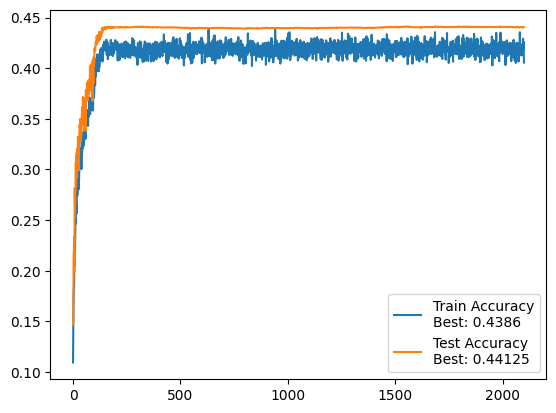

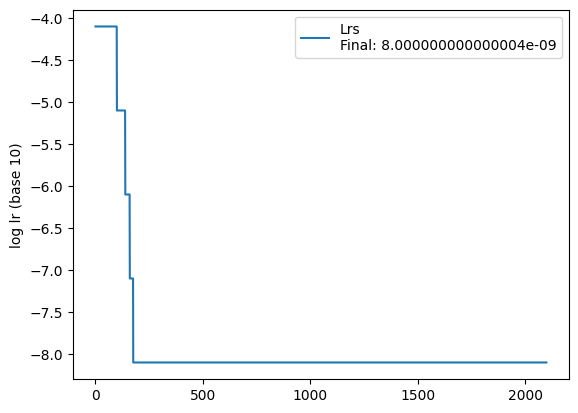


 =============== Epoch 2101 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.546359, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.0%, Avg loss: 1.513033

 =============== Epoch 2102 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.552677, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.0%, Avg loss: 1.513026

 =============== Epoch 2103 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.533127, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.0%, Avg loss: 1.513035

 =============== Epoch 2104 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.543530, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.0%, Avg loss: 1.513031

 =============== Epoch 2105 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 42.2%, Avg loss: 1.547150, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.0%, Avg loss: 1.513028

 =============== Epoch 2106 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.557845, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.0%, Avg loss: 1.513009

 =============== Epoch 2107 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.556990, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.0%, Avg loss: 1.513014

 =============== Epoch 2108 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.8%, Avg loss: 1.556855, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.0%, Avg loss: 1.513020

 =============== Epoch 2109 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.7%, Avg loss: 1.551588, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.0%, Avg loss: 1.513010

 =============== Epoch 2110 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.3%, Avg loss: 1.571746, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.0%, Avg loss: 1.513025

 =============== Epoch 2111 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.552348, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.52it/s]


 Test accuracy: 44.0%, Avg loss: 1.513025

 =============== Epoch 2112 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.7%, Avg loss: 1.557953, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.0%, Avg loss: 1.513009

 =============== Epoch 2113 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.560068, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.0%, Avg loss: 1.513009

 =============== Epoch 2114 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.566304, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.0%, Avg loss: 1.513012

 =============== Epoch 2115 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.4%, Avg loss: 1.543004, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.0%, Avg loss: 1.513021

 =============== Epoch 2116 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.553111, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.0%, Avg loss: 1.513019

 =============== Epoch 2117 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.581703, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


 Test accuracy: 44.0%, Avg loss: 1.513010

 =============== Epoch 2118 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.560152, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.0%, Avg loss: 1.513012

 =============== Epoch 2119 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.4%, Avg loss: 1.516485, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.0%, Avg loss: 1.513018

 =============== Epoch 2120 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.570265, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.0%, Avg loss: 1.513013

 =============== Epoch 2121 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 43.3%, Avg loss: 1.537284, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.0%, Avg loss: 1.513016

 =============== Epoch 2122 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.563495, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.0%, Avg loss: 1.513029

 =============== Epoch 2123 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.7%, Avg loss: 1.547517, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.0%, Avg loss: 1.513030

 =============== Epoch 2124 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.6%, Avg loss: 1.556382, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.0%, Avg loss: 1.513034

 =============== Epoch 2125 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.3%, Avg loss: 1.579150, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.0%, Avg loss: 1.513029

 =============== Epoch 2126 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.563142, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.0%, Avg loss: 1.513019

 =============== Epoch 2127 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.577915, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.0%, Avg loss: 1.513020

 =============== Epoch 2128 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.4%, Avg loss: 1.542058, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.0%, Avg loss: 1.513020

 =============== Epoch 2129 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.3%, Avg loss: 1.571303, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.0%, Avg loss: 1.513030

 =============== Epoch 2130 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.5%, Avg loss: 1.564564, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.0%, Avg loss: 1.513030

 =============== Epoch 2131 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.532286, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.0%, Avg loss: 1.513034

 =============== Epoch 2132 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.4%, Avg loss: 1.562077, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.0%, Avg loss: 1.513041

 =============== Epoch 2133 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.561812, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.0%, Avg loss: 1.513061

 =============== Epoch 2134 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 40.9%, Avg loss: 1.564626, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.0%, Avg loss: 1.513064

 =============== Epoch 2135 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.3%, Avg loss: 1.570496, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.0%, Avg loss: 1.513053

 =============== Epoch 2136 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.2%, Avg loss: 1.574326, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.0%, Avg loss: 1.513041

 =============== Epoch 2137 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 40.4%, Avg loss: 1.571168, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.0%, Avg loss: 1.513040

 =============== Epoch 2138 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.2%, Avg loss: 1.572728, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.0%, Avg loss: 1.513033

 =============== Epoch 2139 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.565087, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.0%, Avg loss: 1.513025

 =============== Epoch 2140 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.7%, Avg loss: 1.548925, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.0%, Avg loss: 1.513027

 =============== Epoch 2141 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.556401, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.0%, Avg loss: 1.513031

 =============== Epoch 2142 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.554809, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.0%, Avg loss: 1.513039

 =============== Epoch 2143 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.546645, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:07<00:00,  7.99it/s]


 Test accuracy: 44.1%, Avg loss: 1.513036

 =============== Epoch 2144 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.8%, Avg loss: 1.578479, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.513025

 =============== Epoch 2145 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.4%, Avg loss: 1.552242, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.0%, Avg loss: 1.513021

 =============== Epoch 2146 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 42.2%, Avg loss: 1.559995, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.0%, Avg loss: 1.513038

 =============== Epoch 2147 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.566174, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.88it/s]


 Test accuracy: 44.1%, Avg loss: 1.513055

 =============== Epoch 2148 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.5%, Avg loss: 1.554357, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.513049

 =============== Epoch 2149 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.8%, Avg loss: 1.546991, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.513042

 =============== Epoch 2150 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.5%, Avg loss: 1.562582, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.513030


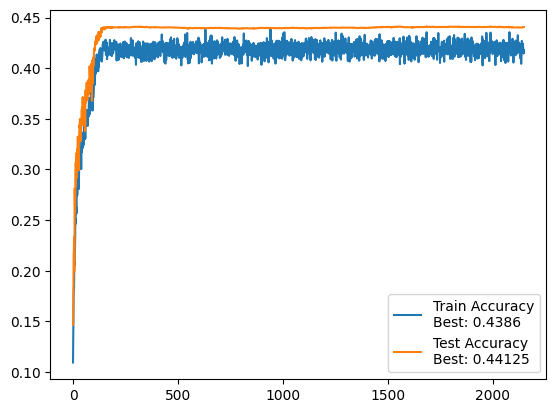

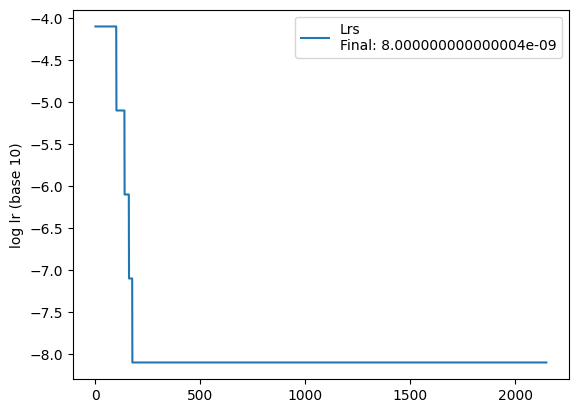


 =============== Epoch 2151 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.4%, Avg loss: 1.573435, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.513037

 =============== Epoch 2152 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.7%, Avg loss: 1.566661, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.84it/s]


 Test accuracy: 44.1%, Avg loss: 1.513044

 =============== Epoch 2153 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.7%, Avg loss: 1.549071, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.0%, Avg loss: 1.513065

 =============== Epoch 2154 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 42.3%, Avg loss: 1.551770, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.513068

 =============== Epoch 2155 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.549011, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.513059

 =============== Epoch 2156 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 43.4%, Avg loss: 1.541833, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.513053

 =============== Epoch 2157 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.558759, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.513059

 =============== Epoch 2158 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.545327, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.513052

 =============== Epoch 2159 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.566574, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.513058

 =============== Epoch 2160 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 41.4%, Avg loss: 1.570606, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.83it/s]


 Test accuracy: 44.1%, Avg loss: 1.513072

 =============== Epoch 2161 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.6%, Avg loss: 1.576835, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.83it/s]


 Test accuracy: 44.1%, Avg loss: 1.513082

 =============== Epoch 2162 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.550683, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


 Test accuracy: 44.1%, Avg loss: 1.513092

 =============== Epoch 2163 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 43.1%, Avg loss: 1.546548, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.513089

 =============== Epoch 2164 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 42.0%, Avg loss: 1.551654, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.513091

 =============== Epoch 2165 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.1%, Avg loss: 1.547028, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.513092

 =============== Epoch 2166 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.2%, Avg loss: 1.572534, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.90it/s]


 Test accuracy: 44.1%, Avg loss: 1.513095

 =============== Epoch 2167 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.555309, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.513106

 =============== Epoch 2168 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 41.9%, Avg loss: 1.551344, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.513096

 =============== Epoch 2169 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 42.3%, Avg loss: 1.550483, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


 Test accuracy: 44.1%, Avg loss: 1.513091

 =============== Epoch 2170 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.543978, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.85it/s]


 Test accuracy: 44.1%, Avg loss: 1.513084

 =============== Epoch 2171 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.0%, Avg loss: 1.564376, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.84it/s]


 Test accuracy: 44.1%, Avg loss: 1.513090

 =============== Epoch 2172 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.0%, Avg loss: 1.558884, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.513094

 =============== Epoch 2173 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.3%, Avg loss: 1.543781, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.513094

 =============== Epoch 2174 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.3%, Avg loss: 1.564433, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.513093

 =============== Epoch 2175 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.555671, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.94it/s]


 Test accuracy: 44.1%, Avg loss: 1.513086

 =============== Epoch 2176 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.555004, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.0%, Avg loss: 1.513069

 =============== Epoch 2177 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.538342, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.83it/s]


 Test accuracy: 44.0%, Avg loss: 1.513067

 =============== Epoch 2178 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.8%, Avg loss: 1.568694, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.0%, Avg loss: 1.513068

 =============== Epoch 2179 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.0%, Avg loss: 1.547584, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.0%, Avg loss: 1.513084

 =============== Epoch 2180 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.571197, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.86it/s]


 Test accuracy: 44.0%, Avg loss: 1.513090

 =============== Epoch 2181 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.573213, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.0%, Avg loss: 1.513102

 =============== Epoch 2182 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 43.3%, Avg loss: 1.549338, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.0%, Avg loss: 1.513088

 =============== Epoch 2183 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.9%, Avg loss: 1.536846, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.0%, Avg loss: 1.513084

 =============== Epoch 2184 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.565636, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.89it/s]


 Test accuracy: 44.0%, Avg loss: 1.513087

 =============== Epoch 2185 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.575711, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.84it/s]


 Test accuracy: 44.0%, Avg loss: 1.513097

 =============== Epoch 2186 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.4%, Avg loss: 1.554277, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.0%, Avg loss: 1.513094

 =============== Epoch 2187 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 43.0%, Avg loss: 1.542971, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.513082

 =============== Epoch 2188 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.0%, Avg loss: 1.566726, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.513065

 =============== Epoch 2189 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.567643, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.89it/s]


 Test accuracy: 44.1%, Avg loss: 1.513046

 =============== Epoch 2190 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.565467, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.83it/s]


 Test accuracy: 44.1%, Avg loss: 1.513047

 =============== Epoch 2191 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.543729, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.0%, Avg loss: 1.513048

 =============== Epoch 2192 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.5%, Avg loss: 1.569787, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.0%, Avg loss: 1.513042

 =============== Epoch 2193 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 42.4%, Avg loss: 1.539636, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.84it/s]


 Test accuracy: 44.1%, Avg loss: 1.513027

 =============== Epoch 2194 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.4%, Avg loss: 1.574797, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.87it/s]


 Test accuracy: 44.1%, Avg loss: 1.513017

 =============== Epoch 2195 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.534178, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.84it/s]


 Test accuracy: 44.1%, Avg loss: 1.513002

 =============== Epoch 2196 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.1%, Avg loss: 1.579289, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.85it/s]


 Test accuracy: 44.1%, Avg loss: 1.513001

 =============== Epoch 2197 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 41.5%, Avg loss: 1.560112, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512996

 =============== Epoch 2198 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 41.8%, Avg loss: 1.549323, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.88it/s]


 Test accuracy: 44.1%, Avg loss: 1.512997

 =============== Epoch 2199 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.544061, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.0%, Avg loss: 1.512996

 =============== Epoch 2200 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.2%, Avg loss: 1.560337, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.0%, Avg loss: 1.513002


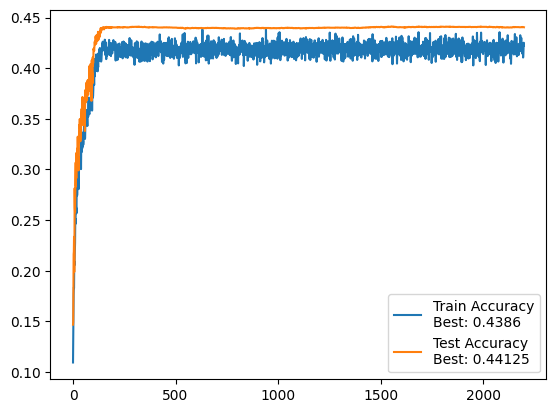

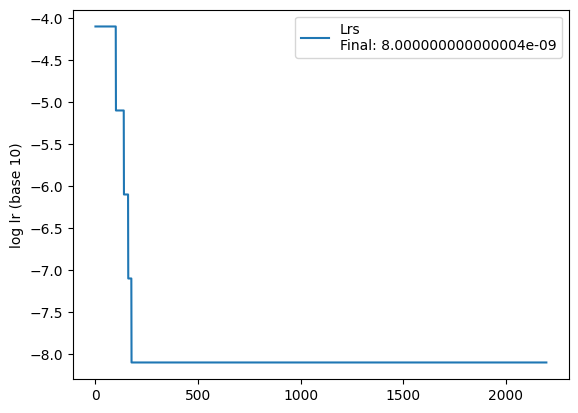


 =============== Epoch 2201 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 41.6%, Avg loss: 1.553845, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.0%, Avg loss: 1.513011

 =============== Epoch 2202 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 42.0%, Avg loss: 1.571489, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.513001

 =============== Epoch 2203 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 41.9%, Avg loss: 1.556397, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.88it/s]


 Test accuracy: 44.0%, Avg loss: 1.513003

 =============== Epoch 2204 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 41.7%, Avg loss: 1.559029, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512996

 =============== Epoch 2205 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.0%, Avg loss: 1.575622, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.513006

 =============== Epoch 2206 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.8%, Avg loss: 1.562011, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512995

 =============== Epoch 2207 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 40.9%, Avg loss: 1.586484, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.88it/s]


 Test accuracy: 44.1%, Avg loss: 1.512995

 =============== Epoch 2208 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 40.8%, Avg loss: 1.566644, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.84it/s]


 Test accuracy: 44.1%, Avg loss: 1.513001

 =============== Epoch 2209 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.8%, Avg loss: 1.549554, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.513006

 =============== Epoch 2210 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.551463, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512997

 =============== Epoch 2211 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.6%, Avg loss: 1.539655, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.513000

 =============== Epoch 2212 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.3%, Avg loss: 1.561887, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.93it/s]


 Test accuracy: 44.1%, Avg loss: 1.512994

 =============== Epoch 2213 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.559702, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.83it/s]


 Test accuracy: 44.1%, Avg loss: 1.513002

 =============== Epoch 2214 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.565837, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.513005

 =============== Epoch 2215 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 41.1%, Avg loss: 1.567043, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512997

 =============== Epoch 2216 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.0%, Avg loss: 1.546513, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.85it/s]


 Test accuracy: 44.1%, Avg loss: 1.512992

 =============== Epoch 2217 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 40.8%, Avg loss: 1.561538, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.89it/s]


 Test accuracy: 44.1%, Avg loss: 1.513001

 =============== Epoch 2218 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.569745, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.87it/s]


 Test accuracy: 44.1%, Avg loss: 1.512990

 =============== Epoch 2219 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.2%, Avg loss: 1.556867, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512975

 =============== Epoch 2220 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.4%, Avg loss: 1.553260, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512989

 =============== Epoch 2221 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.557021, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.90it/s]


 Test accuracy: 44.1%, Avg loss: 1.512976

 =============== Epoch 2222 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.1%, Avg loss: 1.567264, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.88it/s]


 Test accuracy: 44.1%, Avg loss: 1.512981

 =============== Epoch 2223 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 41.8%, Avg loss: 1.551633, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.1%, Avg loss: 1.512968

 =============== Epoch 2224 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.1%, Avg loss: 1.572535, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.0%, Avg loss: 1.512972

 =============== Epoch 2225 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.5%, Avg loss: 1.559536, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.0%, Avg loss: 1.512957

 =============== Epoch 2226 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.0%, Avg loss: 1.575936, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.92it/s]


 Test accuracy: 44.1%, Avg loss: 1.512948

 =============== Epoch 2227 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.7%, Avg loss: 1.547309, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.85it/s]


 Test accuracy: 44.0%, Avg loss: 1.512949

 =============== Epoch 2228 ===============


100%|██████████| 40/40 [00:16<00:00,  2.39it/s]


 Train accuracy: 41.7%, Avg loss: 1.545862, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.0%, Avg loss: 1.512970

 =============== Epoch 2229 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.555683, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.0%, Avg loss: 1.512960

 =============== Epoch 2230 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.551808, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.87it/s]


 Test accuracy: 44.0%, Avg loss: 1.512984

 =============== Epoch 2231 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.558931, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.90it/s]


 Test accuracy: 44.0%, Avg loss: 1.512978

 =============== Epoch 2232 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.9%, Avg loss: 1.544083, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.0%, Avg loss: 1.512978

 =============== Epoch 2233 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 41.2%, Avg loss: 1.566721, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.0%, Avg loss: 1.512972

 =============== Epoch 2234 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 41.1%, Avg loss: 1.574703, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.84it/s]


 Test accuracy: 44.0%, Avg loss: 1.512958

 =============== Epoch 2235 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.0%, Avg loss: 1.558790, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.91it/s]


 Test accuracy: 44.0%, Avg loss: 1.512964

 =============== Epoch 2236 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.3%, Avg loss: 1.552748, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.55it/s]


 Test accuracy: 44.0%, Avg loss: 1.512976

 =============== Epoch 2237 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.9%, Avg loss: 1.535312, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.0%, Avg loss: 1.512981

 =============== Epoch 2238 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 42.1%, Avg loss: 1.539935, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.0%, Avg loss: 1.512993

 =============== Epoch 2239 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 41.8%, Avg loss: 1.561312, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.0%, Avg loss: 1.513005

 =============== Epoch 2240 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.2%, Avg loss: 1.560905, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.97it/s]


 Test accuracy: 44.0%, Avg loss: 1.513001

 =============== Epoch 2241 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.560798, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.513008

 =============== Epoch 2242 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 41.8%, Avg loss: 1.551108, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.513008

 =============== Epoch 2243 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.1%, Avg loss: 1.559514, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.0%, Avg loss: 1.513016

 =============== Epoch 2244 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.5%, Avg loss: 1.549177, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.89it/s]


 Test accuracy: 44.0%, Avg loss: 1.513022

 =============== Epoch 2245 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.559806, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.86it/s]


 Test accuracy: 44.0%, Avg loss: 1.513022

 =============== Epoch 2246 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.4%, Avg loss: 1.564072, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.0%, Avg loss: 1.513015

 =============== Epoch 2247 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.552141, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.0%, Avg loss: 1.513023

 =============== Epoch 2248 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.7%, Avg loss: 1.551673, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.0%, Avg loss: 1.513021

 =============== Epoch 2249 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.562641, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.87it/s]


 Test accuracy: 44.0%, Avg loss: 1.513032

 =============== Epoch 2250 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.552142, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.0%, Avg loss: 1.513033


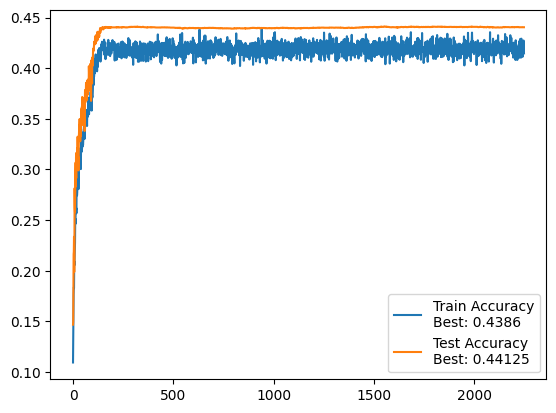

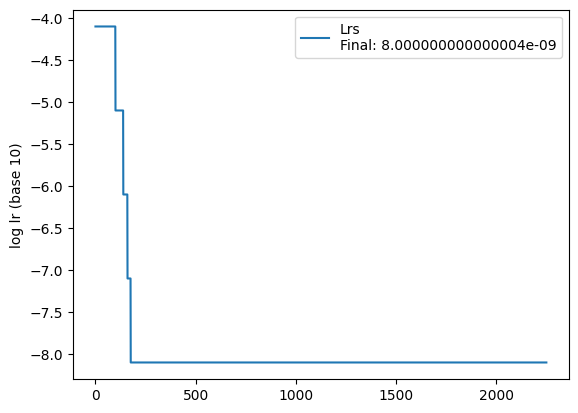


 =============== Epoch 2251 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.0%, Avg loss: 1.565367, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.0%, Avg loss: 1.513034

 =============== Epoch 2252 ===============


100%|██████████| 40/40 [00:16<00:00,  2.39it/s]


 Train accuracy: 42.0%, Avg loss: 1.530364, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.0%, Avg loss: 1.513039

 =============== Epoch 2253 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 41.3%, Avg loss: 1.560335, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.84it/s]


 Test accuracy: 44.0%, Avg loss: 1.513041

 =============== Epoch 2254 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.563078, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.89it/s]


 Test accuracy: 44.0%, Avg loss: 1.513048

 =============== Epoch 2255 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 41.8%, Avg loss: 1.554483, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.0%, Avg loss: 1.513035

 =============== Epoch 2256 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.5%, Avg loss: 1.562407, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.83it/s]


 Test accuracy: 44.0%, Avg loss: 1.513037

 =============== Epoch 2257 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 42.5%, Avg loss: 1.572870, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.0%, Avg loss: 1.513033

 =============== Epoch 2258 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.2%, Avg loss: 1.563418, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.88it/s]


 Test accuracy: 44.0%, Avg loss: 1.513026

 =============== Epoch 2259 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.1%, Avg loss: 1.555581, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.0%, Avg loss: 1.513018

 =============== Epoch 2260 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.547720, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.0%, Avg loss: 1.513037

 =============== Epoch 2261 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.0%, Avg loss: 1.558811, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.0%, Avg loss: 1.513038

 =============== Epoch 2262 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.6%, Avg loss: 1.560478, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.83it/s]


 Test accuracy: 44.0%, Avg loss: 1.513028

 =============== Epoch 2263 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.573457, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.87it/s]


 Test accuracy: 44.0%, Avg loss: 1.513030

 =============== Epoch 2264 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 40.9%, Avg loss: 1.579256, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.0%, Avg loss: 1.513021

 =============== Epoch 2265 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.1%, Avg loss: 1.549490, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.0%, Avg loss: 1.513019

 =============== Epoch 2266 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 42.6%, Avg loss: 1.539593, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.0%, Avg loss: 1.513008

 =============== Epoch 2267 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.2%, Avg loss: 1.537852, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.92it/s]


 Test accuracy: 44.0%, Avg loss: 1.513013

 =============== Epoch 2268 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.565345, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.86it/s]


 Test accuracy: 44.0%, Avg loss: 1.513012

 =============== Epoch 2269 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.9%, Avg loss: 1.544313, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.83it/s]


 Test accuracy: 44.0%, Avg loss: 1.513018

 =============== Epoch 2270 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 42.0%, Avg loss: 1.549410, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.0%, Avg loss: 1.513019

 =============== Epoch 2271 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.560835, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.85it/s]


 Test accuracy: 44.0%, Avg loss: 1.513016

 =============== Epoch 2272 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 40.9%, Avg loss: 1.573202, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.91it/s]


 Test accuracy: 44.0%, Avg loss: 1.513021

 =============== Epoch 2273 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.1%, Avg loss: 1.563304, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


 Test accuracy: 44.0%, Avg loss: 1.513020

 =============== Epoch 2274 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.2%, Avg loss: 1.550729, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.0%, Avg loss: 1.513011

 =============== Epoch 2275 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 42.0%, Avg loss: 1.561616, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.0%, Avg loss: 1.512991

 =============== Epoch 2276 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 41.4%, Avg loss: 1.567727, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.84it/s]


 Test accuracy: 44.0%, Avg loss: 1.512995

 =============== Epoch 2277 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.568626, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.87it/s]


 Test accuracy: 44.0%, Avg loss: 1.512984

 =============== Epoch 2278 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.553272, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.0%, Avg loss: 1.512974

 =============== Epoch 2279 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 40.9%, Avg loss: 1.577370, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.0%, Avg loss: 1.512966

 =============== Epoch 2280 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 41.5%, Avg loss: 1.561102, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.0%, Avg loss: 1.512970

 =============== Epoch 2281 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.5%, Avg loss: 1.560467, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.94it/s]


 Test accuracy: 44.0%, Avg loss: 1.512964

 =============== Epoch 2282 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.8%, Avg loss: 1.563505, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.0%, Avg loss: 1.512964

 =============== Epoch 2283 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 42.8%, Avg loss: 1.566542, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.0%, Avg loss: 1.512963

 =============== Epoch 2284 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.5%, Avg loss: 1.570940, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.0%, Avg loss: 1.512956

 =============== Epoch 2285 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 42.3%, Avg loss: 1.551878, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.0%, Avg loss: 1.512950

 =============== Epoch 2286 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.2%, Avg loss: 1.581572, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.92it/s]


 Test accuracy: 44.0%, Avg loss: 1.512941

 =============== Epoch 2287 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.552758, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.0%, Avg loss: 1.512944

 =============== Epoch 2288 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.548658, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.0%, Avg loss: 1.512940

 =============== Epoch 2289 ===============


100%|██████████| 40/40 [00:16<00:00,  2.39it/s]


 Train accuracy: 42.1%, Avg loss: 1.555155, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.0%, Avg loss: 1.512938

 =============== Epoch 2290 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.4%, Avg loss: 1.550777, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.0%, Avg loss: 1.512951

 =============== Epoch 2291 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.549588, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.0%, Avg loss: 1.512963

 =============== Epoch 2292 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.1%, Avg loss: 1.571200, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.0%, Avg loss: 1.512966

 =============== Epoch 2293 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.559644, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.0%, Avg loss: 1.512951

 =============== Epoch 2294 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.569655, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.0%, Avg loss: 1.512952

 =============== Epoch 2295 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.0%, Avg loss: 1.547011, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.0%, Avg loss: 1.512949

 =============== Epoch 2296 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.3%, Avg loss: 1.547115, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.0%, Avg loss: 1.512951

 =============== Epoch 2297 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.3%, Avg loss: 1.544599, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


 Test accuracy: 44.0%, Avg loss: 1.512951

 =============== Epoch 2298 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.5%, Avg loss: 1.536616, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.0%, Avg loss: 1.512935

 =============== Epoch 2299 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.548567, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.0%, Avg loss: 1.512934

 =============== Epoch 2300 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.547177, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.0%, Avg loss: 1.512932


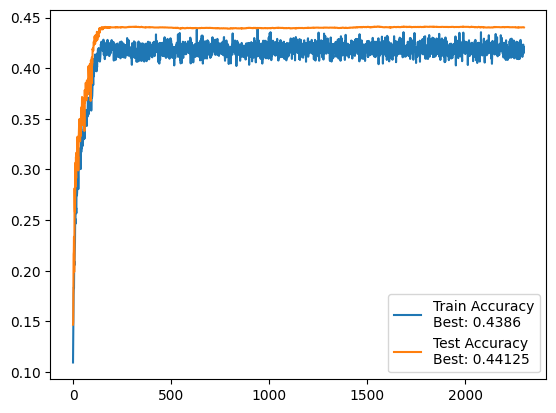

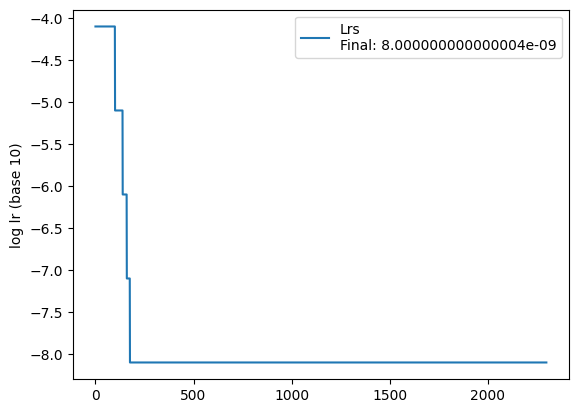


 =============== Epoch 2301 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.8%, Avg loss: 1.547460, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.0%, Avg loss: 1.512936

 =============== Epoch 2302 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.3%, Avg loss: 1.566412, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.0%, Avg loss: 1.512940

 =============== Epoch 2303 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.9%, Avg loss: 1.527370, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.0%, Avg loss: 1.512948

 =============== Epoch 2304 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.542452, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.0%, Avg loss: 1.512950

 =============== Epoch 2305 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 43.2%, Avg loss: 1.542976, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.0%, Avg loss: 1.512944

 =============== Epoch 2306 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 43.0%, Avg loss: 1.550675, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.0%, Avg loss: 1.512943

 =============== Epoch 2307 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.562571, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.0%, Avg loss: 1.512942

 =============== Epoch 2308 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.1%, Avg loss: 1.560174, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.0%, Avg loss: 1.512956

 =============== Epoch 2309 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.542589, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.0%, Avg loss: 1.512962

 =============== Epoch 2310 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.558602, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.0%, Avg loss: 1.512954

 =============== Epoch 2311 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.4%, Avg loss: 1.577658, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.0%, Avg loss: 1.512963

 =============== Epoch 2312 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.546307, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.0%, Avg loss: 1.512961

 =============== Epoch 2313 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.5%, Avg loss: 1.580084, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.0%, Avg loss: 1.512961

 =============== Epoch 2314 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.553780, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.0%, Avg loss: 1.512951

 =============== Epoch 2315 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.4%, Avg loss: 1.562576, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.0%, Avg loss: 1.512955

 =============== Epoch 2316 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.565027, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.0%, Avg loss: 1.512948

 =============== Epoch 2317 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.545520, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.0%, Avg loss: 1.512947

 =============== Epoch 2318 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.546538, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.0%, Avg loss: 1.512948

 =============== Epoch 2319 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.3%, Avg loss: 1.560871, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.0%, Avg loss: 1.512939

 =============== Epoch 2320 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.546827, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.0%, Avg loss: 1.512951

 =============== Epoch 2321 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.6%, Avg loss: 1.540967, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.0%, Avg loss: 1.512952

 =============== Epoch 2322 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.562163, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.0%, Avg loss: 1.512963

 =============== Epoch 2323 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.4%, Avg loss: 1.551303, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.0%, Avg loss: 1.512971

 =============== Epoch 2324 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.7%, Avg loss: 1.567795, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.0%, Avg loss: 1.512973

 =============== Epoch 2325 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.579579, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.0%, Avg loss: 1.512966

 =============== Epoch 2326 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.571063, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.0%, Avg loss: 1.512961

 =============== Epoch 2327 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.581965, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.0%, Avg loss: 1.512955

 =============== Epoch 2328 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 40.7%, Avg loss: 1.567487, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.0%, Avg loss: 1.512959

 =============== Epoch 2329 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.6%, Avg loss: 1.553963, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.0%, Avg loss: 1.512959

 =============== Epoch 2330 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.540978, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


 Test accuracy: 44.0%, Avg loss: 1.512970

 =============== Epoch 2331 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 43.4%, Avg loss: 1.546220, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512956

 =============== Epoch 2332 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.2%, Avg loss: 1.536742, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512956

 =============== Epoch 2333 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.9%, Avg loss: 1.573953, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.0%, Avg loss: 1.512959

 =============== Epoch 2334 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.5%, Avg loss: 1.587345, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.0%, Avg loss: 1.512949

 =============== Epoch 2335 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.567193, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.0%, Avg loss: 1.512944

 =============== Epoch 2336 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.4%, Avg loss: 1.540776, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512937

 =============== Epoch 2337 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 43.4%, Avg loss: 1.551664, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512940

 =============== Epoch 2338 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.531216, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512940

 =============== Epoch 2339 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.4%, Avg loss: 1.558378, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512948

 =============== Epoch 2340 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.6%, Avg loss: 1.545475, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.0%, Avg loss: 1.512934

 =============== Epoch 2341 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.6%, Avg loss: 1.542276, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512942

 =============== Epoch 2342 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.564429, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512947

 =============== Epoch 2343 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.7%, Avg loss: 1.552474, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512956

 =============== Epoch 2344 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.558933, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512951

 =============== Epoch 2345 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 42.2%, Avg loss: 1.560517, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512957

 =============== Epoch 2346 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.2%, Avg loss: 1.546283, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512945

 =============== Epoch 2347 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.9%, Avg loss: 1.556267, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.512940

 =============== Epoch 2348 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.8%, Avg loss: 1.554279, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512949

 =============== Epoch 2349 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.540850, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.1%, Avg loss: 1.512939

 =============== Epoch 2350 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.6%, Avg loss: 1.569977, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512939


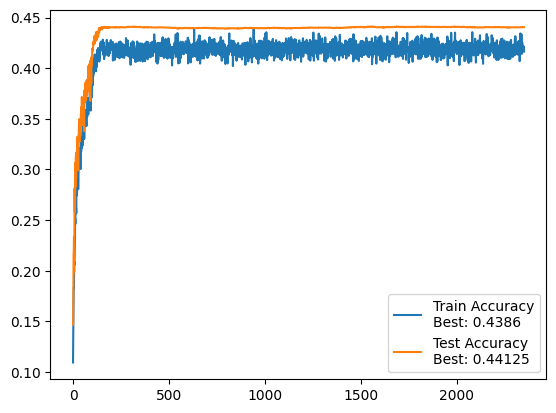

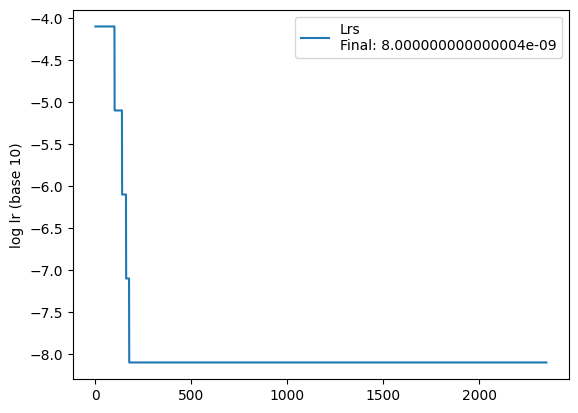


 =============== Epoch 2351 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.561527, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.0%, Avg loss: 1.512942

 =============== Epoch 2352 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 40.9%, Avg loss: 1.572475, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.0%, Avg loss: 1.512941

 =============== Epoch 2353 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.573890, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.0%, Avg loss: 1.512956

 =============== Epoch 2354 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.8%, Avg loss: 1.553259, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.0%, Avg loss: 1.512951

 =============== Epoch 2355 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 42.5%, Avg loss: 1.562538, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.0%, Avg loss: 1.512941

 =============== Epoch 2356 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.8%, Avg loss: 1.550468, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.0%, Avg loss: 1.512950

 =============== Epoch 2357 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.9%, Avg loss: 1.576020, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.0%, Avg loss: 1.512944

 =============== Epoch 2358 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.2%, Avg loss: 1.561210, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512948

 =============== Epoch 2359 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.4%, Avg loss: 1.585407, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.1%, Avg loss: 1.512944

 =============== Epoch 2360 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.5%, Avg loss: 1.551526, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512941

 =============== Epoch 2361 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.2%, Avg loss: 1.569925, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512932

 =============== Epoch 2362 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.559757, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512930

 =============== Epoch 2363 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.567979, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512931

 =============== Epoch 2364 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.578039, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512917

 =============== Epoch 2365 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.1%, Avg loss: 1.573713, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.84it/s]


 Test accuracy: 44.1%, Avg loss: 1.512905

 =============== Epoch 2366 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.4%, Avg loss: 1.552373, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.512910

 =============== Epoch 2367 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.541465, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512920

 =============== Epoch 2368 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.574532, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512923

 =============== Epoch 2369 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.5%, Avg loss: 1.563514, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512929

 =============== Epoch 2370 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.562282, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.85it/s]


 Test accuracy: 44.1%, Avg loss: 1.512923

 =============== Epoch 2371 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.6%, Avg loss: 1.548544, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512935

 =============== Epoch 2372 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.7%, Avg loss: 1.550251, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512934

 =============== Epoch 2373 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.548267, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512929

 =============== Epoch 2374 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 43.0%, Avg loss: 1.551048, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512931

 =============== Epoch 2375 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.4%, Avg loss: 1.557874, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.83it/s]


 Test accuracy: 44.1%, Avg loss: 1.512934

 =============== Epoch 2376 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.6%, Avg loss: 1.556559, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512931

 =============== Epoch 2377 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.7%, Avg loss: 1.548833, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512925

 =============== Epoch 2378 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.5%, Avg loss: 1.537095, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512927

 =============== Epoch 2379 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.3%, Avg loss: 1.552776, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512935

 =============== Epoch 2380 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.553577, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.0%, Avg loss: 1.512939

 =============== Epoch 2381 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.8%, Avg loss: 1.545900, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.0%, Avg loss: 1.512942

 =============== Epoch 2382 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.8%, Avg loss: 1.543577, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.0%, Avg loss: 1.512939

 =============== Epoch 2383 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.1%, Avg loss: 1.566615, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.0%, Avg loss: 1.512946

 =============== Epoch 2384 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.9%, Avg loss: 1.539384, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


 Test accuracy: 44.1%, Avg loss: 1.512951

 =============== Epoch 2385 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.566919, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.0%, Avg loss: 1.512934

 =============== Epoch 2386 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 41.4%, Avg loss: 1.573505, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512935

 =============== Epoch 2387 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.565357, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.0%, Avg loss: 1.512926

 =============== Epoch 2388 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.5%, Avg loss: 1.566760, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512920

 =============== Epoch 2389 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 40.1%, Avg loss: 1.576487, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.0%, Avg loss: 1.512926

 =============== Epoch 2390 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.563753, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.0%, Avg loss: 1.512927

 =============== Epoch 2391 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.539164, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.0%, Avg loss: 1.512941

 =============== Epoch 2392 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 40.9%, Avg loss: 1.567291, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.0%, Avg loss: 1.512941

 =============== Epoch 2393 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.7%, Avg loss: 1.562479, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.0%, Avg loss: 1.512952

 =============== Epoch 2394 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.551378, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512953

 =============== Epoch 2395 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.555705, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512943

 =============== Epoch 2396 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.0%, Avg loss: 1.574544, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512945

 =============== Epoch 2397 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.4%, Avg loss: 1.541011, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512950

 =============== Epoch 2398 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.8%, Avg loss: 1.566553, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.83it/s]


 Test accuracy: 44.1%, Avg loss: 1.512949

 =============== Epoch 2399 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.8%, Avg loss: 1.552577, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.0%, Avg loss: 1.512940

 =============== Epoch 2400 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.561642, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.0%, Avg loss: 1.512937


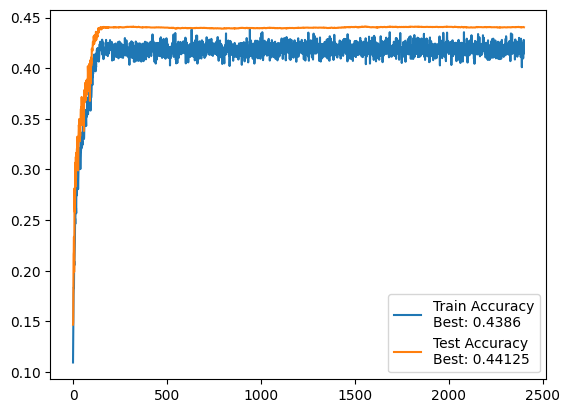

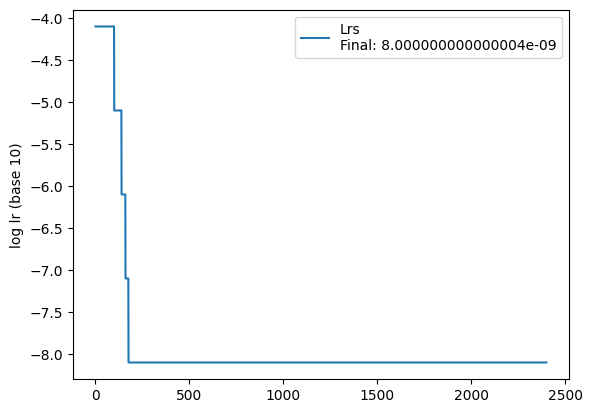


 =============== Epoch 2401 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.1%, Avg loss: 1.551059, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.0%, Avg loss: 1.512927

 =============== Epoch 2402 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.4%, Avg loss: 1.535306, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.0%, Avg loss: 1.512929

 =============== Epoch 2403 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.1%, Avg loss: 1.556848, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.0%, Avg loss: 1.512917

 =============== Epoch 2404 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.553415, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512903

 =============== Epoch 2405 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.564047, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.0%, Avg loss: 1.512903

 =============== Epoch 2406 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.556239, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.0%, Avg loss: 1.512897

 =============== Epoch 2407 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.558256, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.0%, Avg loss: 1.512898

 =============== Epoch 2408 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.556784, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.0%, Avg loss: 1.512902

 =============== Epoch 2409 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.580958, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512897

 =============== Epoch 2410 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.558549, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512895

 =============== Epoch 2411 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.4%, Avg loss: 1.544013, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512907

 =============== Epoch 2412 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.546716, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.1%, Avg loss: 1.512913

 =============== Epoch 2413 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.539471, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512918

 =============== Epoch 2414 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.3%, Avg loss: 1.560213, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.0%, Avg loss: 1.512929

 =============== Epoch 2415 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.8%, Avg loss: 1.541470, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.0%, Avg loss: 1.512929

 =============== Epoch 2416 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.3%, Avg loss: 1.566643, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.0%, Avg loss: 1.512917

 =============== Epoch 2417 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.573916, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.84it/s]


 Test accuracy: 44.0%, Avg loss: 1.512903

 =============== Epoch 2418 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.568434, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.0%, Avg loss: 1.512904

 =============== Epoch 2419 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.2%, Avg loss: 1.560029, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.0%, Avg loss: 1.512887

 =============== Epoch 2420 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.551446, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.0%, Avg loss: 1.512881

 =============== Epoch 2421 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.4%, Avg loss: 1.551449, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.0%, Avg loss: 1.512867

 =============== Epoch 2422 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.4%, Avg loss: 1.554866, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512874

 =============== Epoch 2423 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.569399, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.0%, Avg loss: 1.512875

 =============== Epoch 2424 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.6%, Avg loss: 1.530134, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.0%, Avg loss: 1.512890

 =============== Epoch 2425 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.564769, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.1%, Avg loss: 1.512890

 =============== Epoch 2426 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.3%, Avg loss: 1.568176, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512888

 =============== Epoch 2427 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.551771, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512889

 =============== Epoch 2428 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.4%, Avg loss: 1.539172, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512879

 =============== Epoch 2429 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.559050, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.0%, Avg loss: 1.512870

 =============== Epoch 2430 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.1%, Avg loss: 1.549601, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.0%, Avg loss: 1.512867

 =============== Epoch 2431 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.556572, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.0%, Avg loss: 1.512867

 =============== Epoch 2432 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.554608, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512879

 =============== Epoch 2433 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.593332, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512890

 =============== Epoch 2434 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.9%, Avg loss: 1.550373, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512880

 =============== Epoch 2435 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.559280, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512880

 =============== Epoch 2436 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.7%, Avg loss: 1.560530, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512866

 =============== Epoch 2437 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.557025, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512873

 =============== Epoch 2438 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.559187, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.60it/s]


 Test accuracy: 44.1%, Avg loss: 1.512873

 =============== Epoch 2439 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.6%, Avg loss: 1.544689, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512865

 =============== Epoch 2440 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.6%, Avg loss: 1.558456, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512863

 =============== Epoch 2441 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.558409, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512852

 =============== Epoch 2442 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.557248, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512830

 =============== Epoch 2443 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.8%, Avg loss: 1.546418, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512819

 =============== Epoch 2444 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.7%, Avg loss: 1.545110, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512819

 =============== Epoch 2445 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.3%, Avg loss: 1.563537, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512821

 =============== Epoch 2446 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.1%, Avg loss: 1.545018, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512823

 =============== Epoch 2447 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.561332, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512831

 =============== Epoch 2448 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.4%, Avg loss: 1.566280, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512835

 =============== Epoch 2449 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.543910, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512836

 =============== Epoch 2450 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.553537, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512820


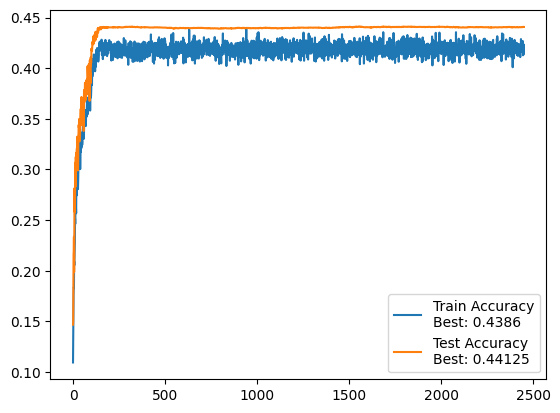

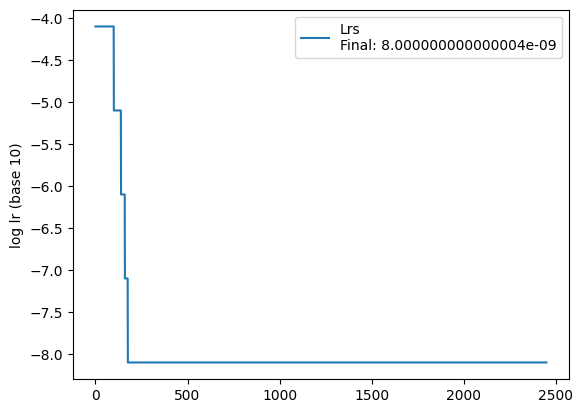


 =============== Epoch 2451 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.0%, Avg loss: 1.554431, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512828

 =============== Epoch 2452 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.540204, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512838

 =============== Epoch 2453 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.4%, Avg loss: 1.550741, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512860

 =============== Epoch 2454 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.553135, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512853

 =============== Epoch 2455 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 40.9%, Avg loss: 1.563229, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512842

 =============== Epoch 2456 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 40.6%, Avg loss: 1.574233, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512832

 =============== Epoch 2457 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.6%, Avg loss: 1.552349, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512837

 =============== Epoch 2458 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.6%, Avg loss: 1.566399, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512830

 =============== Epoch 2459 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.3%, Avg loss: 1.572888, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


 Test accuracy: 44.1%, Avg loss: 1.512830

 =============== Epoch 2460 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.560572, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512829

 =============== Epoch 2461 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 43.2%, Avg loss: 1.549928, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512838

 =============== Epoch 2462 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 43.3%, Avg loss: 1.535917, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512843

 =============== Epoch 2463 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.5%, Avg loss: 1.553163, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512850

 =============== Epoch 2464 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.536194, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.0%, Avg loss: 1.512852

 =============== Epoch 2465 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.559369, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.512859

 =============== Epoch 2466 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.6%, Avg loss: 1.591789, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.1%, Avg loss: 1.512852

 =============== Epoch 2467 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.573800, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512855

 =============== Epoch 2468 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.557094, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512855

 =============== Epoch 2469 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.553326, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512846

 =============== Epoch 2470 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.9%, Avg loss: 1.558990, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512856

 =============== Epoch 2471 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.7%, Avg loss: 1.551038, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


 Test accuracy: 44.1%, Avg loss: 1.512865

 =============== Epoch 2472 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.8%, Avg loss: 1.552286, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512864

 =============== Epoch 2473 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.7%, Avg loss: 1.556063, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512860

 =============== Epoch 2474 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.557422, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512867

 =============== Epoch 2475 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.4%, Avg loss: 1.542646, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512865

 =============== Epoch 2476 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.5%, Avg loss: 1.564533, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512881

 =============== Epoch 2477 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.8%, Avg loss: 1.551329, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512880

 =============== Epoch 2478 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.539157, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.83it/s]


 Test accuracy: 44.1%, Avg loss: 1.512897

 =============== Epoch 2479 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.544207, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512896

 =============== Epoch 2480 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.6%, Avg loss: 1.564466, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.1%, Avg loss: 1.512905

 =============== Epoch 2481 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.2%, Avg loss: 1.554374, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.0%, Avg loss: 1.512923

 =============== Epoch 2482 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 40.6%, Avg loss: 1.575961, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.0%, Avg loss: 1.512913

 =============== Epoch 2483 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 40.8%, Avg loss: 1.561480, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.0%, Avg loss: 1.512922

 =============== Epoch 2484 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.553932, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512920

 =============== Epoch 2485 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.3%, Avg loss: 1.548185, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512924

 =============== Epoch 2486 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.8%, Avg loss: 1.547307, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.0%, Avg loss: 1.512911

 =============== Epoch 2487 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.554487, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.0%, Avg loss: 1.512896

 =============== Epoch 2488 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.557934, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512879

 =============== Epoch 2489 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.558559, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512863

 =============== Epoch 2490 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.5%, Avg loss: 1.536877, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.58it/s]


 Test accuracy: 44.1%, Avg loss: 1.512842

 =============== Epoch 2491 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.5%, Avg loss: 1.534771, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.1%, Avg loss: 1.512852

 =============== Epoch 2492 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.565697, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512846

 =============== Epoch 2493 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.544220, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512848

 =============== Epoch 2494 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.545336, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


 Test accuracy: 44.1%, Avg loss: 1.512845

 =============== Epoch 2495 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.5%, Avg loss: 1.550548, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512844

 =============== Epoch 2496 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.2%, Avg loss: 1.548513, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512854

 =============== Epoch 2497 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.562348, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.83it/s]


 Test accuracy: 44.1%, Avg loss: 1.512843

 =============== Epoch 2498 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.547001, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512834

 =============== Epoch 2499 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.560790, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512835

 =============== Epoch 2500 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.541671, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512824


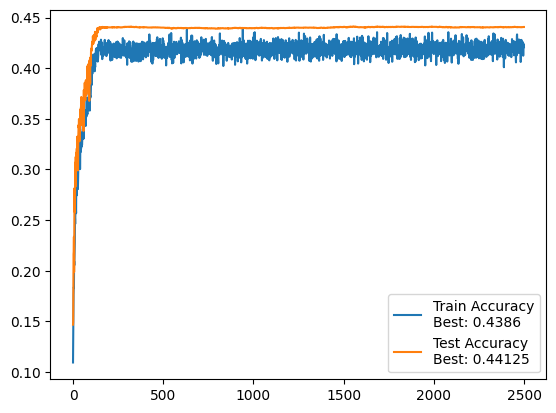

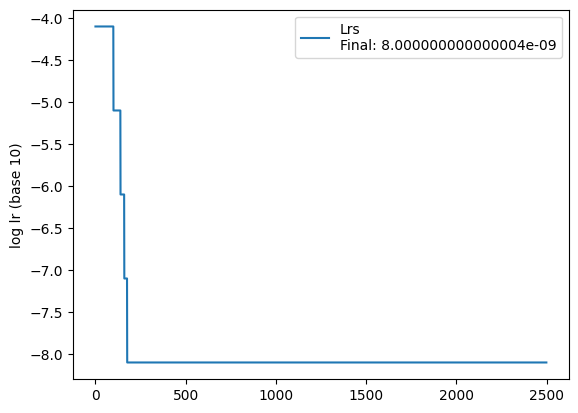


 =============== Epoch 2501 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.545014, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512826

 =============== Epoch 2502 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.558135, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512827

 =============== Epoch 2503 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.536649, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512818

 =============== Epoch 2504 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.0%, Avg loss: 1.574943, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512825

 =============== Epoch 2505 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.557182, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512819

 =============== Epoch 2506 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.570943, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.512822

 =============== Epoch 2507 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 41.8%, Avg loss: 1.553309, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512820

 =============== Epoch 2508 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.548671, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512813

 =============== Epoch 2509 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 43.0%, Avg loss: 1.551424, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512820

 =============== Epoch 2510 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.3%, Avg loss: 1.554576, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512817

 =============== Epoch 2511 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 40.9%, Avg loss: 1.570362, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.83it/s]


 Test accuracy: 44.1%, Avg loss: 1.512818

 =============== Epoch 2512 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.2%, Avg loss: 1.562360, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512807

 =============== Epoch 2513 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.7%, Avg loss: 1.553364, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512804

 =============== Epoch 2514 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.8%, Avg loss: 1.564261, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512798

 =============== Epoch 2515 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.555807, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512798

 =============== Epoch 2516 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.551169, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512789

 =============== Epoch 2517 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.552650, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512786

 =============== Epoch 2518 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 43.3%, Avg loss: 1.539904, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512775

 =============== Epoch 2519 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.7%, Avg loss: 1.560211, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512771

 =============== Epoch 2520 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.567931, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512771

 =============== Epoch 2521 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.568606, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512777

 =============== Epoch 2522 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.552208, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512774

 =============== Epoch 2523 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.556560, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512762

 =============== Epoch 2524 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.559694, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512760

 =============== Epoch 2525 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.3%, Avg loss: 1.579396, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.83it/s]


 Test accuracy: 44.1%, Avg loss: 1.512762

 =============== Epoch 2526 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.554652, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512766

 =============== Epoch 2527 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.4%, Avg loss: 1.561921, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512773

 =============== Epoch 2528 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 40.9%, Avg loss: 1.562512, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


 Test accuracy: 44.1%, Avg loss: 1.512783

 =============== Epoch 2529 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.6%, Avg loss: 1.553344, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.1%, Avg loss: 1.512793

 =============== Epoch 2530 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.2%, Avg loss: 1.570763, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512804

 =============== Epoch 2531 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.548870, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512811

 =============== Epoch 2532 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.549216, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512816

 =============== Epoch 2533 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.550815, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512811

 =============== Epoch 2534 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.8%, Avg loss: 1.560299, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512811

 =============== Epoch 2535 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.2%, Avg loss: 1.561262, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512798

 =============== Epoch 2536 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.1%, Avg loss: 1.561693, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512796

 =============== Epoch 2537 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.4%, Avg loss: 1.539268, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512805

 =============== Epoch 2538 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.536286, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512820

 =============== Epoch 2539 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.556746, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512817

 =============== Epoch 2540 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.2%, Avg loss: 1.550996, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512824

 =============== Epoch 2541 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.4%, Avg loss: 1.552245, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512829

 =============== Epoch 2542 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.5%, Avg loss: 1.551261, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512840

 =============== Epoch 2543 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.9%, Avg loss: 1.529822, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512843

 =============== Epoch 2544 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.2%, Avg loss: 1.561243, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512829

 =============== Epoch 2545 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.4%, Avg loss: 1.572157, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512844

 =============== Epoch 2546 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.4%, Avg loss: 1.577434, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


 Test accuracy: 44.1%, Avg loss: 1.512837

 =============== Epoch 2547 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.6%, Avg loss: 1.563471, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512834

 =============== Epoch 2548 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.9%, Avg loss: 1.564087, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512840

 =============== Epoch 2549 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.3%, Avg loss: 1.524636, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512828

 =============== Epoch 2550 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.572675, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512830


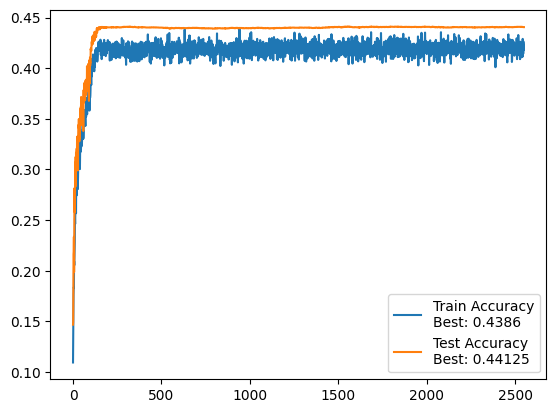

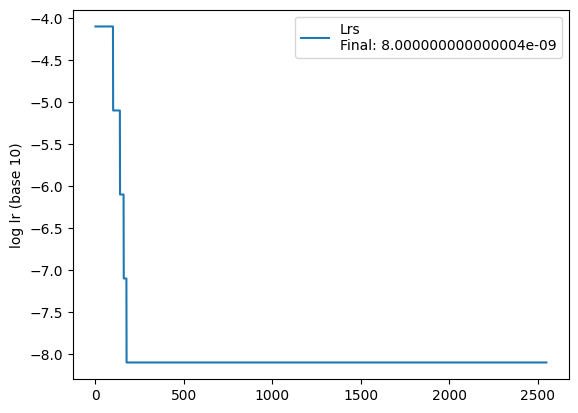


 =============== Epoch 2551 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.8%, Avg loss: 1.526018, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


 Test accuracy: 44.1%, Avg loss: 1.512821

 =============== Epoch 2552 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.4%, Avg loss: 1.558537, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512811

 =============== Epoch 2553 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.547771, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.1%, Avg loss: 1.512804

 =============== Epoch 2554 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.1%, Avg loss: 1.548560, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512809

 =============== Epoch 2555 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.546466, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512806

 =============== Epoch 2556 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 43.3%, Avg loss: 1.553069, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.1%, Avg loss: 1.512805

 =============== Epoch 2557 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.7%, Avg loss: 1.548329, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.52it/s]


 Test accuracy: 44.1%, Avg loss: 1.512798

 =============== Epoch 2558 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.4%, Avg loss: 1.569435, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512800

 =============== Epoch 2559 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 43.4%, Avg loss: 1.536370, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512819

 =============== Epoch 2560 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.2%, Avg loss: 1.558174, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512814

 =============== Epoch 2561 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.554373, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512810

 =============== Epoch 2562 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.2%, Avg loss: 1.543077, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512809

 =============== Epoch 2563 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.2%, Avg loss: 1.577135, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512824

 =============== Epoch 2564 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.553506, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512823

 =============== Epoch 2565 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 40.9%, Avg loss: 1.573766, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512832

 =============== Epoch 2566 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.8%, Avg loss: 1.556860, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512826

 =============== Epoch 2567 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 40.6%, Avg loss: 1.563812, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512813

 =============== Epoch 2568 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.577920, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512821

 =============== Epoch 2569 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.8%, Avg loss: 1.543808, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512820

 =============== Epoch 2570 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 43.1%, Avg loss: 1.542106, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512826

 =============== Epoch 2571 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.4%, Avg loss: 1.553180, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512817

 =============== Epoch 2572 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.7%, Avg loss: 1.555240, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512818

 =============== Epoch 2573 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.7%, Avg loss: 1.556699, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512827

 =============== Epoch 2574 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.0%, Avg loss: 1.563128, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512824

 =============== Epoch 2575 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.560002, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512828

 =============== Epoch 2576 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.549747, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512816

 =============== Epoch 2577 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.552598, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512821

 =============== Epoch 2578 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 40.9%, Avg loss: 1.554180, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512822

 =============== Epoch 2579 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.555218, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.1%, Avg loss: 1.512825

 =============== Epoch 2580 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.8%, Avg loss: 1.549690, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512832

 =============== Epoch 2581 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.2%, Avg loss: 1.556936, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512818

 =============== Epoch 2582 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.4%, Avg loss: 1.549956, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512816

 =============== Epoch 2583 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.6%, Avg loss: 1.552175, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.58it/s]


 Test accuracy: 44.1%, Avg loss: 1.512799

 =============== Epoch 2584 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.538298, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512805

 =============== Epoch 2585 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.549023, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512801

 =============== Epoch 2586 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 41.5%, Avg loss: 1.546939, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512798

 =============== Epoch 2587 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.4%, Avg loss: 1.559929, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512809

 =============== Epoch 2588 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.8%, Avg loss: 1.570524, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512793

 =============== Epoch 2589 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.556765, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512782

 =============== Epoch 2590 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.561900, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512782

 =============== Epoch 2591 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.563469, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512779

 =============== Epoch 2592 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.541446, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512763

 =============== Epoch 2593 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.5%, Avg loss: 1.546123, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512764

 =============== Epoch 2594 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.557202, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512769

 =============== Epoch 2595 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.574794, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512767

 =============== Epoch 2596 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 42.5%, Avg loss: 1.538765, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512781

 =============== Epoch 2597 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.545624, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512791

 =============== Epoch 2598 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 43.1%, Avg loss: 1.537214, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.1%, Avg loss: 1.512794

 =============== Epoch 2599 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.547440, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


 Test accuracy: 44.1%, Avg loss: 1.512791

 =============== Epoch 2600 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.7%, Avg loss: 1.552896, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512787


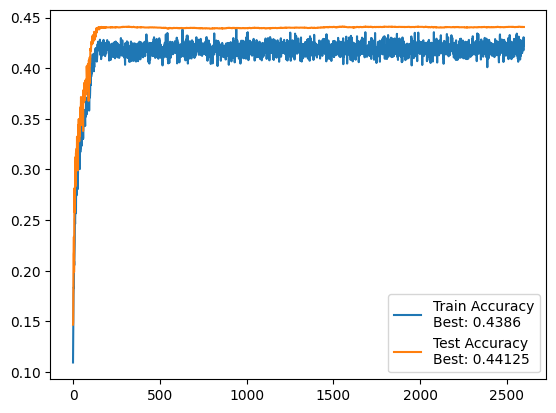

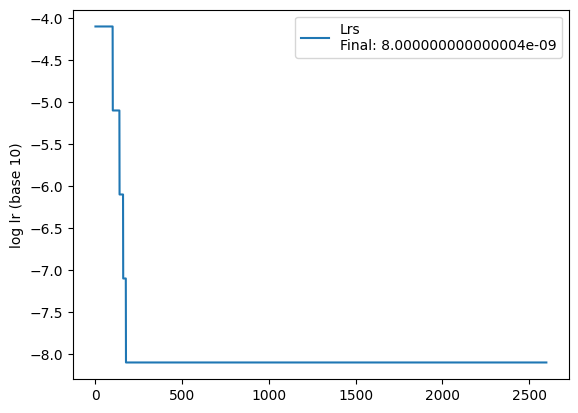


 =============== Epoch 2601 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.9%, Avg loss: 1.549314, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512772

 =============== Epoch 2602 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.571772, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512768

 =============== Epoch 2603 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 42.2%, Avg loss: 1.551812, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512769

 =============== Epoch 2604 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.575157, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512765

 =============== Epoch 2605 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.563838, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512765

 =============== Epoch 2606 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.5%, Avg loss: 1.548993, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512756

 =============== Epoch 2607 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.0%, Avg loss: 1.557954, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


 Test accuracy: 44.1%, Avg loss: 1.512748

 =============== Epoch 2608 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.9%, Avg loss: 1.546244, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.1%, Avg loss: 1.512747

 =============== Epoch 2609 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.560214, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512757

 =============== Epoch 2610 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.3%, Avg loss: 1.566836, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512747

 =============== Epoch 2611 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.6%, Avg loss: 1.559797, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512762

 =============== Epoch 2612 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.2%, Avg loss: 1.563037, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512763

 =============== Epoch 2613 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.4%, Avg loss: 1.565175, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512762

 =============== Epoch 2614 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.546231, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


 Test accuracy: 44.1%, Avg loss: 1.512758

 =============== Epoch 2615 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.6%, Avg loss: 1.549494, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.512764

 =============== Epoch 2616 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.548146, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512765

 =============== Epoch 2617 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.0%, Avg loss: 1.553893, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512772

 =============== Epoch 2618 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.546610, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512761

 =============== Epoch 2619 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.572264, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512752

 =============== Epoch 2620 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.550028, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512752

 =============== Epoch 2621 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.541324, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512750

 =============== Epoch 2622 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.2%, Avg loss: 1.570340, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.1%, Avg loss: 1.512744

 =============== Epoch 2623 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.553557, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512741

 =============== Epoch 2624 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 43.1%, Avg loss: 1.549456, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512753

 =============== Epoch 2625 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.542172, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512754

 =============== Epoch 2626 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.556469, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512757

 =============== Epoch 2627 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.548574, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512758

 =============== Epoch 2628 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.2%, Avg loss: 1.560675, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512748

 =============== Epoch 2629 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.544606, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512762

 =============== Epoch 2630 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 43.4%, Avg loss: 1.540502, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512758

 =============== Epoch 2631 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.4%, Avg loss: 1.557094, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512753

 =============== Epoch 2632 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.4%, Avg loss: 1.572937, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.1%, Avg loss: 1.512751

 =============== Epoch 2633 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.554762, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512748

 =============== Epoch 2634 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.561730, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512746

 =============== Epoch 2635 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 42.0%, Avg loss: 1.541124, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512727

 =============== Epoch 2636 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.567516, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512743

 =============== Epoch 2637 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.6%, Avg loss: 1.549329, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.512744

 =============== Epoch 2638 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.4%, Avg loss: 1.565170, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512746

 =============== Epoch 2639 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.530541, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512755

 =============== Epoch 2640 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.539859, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512765

 =============== Epoch 2641 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.7%, Avg loss: 1.539976, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512771

 =============== Epoch 2642 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.5%, Avg loss: 1.543206, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512780

 =============== Epoch 2643 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.1%, Avg loss: 1.559880, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512779

 =============== Epoch 2644 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.3%, Avg loss: 1.573440, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512783

 =============== Epoch 2645 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.534371, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512781

 =============== Epoch 2646 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.3%, Avg loss: 1.568274, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512781

 =============== Epoch 2647 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.544947, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.512784

 =============== Epoch 2648 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.0%, Avg loss: 1.538047, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512779

 =============== Epoch 2649 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 40.6%, Avg loss: 1.566154, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512783

 =============== Epoch 2650 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.8%, Avg loss: 1.573595, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512782


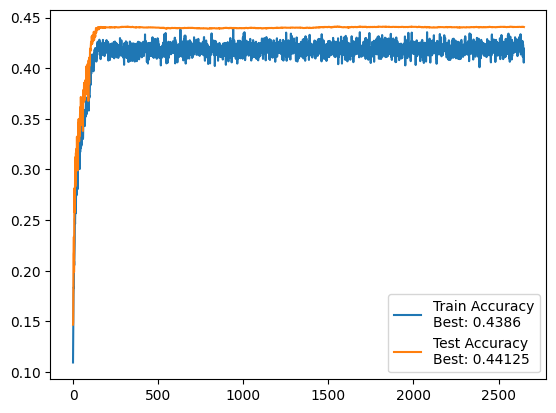

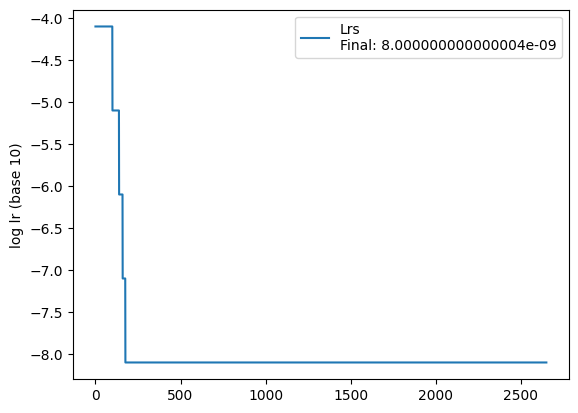


 =============== Epoch 2651 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.3%, Avg loss: 1.586614, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512766

 =============== Epoch 2652 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.536058, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.1%, Avg loss: 1.512767

 =============== Epoch 2653 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.567284, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512760

 =============== Epoch 2654 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 41.8%, Avg loss: 1.563155, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512757

 =============== Epoch 2655 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.561564, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.60it/s]


 Test accuracy: 44.1%, Avg loss: 1.512758

 =============== Epoch 2656 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.551935, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


 Test accuracy: 44.1%, Avg loss: 1.512755

 =============== Epoch 2657 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.539633, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512765

 =============== Epoch 2658 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 43.2%, Avg loss: 1.554566, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512759

 =============== Epoch 2659 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.563713, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512750

 =============== Epoch 2660 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.542556, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.1%, Avg loss: 1.512747

 =============== Epoch 2661 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.548846, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.1%, Avg loss: 1.512739

 =============== Epoch 2662 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.6%, Avg loss: 1.552191, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512729

 =============== Epoch 2663 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.9%, Avg loss: 1.539900, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512723

 =============== Epoch 2664 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.3%, Avg loss: 1.560323, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


 Test accuracy: 44.1%, Avg loss: 1.512727

 =============== Epoch 2665 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.542370, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512714

 =============== Epoch 2666 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.7%, Avg loss: 1.562622, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.83it/s]


 Test accuracy: 44.1%, Avg loss: 1.512710

 =============== Epoch 2667 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 40.2%, Avg loss: 1.594031, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512692

 =============== Epoch 2668 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.557085, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.1%, Avg loss: 1.512683

 =============== Epoch 2669 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.539205, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512686

 =============== Epoch 2670 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.7%, Avg loss: 1.567601, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512691

 =============== Epoch 2671 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.546396, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512692

 =============== Epoch 2672 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.560691, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512706

 =============== Epoch 2673 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.7%, Avg loss: 1.577189, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512703

 =============== Epoch 2674 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.1%, Avg loss: 1.563659, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512683

 =============== Epoch 2675 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.574334, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512684

 =============== Epoch 2676 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.2%, Avg loss: 1.573225, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512677

 =============== Epoch 2677 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.559521, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512679

 =============== Epoch 2678 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.543263, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512684

 =============== Epoch 2679 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.559505, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512685

 =============== Epoch 2680 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.9%, Avg loss: 1.538158, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


 Test accuracy: 44.1%, Avg loss: 1.512688

 =============== Epoch 2681 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.554803, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512698

 =============== Epoch 2682 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.564065, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512687

 =============== Epoch 2683 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 41.9%, Avg loss: 1.557456, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.1%, Avg loss: 1.512696

 =============== Epoch 2684 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.560388, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512691

 =============== Epoch 2685 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.5%, Avg loss: 1.555844, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512694

 =============== Epoch 2686 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.4%, Avg loss: 1.565970, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512696

 =============== Epoch 2687 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.580895, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512691

 =============== Epoch 2688 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.1%, Avg loss: 1.567660, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512699

 =============== Epoch 2689 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.4%, Avg loss: 1.561610, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512701

 =============== Epoch 2690 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.540135, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512693

 =============== Epoch 2691 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.564299, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512682

 =============== Epoch 2692 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 41.8%, Avg loss: 1.565158, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512685

 =============== Epoch 2693 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.543687, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512687

 =============== Epoch 2694 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.3%, Avg loss: 1.560228, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.1%, Avg loss: 1.512678

 =============== Epoch 2695 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.542612, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512680

 =============== Epoch 2696 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.7%, Avg loss: 1.549534, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512674

 =============== Epoch 2697 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.7%, Avg loss: 1.531875, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512680

 =============== Epoch 2698 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.2%, Avg loss: 1.550341, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512685

 =============== Epoch 2699 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.4%, Avg loss: 1.546807, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512692

 =============== Epoch 2700 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.7%, Avg loss: 1.575256, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512683


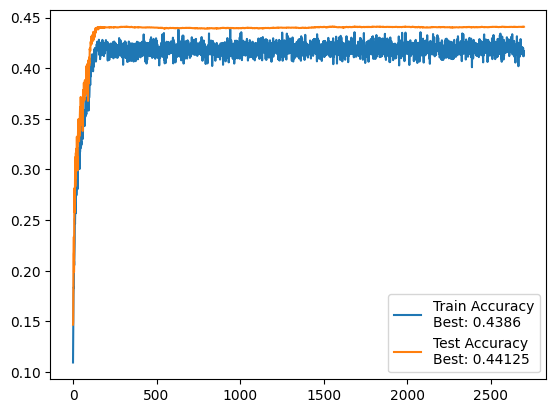

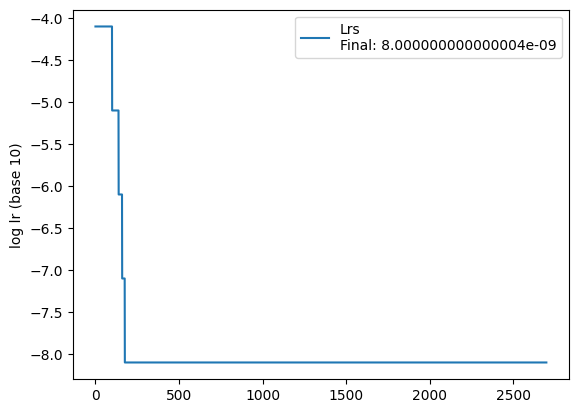


 =============== Epoch 2701 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 41.4%, Avg loss: 1.562826, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512693

 =============== Epoch 2702 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.554664, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512679

 =============== Epoch 2703 ===============


100%|██████████| 40/40 [00:17<00:00,  2.32it/s]


 Train accuracy: 40.9%, Avg loss: 1.560298, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512673

 =============== Epoch 2704 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.9%, Avg loss: 1.550374, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.1%, Avg loss: 1.512672

 =============== Epoch 2705 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.2%, Avg loss: 1.553029, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512681

 =============== Epoch 2706 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 43.2%, Avg loss: 1.549896, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512689

 =============== Epoch 2707 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.1%, Avg loss: 1.559226, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512694

 =============== Epoch 2708 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.580655, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512705

 =============== Epoch 2709 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.8%, Avg loss: 1.564463, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512710

 =============== Epoch 2710 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.6%, Avg loss: 1.563238, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512727

 =============== Epoch 2711 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.8%, Avg loss: 1.581733, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512709

 =============== Epoch 2712 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 43.0%, Avg loss: 1.540711, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512714

 =============== Epoch 2713 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 40.6%, Avg loss: 1.553282, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512704

 =============== Epoch 2714 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.9%, Avg loss: 1.561691, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.512718

 =============== Epoch 2715 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.2%, Avg loss: 1.567678, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512710

 =============== Epoch 2716 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.2%, Avg loss: 1.554486, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512706

 =============== Epoch 2717 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.577356, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512711

 =============== Epoch 2718 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 43.7%, Avg loss: 1.547869, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.86it/s]


 Test accuracy: 44.1%, Avg loss: 1.512707

 =============== Epoch 2719 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.564978, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512700

 =============== Epoch 2720 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.8%, Avg loss: 1.551470, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512686

 =============== Epoch 2721 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.561267, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512686

 =============== Epoch 2722 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.1%, Avg loss: 1.564398, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512689

 =============== Epoch 2723 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.3%, Avg loss: 1.568407, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.83it/s]


 Test accuracy: 44.1%, Avg loss: 1.512682

 =============== Epoch 2724 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.543626, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512679

 =============== Epoch 2725 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.531739, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512690

 =============== Epoch 2726 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.586876, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512693

 =============== Epoch 2727 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.552339, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.88it/s]


 Test accuracy: 44.1%, Avg loss: 1.512690

 =============== Epoch 2728 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.542679, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512679

 =============== Epoch 2729 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.542350, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512669

 =============== Epoch 2730 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.6%, Avg loss: 1.571541, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512664

 =============== Epoch 2731 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.547278, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512668

 =============== Epoch 2732 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.4%, Avg loss: 1.540852, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512671

 =============== Epoch 2733 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.550137, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512680

 =============== Epoch 2734 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.5%, Avg loss: 1.561469, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512675

 =============== Epoch 2735 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.558837, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512676

 =============== Epoch 2736 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 42.0%, Avg loss: 1.551970, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.83it/s]


 Test accuracy: 44.1%, Avg loss: 1.512683

 =============== Epoch 2737 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.6%, Avg loss: 1.572430, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512690

 =============== Epoch 2738 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.2%, Avg loss: 1.560902, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512692

 =============== Epoch 2739 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.550547, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512700

 =============== Epoch 2740 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.540314, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.1%, Avg loss: 1.512703

 =============== Epoch 2741 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.562883, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512703

 =============== Epoch 2742 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.2%, Avg loss: 1.560574, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512692

 =============== Epoch 2743 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.542709, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.1%, Avg loss: 1.512684

 =============== Epoch 2744 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.0%, Avg loss: 1.572453, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512683

 =============== Epoch 2745 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.0%, Avg loss: 1.573240, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.512680

 =============== Epoch 2746 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.9%, Avg loss: 1.563526, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.512676

 =============== Epoch 2747 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.579412, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512675

 =============== Epoch 2748 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 40.7%, Avg loss: 1.563945, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512673

 =============== Epoch 2749 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.6%, Avg loss: 1.556869, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.56it/s]


 Test accuracy: 44.1%, Avg loss: 1.512674

 =============== Epoch 2750 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.4%, Avg loss: 1.566231, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.31it/s]


 Test accuracy: 44.1%, Avg loss: 1.512673


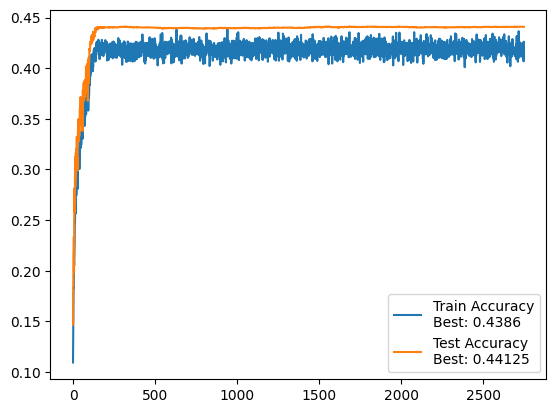

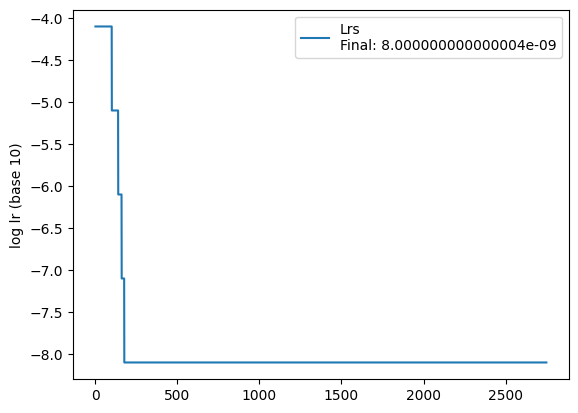


 =============== Epoch 2751 ===============


100%|██████████| 40/40 [00:18<00:00,  2.22it/s]


 Train accuracy: 42.3%, Avg loss: 1.547449, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.16it/s]


 Test accuracy: 44.1%, Avg loss: 1.512666

 =============== Epoch 2752 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.555491, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512671

 =============== Epoch 2753 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.549378, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.53it/s]


 Test accuracy: 44.1%, Avg loss: 1.512665

 =============== Epoch 2754 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.7%, Avg loss: 1.571520, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512665

 =============== Epoch 2755 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.568784, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512679

 =============== Epoch 2756 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.7%, Avg loss: 1.534508, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512682

 =============== Epoch 2757 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.557840, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512691

 =============== Epoch 2758 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.2%, Avg loss: 1.551021, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512671

 =============== Epoch 2759 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.540099, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.60it/s]


 Test accuracy: 44.1%, Avg loss: 1.512658

 =============== Epoch 2760 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 42.2%, Avg loss: 1.558474, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.1%, Avg loss: 1.512642

 =============== Epoch 2761 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.4%, Avg loss: 1.540498, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512631

 =============== Epoch 2762 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.550845, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512630

 =============== Epoch 2763 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 43.4%, Avg loss: 1.566494, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512626

 =============== Epoch 2764 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.4%, Avg loss: 1.555034, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512616

 =============== Epoch 2765 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.7%, Avg loss: 1.546252, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512619

 =============== Epoch 2766 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.555055, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512621

 =============== Epoch 2767 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.550738, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512616

 =============== Epoch 2768 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.1%, Avg loss: 1.559984, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512600

 =============== Epoch 2769 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.556650, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512598

 =============== Epoch 2770 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.534358, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512603

 =============== Epoch 2771 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.559050, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512602

 =============== Epoch 2772 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.551623, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.1%, Avg loss: 1.512596

 =============== Epoch 2773 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.9%, Avg loss: 1.558799, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512604

 =============== Epoch 2774 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.570221, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512605

 =============== Epoch 2775 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.539337, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512599

 =============== Epoch 2776 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.551650, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512589

 =============== Epoch 2777 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.4%, Avg loss: 1.556626, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512581

 =============== Epoch 2778 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.560807, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512579

 =============== Epoch 2779 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.552524, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512588

 =============== Epoch 2780 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.5%, Avg loss: 1.546268, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512587

 =============== Epoch 2781 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.6%, Avg loss: 1.545884, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.1%, Avg loss: 1.512575

 =============== Epoch 2782 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.565874, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512579

 =============== Epoch 2783 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.554514, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512583

 =============== Epoch 2784 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.574545, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512577

 =============== Epoch 2785 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.9%, Avg loss: 1.547451, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512567

 =============== Epoch 2786 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.4%, Avg loss: 1.556084, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512569

 =============== Epoch 2787 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.542861, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512558

 =============== Epoch 2788 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.6%, Avg loss: 1.558931, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.512556

 =============== Epoch 2789 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.2%, Avg loss: 1.561109, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512540

 =============== Epoch 2790 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.6%, Avg loss: 1.571230, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512527

 =============== Epoch 2791 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.6%, Avg loss: 1.546658, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512516

 =============== Epoch 2792 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.576910, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.1%, Avg loss: 1.512516

 =============== Epoch 2793 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.554029, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512523

 =============== Epoch 2794 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 41.8%, Avg loss: 1.589706, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512529

 =============== Epoch 2795 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 43.2%, Avg loss: 1.549689, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512525

 =============== Epoch 2796 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 40.5%, Avg loss: 1.590273, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512518

 =============== Epoch 2797 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.557140, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512528

 =============== Epoch 2798 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.565666, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512536

 =============== Epoch 2799 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.564577, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512533

 =============== Epoch 2800 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 43.0%, Avg loss: 1.536360, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512530


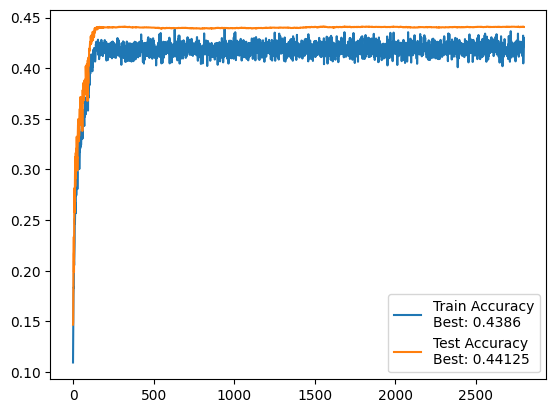

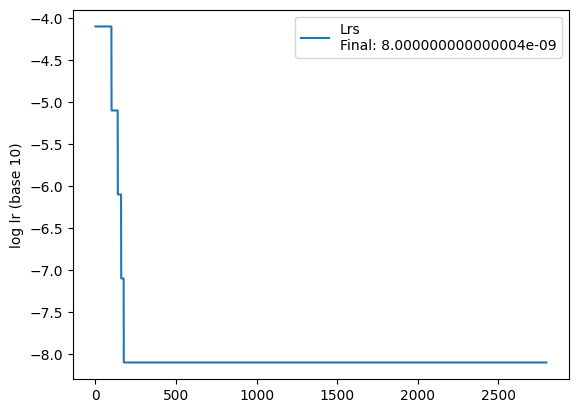


 =============== Epoch 2801 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.5%, Avg loss: 1.540930, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


 Test accuracy: 44.1%, Avg loss: 1.512537

 =============== Epoch 2802 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.556082, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512544

 =============== Epoch 2803 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.0%, Avg loss: 1.545665, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


 Test accuracy: 44.1%, Avg loss: 1.512551

 =============== Epoch 2804 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.2%, Avg loss: 1.546661, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512553

 =============== Epoch 2805 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.6%, Avg loss: 1.566026, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.55it/s]


 Test accuracy: 44.1%, Avg loss: 1.512548

 =============== Epoch 2806 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.560514, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512530

 =============== Epoch 2807 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.568781, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512521

 =============== Epoch 2808 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.550093, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512518

 =============== Epoch 2809 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.569783, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512511

 =============== Epoch 2810 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.2%, Avg loss: 1.551110, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.1%, Avg loss: 1.512505

 =============== Epoch 2811 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.545649, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


 Test accuracy: 44.1%, Avg loss: 1.512505

 =============== Epoch 2812 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.6%, Avg loss: 1.564101, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512508

 =============== Epoch 2813 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.553625, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512509

 =============== Epoch 2814 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.8%, Avg loss: 1.537829, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512506

 =============== Epoch 2815 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.0%, Avg loss: 1.546457, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512507

 =============== Epoch 2816 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.9%, Avg loss: 1.556001, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512522

 =============== Epoch 2817 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 43.3%, Avg loss: 1.526664, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.83it/s]


 Test accuracy: 44.1%, Avg loss: 1.512537

 =============== Epoch 2818 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.548172, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512537

 =============== Epoch 2819 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.559162, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512542

 =============== Epoch 2820 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.9%, Avg loss: 1.541553, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512524

 =============== Epoch 2821 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.567833, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512524

 =============== Epoch 2822 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.567222, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512521

 =============== Epoch 2823 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 43.0%, Avg loss: 1.545505, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512522

 =============== Epoch 2824 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.5%, Avg loss: 1.562175, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512517

 =============== Epoch 2825 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 43.4%, Avg loss: 1.542281, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512522

 =============== Epoch 2826 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.562648, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512513

 =============== Epoch 2827 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.535212, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512522

 =============== Epoch 2828 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.567159, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512520

 =============== Epoch 2829 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.557733, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512517

 =============== Epoch 2830 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.0%, Avg loss: 1.549799, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512504

 =============== Epoch 2831 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.4%, Avg loss: 1.568841, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512503

 =============== Epoch 2832 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.556754, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512504

 =============== Epoch 2833 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.7%, Avg loss: 1.553745, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512513

 =============== Epoch 2834 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.7%, Avg loss: 1.544016, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512518

 =============== Epoch 2835 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.4%, Avg loss: 1.559560, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512524

 =============== Epoch 2836 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.7%, Avg loss: 1.559921, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512511

 =============== Epoch 2837 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.6%, Avg loss: 1.551456, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512517

 =============== Epoch 2838 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.539682, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512512

 =============== Epoch 2839 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.1%, Avg loss: 1.561655, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512494

 =============== Epoch 2840 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.550247, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512502

 =============== Epoch 2841 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.549181, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512508

 =============== Epoch 2842 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.0%, Avg loss: 1.551250, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512501

 =============== Epoch 2843 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 41.9%, Avg loss: 1.545468, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512513

 =============== Epoch 2844 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.568696, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512516

 =============== Epoch 2845 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.7%, Avg loss: 1.545662, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.84it/s]


 Test accuracy: 44.1%, Avg loss: 1.512506

 =============== Epoch 2846 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.558409, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512503

 =============== Epoch 2847 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.554663, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512511

 =============== Epoch 2848 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.9%, Avg loss: 1.566249, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512515

 =============== Epoch 2849 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.546937, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512513

 =============== Epoch 2850 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.1%, Avg loss: 1.548149, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


 Test accuracy: 44.1%, Avg loss: 1.512516


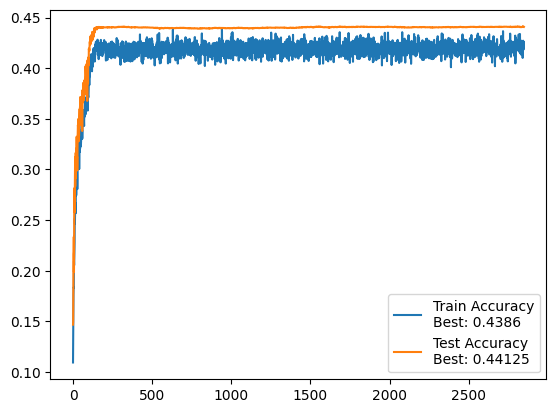

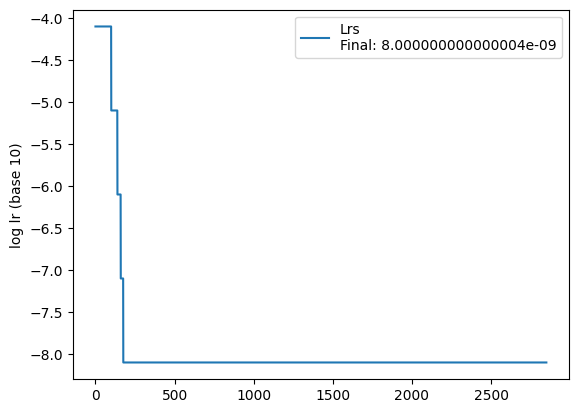


 =============== Epoch 2851 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.548212, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512513

 =============== Epoch 2852 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.3%, Avg loss: 1.570446, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512514

 =============== Epoch 2853 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 42.0%, Avg loss: 1.563062, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


 Test accuracy: 44.1%, Avg loss: 1.512518

 =============== Epoch 2854 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.541451, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512528

 =============== Epoch 2855 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.575413, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512535

 =============== Epoch 2856 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.545298, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512540

 =============== Epoch 2857 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 40.8%, Avg loss: 1.587117, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512533

 =============== Epoch 2858 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.2%, Avg loss: 1.554242, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512537

 =============== Epoch 2859 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.6%, Avg loss: 1.549018, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512543

 =============== Epoch 2860 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.562098, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512536

 =============== Epoch 2861 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.4%, Avg loss: 1.549568, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512531

 =============== Epoch 2862 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.6%, Avg loss: 1.563055, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.1%, Avg loss: 1.512515

 =============== Epoch 2863 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.552460, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512525

 =============== Epoch 2864 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.554974, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512533

 =============== Epoch 2865 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.564030, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512542

 =============== Epoch 2866 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.562988, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512555

 =============== Epoch 2867 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.4%, Avg loss: 1.567910, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512559

 =============== Epoch 2868 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.554609, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512555

 =============== Epoch 2869 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.4%, Avg loss: 1.559583, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


 Test accuracy: 44.1%, Avg loss: 1.512555

 =============== Epoch 2870 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.7%, Avg loss: 1.552002, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


 Test accuracy: 44.1%, Avg loss: 1.512557

 =============== Epoch 2871 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.2%, Avg loss: 1.571836, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512555

 =============== Epoch 2872 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.5%, Avg loss: 1.549170, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512546

 =============== Epoch 2873 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.558559, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512559

 =============== Epoch 2874 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.5%, Avg loss: 1.543832, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512567

 =============== Epoch 2875 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.538045, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512577

 =============== Epoch 2876 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.4%, Avg loss: 1.567156, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512592

 =============== Epoch 2877 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.0%, Avg loss: 1.571319, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512582

 =============== Epoch 2878 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.540893, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512573

 =============== Epoch 2879 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.555317, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512576

 =============== Epoch 2880 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.575142, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512580

 =============== Epoch 2881 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.559750, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512572

 =============== Epoch 2882 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 43.1%, Avg loss: 1.534716, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512574

 =============== Epoch 2883 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.4%, Avg loss: 1.566496, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512580

 =============== Epoch 2884 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.4%, Avg loss: 1.562915, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.1%, Avg loss: 1.512582

 =============== Epoch 2885 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.7%, Avg loss: 1.564154, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512561

 =============== Epoch 2886 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.2%, Avg loss: 1.557651, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512551

 =============== Epoch 2887 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.9%, Avg loss: 1.559780, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512546

 =============== Epoch 2888 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.556498, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512540

 =============== Epoch 2889 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.544283, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512554

 =============== Epoch 2890 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.0%, Avg loss: 1.558491, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.1%, Avg loss: 1.512554

 =============== Epoch 2891 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.0%, Avg loss: 1.554529, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512561

 =============== Epoch 2892 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.3%, Avg loss: 1.564008, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.83it/s]


 Test accuracy: 44.1%, Avg loss: 1.512567

 =============== Epoch 2893 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.2%, Avg loss: 1.560489, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512571

 =============== Epoch 2894 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.2%, Avg loss: 1.565644, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512573

 =============== Epoch 2895 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.565825, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512571

 =============== Epoch 2896 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.547063, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512574

 =============== Epoch 2897 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.565727, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512568

 =============== Epoch 2898 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 41.3%, Avg loss: 1.556780, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512578

 =============== Epoch 2899 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.9%, Avg loss: 1.564407, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512568

 =============== Epoch 2900 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.7%, Avg loss: 1.544999, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512553


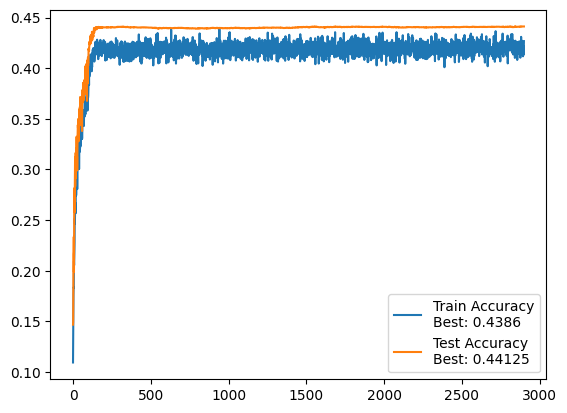

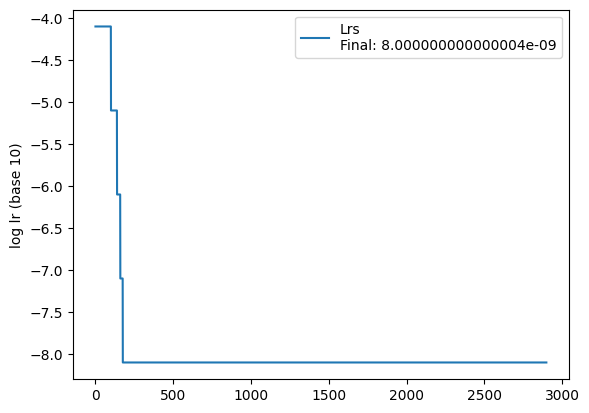


 =============== Epoch 2901 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.553829, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512548

 =============== Epoch 2902 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 40.7%, Avg loss: 1.560524, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512552

 =============== Epoch 2903 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.558622, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512562

 =============== Epoch 2904 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.2%, Avg loss: 1.548635, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512571

 =============== Epoch 2905 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.4%, Avg loss: 1.549754, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512572

 =============== Epoch 2906 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.7%, Avg loss: 1.538574, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512571

 =============== Epoch 2907 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.552349, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512562

 =============== Epoch 2908 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.8%, Avg loss: 1.573214, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512552

 =============== Epoch 2909 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.4%, Avg loss: 1.580626, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512535

 =============== Epoch 2910 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.556433, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512541

 =============== Epoch 2911 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.556742, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.83it/s]


 Test accuracy: 44.1%, Avg loss: 1.512539

 =============== Epoch 2912 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.7%, Avg loss: 1.552217, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512542

 =============== Epoch 2913 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.8%, Avg loss: 1.565827, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512534

 =============== Epoch 2914 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.3%, Avg loss: 1.545684, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512532

 =============== Epoch 2915 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.7%, Avg loss: 1.556641, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512526

 =============== Epoch 2916 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.550714, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.1%, Avg loss: 1.512515

 =============== Epoch 2917 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.4%, Avg loss: 1.563817, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512516

 =============== Epoch 2918 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.528727, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512527

 =============== Epoch 2919 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 42.8%, Avg loss: 1.540580, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512521

 =============== Epoch 2920 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.557612, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512528

 =============== Epoch 2921 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.554915, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


 Test accuracy: 44.1%, Avg loss: 1.512527

 =============== Epoch 2922 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.2%, Avg loss: 1.569961, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512526

 =============== Epoch 2923 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.0%, Avg loss: 1.543215, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512526

 =============== Epoch 2924 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.566763, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512528

 =============== Epoch 2925 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.9%, Avg loss: 1.561641, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512539

 =============== Epoch 2926 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.1%, Avg loss: 1.536358, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512544

 =============== Epoch 2927 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.542547, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512546

 =============== Epoch 2928 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.6%, Avg loss: 1.544753, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512549

 =============== Epoch 2929 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.5%, Avg loss: 1.554098, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512539

 =============== Epoch 2930 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.0%, Avg loss: 1.565908, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512534

 =============== Epoch 2931 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.560339, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512519

 =============== Epoch 2932 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.548860, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512523

 =============== Epoch 2933 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.559001, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512529

 =============== Epoch 2934 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.545857, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.1%, Avg loss: 1.512535

 =============== Epoch 2935 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.5%, Avg loss: 1.545427, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512534

 =============== Epoch 2936 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.561648, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512542

 =============== Epoch 2937 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 41.3%, Avg loss: 1.565158, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512540

 =============== Epoch 2938 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 43.7%, Avg loss: 1.554445, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512532

 =============== Epoch 2939 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 43.1%, Avg loss: 1.549552, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.87it/s]


 Test accuracy: 44.1%, Avg loss: 1.512532

 =============== Epoch 2940 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.4%, Avg loss: 1.554879, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512545

 =============== Epoch 2941 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.7%, Avg loss: 1.569807, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.59it/s]


 Test accuracy: 44.1%, Avg loss: 1.512552

 =============== Epoch 2942 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.564946, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.1%, Avg loss: 1.512560

 =============== Epoch 2943 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.7%, Avg loss: 1.567401, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512575

 =============== Epoch 2944 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.8%, Avg loss: 1.548111, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512585

 =============== Epoch 2945 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.554077, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512580

 =============== Epoch 2946 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.7%, Avg loss: 1.565589, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512571

 =============== Epoch 2947 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.7%, Avg loss: 1.575958, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512577

 =============== Epoch 2948 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.551525, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512584

 =============== Epoch 2949 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.547342, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512577

 =============== Epoch 2950 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.555506, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512571


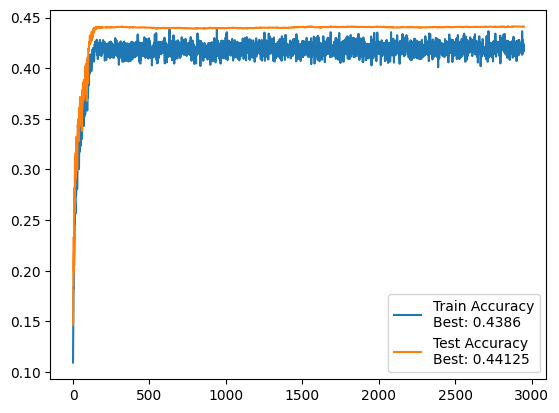

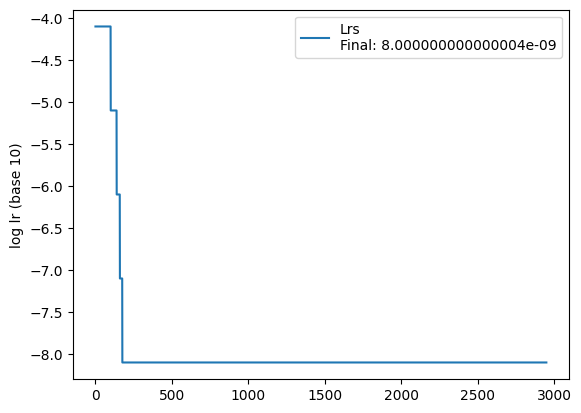


 =============== Epoch 2951 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.543135, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512561

 =============== Epoch 2952 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.551896, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512580

 =============== Epoch 2953 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.3%, Avg loss: 1.550371, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512593

 =============== Epoch 2954 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.543572, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512605

 =============== Epoch 2955 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.547859, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512604

 =============== Epoch 2956 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.557516, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


 Test accuracy: 44.1%, Avg loss: 1.512611

 =============== Epoch 2957 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.559971, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512614

 =============== Epoch 2958 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 40.9%, Avg loss: 1.578254, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.1%, Avg loss: 1.512611

 =============== Epoch 2959 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.544263, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512612

 =============== Epoch 2960 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.5%, Avg loss: 1.542730, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512614

 =============== Epoch 2961 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.2%, Avg loss: 1.560835, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512615

 =============== Epoch 2962 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.4%, Avg loss: 1.556699, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512611

 =============== Epoch 2963 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.8%, Avg loss: 1.553208, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512602

 =============== Epoch 2964 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.540242, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512599

 =============== Epoch 2965 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.552904, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512592

 =============== Epoch 2966 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.544844, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512591

 =============== Epoch 2967 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.4%, Avg loss: 1.559592, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512587

 =============== Epoch 2968 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.539158, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512592

 =============== Epoch 2969 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.4%, Avg loss: 1.544547, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512587

 =============== Epoch 2970 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.551863, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.60it/s]


 Test accuracy: 44.1%, Avg loss: 1.512590

 =============== Epoch 2971 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.566037, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512594

 =============== Epoch 2972 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.561391, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.512597

 =============== Epoch 2973 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.2%, Avg loss: 1.573910, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512593

 =============== Epoch 2974 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.6%, Avg loss: 1.535118, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512596

 =============== Epoch 2975 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.7%, Avg loss: 1.547596, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512597

 =============== Epoch 2976 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.565342, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512597

 =============== Epoch 2977 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 41.9%, Avg loss: 1.563599, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512585

 =============== Epoch 2978 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.8%, Avg loss: 1.545139, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512578

 =============== Epoch 2979 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.554233, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


 Test accuracy: 44.1%, Avg loss: 1.512578

 =============== Epoch 2980 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.8%, Avg loss: 1.574527, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512581

 =============== Epoch 2981 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.2%, Avg loss: 1.565795, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512595

 =============== Epoch 2982 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.7%, Avg loss: 1.559318, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512596

 =============== Epoch 2983 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.570043, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512586

 =============== Epoch 2984 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 43.1%, Avg loss: 1.560927, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512583

 =============== Epoch 2985 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.4%, Avg loss: 1.557441, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512582

 =============== Epoch 2986 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.9%, Avg loss: 1.552210, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.84it/s]


 Test accuracy: 44.1%, Avg loss: 1.512581

 =============== Epoch 2987 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.0%, Avg loss: 1.560162, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512576

 =============== Epoch 2988 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.5%, Avg loss: 1.552619, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512576

 =============== Epoch 2989 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.562814, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.1%, Avg loss: 1.512581

 =============== Epoch 2990 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.5%, Avg loss: 1.535803, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512589

 =============== Epoch 2991 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.3%, Avg loss: 1.557969, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512596

 =============== Epoch 2992 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.0%, Avg loss: 1.548179, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512595

 =============== Epoch 2993 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.7%, Avg loss: 1.555321, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512594

 =============== Epoch 2994 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.6%, Avg loss: 1.553482, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512597

 =============== Epoch 2995 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 40.8%, Avg loss: 1.557511, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512593

 =============== Epoch 2996 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.9%, Avg loss: 1.556257, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512589

 =============== Epoch 2997 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.1%, Avg loss: 1.567643, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.1%, Avg loss: 1.512588

 =============== Epoch 2998 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 40.9%, Avg loss: 1.557316, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.60it/s]


 Test accuracy: 44.1%, Avg loss: 1.512581

 =============== Epoch 2999 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 40.8%, Avg loss: 1.574772, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512572

 =============== Epoch 3000 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.556952, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512579


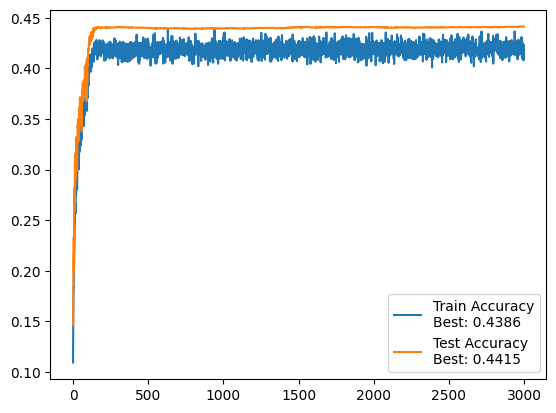

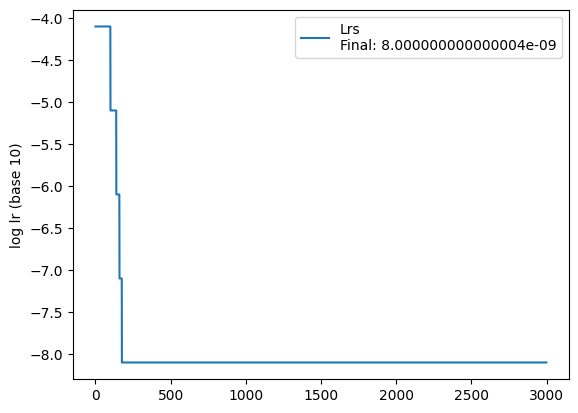


 =============== Epoch 3001 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.0%, Avg loss: 1.572397, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512591

 =============== Epoch 3002 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.542304, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.1%, Avg loss: 1.512591

 =============== Epoch 3003 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.560370, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512601

 =============== Epoch 3004 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.2%, Avg loss: 1.556089, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512588

 =============== Epoch 3005 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.2%, Avg loss: 1.547169, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.512599

 =============== Epoch 3006 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.6%, Avg loss: 1.565214, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512598

 =============== Epoch 3007 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.1%, Avg loss: 1.552970, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.56it/s]


 Test accuracy: 44.2%, Avg loss: 1.512597

 =============== Epoch 3008 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.547851, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.2%, Avg loss: 1.512609

 =============== Epoch 3009 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.550768, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.512616

 =============== Epoch 3010 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.550628, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.2%, Avg loss: 1.512613

 =============== Epoch 3011 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.542689, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.512613

 =============== Epoch 3012 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.541415, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.512620

 =============== Epoch 3013 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.5%, Avg loss: 1.556275, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.512622

 =============== Epoch 3014 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 40.7%, Avg loss: 1.560961, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


 Test accuracy: 44.2%, Avg loss: 1.512622

 =============== Epoch 3015 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.547327, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.2%, Avg loss: 1.512625

 =============== Epoch 3016 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.8%, Avg loss: 1.547305, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.512618

 =============== Epoch 3017 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.543869, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.512614

 =============== Epoch 3018 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.559501, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512605

 =============== Epoch 3019 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.531438, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512619

 =============== Epoch 3020 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.2%, Avg loss: 1.550098, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512629

 =============== Epoch 3021 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.4%, Avg loss: 1.548545, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.1%, Avg loss: 1.512634

 =============== Epoch 3022 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.553505, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512641

 =============== Epoch 3023 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.591117, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.512635

 =============== Epoch 3024 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.0%, Avg loss: 1.551348, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512639

 =============== Epoch 3025 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.526097, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512637

 =============== Epoch 3026 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.3%, Avg loss: 1.538010, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


 Test accuracy: 44.1%, Avg loss: 1.512643

 =============== Epoch 3027 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.3%, Avg loss: 1.568397, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512645

 =============== Epoch 3028 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.7%, Avg loss: 1.557474, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512653

 =============== Epoch 3029 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.6%, Avg loss: 1.574373, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512654

 =============== Epoch 3030 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.562242, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512644

 =============== Epoch 3031 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.543812, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.60it/s]


 Test accuracy: 44.1%, Avg loss: 1.512643

 =============== Epoch 3032 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.7%, Avg loss: 1.542733, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.2%, Avg loss: 1.512653

 =============== Epoch 3033 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.7%, Avg loss: 1.548639, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.2%, Avg loss: 1.512652

 =============== Epoch 3034 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.546487, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.512642

 =============== Epoch 3035 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.8%, Avg loss: 1.562019, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.2%, Avg loss: 1.512632

 =============== Epoch 3036 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.545457, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.512652

 =============== Epoch 3037 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.545457, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.512658

 =============== Epoch 3038 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.555463, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.512662

 =============== Epoch 3039 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.4%, Avg loss: 1.571711, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.2%, Avg loss: 1.512668

 =============== Epoch 3040 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.2%, Avg loss: 1.561228, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.512664

 =============== Epoch 3041 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.7%, Avg loss: 1.566455, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.2%, Avg loss: 1.512648

 =============== Epoch 3042 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.0%, Avg loss: 1.564271, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.2%, Avg loss: 1.512651

 =============== Epoch 3043 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.6%, Avg loss: 1.561357, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.512653

 =============== Epoch 3044 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.562600, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.512657

 =============== Epoch 3045 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.9%, Avg loss: 1.540012, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.512647

 =============== Epoch 3046 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.2%, Avg loss: 1.555788, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.512649

 =============== Epoch 3047 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.572268, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.2%, Avg loss: 1.512633

 =============== Epoch 3048 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.550441, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.512635

 =============== Epoch 3049 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.553119, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.512631

 =============== Epoch 3050 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.3%, Avg loss: 1.564689, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.2%, Avg loss: 1.512622


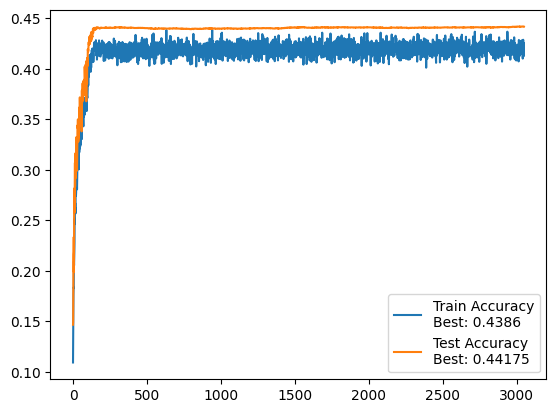

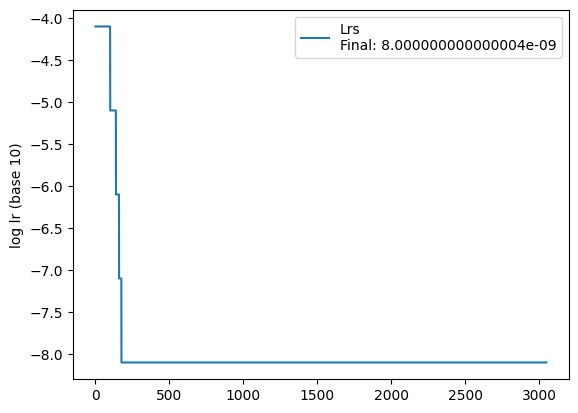


 =============== Epoch 3051 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 41.6%, Avg loss: 1.544686, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.512612

 =============== Epoch 3052 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.0%, Avg loss: 1.548856, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.2%, Avg loss: 1.512616

 =============== Epoch 3053 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.547564, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.512609

 =============== Epoch 3054 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.3%, Avg loss: 1.547875, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.512603

 =============== Epoch 3055 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.5%, Avg loss: 1.569365, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.512605

 =============== Epoch 3056 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.567203, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.512613

 =============== Epoch 3057 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.549313, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.2%, Avg loss: 1.512617

 =============== Epoch 3058 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.4%, Avg loss: 1.555794, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.2%, Avg loss: 1.512622

 =============== Epoch 3059 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.1%, Avg loss: 1.564250, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


 Test accuracy: 44.2%, Avg loss: 1.512595

 =============== Epoch 3060 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.7%, Avg loss: 1.545356, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.512582

 =============== Epoch 3061 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.552765, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.2%, Avg loss: 1.512577

 =============== Epoch 3062 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.8%, Avg loss: 1.557932, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.512571

 =============== Epoch 3063 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.3%, Avg loss: 1.549473, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.512573

 =============== Epoch 3064 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.3%, Avg loss: 1.579477, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.512567

 =============== Epoch 3065 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.3%, Avg loss: 1.565662, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.512559

 =============== Epoch 3066 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.2%, Avg loss: 1.554748, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.2%, Avg loss: 1.512570

 =============== Epoch 3067 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.542650, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.2%, Avg loss: 1.512556

 =============== Epoch 3068 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.568702, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.512553

 =============== Epoch 3069 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.6%, Avg loss: 1.583830, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.60it/s]


 Test accuracy: 44.2%, Avg loss: 1.512549

 =============== Epoch 3070 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.566235, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.512548

 =============== Epoch 3071 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.3%, Avg loss: 1.565000, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.2%, Avg loss: 1.512540

 =============== Epoch 3072 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.557979, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.512538

 =============== Epoch 3073 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.576537, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.2%, Avg loss: 1.512531

 =============== Epoch 3074 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.538825, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.512516

 =============== Epoch 3075 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.8%, Avg loss: 1.567922, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.512517

 =============== Epoch 3076 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.551317, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.2%, Avg loss: 1.512534

 =============== Epoch 3077 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.558244, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.512537

 =============== Epoch 3078 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 41.8%, Avg loss: 1.554861, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.512533

 =============== Epoch 3079 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 42.1%, Avg loss: 1.579658, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.512518

 =============== Epoch 3080 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 40.9%, Avg loss: 1.563905, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.2%, Avg loss: 1.512522

 =============== Epoch 3081 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.5%, Avg loss: 1.549135, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.512522

 =============== Epoch 3082 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.9%, Avg loss: 1.541452, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.2%, Avg loss: 1.512515

 =============== Epoch 3083 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.556234, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.512527

 =============== Epoch 3084 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.3%, Avg loss: 1.564169, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.512534

 =============== Epoch 3085 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.546559, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.2%, Avg loss: 1.512527

 =============== Epoch 3086 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.537493, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.2%, Avg loss: 1.512528

 =============== Epoch 3087 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.5%, Avg loss: 1.534507, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.512511

 =============== Epoch 3088 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.576364, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.2%, Avg loss: 1.512481

 =============== Epoch 3089 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.546391, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.2%, Avg loss: 1.512484

 =============== Epoch 3090 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.0%, Avg loss: 1.588213, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.2%, Avg loss: 1.512485

 =============== Epoch 3091 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 41.8%, Avg loss: 1.565516, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.512488

 =============== Epoch 3092 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.564229, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512480

 =============== Epoch 3093 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.3%, Avg loss: 1.549615, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.512501

 =============== Epoch 3094 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.8%, Avg loss: 1.536127, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.2%, Avg loss: 1.512510

 =============== Epoch 3095 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.4%, Avg loss: 1.563779, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.2%, Avg loss: 1.512498

 =============== Epoch 3096 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 43.2%, Avg loss: 1.554393, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.512492

 =============== Epoch 3097 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.1%, Avg loss: 1.571393, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.2%, Avg loss: 1.512478

 =============== Epoch 3098 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.0%, Avg loss: 1.601446, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512463

 =============== Epoch 3099 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.9%, Avg loss: 1.557821, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512476

 =============== Epoch 3100 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.4%, Avg loss: 1.548697, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.512469


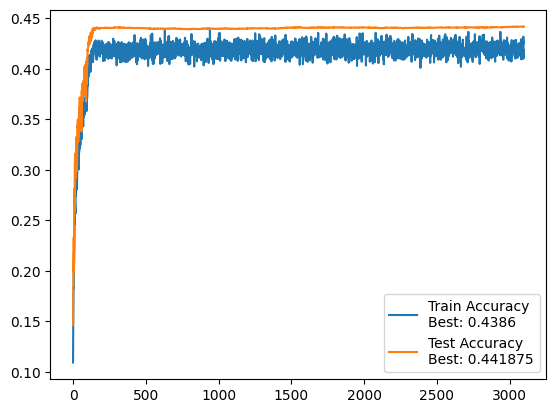

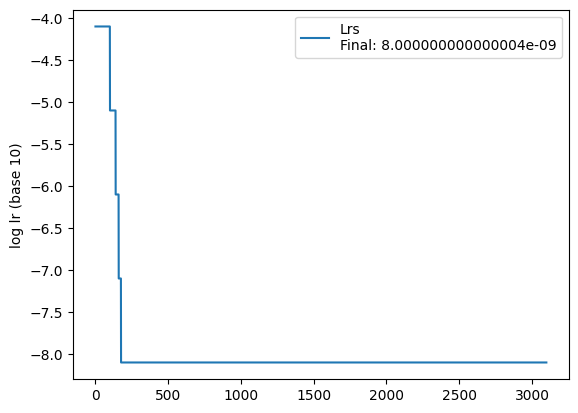


 =============== Epoch 3101 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.552029, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.512466

 =============== Epoch 3102 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.541082, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.2%, Avg loss: 1.512469

 =============== Epoch 3103 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.7%, Avg loss: 1.554375, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.2%, Avg loss: 1.512470

 =============== Epoch 3104 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.565112, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.2%, Avg loss: 1.512450

 =============== Epoch 3105 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.4%, Avg loss: 1.564352, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.512453

 =============== Epoch 3106 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.559964, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.512445

 =============== Epoch 3107 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.556889, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.2%, Avg loss: 1.512438

 =============== Epoch 3108 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.8%, Avg loss: 1.518376, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.2%, Avg loss: 1.512463

 =============== Epoch 3109 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.538179, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.2%, Avg loss: 1.512462

 =============== Epoch 3110 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.551776, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.2%, Avg loss: 1.512457

 =============== Epoch 3111 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.0%, Avg loss: 1.563926, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.2%, Avg loss: 1.512460

 =============== Epoch 3112 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.4%, Avg loss: 1.541115, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.512451

 =============== Epoch 3113 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.4%, Avg loss: 1.538259, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.84it/s]


 Test accuracy: 44.2%, Avg loss: 1.512447

 =============== Epoch 3114 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.2%, Avg loss: 1.571637, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.512453

 =============== Epoch 3115 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.8%, Avg loss: 1.573420, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.512440

 =============== Epoch 3116 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.2%, Avg loss: 1.555258, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.512451

 =============== Epoch 3117 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.0%, Avg loss: 1.565977, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.2%, Avg loss: 1.512459

 =============== Epoch 3118 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.3%, Avg loss: 1.567529, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


 Test accuracy: 44.2%, Avg loss: 1.512474

 =============== Epoch 3119 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.537895, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.512485

 =============== Epoch 3120 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 43.0%, Avg loss: 1.541734, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.512499

 =============== Epoch 3121 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.547620, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.512503

 =============== Epoch 3122 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.1%, Avg loss: 1.564350, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.512500

 =============== Epoch 3123 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.7%, Avg loss: 1.560375, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.2%, Avg loss: 1.512497

 =============== Epoch 3124 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.547634, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.512506

 =============== Epoch 3125 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.6%, Avg loss: 1.545283, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.512499

 =============== Epoch 3126 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.0%, Avg loss: 1.551564, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.512503

 =============== Epoch 3127 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.7%, Avg loss: 1.578353, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.2%, Avg loss: 1.512508

 =============== Epoch 3128 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.547319, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.512507

 =============== Epoch 3129 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 40.7%, Avg loss: 1.552498, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.2%, Avg loss: 1.512496

 =============== Epoch 3130 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.570523, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.512489

 =============== Epoch 3131 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.556340, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.512483

 =============== Epoch 3132 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.6%, Avg loss: 1.560142, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.2%, Avg loss: 1.512476

 =============== Epoch 3133 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.9%, Avg loss: 1.576195, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.512472

 =============== Epoch 3134 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.562893, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.2%, Avg loss: 1.512490

 =============== Epoch 3135 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.3%, Avg loss: 1.546039, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.512485

 =============== Epoch 3136 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.561783, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512482

 =============== Epoch 3137 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.3%, Avg loss: 1.545507, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512491

 =============== Epoch 3138 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.555045, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512490

 =============== Epoch 3139 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.559863, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512488

 =============== Epoch 3140 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.6%, Avg loss: 1.541278, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512484

 =============== Epoch 3141 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.547732, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512485

 =============== Epoch 3142 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.6%, Avg loss: 1.563456, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512507

 =============== Epoch 3143 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.7%, Avg loss: 1.546581, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512502

 =============== Epoch 3144 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.562977, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512494

 =============== Epoch 3145 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.551185, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512477

 =============== Epoch 3146 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.6%, Avg loss: 1.572932, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.85it/s]


 Test accuracy: 44.1%, Avg loss: 1.512463

 =============== Epoch 3147 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.3%, Avg loss: 1.563639, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512453

 =============== Epoch 3148 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 42.3%, Avg loss: 1.542244, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512462

 =============== Epoch 3149 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 41.9%, Avg loss: 1.575103, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512466

 =============== Epoch 3150 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 42.3%, Avg loss: 1.552646, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.88it/s]


 Test accuracy: 44.1%, Avg loss: 1.512463


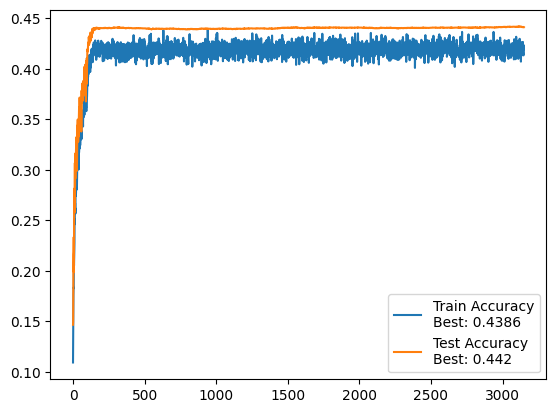

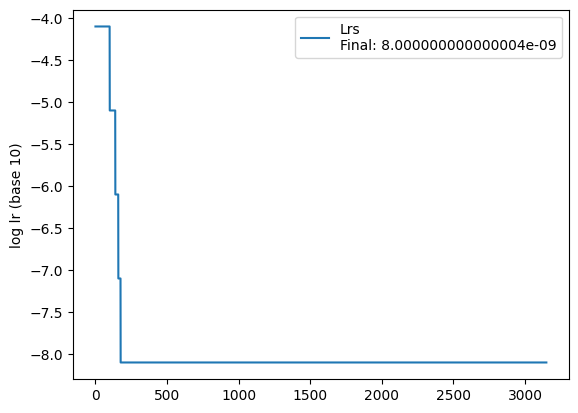


 =============== Epoch 3151 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.8%, Avg loss: 1.536591, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.90it/s]


 Test accuracy: 44.1%, Avg loss: 1.512463

 =============== Epoch 3152 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.2%, Avg loss: 1.559671, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512461

 =============== Epoch 3153 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 42.6%, Avg loss: 1.560939, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512458

 =============== Epoch 3154 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 41.4%, Avg loss: 1.555433, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512462

 =============== Epoch 3155 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.6%, Avg loss: 1.569270, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512458

 =============== Epoch 3156 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.529880, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512472

 =============== Epoch 3157 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.569257, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512466

 =============== Epoch 3158 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 42.2%, Avg loss: 1.552848, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512480

 =============== Epoch 3159 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.551741, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512480

 =============== Epoch 3160 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.563225, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.512470

 =============== Epoch 3161 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.6%, Avg loss: 1.551807, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512477

 =============== Epoch 3162 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.533746, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512474

 =============== Epoch 3163 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.564919, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512476

 =============== Epoch 3164 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.3%, Avg loss: 1.546328, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512474

 =============== Epoch 3165 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.1%, Avg loss: 1.557854, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.1%, Avg loss: 1.512477

 =============== Epoch 3166 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.1%, Avg loss: 1.567109, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.512479

 =============== Epoch 3167 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.543495, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512491

 =============== Epoch 3168 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.563587, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512500

 =============== Epoch 3169 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.7%, Avg loss: 1.539682, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.1%, Avg loss: 1.512497

 =============== Epoch 3170 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.6%, Avg loss: 1.553244, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512503

 =============== Epoch 3171 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.1%, Avg loss: 1.556434, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512501

 =============== Epoch 3172 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.543750, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512491

 =============== Epoch 3173 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.6%, Avg loss: 1.539214, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512493

 =============== Epoch 3174 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.557919, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.1%, Avg loss: 1.512504

 =============== Epoch 3175 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 43.4%, Avg loss: 1.541113, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512503

 =============== Epoch 3176 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.561367, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512498

 =============== Epoch 3177 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.3%, Avg loss: 1.558075, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512502

 =============== Epoch 3178 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.5%, Avg loss: 1.560997, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512494

 =============== Epoch 3179 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.566460, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.1%, Avg loss: 1.512499

 =============== Epoch 3180 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.8%, Avg loss: 1.544922, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512498

 =============== Epoch 3181 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.5%, Avg loss: 1.576971, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512493

 =============== Epoch 3182 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.571438, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512495

 =============== Epoch 3183 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.563328, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512493

 =============== Epoch 3184 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 43.3%, Avg loss: 1.544386, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.86it/s]


 Test accuracy: 44.1%, Avg loss: 1.512495

 =============== Epoch 3185 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.1%, Avg loss: 1.542497, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512484

 =============== Epoch 3186 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.2%, Avg loss: 1.572447, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512478

 =============== Epoch 3187 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.573363, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512473

 =============== Epoch 3188 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 43.0%, Avg loss: 1.537693, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512470

 =============== Epoch 3189 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.537453, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512475

 =============== Epoch 3190 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.568790, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512468

 =============== Epoch 3191 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.2%, Avg loss: 1.562552, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512456

 =============== Epoch 3192 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.557539, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512444

 =============== Epoch 3193 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.5%, Avg loss: 1.544896, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.512447

 =============== Epoch 3194 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.9%, Avg loss: 1.548823, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512447

 =============== Epoch 3195 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 40.9%, Avg loss: 1.559922, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512447

 =============== Epoch 3196 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.4%, Avg loss: 1.566619, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512439

 =============== Epoch 3197 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.558040, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512446

 =============== Epoch 3198 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.3%, Avg loss: 1.569587, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.512446

 =============== Epoch 3199 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.3%, Avg loss: 1.553891, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512432

 =============== Epoch 3200 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 40.9%, Avg loss: 1.568561, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512439


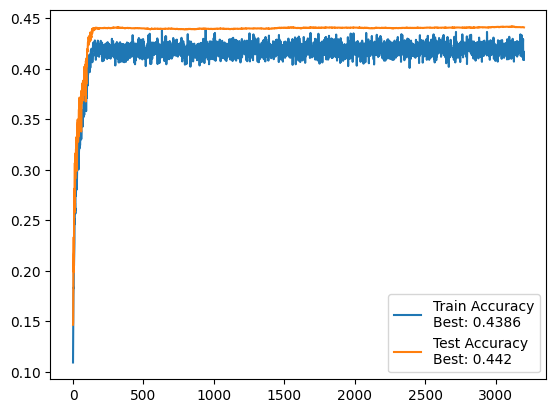

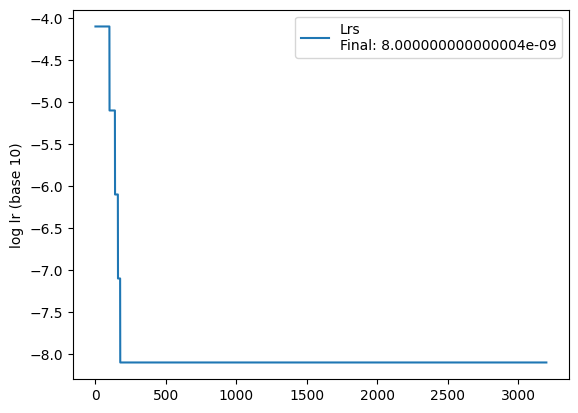


 =============== Epoch 3201 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.548565, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512438

 =============== Epoch 3202 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 43.3%, Avg loss: 1.546947, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512444

 =============== Epoch 3203 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.6%, Avg loss: 1.544043, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512450

 =============== Epoch 3204 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.553854, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512445

 =============== Epoch 3205 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 43.3%, Avg loss: 1.545313, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512450

 =============== Epoch 3206 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.544909, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512455

 =============== Epoch 3207 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.560543, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.83it/s]


 Test accuracy: 44.1%, Avg loss: 1.512452

 =============== Epoch 3208 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.4%, Avg loss: 1.553365, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512454

 =============== Epoch 3209 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 43.0%, Avg loss: 1.546388, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.512464

 =============== Epoch 3210 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.5%, Avg loss: 1.574717, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512455

 =============== Epoch 3211 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.546674, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.2%, Avg loss: 1.512454

 =============== Epoch 3212 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 41.9%, Avg loss: 1.555258, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.512459

 =============== Epoch 3213 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.548571, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512457

 =============== Epoch 3214 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.6%, Avg loss: 1.561714, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.2%, Avg loss: 1.512457

 =============== Epoch 3215 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 40.8%, Avg loss: 1.567981, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.512453

 =============== Epoch 3216 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.551648, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.2%, Avg loss: 1.512447

 =============== Epoch 3217 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.559365, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.85it/s]


 Test accuracy: 44.2%, Avg loss: 1.512439

 =============== Epoch 3218 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 40.9%, Avg loss: 1.576472, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.2%, Avg loss: 1.512427

 =============== Epoch 3219 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.7%, Avg loss: 1.561395, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512415

 =============== Epoch 3220 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.554579, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512417

 =============== Epoch 3221 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.562626, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


 Test accuracy: 44.1%, Avg loss: 1.512409

 =============== Epoch 3222 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.563722, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512404

 =============== Epoch 3223 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.564944, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.512393

 =============== Epoch 3224 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.4%, Avg loss: 1.556379, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512390

 =============== Epoch 3225 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 41.8%, Avg loss: 1.567065, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512374

 =============== Epoch 3226 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 43.5%, Avg loss: 1.541258, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.85it/s]


 Test accuracy: 44.1%, Avg loss: 1.512377

 =============== Epoch 3227 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.4%, Avg loss: 1.569535, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.2%, Avg loss: 1.512367

 =============== Epoch 3228 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.3%, Avg loss: 1.554422, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.512365

 =============== Epoch 3229 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.0%, Avg loss: 1.555959, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.512367

 =============== Epoch 3230 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.584064, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512357

 =============== Epoch 3231 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.2%, Avg loss: 1.559411, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


 Test accuracy: 44.1%, Avg loss: 1.512340

 =============== Epoch 3232 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.551948, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512340

 =============== Epoch 3233 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.560580, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512339

 =============== Epoch 3234 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.4%, Avg loss: 1.564036, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512340

 =============== Epoch 3235 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.6%, Avg loss: 1.564597, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.1%, Avg loss: 1.512334

 =============== Epoch 3236 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 43.3%, Avg loss: 1.550064, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512330

 =============== Epoch 3237 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.1%, Avg loss: 1.551170, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512328

 =============== Epoch 3238 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.6%, Avg loss: 1.563483, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512336

 =============== Epoch 3239 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 43.1%, Avg loss: 1.524972, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512331

 =============== Epoch 3240 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.2%, Avg loss: 1.560649, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.85it/s]


 Test accuracy: 44.1%, Avg loss: 1.512323

 =============== Epoch 3241 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.8%, Avg loss: 1.562315, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512310

 =============== Epoch 3242 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.548967, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512314

 =============== Epoch 3243 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.7%, Avg loss: 1.551231, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512319

 =============== Epoch 3244 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.557049, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512323

 =============== Epoch 3245 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.8%, Avg loss: 1.565100, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512313

 =============== Epoch 3246 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.554285, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512308

 =============== Epoch 3247 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.551149, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512319

 =============== Epoch 3248 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.570800, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512327

 =============== Epoch 3249 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.1%, Avg loss: 1.556229, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512321

 =============== Epoch 3250 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.563689, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512308


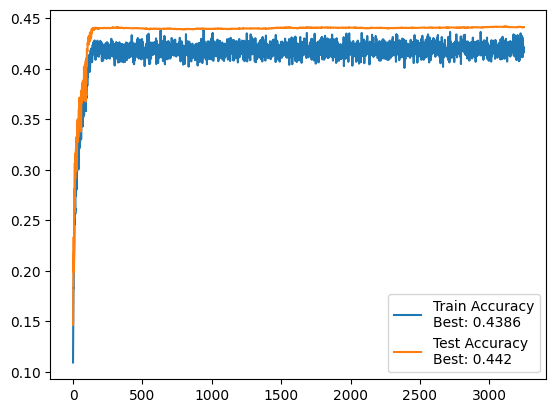

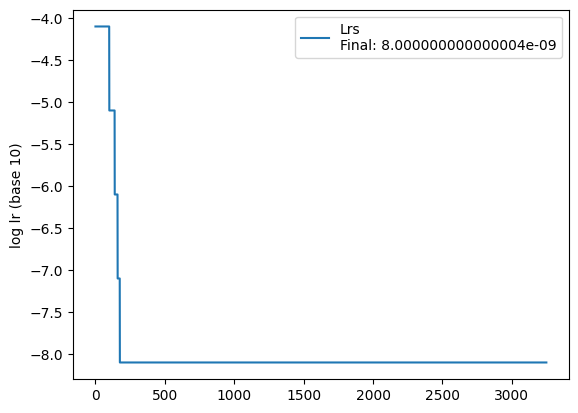


 =============== Epoch 3251 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.4%, Avg loss: 1.551754, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512295

 =============== Epoch 3252 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.2%, Avg loss: 1.561101, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512300

 =============== Epoch 3253 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.1%, Avg loss: 1.558943, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512301

 =============== Epoch 3254 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.562555, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.1%, Avg loss: 1.512285

 =============== Epoch 3255 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.8%, Avg loss: 1.584273, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512288

 =============== Epoch 3256 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.553715, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512296

 =============== Epoch 3257 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.539165, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512290

 =============== Epoch 3258 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.554563, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512279

 =============== Epoch 3259 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.9%, Avg loss: 1.535226, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512268

 =============== Epoch 3260 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.6%, Avg loss: 1.570241, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512263

 =============== Epoch 3261 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.559800, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512266

 =============== Epoch 3262 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.575256, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512264

 =============== Epoch 3263 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.561071, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.1%, Avg loss: 1.512269

 =============== Epoch 3264 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.7%, Avg loss: 1.547483, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.512272

 =============== Epoch 3265 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.9%, Avg loss: 1.575349, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512275

 =============== Epoch 3266 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.543461, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512282

 =============== Epoch 3267 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.550453, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512288

 =============== Epoch 3268 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.565982, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512297

 =============== Epoch 3269 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.556699, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512283

 =============== Epoch 3270 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.9%, Avg loss: 1.560416, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512280

 =============== Epoch 3271 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.4%, Avg loss: 1.554197, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512271

 =============== Epoch 3272 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.6%, Avg loss: 1.534127, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512266

 =============== Epoch 3273 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.3%, Avg loss: 1.580638, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.84it/s]


 Test accuracy: 44.1%, Avg loss: 1.512263

 =============== Epoch 3274 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 40.6%, Avg loss: 1.588035, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512258

 =============== Epoch 3275 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.4%, Avg loss: 1.558582, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512242

 =============== Epoch 3276 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.7%, Avg loss: 1.542282, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512255

 =============== Epoch 3277 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.7%, Avg loss: 1.533636, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512254

 =============== Epoch 3278 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 40.7%, Avg loss: 1.568904, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.88it/s]


 Test accuracy: 44.1%, Avg loss: 1.512249

 =============== Epoch 3279 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.544989, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512243

 =============== Epoch 3280 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.552454, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512241

 =============== Epoch 3281 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.5%, Avg loss: 1.535453, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512250

 =============== Epoch 3282 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.559673, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512247

 =============== Epoch 3283 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.571122, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512248

 =============== Epoch 3284 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.553347, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512251

 =============== Epoch 3285 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.545935, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512254

 =============== Epoch 3286 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.554903, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512255

 =============== Epoch 3287 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.4%, Avg loss: 1.566312, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.83it/s]


 Test accuracy: 44.2%, Avg loss: 1.512255

 =============== Epoch 3288 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.4%, Avg loss: 1.554952, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.512261

 =============== Epoch 3289 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 43.1%, Avg loss: 1.541821, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.512275

 =============== Epoch 3290 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.9%, Avg loss: 1.526622, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.512269

 =============== Epoch 3291 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.553584, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.512268

 =============== Epoch 3292 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.563367, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.83it/s]


 Test accuracy: 44.2%, Avg loss: 1.512266

 =============== Epoch 3293 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.7%, Avg loss: 1.552166, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.2%, Avg loss: 1.512267

 =============== Epoch 3294 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.0%, Avg loss: 1.572192, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.2%, Avg loss: 1.512248

 =============== Epoch 3295 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.2%, Avg loss: 1.551445, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.2%, Avg loss: 1.512241

 =============== Epoch 3296 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.551907, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.2%, Avg loss: 1.512243

 =============== Epoch 3297 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.4%, Avg loss: 1.550137, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.2%, Avg loss: 1.512237

 =============== Epoch 3298 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.531421, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.2%, Avg loss: 1.512231

 =============== Epoch 3299 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.549102, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.512234

 =============== Epoch 3300 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.7%, Avg loss: 1.548679, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.2%, Avg loss: 1.512251


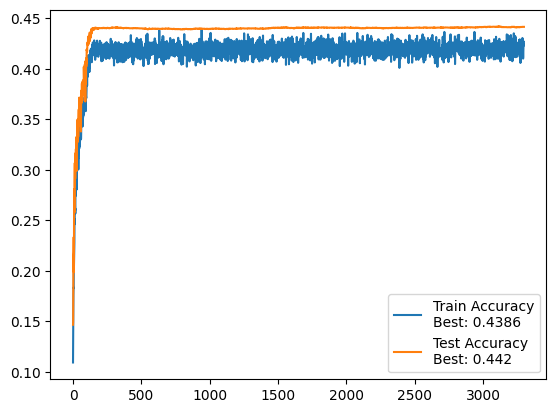

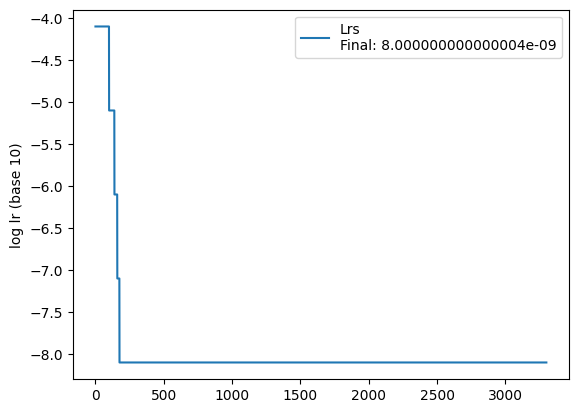


 =============== Epoch 3301 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 43.2%, Avg loss: 1.539249, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.2%, Avg loss: 1.512253

 =============== Epoch 3302 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.5%, Avg loss: 1.555830, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.512263

 =============== Epoch 3303 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.5%, Avg loss: 1.567935, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.512278

 =============== Epoch 3304 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.5%, Avg loss: 1.561876, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.2%, Avg loss: 1.512279

 =============== Epoch 3305 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.5%, Avg loss: 1.568245, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.2%, Avg loss: 1.512275

 =============== Epoch 3306 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.554006, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


 Test accuracy: 44.2%, Avg loss: 1.512259

 =============== Epoch 3307 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.541065, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.512268

 =============== Epoch 3308 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.542236, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.2%, Avg loss: 1.512279

 =============== Epoch 3309 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.6%, Avg loss: 1.572465, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.2%, Avg loss: 1.512285

 =============== Epoch 3310 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 40.4%, Avg loss: 1.575287, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.512279

 =============== Epoch 3311 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.2%, Avg loss: 1.570318, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.2%, Avg loss: 1.512270

 =============== Epoch 3312 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.553789, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.512278

 =============== Epoch 3313 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.7%, Avg loss: 1.538986, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.512271

 =============== Epoch 3314 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.565275, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.2%, Avg loss: 1.512276

 =============== Epoch 3315 ===============


100%|██████████| 40/40 [00:16<00:00,  2.39it/s]


 Train accuracy: 42.0%, Avg loss: 1.543986, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.2%, Avg loss: 1.512276

 =============== Epoch 3316 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.3%, Avg loss: 1.547541, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.2%, Avg loss: 1.512283

 =============== Epoch 3317 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.5%, Avg loss: 1.553260, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.2%, Avg loss: 1.512282

 =============== Epoch 3318 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.9%, Avg loss: 1.561720, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.512275

 =============== Epoch 3319 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.541826, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.512279

 =============== Epoch 3320 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 40.8%, Avg loss: 1.583396, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.2%, Avg loss: 1.512278

 =============== Epoch 3321 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.5%, Avg loss: 1.554260, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.2%, Avg loss: 1.512281

 =============== Epoch 3322 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.9%, Avg loss: 1.568049, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.512292

 =============== Epoch 3323 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.7%, Avg loss: 1.549699, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.512281

 =============== Epoch 3324 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.563363, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.512282

 =============== Epoch 3325 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.1%, Avg loss: 1.543308, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.2%, Avg loss: 1.512286

 =============== Epoch 3326 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.549167, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.2%, Avg loss: 1.512290

 =============== Epoch 3327 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.564173, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.2%, Avg loss: 1.512287

 =============== Epoch 3328 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.560569, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.512283

 =============== Epoch 3329 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.9%, Avg loss: 1.546190, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


 Test accuracy: 44.1%, Avg loss: 1.512272

 =============== Epoch 3330 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.2%, Avg loss: 1.595302, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.2%, Avg loss: 1.512277

 =============== Epoch 3331 ===============


100%|██████████| 40/40 [00:17<00:00,  2.31it/s]


 Train accuracy: 41.6%, Avg loss: 1.563717, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512278

 =============== Epoch 3332 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.7%, Avg loss: 1.565755, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512273

 =============== Epoch 3333 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.541558, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512271

 =============== Epoch 3334 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.567888, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.2%, Avg loss: 1.512281

 =============== Epoch 3335 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.9%, Avg loss: 1.547256, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.512278

 =============== Epoch 3336 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.549514, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.2%, Avg loss: 1.512257

 =============== Epoch 3337 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.559221, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.512270

 =============== Epoch 3338 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.9%, Avg loss: 1.557163, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.512263

 =============== Epoch 3339 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.546600, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.2%, Avg loss: 1.512267

 =============== Epoch 3340 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.551189, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.512267

 =============== Epoch 3341 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.579976, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.2%, Avg loss: 1.512279

 =============== Epoch 3342 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.537280, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.512278

 =============== Epoch 3343 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.551578, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512281

 =============== Epoch 3344 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 42.4%, Avg loss: 1.547157, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.2%, Avg loss: 1.512282

 =============== Epoch 3345 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.1%, Avg loss: 1.555776, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.512290

 =============== Epoch 3346 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.9%, Avg loss: 1.548507, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.2%, Avg loss: 1.512285

 =============== Epoch 3347 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.1%, Avg loss: 1.572611, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.512288

 =============== Epoch 3348 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.555506, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


 Test accuracy: 44.2%, Avg loss: 1.512269

 =============== Epoch 3349 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.7%, Avg loss: 1.555081, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


 Test accuracy: 44.2%, Avg loss: 1.512264

 =============== Epoch 3350 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.557717, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.2%, Avg loss: 1.512261


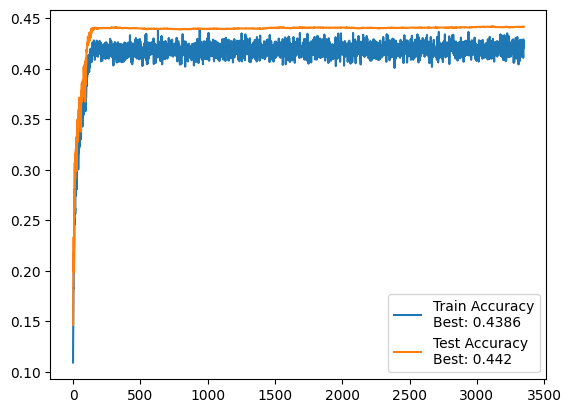

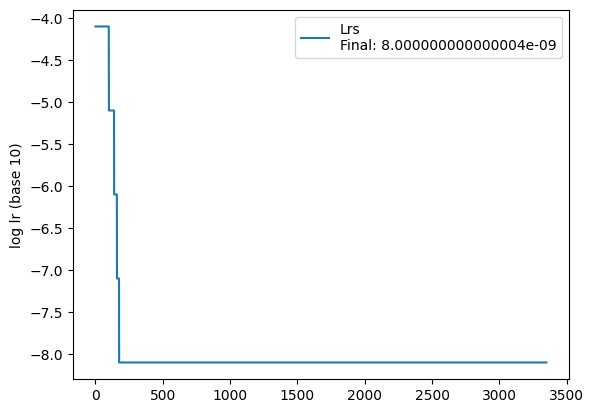


 =============== Epoch 3351 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.567005, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.2%, Avg loss: 1.512257

 =============== Epoch 3352 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.548222, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.2%, Avg loss: 1.512262

 =============== Epoch 3353 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.3%, Avg loss: 1.546776, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


 Test accuracy: 44.2%, Avg loss: 1.512259

 =============== Epoch 3354 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.6%, Avg loss: 1.558685, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.2%, Avg loss: 1.512256

 =============== Epoch 3355 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.556932, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.512258

 =============== Epoch 3356 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.4%, Avg loss: 1.555575, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.512255

 =============== Epoch 3357 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.7%, Avg loss: 1.571709, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.2%, Avg loss: 1.512266

 =============== Epoch 3358 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.7%, Avg loss: 1.544319, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.2%, Avg loss: 1.512266

 =============== Epoch 3359 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.4%, Avg loss: 1.555549, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.2%, Avg loss: 1.512268

 =============== Epoch 3360 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.2%, Avg loss: 1.554667, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.512260

 =============== Epoch 3361 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.5%, Avg loss: 1.559628, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.512256

 =============== Epoch 3362 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.565553, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.2%, Avg loss: 1.512258

 =============== Epoch 3363 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 40.7%, Avg loss: 1.570780, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.512231

 =============== Epoch 3364 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.552485, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.2%, Avg loss: 1.512218

 =============== Epoch 3365 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 43.3%, Avg loss: 1.553525, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.2%, Avg loss: 1.512217

 =============== Epoch 3366 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.561675, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.512197

 =============== Epoch 3367 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.9%, Avg loss: 1.541292, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.2%, Avg loss: 1.512198

 =============== Epoch 3368 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.7%, Avg loss: 1.560024, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.2%, Avg loss: 1.512193

 =============== Epoch 3369 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.3%, Avg loss: 1.566623, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.512199

 =============== Epoch 3370 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.4%, Avg loss: 1.541904, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.512204

 =============== Epoch 3371 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 43.1%, Avg loss: 1.556421, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.2%, Avg loss: 1.512196

 =============== Epoch 3372 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.547106, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.83it/s]


 Test accuracy: 44.2%, Avg loss: 1.512193

 =============== Epoch 3373 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.8%, Avg loss: 1.550692, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.2%, Avg loss: 1.512186

 =============== Epoch 3374 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 40.7%, Avg loss: 1.562760, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.512185

 =============== Epoch 3375 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.558509, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.512177

 =============== Epoch 3376 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.532749, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.512181

 =============== Epoch 3377 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.8%, Avg loss: 1.581118, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.2%, Avg loss: 1.512193

 =============== Epoch 3378 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.8%, Avg loss: 1.551518, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.512186

 =============== Epoch 3379 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.562481, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.512187

 =============== Epoch 3380 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.570530, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.2%, Avg loss: 1.512176

 =============== Epoch 3381 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.3%, Avg loss: 1.563242, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.2%, Avg loss: 1.512169

 =============== Epoch 3382 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 42.5%, Avg loss: 1.557694, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.512165

 =============== Epoch 3383 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.568837, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.2%, Avg loss: 1.512163

 =============== Epoch 3384 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 40.5%, Avg loss: 1.564730, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.512157

 =============== Epoch 3385 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.8%, Avg loss: 1.555629, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.512155

 =============== Epoch 3386 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.6%, Avg loss: 1.565099, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.84it/s]


 Test accuracy: 44.2%, Avg loss: 1.512148

 =============== Epoch 3387 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.2%, Avg loss: 1.539143, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.2%, Avg loss: 1.512147

 =============== Epoch 3388 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 43.1%, Avg loss: 1.544486, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.2%, Avg loss: 1.512144

 =============== Epoch 3389 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.563755, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.512148

 =============== Epoch 3390 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.562113, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.512147

 =============== Epoch 3391 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.544104, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.86it/s]


 Test accuracy: 44.2%, Avg loss: 1.512149

 =============== Epoch 3392 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.553430, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.512166

 =============== Epoch 3393 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.0%, Avg loss: 1.565421, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.512184

 =============== Epoch 3394 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.8%, Avg loss: 1.558728, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.512180

 =============== Epoch 3395 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.542337, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.2%, Avg loss: 1.512171

 =============== Epoch 3396 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.3%, Avg loss: 1.557827, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.2%, Avg loss: 1.512157

 =============== Epoch 3397 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.4%, Avg loss: 1.544407, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.512150

 =============== Epoch 3398 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.549780, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.512148

 =============== Epoch 3399 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.8%, Avg loss: 1.562922, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.512160

 =============== Epoch 3400 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.546157, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.2%, Avg loss: 1.512153


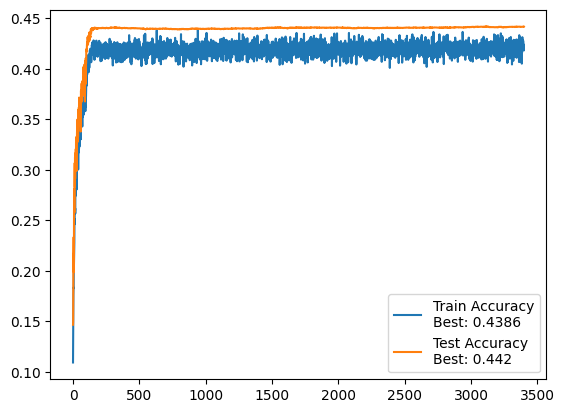

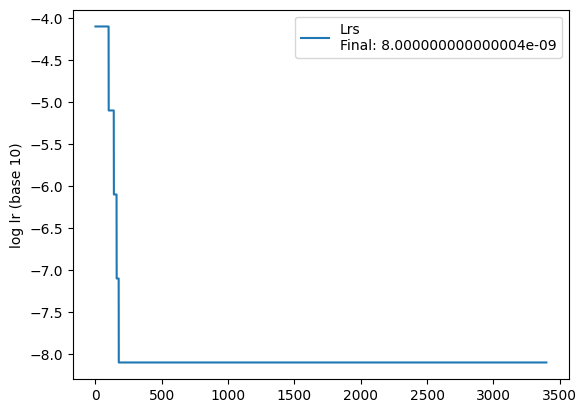


 =============== Epoch 3401 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.552934, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.2%, Avg loss: 1.512161

 =============== Epoch 3402 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.546820, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.512169

 =============== Epoch 3403 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 43.1%, Avg loss: 1.557285, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.2%, Avg loss: 1.512188

 =============== Epoch 3404 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.557012, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.512186

 =============== Epoch 3405 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.1%, Avg loss: 1.571817, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.2%, Avg loss: 1.512180

 =============== Epoch 3406 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.552352, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.1%, Avg loss: 1.512180

 =============== Epoch 3407 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.553392, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512170

 =============== Epoch 3408 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.8%, Avg loss: 1.554925, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512185

 =============== Epoch 3409 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.559568, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512182

 =============== Epoch 3410 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.7%, Avg loss: 1.546488, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.512190

 =============== Epoch 3411 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.9%, Avg loss: 1.565441, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512189

 =============== Epoch 3412 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.2%, Avg loss: 1.557468, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.512194

 =============== Epoch 3413 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.0%, Avg loss: 1.586277, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512206

 =============== Epoch 3414 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.3%, Avg loss: 1.545944, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.2%, Avg loss: 1.512206

 =============== Epoch 3415 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.549669, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.512203

 =============== Epoch 3416 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.4%, Avg loss: 1.572481, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512207

 =============== Epoch 3417 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.543966, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512194

 =============== Epoch 3418 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.536764, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512190

 =============== Epoch 3419 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.567602, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.512175

 =============== Epoch 3420 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.554172, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512175

 =============== Epoch 3421 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.550694, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512187

 =============== Epoch 3422 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.9%, Avg loss: 1.544682, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512190

 =============== Epoch 3423 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 43.2%, Avg loss: 1.528206, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512187

 =============== Epoch 3424 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 43.5%, Avg loss: 1.553591, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512193

 =============== Epoch 3425 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.8%, Avg loss: 1.548475, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512182

 =============== Epoch 3426 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.567559, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.512176

 =============== Epoch 3427 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.6%, Avg loss: 1.555449, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512175

 =============== Epoch 3428 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.554730, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512176

 =============== Epoch 3429 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.1%, Avg loss: 1.540674, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.2%, Avg loss: 1.512174

 =============== Epoch 3430 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.566311, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512176

 =============== Epoch 3431 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.550591, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512187

 =============== Epoch 3432 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.6%, Avg loss: 1.579881, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512194

 =============== Epoch 3433 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.543965, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.512188

 =============== Epoch 3434 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.547647, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512174

 =============== Epoch 3435 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.532128, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512170

 =============== Epoch 3436 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.564821, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.512187

 =============== Epoch 3437 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.558334, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.512183

 =============== Epoch 3438 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 43.1%, Avg loss: 1.532263, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.2%, Avg loss: 1.512205

 =============== Epoch 3439 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.8%, Avg loss: 1.563294, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.2%, Avg loss: 1.512184

 =============== Epoch 3440 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.6%, Avg loss: 1.544299, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.59it/s]


 Test accuracy: 44.2%, Avg loss: 1.512177

 =============== Epoch 3441 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.550500, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.512171

 =============== Epoch 3442 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.6%, Avg loss: 1.556675, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.2%, Avg loss: 1.512170

 =============== Epoch 3443 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.537584, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.2%, Avg loss: 1.512162

 =============== Epoch 3444 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.571627, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.512159

 =============== Epoch 3445 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.4%, Avg loss: 1.569071, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.2%, Avg loss: 1.512155

 =============== Epoch 3446 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.565861, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.512168

 =============== Epoch 3447 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.3%, Avg loss: 1.554480, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.2%, Avg loss: 1.512156

 =============== Epoch 3448 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.7%, Avg loss: 1.530288, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.512161

 =============== Epoch 3449 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.538597, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512174

 =============== Epoch 3450 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.583655, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512172


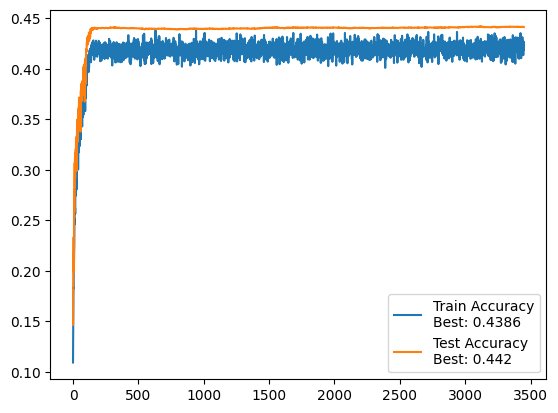

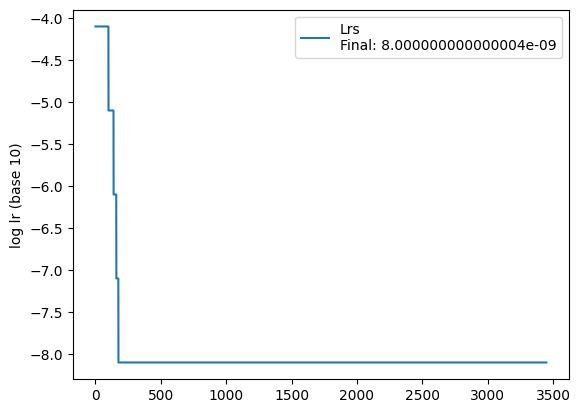


 =============== Epoch 3451 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.8%, Avg loss: 1.544133, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.1%, Avg loss: 1.512169

 =============== Epoch 3452 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.555978, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512183

 =============== Epoch 3453 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.2%, Avg loss: 1.567711, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.2%, Avg loss: 1.512183

 =============== Epoch 3454 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.555633, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.512186

 =============== Epoch 3455 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.559627, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.60it/s]


 Test accuracy: 44.1%, Avg loss: 1.512184

 =============== Epoch 3456 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.0%, Avg loss: 1.543140, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512180

 =============== Epoch 3457 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.563669, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512171

 =============== Epoch 3458 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.558104, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512164

 =============== Epoch 3459 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.542459, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512172

 =============== Epoch 3460 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 43.4%, Avg loss: 1.539138, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512176

 =============== Epoch 3461 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.555511, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512187

 =============== Epoch 3462 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.540938, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512183

 =============== Epoch 3463 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.1%, Avg loss: 1.569779, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512189

 =============== Epoch 3464 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.546547, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512189

 =============== Epoch 3465 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.548166, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512179

 =============== Epoch 3466 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.553219, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


 Test accuracy: 44.1%, Avg loss: 1.512174

 =============== Epoch 3467 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 40.8%, Avg loss: 1.565805, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512182

 =============== Epoch 3468 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.8%, Avg loss: 1.540534, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512187

 =============== Epoch 3469 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.545301, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512190

 =============== Epoch 3470 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.4%, Avg loss: 1.567275, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512204

 =============== Epoch 3471 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.564635, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


 Test accuracy: 44.2%, Avg loss: 1.512208

 =============== Epoch 3472 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.567030, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.2%, Avg loss: 1.512197

 =============== Epoch 3473 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.562511, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.512199

 =============== Epoch 3474 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.565101, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.512202

 =============== Epoch 3475 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.4%, Avg loss: 1.580192, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.512196

 =============== Epoch 3476 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.563774, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.2%, Avg loss: 1.512202

 =============== Epoch 3477 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.1%, Avg loss: 1.548241, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.2%, Avg loss: 1.512201

 =============== Epoch 3478 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 43.4%, Avg loss: 1.547920, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.512201

 =============== Epoch 3479 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.555539, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.512210

 =============== Epoch 3480 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.536152, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512218

 =============== Epoch 3481 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.9%, Avg loss: 1.576014, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512208

 =============== Epoch 3482 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.545100, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512206

 =============== Epoch 3483 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.2%, Avg loss: 1.556786, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.512206

 =============== Epoch 3484 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.539140, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512220

 =============== Epoch 3485 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.4%, Avg loss: 1.526172, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.2%, Avg loss: 1.512219

 =============== Epoch 3486 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.555626, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512213

 =============== Epoch 3487 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.6%, Avg loss: 1.576256, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512212

 =============== Epoch 3488 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.2%, Avg loss: 1.573248, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512200

 =============== Epoch 3489 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.557578, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512200

 =============== Epoch 3490 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.8%, Avg loss: 1.556329, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.512197

 =============== Epoch 3491 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.559299, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512188

 =============== Epoch 3492 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.550060, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512186

 =============== Epoch 3493 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.567973, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.54it/s]


 Test accuracy: 44.1%, Avg loss: 1.512179

 =============== Epoch 3494 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.4%, Avg loss: 1.556975, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512167

 =============== Epoch 3495 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.0%, Avg loss: 1.553030, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.512162

 =============== Epoch 3496 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.575609, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512165

 =============== Epoch 3497 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.548434, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.512157

 =============== Epoch 3498 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.555418, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512173

 =============== Epoch 3499 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.9%, Avg loss: 1.536114, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.512179

 =============== Epoch 3500 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.6%, Avg loss: 1.544576, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512180


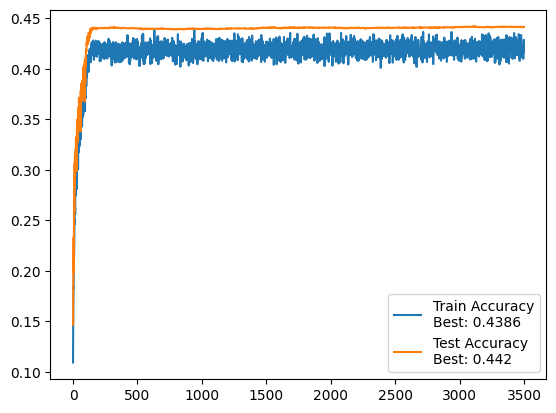

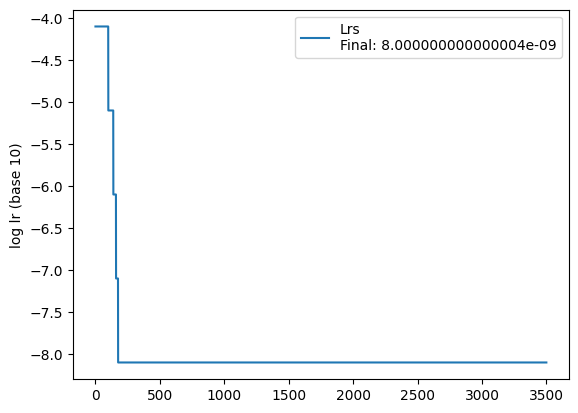


 =============== Epoch 3501 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.3%, Avg loss: 1.554686, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512165

 =============== Epoch 3502 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.557018, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


 Test accuracy: 44.1%, Avg loss: 1.512168

 =============== Epoch 3503 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.553726, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512157

 =============== Epoch 3504 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.568087, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512155

 =============== Epoch 3505 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.0%, Avg loss: 1.537403, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512166

 =============== Epoch 3506 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.4%, Avg loss: 1.540165, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.1%, Avg loss: 1.512162

 =============== Epoch 3507 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.4%, Avg loss: 1.547205, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512168

 =============== Epoch 3508 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.552938, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512175

 =============== Epoch 3509 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.9%, Avg loss: 1.535796, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512180

 =============== Epoch 3510 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.4%, Avg loss: 1.555892, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512184

 =============== Epoch 3511 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.2%, Avg loss: 1.562343, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512182

 =============== Epoch 3512 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.2%, Avg loss: 1.558170, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512178

 =============== Epoch 3513 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.536526, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512180

 =============== Epoch 3514 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.557916, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512193

 =============== Epoch 3515 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.559891, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512197

 =============== Epoch 3516 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.528858, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512198

 =============== Epoch 3517 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.572107, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512182

 =============== Epoch 3518 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.4%, Avg loss: 1.547203, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512182

 =============== Epoch 3519 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 43.2%, Avg loss: 1.553585, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512189

 =============== Epoch 3520 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.545868, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512193

 =============== Epoch 3521 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.551270, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.2%, Avg loss: 1.512194

 =============== Epoch 3522 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.546480, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.512188

 =============== Epoch 3523 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.548240, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.83it/s]


 Test accuracy: 44.2%, Avg loss: 1.512193

 =============== Epoch 3524 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.571516, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512192

 =============== Epoch 3525 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.4%, Avg loss: 1.539335, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.512195

 =============== Epoch 3526 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.545141, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.512183

 =============== Epoch 3527 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.5%, Avg loss: 1.551934, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.512188

 =============== Epoch 3528 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.6%, Avg loss: 1.566236, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.2%, Avg loss: 1.512189

 =============== Epoch 3529 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.2%, Avg loss: 1.561161, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.2%, Avg loss: 1.512174

 =============== Epoch 3530 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 40.8%, Avg loss: 1.558545, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.2%, Avg loss: 1.512167

 =============== Epoch 3531 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.0%, Avg loss: 1.571761, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512170

 =============== Epoch 3532 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.541533, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512168

 =============== Epoch 3533 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.557731, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512153

 =============== Epoch 3534 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.4%, Avg loss: 1.561177, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512153

 =============== Epoch 3535 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 43.7%, Avg loss: 1.533228, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512152

 =============== Epoch 3536 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.556516, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512141

 =============== Epoch 3537 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.7%, Avg loss: 1.555599, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.512136

 =============== Epoch 3538 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.3%, Avg loss: 1.542886, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.512134

 =============== Epoch 3539 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 41.6%, Avg loss: 1.571830, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512126

 =============== Epoch 3540 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.557389, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512139

 =============== Epoch 3541 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.546000, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512146

 =============== Epoch 3542 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 42.8%, Avg loss: 1.570550, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.512134

 =============== Epoch 3543 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.7%, Avg loss: 1.564401, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512122

 =============== Epoch 3544 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.552008, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512114

 =============== Epoch 3545 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.572366, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512110

 =============== Epoch 3546 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.546019, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512113

 =============== Epoch 3547 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.563721, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512114

 =============== Epoch 3548 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.578246, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512096

 =============== Epoch 3549 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 40.5%, Avg loss: 1.564606, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512086

 =============== Epoch 3550 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.546399, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512099


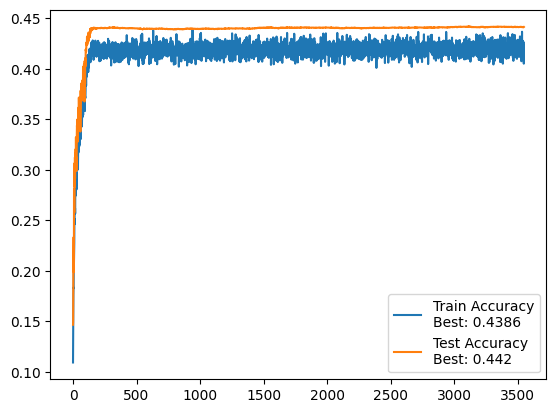

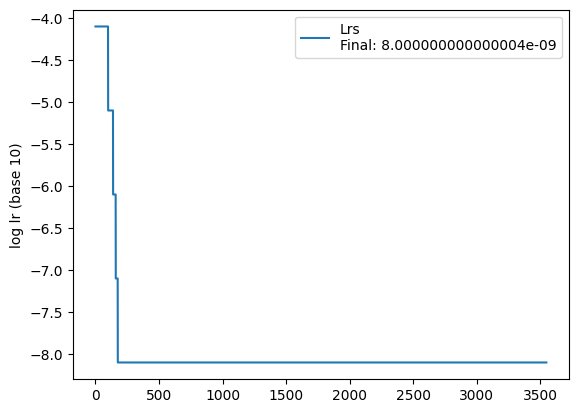


 =============== Epoch 3551 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.9%, Avg loss: 1.541020, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512094

 =============== Epoch 3552 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.573999, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.512098

 =============== Epoch 3553 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.7%, Avg loss: 1.544631, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512092

 =============== Epoch 3554 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 40.8%, Avg loss: 1.583949, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512104

 =============== Epoch 3555 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.5%, Avg loss: 1.545574, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512096

 =============== Epoch 3556 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.577682, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.1%, Avg loss: 1.512091

 =============== Epoch 3557 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.558871, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512083

 =============== Epoch 3558 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.6%, Avg loss: 1.558627, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512077

 =============== Epoch 3559 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.566456, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512083

 =============== Epoch 3560 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.553349, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512081

 =============== Epoch 3561 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.558008, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.87it/s]


 Test accuracy: 44.1%, Avg loss: 1.512069

 =============== Epoch 3562 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.3%, Avg loss: 1.561902, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512069

 =============== Epoch 3563 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.551944, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512068

 =============== Epoch 3564 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.546833, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512059

 =============== Epoch 3565 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 43.2%, Avg loss: 1.537209, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.512051

 =============== Epoch 3566 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.546858, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.512044

 =============== Epoch 3567 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 43.2%, Avg loss: 1.545499, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512045

 =============== Epoch 3568 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.539284, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512047

 =============== Epoch 3569 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.550632, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512053

 =============== Epoch 3570 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.551968, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512057

 =============== Epoch 3571 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.5%, Avg loss: 1.545340, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.1%, Avg loss: 1.512050

 =============== Epoch 3572 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.4%, Avg loss: 1.556269, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512051

 =============== Epoch 3573 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.554532, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


 Test accuracy: 44.1%, Avg loss: 1.512058

 =============== Epoch 3574 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.545195, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512069

 =============== Epoch 3575 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.6%, Avg loss: 1.576176, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.1%, Avg loss: 1.512070

 =============== Epoch 3576 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.6%, Avg loss: 1.545993, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512064

 =============== Epoch 3577 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.7%, Avg loss: 1.544280, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512063

 =============== Epoch 3578 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.5%, Avg loss: 1.542781, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512064

 =============== Epoch 3579 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.4%, Avg loss: 1.549005, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512055

 =============== Epoch 3580 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.549541, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512058

 =============== Epoch 3581 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.4%, Avg loss: 1.576273, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512051

 =============== Epoch 3582 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.562982, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.512043

 =============== Epoch 3583 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.8%, Avg loss: 1.557968, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512037

 =============== Epoch 3584 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.6%, Avg loss: 1.579457, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512048

 =============== Epoch 3585 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.545674, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512057

 =============== Epoch 3586 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.6%, Avg loss: 1.546456, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.512054

 =============== Epoch 3587 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.537727, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512057

 =============== Epoch 3588 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.7%, Avg loss: 1.562764, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.512062

 =============== Epoch 3589 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.4%, Avg loss: 1.572593, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512046

 =============== Epoch 3590 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.0%, Avg loss: 1.576046, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512036

 =============== Epoch 3591 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.530332, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512035

 =============== Epoch 3592 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.572364, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.512043

 =============== Epoch 3593 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.1%, Avg loss: 1.545989, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.512042

 =============== Epoch 3594 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.8%, Avg loss: 1.573694, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.512037

 =============== Epoch 3595 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.2%, Avg loss: 1.558776, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.512025

 =============== Epoch 3596 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.4%, Avg loss: 1.555202, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.512024

 =============== Epoch 3597 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.7%, Avg loss: 1.572644, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.512030

 =============== Epoch 3598 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.540086, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.512034

 =============== Epoch 3599 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.555860, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.1%, Avg loss: 1.512038

 =============== Epoch 3600 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.8%, Avg loss: 1.553708, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.512029


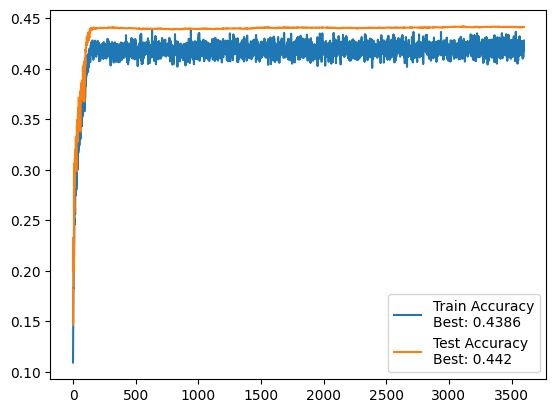

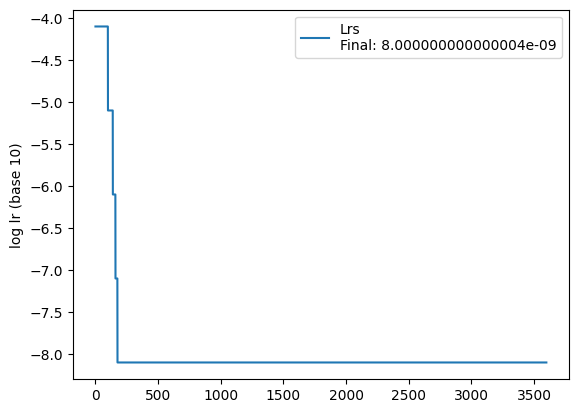


 =============== Epoch 3601 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.555157, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.512021

 =============== Epoch 3602 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.3%, Avg loss: 1.553247, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.512012

 =============== Epoch 3603 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.570051, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.512012

 =============== Epoch 3604 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 43.3%, Avg loss: 1.543296, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.1%, Avg loss: 1.512004

 =============== Epoch 3605 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.545573, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.512010

 =============== Epoch 3606 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.555743, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.512014

 =============== Epoch 3607 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 43.2%, Avg loss: 1.553991, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.512021

 =============== Epoch 3608 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.6%, Avg loss: 1.557079, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.83it/s]


 Test accuracy: 44.2%, Avg loss: 1.512017

 =============== Epoch 3609 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.1%, Avg loss: 1.563976, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.2%, Avg loss: 1.512009

 =============== Epoch 3610 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.1%, Avg loss: 1.562586, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.512003

 =============== Epoch 3611 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.560632, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.511998

 =============== Epoch 3612 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.560771, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


 Test accuracy: 44.2%, Avg loss: 1.511998

 =============== Epoch 3613 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.579321, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.2%, Avg loss: 1.511994

 =============== Epoch 3614 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.6%, Avg loss: 1.572009, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.2%, Avg loss: 1.511977

 =============== Epoch 3615 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.8%, Avg loss: 1.563609, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.2%, Avg loss: 1.511977

 =============== Epoch 3616 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.546377, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.511981

 =============== Epoch 3617 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 43.1%, Avg loss: 1.559933, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.511978

 =============== Epoch 3618 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.4%, Avg loss: 1.559343, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.511961

 =============== Epoch 3619 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.560660, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.2%, Avg loss: 1.511955

 =============== Epoch 3620 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.6%, Avg loss: 1.543296, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.60it/s]


 Test accuracy: 44.2%, Avg loss: 1.511948

 =============== Epoch 3621 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.554744, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.511950

 =============== Epoch 3622 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.4%, Avg loss: 1.569036, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.2%, Avg loss: 1.511954

 =============== Epoch 3623 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.546912, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.2%, Avg loss: 1.511950

 =============== Epoch 3624 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.547381, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.511956

 =============== Epoch 3625 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.2%, Avg loss: 1.547495, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.2%, Avg loss: 1.511948

 =============== Epoch 3626 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.541083, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.2%, Avg loss: 1.511957

 =============== Epoch 3627 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.556996, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.2%, Avg loss: 1.511959

 =============== Epoch 3628 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.546157, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.511966

 =============== Epoch 3629 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.540804, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.511977

 =============== Epoch 3630 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 43.4%, Avg loss: 1.553268, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.511977

 =============== Epoch 3631 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 40.7%, Avg loss: 1.558429, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.511979

 =============== Epoch 3632 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.3%, Avg loss: 1.564924, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.2%, Avg loss: 1.511975

 =============== Epoch 3633 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.563797, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.2%, Avg loss: 1.511966

 =============== Epoch 3634 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.569322, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.511974

 =============== Epoch 3635 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 40.5%, Avg loss: 1.563668, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.511966

 =============== Epoch 3636 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.574836, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.2%, Avg loss: 1.511965

 =============== Epoch 3637 ===============


100%|██████████| 40/40 [00:20<00:00,  1.99it/s]


 Train accuracy: 41.7%, Avg loss: 1.552149, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.87it/s]


 Test accuracy: 44.2%, Avg loss: 1.511958

 =============== Epoch 3638 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.561829, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.2%, Avg loss: 1.511968

 =============== Epoch 3639 ===============


100%|██████████| 40/40 [00:16<00:00,  2.38it/s]


 Train accuracy: 42.5%, Avg loss: 1.557795, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.2%, Avg loss: 1.511966

 =============== Epoch 3640 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.4%, Avg loss: 1.568799, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.2%, Avg loss: 1.511971

 =============== Epoch 3641 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.5%, Avg loss: 1.561181, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.89it/s]


 Test accuracy: 44.2%, Avg loss: 1.511972

 =============== Epoch 3642 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.5%, Avg loss: 1.550660, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.2%, Avg loss: 1.511965

 =============== Epoch 3643 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.541389, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.511969

 =============== Epoch 3644 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.573042, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.511969

 =============== Epoch 3645 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 43.2%, Avg loss: 1.544395, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.2%, Avg loss: 1.511967

 =============== Epoch 3646 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.7%, Avg loss: 1.533864, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.2%, Avg loss: 1.511965

 =============== Epoch 3647 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.4%, Avg loss: 1.565914, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.2%, Avg loss: 1.511965

 =============== Epoch 3648 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.7%, Avg loss: 1.557919, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.511961

 =============== Epoch 3649 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.7%, Avg loss: 1.559135, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.2%, Avg loss: 1.511976

 =============== Epoch 3650 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.4%, Avg loss: 1.539436, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.2%, Avg loss: 1.511970


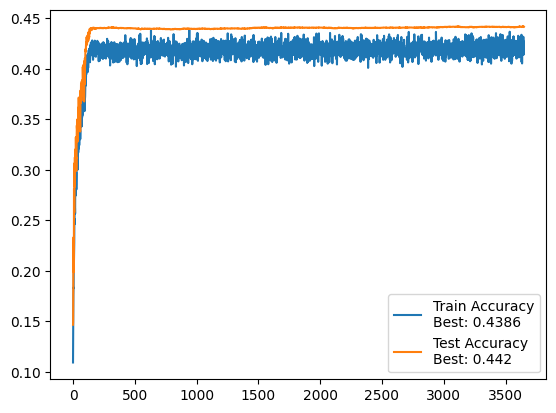

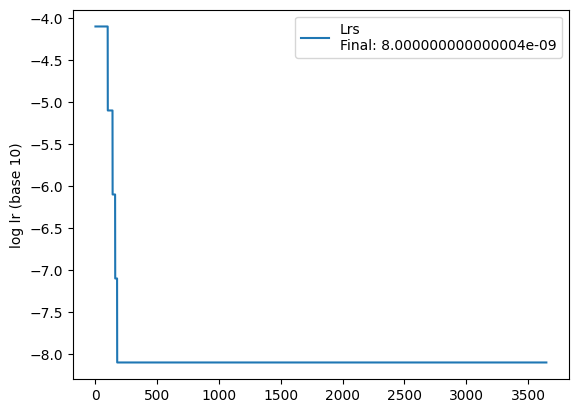


 =============== Epoch 3651 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.3%, Avg loss: 1.552601, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.2%, Avg loss: 1.511967

 =============== Epoch 3652 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.6%, Avg loss: 1.557065, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.2%, Avg loss: 1.511968

 =============== Epoch 3653 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.546249, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.2%, Avg loss: 1.511958

 =============== Epoch 3654 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.551405, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.511969

 =============== Epoch 3655 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.0%, Avg loss: 1.547312, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.2%, Avg loss: 1.511976

 =============== Epoch 3656 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.570245, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.81it/s]


 Test accuracy: 44.1%, Avg loss: 1.511987

 =============== Epoch 3657 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.557764, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.1%, Avg loss: 1.511976

 =============== Epoch 3658 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.1%, Avg loss: 1.566454, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.511962

 =============== Epoch 3659 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.540205, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.511978

 =============== Epoch 3660 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.4%, Avg loss: 1.552501, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.511980

 =============== Epoch 3661 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.571343, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.511972

 =============== Epoch 3662 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.568208, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.511983

 =============== Epoch 3663 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.577037, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.511985

 =============== Epoch 3664 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.551910, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.511971

 =============== Epoch 3665 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.2%, Avg loss: 1.550824, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.1%, Avg loss: 1.511968

 =============== Epoch 3666 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.561026, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.511955

 =============== Epoch 3667 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.542002, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.511932

 =============== Epoch 3668 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.543014, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.511934

 =============== Epoch 3669 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.3%, Avg loss: 1.555554, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.1%, Avg loss: 1.511934

 =============== Epoch 3670 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.0%, Avg loss: 1.553723, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.511924

 =============== Epoch 3671 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.542509, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.511925

 =============== Epoch 3672 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.551099, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.511914

 =============== Epoch 3673 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.3%, Avg loss: 1.563108, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.511909

 =============== Epoch 3674 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.546208, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.87it/s]


 Test accuracy: 44.1%, Avg loss: 1.511893

 =============== Epoch 3675 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.573446, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


 Test accuracy: 44.1%, Avg loss: 1.511895

 =============== Epoch 3676 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.9%, Avg loss: 1.535254, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.511897

 =============== Epoch 3677 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.541112, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.1%, Avg loss: 1.511898

 =============== Epoch 3678 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.569457, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.511898

 =============== Epoch 3679 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 43.3%, Avg loss: 1.565420, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.511901

 =============== Epoch 3680 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.8%, Avg loss: 1.560516, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.1%, Avg loss: 1.511900

 =============== Epoch 3681 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.569047, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.511905

 =============== Epoch 3682 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.546652, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.1%, Avg loss: 1.511911

 =============== Epoch 3683 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.557628, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.1%, Avg loss: 1.511906

 =============== Epoch 3684 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.9%, Avg loss: 1.570630, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.2%, Avg loss: 1.511919

 =============== Epoch 3685 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.9%, Avg loss: 1.550644, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.511909

 =============== Epoch 3686 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 43.0%, Avg loss: 1.555733, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.2%, Avg loss: 1.511910

 =============== Epoch 3687 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.1%, Avg loss: 1.543309, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.511917

 =============== Epoch 3688 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.542499, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.511914

 =============== Epoch 3689 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.7%, Avg loss: 1.561503, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.1%, Avg loss: 1.511910

 =============== Epoch 3690 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.552318, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.511911

 =============== Epoch 3691 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.1%, Avg loss: 1.549815, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.511910

 =============== Epoch 3692 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.6%, Avg loss: 1.549488, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.511918

 =============== Epoch 3693 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.6%, Avg loss: 1.559901, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.1%, Avg loss: 1.511915

 =============== Epoch 3694 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.6%, Avg loss: 1.560496, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.1%, Avg loss: 1.511918

 =============== Epoch 3695 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.553156, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.511909

 =============== Epoch 3696 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.1%, Avg loss: 1.551965, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.511911

 =============== Epoch 3697 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.4%, Avg loss: 1.548347, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.511918

 =============== Epoch 3698 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.5%, Avg loss: 1.552130, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.2%, Avg loss: 1.511934

 =============== Epoch 3699 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.5%, Avg loss: 1.538903, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.511930

 =============== Epoch 3700 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.547209, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.60it/s]


 Test accuracy: 44.2%, Avg loss: 1.511925


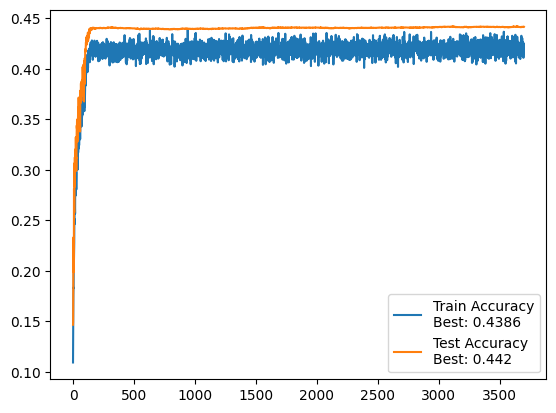

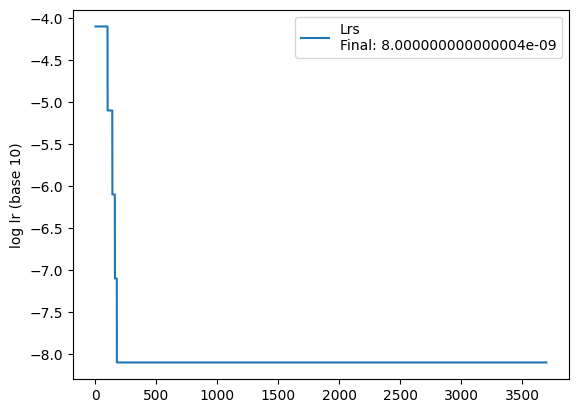


 =============== Epoch 3701 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.7%, Avg loss: 1.557819, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.511915

 =============== Epoch 3702 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.562295, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.2%, Avg loss: 1.511912

 =============== Epoch 3703 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.542816, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.511912

 =============== Epoch 3704 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.3%, Avg loss: 1.558854, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.511901

 =============== Epoch 3705 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.555090, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.511916

 =============== Epoch 3706 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.2%, Avg loss: 1.565797, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.511910

 =============== Epoch 3707 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.552791, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.2%, Avg loss: 1.511906

 =============== Epoch 3708 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.7%, Avg loss: 1.546791, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.511907

 =============== Epoch 3709 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.547311, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.2%, Avg loss: 1.511900

 =============== Epoch 3710 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.3%, Avg loss: 1.566539, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.511890

 =============== Epoch 3711 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.559791, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.511902

 =============== Epoch 3712 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.558293, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.2%, Avg loss: 1.511901

 =============== Epoch 3713 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.562255, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.2%, Avg loss: 1.511910

 =============== Epoch 3714 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 40.9%, Avg loss: 1.565142, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.511898

 =============== Epoch 3715 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.0%, Avg loss: 1.552503, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.2%, Avg loss: 1.511909

 =============== Epoch 3716 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.6%, Avg loss: 1.544848, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.2%, Avg loss: 1.511914

 =============== Epoch 3717 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.562599, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.511911

 =============== Epoch 3718 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.5%, Avg loss: 1.560423, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.511903

 =============== Epoch 3719 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.536363, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.2%, Avg loss: 1.511899

 =============== Epoch 3720 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.3%, Avg loss: 1.550194, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.511903

 =============== Epoch 3721 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 42.0%, Avg loss: 1.549290, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.2%, Avg loss: 1.511898

 =============== Epoch 3722 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.4%, Avg loss: 1.549799, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.511888

 =============== Epoch 3723 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.5%, Avg loss: 1.542692, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.2%, Avg loss: 1.511883

 =============== Epoch 3724 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.539685, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.2%, Avg loss: 1.511895

 =============== Epoch 3725 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.550005, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.511908

 =============== Epoch 3726 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.554055, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.2%, Avg loss: 1.511908

 =============== Epoch 3727 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.552708, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.511909

 =============== Epoch 3728 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.4%, Avg loss: 1.573949, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.511893

 =============== Epoch 3729 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.558305, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


 Test accuracy: 44.2%, Avg loss: 1.511889

 =============== Epoch 3730 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.1%, Avg loss: 1.578272, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.511878

 =============== Epoch 3731 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.559654, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.511876

 =============== Epoch 3732 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.571314, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.2%, Avg loss: 1.511887

 =============== Epoch 3733 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.540803, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.2%, Avg loss: 1.511878

 =============== Epoch 3734 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 43.2%, Avg loss: 1.547751, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


 Test accuracy: 44.2%, Avg loss: 1.511879

 =============== Epoch 3735 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.550196, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.2%, Avg loss: 1.511875

 =============== Epoch 3736 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.575154, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.511880

 =============== Epoch 3737 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.3%, Avg loss: 1.554704, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.511878

 =============== Epoch 3738 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.586363, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.2%, Avg loss: 1.511875

 =============== Epoch 3739 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.539931, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.511866

 =============== Epoch 3740 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.6%, Avg loss: 1.538171, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.511869

 =============== Epoch 3741 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 42.7%, Avg loss: 1.542872, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.2%, Avg loss: 1.511875

 =============== Epoch 3742 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.1%, Avg loss: 1.554653, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


 Test accuracy: 44.2%, Avg loss: 1.511880

 =============== Epoch 3743 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.568950, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.58it/s]


 Test accuracy: 44.2%, Avg loss: 1.511869

 =============== Epoch 3744 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.1%, Avg loss: 1.543288, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.511869

 =============== Epoch 3745 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.562404, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


 Test accuracy: 44.2%, Avg loss: 1.511873

 =============== Epoch 3746 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 43.0%, Avg loss: 1.547775, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.511874

 =============== Epoch 3747 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.545947, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.60it/s]


 Test accuracy: 44.2%, Avg loss: 1.511878

 =============== Epoch 3748 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.4%, Avg loss: 1.554639, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


 Test accuracy: 44.2%, Avg loss: 1.511883

 =============== Epoch 3749 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.546950, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.511894

 =============== Epoch 3750 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 42.6%, Avg loss: 1.559652, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.2%, Avg loss: 1.511887


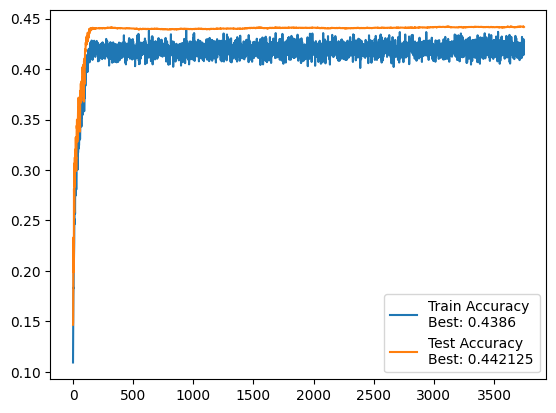

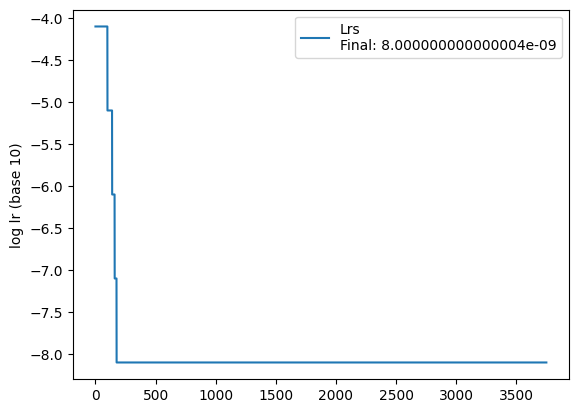


 =============== Epoch 3751 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.2%, Avg loss: 1.562125, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.2%, Avg loss: 1.511881

 =============== Epoch 3752 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.558754, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.511887

 =============== Epoch 3753 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.580538, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.2%, Avg loss: 1.511885

 =============== Epoch 3754 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.2%, Avg loss: 1.555951, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.2%, Avg loss: 1.511879

 =============== Epoch 3755 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.6%, Avg loss: 1.558261, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.2%, Avg loss: 1.511895

 =============== Epoch 3756 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 43.0%, Avg loss: 1.555859, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.511886

 =============== Epoch 3757 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.545848, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


 Test accuracy: 44.2%, Avg loss: 1.511881

 =============== Epoch 3758 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.2%, Avg loss: 1.547974, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.2%, Avg loss: 1.511887

 =============== Epoch 3759 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.5%, Avg loss: 1.550727, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.511891

 =============== Epoch 3760 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 43.0%, Avg loss: 1.547751, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.511880

 =============== Epoch 3761 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 43.1%, Avg loss: 1.540066, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.2%, Avg loss: 1.511883

 =============== Epoch 3762 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.3%, Avg loss: 1.547113, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.2%, Avg loss: 1.511880

 =============== Epoch 3763 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.566985, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.511870

 =============== Epoch 3764 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.552911, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.2%, Avg loss: 1.511862

 =============== Epoch 3765 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.558038, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.511846

 =============== Epoch 3766 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.550347, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.2%, Avg loss: 1.511837

 =============== Epoch 3767 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.1%, Avg loss: 1.563675, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.2%, Avg loss: 1.511846

 =============== Epoch 3768 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.563086, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.511835

 =============== Epoch 3769 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.8%, Avg loss: 1.568465, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.511840

 =============== Epoch 3770 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.6%, Avg loss: 1.551246, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.2%, Avg loss: 1.511845

 =============== Epoch 3771 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.574521, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.511832

 =============== Epoch 3772 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.7%, Avg loss: 1.546186, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.511839

 =============== Epoch 3773 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.550373, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


 Test accuracy: 44.2%, Avg loss: 1.511856

 =============== Epoch 3774 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.1%, Avg loss: 1.574258, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.2%, Avg loss: 1.511848

 =============== Epoch 3775 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.7%, Avg loss: 1.551277, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.511844

 =============== Epoch 3776 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.564435, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.2%, Avg loss: 1.511855

 =============== Epoch 3777 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.546830, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


 Test accuracy: 44.2%, Avg loss: 1.511861

 =============== Epoch 3778 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.565564, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.2%, Avg loss: 1.511851

 =============== Epoch 3779 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.542153, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.511864

 =============== Epoch 3780 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.9%, Avg loss: 1.564433, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.511859

 =============== Epoch 3781 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.9%, Avg loss: 1.562262, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.2%, Avg loss: 1.511854

 =============== Epoch 3782 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.2%, Avg loss: 1.547222, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.1%, Avg loss: 1.511843

 =============== Epoch 3783 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.553504, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.2%, Avg loss: 1.511837

 =============== Epoch 3784 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.8%, Avg loss: 1.550527, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.511813

 =============== Epoch 3785 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.538786, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.511809

 =============== Epoch 3786 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.9%, Avg loss: 1.560471, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.511812

 =============== Epoch 3787 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.6%, Avg loss: 1.559047, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.2%, Avg loss: 1.511809

 =============== Epoch 3788 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.4%, Avg loss: 1.559455, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.2%, Avg loss: 1.511810

 =============== Epoch 3789 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.6%, Avg loss: 1.567410, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.511815

 =============== Epoch 3790 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.3%, Avg loss: 1.562069, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.511812

 =============== Epoch 3791 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.560705, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.511810

 =============== Epoch 3792 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.565275, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


 Test accuracy: 44.2%, Avg loss: 1.511791

 =============== Epoch 3793 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.566133, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.511788

 =============== Epoch 3794 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.546111, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.511785

 =============== Epoch 3795 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.577381, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.511791

 =============== Epoch 3796 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.566858, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.2%, Avg loss: 1.511781

 =============== Epoch 3797 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.7%, Avg loss: 1.553936, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.2%, Avg loss: 1.511789

 =============== Epoch 3798 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.541196, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.2%, Avg loss: 1.511801

 =============== Epoch 3799 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.550170, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.2%, Avg loss: 1.511797

 =============== Epoch 3800 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.541083, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.511799


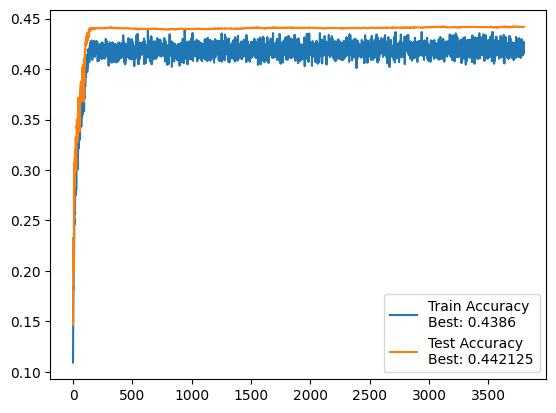

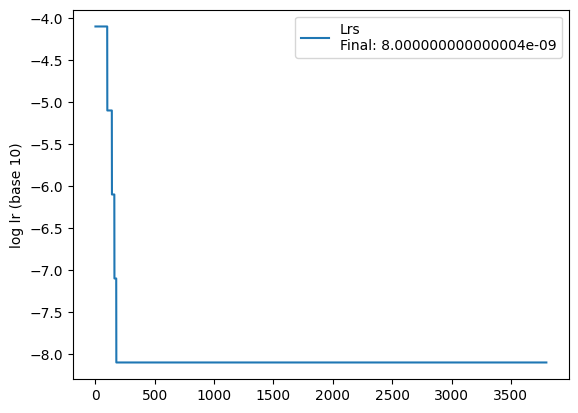


 =============== Epoch 3801 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.8%, Avg loss: 1.555366, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.511792

 =============== Epoch 3802 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.555590, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.511785

 =============== Epoch 3803 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.552773, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.511776

 =============== Epoch 3804 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.4%, Avg loss: 1.540027, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.57it/s]


 Test accuracy: 44.2%, Avg loss: 1.511788

 =============== Epoch 3805 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.3%, Avg loss: 1.562610, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.2%, Avg loss: 1.511785

 =============== Epoch 3806 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.554196, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.2%, Avg loss: 1.511776

 =============== Epoch 3807 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.7%, Avg loss: 1.550505, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.511778

 =============== Epoch 3808 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.7%, Avg loss: 1.558566, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.2%, Avg loss: 1.511785

 =============== Epoch 3809 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.7%, Avg loss: 1.542480, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


 Test accuracy: 44.2%, Avg loss: 1.511786

 =============== Epoch 3810 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.530061, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.60it/s]


 Test accuracy: 44.2%, Avg loss: 1.511779

 =============== Epoch 3811 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.6%, Avg loss: 1.557675, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.511781

 =============== Epoch 3812 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.8%, Avg loss: 1.536711, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.511781

 =============== Epoch 3813 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.4%, Avg loss: 1.525281, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.2%, Avg loss: 1.511779

 =============== Epoch 3814 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.547105, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


 Test accuracy: 44.2%, Avg loss: 1.511784

 =============== Epoch 3815 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.9%, Avg loss: 1.546741, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.2%, Avg loss: 1.511789

 =============== Epoch 3816 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.560648, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.511791

 =============== Epoch 3817 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.543173, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.511790

 =============== Epoch 3818 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.552870, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


 Test accuracy: 44.2%, Avg loss: 1.511794

 =============== Epoch 3819 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.543630, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.2%, Avg loss: 1.511788

 =============== Epoch 3820 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.1%, Avg loss: 1.576349, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.2%, Avg loss: 1.511778

 =============== Epoch 3821 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 43.1%, Avg loss: 1.560670, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.2%, Avg loss: 1.511787

 =============== Epoch 3822 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.553301, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.2%, Avg loss: 1.511787

 =============== Epoch 3823 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.2%, Avg loss: 1.584773, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.511779

 =============== Epoch 3824 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.7%, Avg loss: 1.561224, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.54it/s]


 Test accuracy: 44.2%, Avg loss: 1.511774

 =============== Epoch 3825 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.555784, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.511769

 =============== Epoch 3826 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.546012, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.2%, Avg loss: 1.511765

 =============== Epoch 3827 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.554325, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.2%, Avg loss: 1.511760

 =============== Epoch 3828 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.557494, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.511749

 =============== Epoch 3829 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.564355, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.511745

 =============== Epoch 3830 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.6%, Avg loss: 1.558496, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.511748

 =============== Epoch 3831 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.542717, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.511755

 =============== Epoch 3832 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.1%, Avg loss: 1.563898, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.2%, Avg loss: 1.511759

 =============== Epoch 3833 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.535876, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


 Test accuracy: 44.2%, Avg loss: 1.511754

 =============== Epoch 3834 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.569142, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.511750

 =============== Epoch 3835 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.1%, Avg loss: 1.562544, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.511753

 =============== Epoch 3836 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.526916, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.511747

 =============== Epoch 3837 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.566480, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.511738

 =============== Epoch 3838 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.544157, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.511724

 =============== Epoch 3839 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.545687, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.511721

 =============== Epoch 3840 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.0%, Avg loss: 1.586112, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.2%, Avg loss: 1.511721

 =============== Epoch 3841 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.559123, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.511716

 =============== Epoch 3842 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 40.7%, Avg loss: 1.564088, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.2%, Avg loss: 1.511711

 =============== Epoch 3843 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.3%, Avg loss: 1.546485, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.2%, Avg loss: 1.511694

 =============== Epoch 3844 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.549256, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.511693

 =============== Epoch 3845 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 43.3%, Avg loss: 1.534238, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.511715

 =============== Epoch 3846 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.0%, Avg loss: 1.543526, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.511718

 =============== Epoch 3847 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.4%, Avg loss: 1.525627, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.59it/s]


 Test accuracy: 44.2%, Avg loss: 1.511709

 =============== Epoch 3848 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.8%, Avg loss: 1.555862, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.2%, Avg loss: 1.511700

 =============== Epoch 3849 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.555031, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.2%, Avg loss: 1.511694

 =============== Epoch 3850 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.6%, Avg loss: 1.574573, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.511674


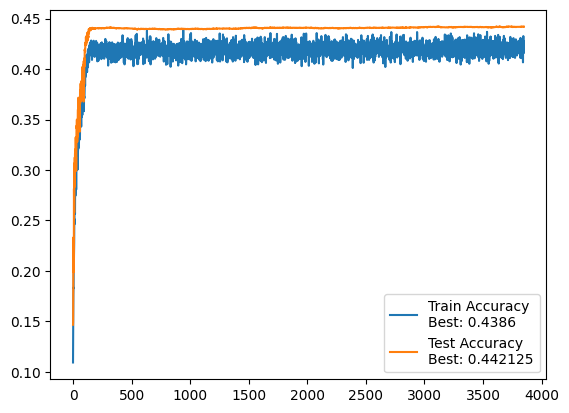

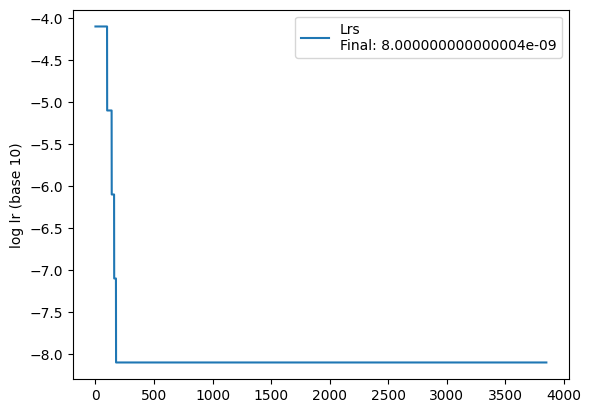


 =============== Epoch 3851 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.2%, Avg loss: 1.552558, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.511680

 =============== Epoch 3852 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.555304, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.2%, Avg loss: 1.511676

 =============== Epoch 3853 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.4%, Avg loss: 1.548748, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.511683

 =============== Epoch 3854 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.549057, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.77it/s]


 Test accuracy: 44.2%, Avg loss: 1.511688

 =============== Epoch 3855 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.549554, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.511696

 =============== Epoch 3856 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 40.8%, Avg loss: 1.555518, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.2%, Avg loss: 1.511684

 =============== Epoch 3857 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.0%, Avg loss: 1.559559, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.511699

 =============== Epoch 3858 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.9%, Avg loss: 1.581506, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.511710

 =============== Epoch 3859 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.2%, Avg loss: 1.569575, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.511705

 =============== Epoch 3860 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.6%, Avg loss: 1.542121, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.511700

 =============== Epoch 3861 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.5%, Avg loss: 1.542691, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


 Test accuracy: 44.2%, Avg loss: 1.511705

 =============== Epoch 3862 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.552421, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.2%, Avg loss: 1.511705

 =============== Epoch 3863 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.544496, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.511697

 =============== Epoch 3864 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 41.4%, Avg loss: 1.570104, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.511695

 =============== Epoch 3865 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.6%, Avg loss: 1.551978, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.511675

 =============== Epoch 3866 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.549262, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.511688

 =============== Epoch 3867 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.552906, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.1%, Avg loss: 1.511694

 =============== Epoch 3868 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.1%, Avg loss: 1.586905, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.1%, Avg loss: 1.511692

 =============== Epoch 3869 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.9%, Avg loss: 1.565821, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.1%, Avg loss: 1.511671

 =============== Epoch 3870 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.7%, Avg loss: 1.550198, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.511671

 =============== Epoch 3871 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.556813, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


 Test accuracy: 44.2%, Avg loss: 1.511668

 =============== Epoch 3872 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.556912, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.511662

 =============== Epoch 3873 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.8%, Avg loss: 1.573841, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.2%, Avg loss: 1.511662

 =============== Epoch 3874 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.541733, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.511644

 =============== Epoch 3875 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.560824, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.511650

 =============== Epoch 3876 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.5%, Avg loss: 1.535133, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.59it/s]


 Test accuracy: 44.2%, Avg loss: 1.511651

 =============== Epoch 3877 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.5%, Avg loss: 1.543898, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.511656

 =============== Epoch 3878 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.8%, Avg loss: 1.560882, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.2%, Avg loss: 1.511650

 =============== Epoch 3879 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.552554, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.511646

 =============== Epoch 3880 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 40.9%, Avg loss: 1.569794, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.511651

 =============== Epoch 3881 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.542098, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.511652

 =============== Epoch 3882 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.560098, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.2%, Avg loss: 1.511652

 =============== Epoch 3883 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.9%, Avg loss: 1.557149, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.511655

 =============== Epoch 3884 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 43.0%, Avg loss: 1.522537, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.511659

 =============== Epoch 3885 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 40.8%, Avg loss: 1.559579, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.511666

 =============== Epoch 3886 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.555130, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.511663

 =============== Epoch 3887 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.546367, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.511672

 =============== Epoch 3888 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 43.1%, Avg loss: 1.554987, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.511669

 =============== Epoch 3889 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.6%, Avg loss: 1.562185, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


 Test accuracy: 44.2%, Avg loss: 1.511666

 =============== Epoch 3890 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 40.3%, Avg loss: 1.547650, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.511667

 =============== Epoch 3891 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.2%, Avg loss: 1.560451, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.511657

 =============== Epoch 3892 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.6%, Avg loss: 1.542714, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.511667

 =============== Epoch 3893 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 40.9%, Avg loss: 1.561146, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.511679

 =============== Epoch 3894 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.0%, Avg loss: 1.581359, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.511676

 =============== Epoch 3895 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.7%, Avg loss: 1.551622, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.511661

 =============== Epoch 3896 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.565768, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.2%, Avg loss: 1.511654

 =============== Epoch 3897 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.537601, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.511643

 =============== Epoch 3898 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.546028, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.511647

 =============== Epoch 3899 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.1%, Avg loss: 1.587385, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


 Test accuracy: 44.2%, Avg loss: 1.511646

 =============== Epoch 3900 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.2%, Avg loss: 1.561804, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.2%, Avg loss: 1.511647


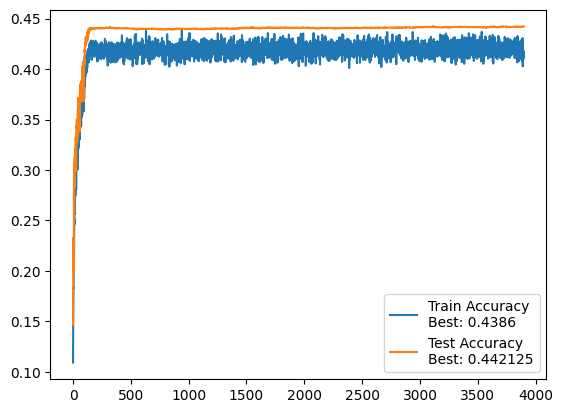

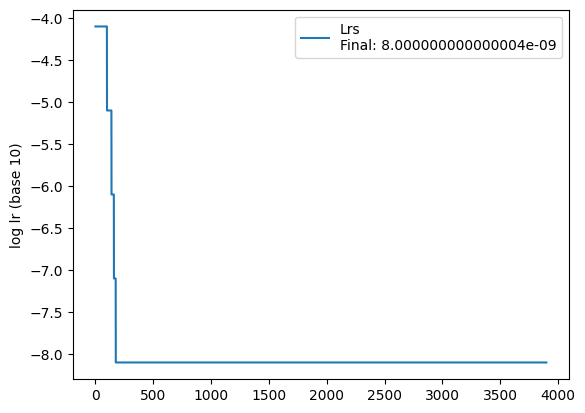


 =============== Epoch 3901 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.3%, Avg loss: 1.537733, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.80it/s]


 Test accuracy: 44.2%, Avg loss: 1.511645

 =============== Epoch 3902 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.577331, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.511640

 =============== Epoch 3903 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.563460, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.511639

 =============== Epoch 3904 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.547816, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.511655

 =============== Epoch 3905 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.3%, Avg loss: 1.578106, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.511649

 =============== Epoch 3906 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.545431, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.511658

 =============== Epoch 3907 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.539995, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.511648

 =============== Epoch 3908 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.1%, Avg loss: 1.548876, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.2%, Avg loss: 1.511641

 =============== Epoch 3909 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.7%, Avg loss: 1.554826, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.511640

 =============== Epoch 3910 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.550396, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.511638

 =============== Epoch 3911 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.559745, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.2%, Avg loss: 1.511636

 =============== Epoch 3912 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.579165, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.2%, Avg loss: 1.511634

 =============== Epoch 3913 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.0%, Avg loss: 1.573932, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.2%, Avg loss: 1.511618

 =============== Epoch 3914 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.561330, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.2%, Avg loss: 1.511616

 =============== Epoch 3915 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.5%, Avg loss: 1.557819, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.511626

 =============== Epoch 3916 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.0%, Avg loss: 1.557395, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.511622

 =============== Epoch 3917 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.2%, Avg loss: 1.550729, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.511624

 =============== Epoch 3918 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.559696, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.60it/s]


 Test accuracy: 44.1%, Avg loss: 1.511636

 =============== Epoch 3919 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.0%, Avg loss: 1.559612, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.511648

 =============== Epoch 3920 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.6%, Avg loss: 1.568523, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.511652

 =============== Epoch 3921 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.3%, Avg loss: 1.578511, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.1%, Avg loss: 1.511646

 =============== Epoch 3922 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.554228, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.1%, Avg loss: 1.511649

 =============== Epoch 3923 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.5%, Avg loss: 1.543559, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.511657

 =============== Epoch 3924 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.551077, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.511660

 =============== Epoch 3925 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.551369, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.79it/s]


 Test accuracy: 44.1%, Avg loss: 1.511658

 =============== Epoch 3926 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.1%, Avg loss: 1.558397, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.2%, Avg loss: 1.511657

 =============== Epoch 3927 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.564943, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.511644

 =============== Epoch 3928 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.4%, Avg loss: 1.553969, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.2%, Avg loss: 1.511639

 =============== Epoch 3929 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.2%, Avg loss: 1.556787, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.511631

 =============== Epoch 3930 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.567102, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.511635

 =============== Epoch 3931 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.8%, Avg loss: 1.548654, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


 Test accuracy: 44.2%, Avg loss: 1.511620

 =============== Epoch 3932 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 41.6%, Avg loss: 1.556993, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.2%, Avg loss: 1.511627

 =============== Epoch 3933 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.543522, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.511624

 =============== Epoch 3934 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.6%, Avg loss: 1.553392, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.2%, Avg loss: 1.511617

 =============== Epoch 3935 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.563904, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.511620

 =============== Epoch 3936 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.565175, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


 Test accuracy: 44.2%, Avg loss: 1.511609

 =============== Epoch 3937 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.6%, Avg loss: 1.558398, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.1%, Avg loss: 1.511602

 =============== Epoch 3938 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.549226, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.60it/s]


 Test accuracy: 44.1%, Avg loss: 1.511602

 =============== Epoch 3939 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.560679, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.511603

 =============== Epoch 3940 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.541197, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.511591

 =============== Epoch 3941 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.556601, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.59it/s]


 Test accuracy: 44.2%, Avg loss: 1.511593

 =============== Epoch 3942 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.9%, Avg loss: 1.542318, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.511592

 =============== Epoch 3943 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.544310, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.511600

 =============== Epoch 3944 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.4%, Avg loss: 1.544895, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.2%, Avg loss: 1.511607

 =============== Epoch 3945 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.5%, Avg loss: 1.558898, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.511606

 =============== Epoch 3946 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 43.0%, Avg loss: 1.543538, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.56it/s]


 Test accuracy: 44.2%, Avg loss: 1.511600

 =============== Epoch 3947 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.9%, Avg loss: 1.569028, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.511606

 =============== Epoch 3948 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.5%, Avg loss: 1.573422, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.82it/s]


 Test accuracy: 44.2%, Avg loss: 1.511606

 =============== Epoch 3949 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.3%, Avg loss: 1.564141, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.2%, Avg loss: 1.511602

 =============== Epoch 3950 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 43.2%, Avg loss: 1.547148, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.60it/s]


 Test accuracy: 44.2%, Avg loss: 1.511607


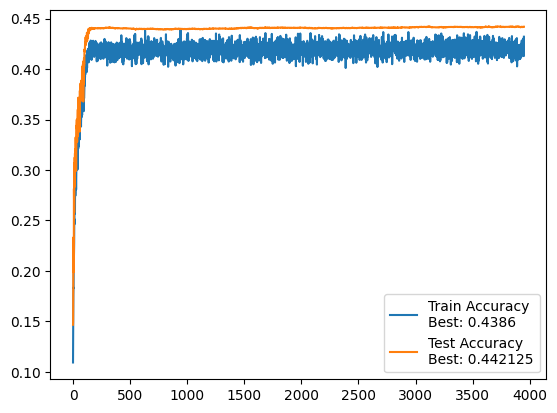

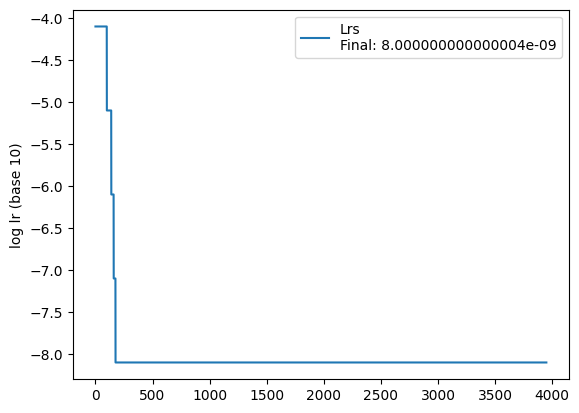


 =============== Epoch 3951 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.4%, Avg loss: 1.539521, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.511601

 =============== Epoch 3952 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.3%, Avg loss: 1.559031, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.511596

 =============== Epoch 3953 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.561942, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.511600

 =============== Epoch 3954 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.5%, Avg loss: 1.543343, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.511606

 =============== Epoch 3955 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.7%, Avg loss: 1.544132, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.2%, Avg loss: 1.511601

 =============== Epoch 3956 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.7%, Avg loss: 1.560498, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


 Test accuracy: 44.2%, Avg loss: 1.511602

 =============== Epoch 3957 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.0%, Avg loss: 1.550276, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.511596

 =============== Epoch 3958 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.563847, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.511591

 =============== Epoch 3959 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.9%, Avg loss: 1.546605, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.62it/s]


 Test accuracy: 44.2%, Avg loss: 1.511612

 =============== Epoch 3960 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.562410, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


 Test accuracy: 44.2%, Avg loss: 1.511616

 =============== Epoch 3961 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.538994, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.2%, Avg loss: 1.511614

 =============== Epoch 3962 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.3%, Avg loss: 1.537466, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.511612

 =============== Epoch 3963 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.3%, Avg loss: 1.546403, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.511618

 =============== Epoch 3964 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.8%, Avg loss: 1.575238, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.511604

 =============== Epoch 3965 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.3%, Avg loss: 1.572090, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.2%, Avg loss: 1.511600

 =============== Epoch 3966 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.1%, Avg loss: 1.555439, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.511611

 =============== Epoch 3967 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 41.8%, Avg loss: 1.571175, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.511636

 =============== Epoch 3968 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 41.8%, Avg loss: 1.535725, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.2%, Avg loss: 1.511653

 =============== Epoch 3969 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.1%, Avg loss: 1.561480, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.59it/s]


 Test accuracy: 44.2%, Avg loss: 1.511656

 =============== Epoch 3970 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.4%, Avg loss: 1.572095, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.2%, Avg loss: 1.511662

 =============== Epoch 3971 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 40.9%, Avg loss: 1.550119, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


 Test accuracy: 44.2%, Avg loss: 1.511669

 =============== Epoch 3972 ===============


100%|██████████| 40/40 [00:17<00:00,  2.33it/s]


 Train accuracy: 43.0%, Avg loss: 1.534465, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.72it/s]


 Test accuracy: 44.2%, Avg loss: 1.511669

 =============== Epoch 3973 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.9%, Avg loss: 1.535129, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.511677

 =============== Epoch 3974 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 40.8%, Avg loss: 1.567919, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.2%, Avg loss: 1.511683

 =============== Epoch 3975 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.553208, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.57it/s]


 Test accuracy: 44.2%, Avg loss: 1.511684

 =============== Epoch 3976 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.7%, Avg loss: 1.534071, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.75it/s]


 Test accuracy: 44.2%, Avg loss: 1.511678

 =============== Epoch 3977 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 43.1%, Avg loss: 1.532890, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.511677

 =============== Epoch 3978 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.1%, Avg loss: 1.553884, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.511677

 =============== Epoch 3979 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.1%, Avg loss: 1.550142, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


 Test accuracy: 44.2%, Avg loss: 1.511674

 =============== Epoch 3980 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 42.2%, Avg loss: 1.549936, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.65it/s]


 Test accuracy: 44.2%, Avg loss: 1.511667

 =============== Epoch 3981 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 43.0%, Avg loss: 1.548559, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.78it/s]


 Test accuracy: 44.2%, Avg loss: 1.511668

 =============== Epoch 3982 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 40.9%, Avg loss: 1.568009, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.76it/s]


 Test accuracy: 44.2%, Avg loss: 1.511682

 =============== Epoch 3983 ===============


100%|██████████| 40/40 [00:16<00:00,  2.37it/s]


 Train accuracy: 42.7%, Avg loss: 1.558005, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.2%, Avg loss: 1.511692

 =============== Epoch 3984 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 42.5%, Avg loss: 1.545726, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.55it/s]


 Test accuracy: 44.2%, Avg loss: 1.511683

 =============== Epoch 3985 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.7%, Avg loss: 1.544223, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.511681

 =============== Epoch 3986 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.2%, Avg loss: 1.562987, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.74it/s]


 Test accuracy: 44.2%, Avg loss: 1.511690

 =============== Epoch 3987 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.5%, Avg loss: 1.553300, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.511692

 =============== Epoch 3988 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.4%, Avg loss: 1.553124, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.59it/s]


 Test accuracy: 44.2%, Avg loss: 1.511682

 =============== Epoch 3989 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.2%, Avg loss: 1.574174, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:05<00:00, 12.59it/s]


 Test accuracy: 44.2%, Avg loss: 1.511674

 =============== Epoch 3990 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.0%, Avg loss: 1.557458, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.63it/s]


 Test accuracy: 44.2%, Avg loss: 1.511677

 =============== Epoch 3991 ===============


100%|██████████| 40/40 [00:17<00:00,  2.32it/s]


 Train accuracy: 41.8%, Avg loss: 1.568629, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.71it/s]


 Test accuracy: 44.2%, Avg loss: 1.511680

 =============== Epoch 3992 ===============


100%|██████████| 40/40 [00:16<00:00,  2.35it/s]


 Train accuracy: 41.4%, Avg loss: 1.545818, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.66it/s]


 Test accuracy: 44.2%, Avg loss: 1.511665

 =============== Epoch 3993 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.1%, Avg loss: 1.561142, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.2%, Avg loss: 1.511663

 =============== Epoch 3994 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 43.0%, Avg loss: 1.546751, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.61it/s]


 Test accuracy: 44.2%, Avg loss: 1.511674

 =============== Epoch 3995 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.8%, Avg loss: 1.553368, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.69it/s]


 Test accuracy: 44.2%, Avg loss: 1.511679

 =============== Epoch 3996 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 42.0%, Avg loss: 1.555385, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.73it/s]


 Test accuracy: 44.2%, Avg loss: 1.511674

 =============== Epoch 3997 ===============


100%|██████████| 40/40 [00:16<00:00,  2.36it/s]


 Train accuracy: 42.5%, Avg loss: 1.541983, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.70it/s]


 Test accuracy: 44.2%, Avg loss: 1.511671

 =============== Epoch 3998 ===============


100%|██████████| 40/40 [00:17<00:00,  2.34it/s]


 Train accuracy: 41.2%, Avg loss: 1.565578, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.67it/s]


 Test accuracy: 44.2%, Avg loss: 1.511668

 =============== Epoch 3999 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.4%, Avg loss: 1.570445, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.64it/s]


 Test accuracy: 44.2%, Avg loss: 1.511662

 =============== Epoch 4000 ===============


100%|██████████| 40/40 [00:17<00:00,  2.35it/s]


 Train accuracy: 41.9%, Avg loss: 1.563710, lr: 8.000000000000004e-09


100%|██████████| 63/63 [00:04<00:00, 12.68it/s]


 Test accuracy: 44.2%, Avg loss: 1.511667


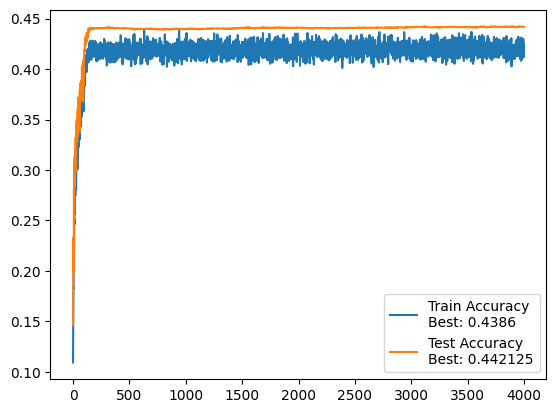

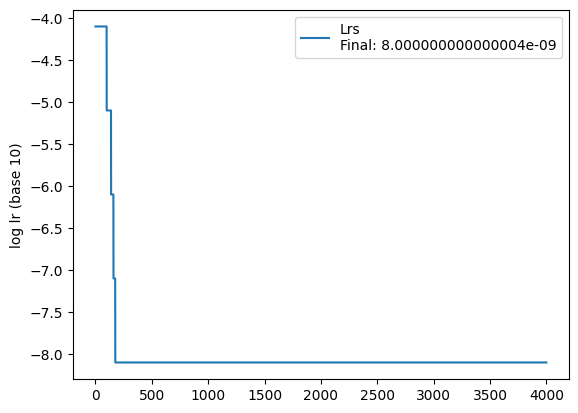

In [ ]:
for i in range(NUM_EPOCHS//NUM_EPOCHS_TO_SAVE):
    train_(epochs=NUM_EPOCHS_TO_SAVE)
    STORE_PATH = save(os.path.join(str(TRAIN_ID), f'{epoch}'))
    plot(STORE_PATH)

## Test and Outputs

In [ ]:
val_loss, val_accuracy = test(val_loader, model, loss_fn)

100%|██████████| 63/63 [00:05<00:00, 11.37it/s]

 Test accuracy: 44.2%, Avg loss: 1.511667


In [ ]:
val_transform = transforms.ToTensor()

In [ ]:
import pandas as pd
import torchvision

PATH_ROOT = "data"
PATH_LIST = os.path.join(PATH_ROOT,"test_list.txt")
PATH_TEST = os.path.join(PATH_ROOT,"test")

output = pd.DataFrame(columns=['id','label'])

model.eval()

with torch.no_grad():
    with open(PATH_LIST) as f:
        queries = f.read().splitlines()
        for query in tqdm(queries):
            img = torchvision.io.read_image(os.path.join(PATH_TEST, query))
            img = img/256
            #plt.imshow(np.transpose(img.numpy(), axes=[1,2,0]))
            img = img.float().to(device)
            img = img.expand(size=[1,-1,-1,-1])
            #img = val_transform(img)
            pred = model(img)
            pred = pred.argmax(1)[0]
            pred = pred.cpu().detach().numpy()
            pred = val_data.classes[pred]
            output = pd.concat((output, pd.DataFrame([[query, pred]], columns=['id','label'])), join='inner', axis=0, ignore_index=True)

#plt.show()

FileNotFoundError: [Errno 2] No such file or directory: 'data\\test_list.txt'

In [ ]:
output.to_csv(f"{STORE_PATH[:-3]}_submission.csv", index=False)

## Ideas for Improvements

1. Normalize the inputs.
2. Perform masking on the inputs.
3. Perform random resized crops on the inputs.
4. Migrate data augmentations to GPU.